In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
%matplotlib inline

#Data Analyzes
A kapott .csv fájlokon végzek különböző elemzéseket, kimutatásokat csinálok.
A pandas, a mathplotlib, a seaborn és a numpy Phyton könyvtárakat fogom használni.

##Ligue 1

###.csv file beolvasása és utótisztítása

In [158]:
L1=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/Ligue1_vegleges.csv")

In [159]:
del L1["Unnamed: 0"]

In [160]:
pd.isnull(L1).sum()

Player                   0
Nation                   5
Pos                      1
Age                      0
MP                       0
Starts                   0
Min                    519
90s                    514
Gls                    514
Ast                    514
G+A                    514
G-PK                   514
Penalty_Kicks_Made     514
PKatt                  514
CrdY                   514
CrdR                   514
xG                     518
npxG                   518
xAG                    518
npxG.1                 518
GA                    3217
SoTA                  3217
Saves                 3217
Save%                 3219
PK_Save%              3261
CS                    3217
CS%                   3222
Sh                     519
SoT                    519
SoT%                  1090
G/Sh                  1090
Dist                  1090
Cmp                    519
Att                    519
Cmp%                   538
TotDist                519
PrgDist                519
x

In [161]:
L1[pd.isnull(L1["Nation"])][["Player","Nation"]]

,Player,Nation
918,Guemissongui Ouattara,NaN
2066,Anthony Walongwa,NaN
2137,Amir Arli,NaN
2544,Anthony Walongwa,NaN
3135,Anthony Walongwa,NaN


In [162]:
L1=L1[L1["Player"]!="Guemissongui Ouattara"]
L1=L1[L1["Player"]!="Anthony Walongwa"]
L1=L1[L1["Player"]!="Amir Arli"]

In [163]:
pd.isnull(L1).sum()

Player                   0
Nation                   0
Pos                      0
Age                      0
MP                       0
Starts                   0
Min                    515
90s                    510
Gls                    510
Ast                    510
G+A                    510
G-PK                   510
Penalty_Kicks_Made     510
PKatt                  510
CrdY                   510
CrdR                   510
xG                     514
npxG                   514
xAG                    514
npxG.1                 514
GA                    3212
SoTA                  3212
Saves                 3212
Save%                 3214
PK_Save%              3256
CS                    3212
CS%                   3217
Sh                     515
SoT                    515
SoT%                  1086
G/Sh                  1086
Dist                  1086
Cmp                    515
Att                    515
Cmp%                   534
TotDist                515
PrgDist                515
x

In [164]:
L1=L1.fillna(0)

In [165]:
pd.isnull(L1).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [166]:
#A későbbi kimutatások miatt hozzáadtam 2 új oszlopot
L1["Player(Team)"]=L1["Player"]+ "(" + L1["Team"] + ")"
L1["Season(Player)"]=L1["Season"]+ "(" + L1["Player"] + ")"


In [167]:
L1.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Gianluigi Donnarumma,it ITA,GK,23.0,38,38,3409.0,37.9,0.0,0.0,...,12.0,4.0,7.0,1.0,87.5,2022-2023,Paris Saint Germain,Ligue 1,Gianluigi Donnarumma(Paris Saint Germain),2022-2023(Gianluigi Donnarumma)
1,Lionel Messi,ar ARG,"FW,MF",35.0,32,32,2837.0,31.5,16.0,16.0,...,0.0,0.0,1.0,3.0,25.0,2022-2023,Paris Saint Germain,Ligue 1,Lionel Messi(Paris Saint Germain),2022-2023(Lionel Messi)
2,Kylian Mbappé,fr FRA,FW,23.0,34,32,2818.0,31.3,29.0,5.0,...,6.0,0.0,8.0,5.0,61.5,2022-2023,Paris Saint Germain,Ligue 1,Kylian Mbappé(Paris Saint Germain),2022-2023(Kylian Mbappé)
3,Sergio Ramos,es ESP,DF,36.0,33,31,2704.0,30.0,2.0,1.0,...,93.0,3.0,55.0,34.0,61.8,2022-2023,Paris Saint Germain,Ligue 1,Sergio Ramos(Paris Saint Germain),2022-2023(Sergio Ramos)
4,Marquinhos,br BRA,DF,28.0,33,30,2717.0,30.2,2.0,0.0,...,83.0,2.0,35.0,27.0,56.5,2022-2023,Paris Saint Germain,Ligue 1,Marquinhos(Paris Saint Germain),2022-2023(Marquinhos)


In [168]:
L1.columns

Index(['Player', 'Nation', 'Pos', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'npxG.1', 'GA', 'SoTA', 'Saves', 'Save%',
       'PK_Save%', 'CS', 'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp',
       'Att', 'Cmp%', 'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl',
       'TklW', 'Tkl%', 'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%',
       'Season', 'Team', 'Competition', 'Player(Team)', 'Season(Player)'],
      dtype='object')

###2022-2023
####A 2022-2023-as szezon statisztikái, azok elemzése.



####A dataframe statisztikáinak elemzése, összehasonlítások, rangsorolások

In [169]:
L12023=L1[L1["Season"]=="2022-2023"]
L12023


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Gianluigi Donnarumma,it ITA,GK,23.0,38,38,3409.0,37.9,0.0,0.0,...,12.0,4.0,7.0,1.0,87.5,2022-2023,Paris Saint Germain,Ligue 1,Gianluigi Donnarumma(Paris Saint Germain),2022-2023(Gianluigi Donnarumma)
1,Lionel Messi,ar ARG,"FW,MF",35.0,32,32,2837.0,31.5,16.0,16.0,...,0.0,0.0,1.0,3.0,25.0,2022-2023,Paris Saint Germain,Ligue 1,Lionel Messi(Paris Saint Germain),2022-2023(Lionel Messi)
2,Kylian Mbappé,fr FRA,FW,23.0,34,32,2818.0,31.3,29.0,5.0,...,6.0,0.0,8.0,5.0,61.5,2022-2023,Paris Saint Germain,Ligue 1,Kylian Mbappé(Paris Saint Germain),2022-2023(Kylian Mbappé)
3,Sergio Ramos,es ESP,DF,36.0,33,31,2704.0,30.0,2.0,1.0,...,93.0,3.0,55.0,34.0,61.8,2022-2023,Paris Saint Germain,Ligue 1,Sergio Ramos(Paris Saint Germain),2022-2023(Sergio Ramos)
4,Marquinhos,br BRA,DF,28.0,33,30,2717.0,30.2,2.0,0.0,...,83.0,2.0,35.0,27.0,56.5,2022-2023,Paris Saint Germain,Ligue 1,Marquinhos(Paris Saint Germain),2022-2023(Marquinhos)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
711,Yassin Belkhdim,fr FRA,MF,20.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Angers,Ligue 1,Yassin Belkhdim(Angers),2022-2023(Yassin Belkhdim)
712,Théo Borne,fr FRA,GK,20.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Angers,Ligue 1,Théo Borne(Angers),2022-2023(Théo Borne)
713,Yacine Gaya,dz ALG,DF,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Angers,Ligue 1,Yacine Gaya(Angers),2022-2023(Yacine Gaya)
714,Noah Guede-Nadje,fr FRA,MF,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Angers,Ligue 1,Noah Guede-Nadje(Angers),2022-2023(Noah Guede-Nadje)


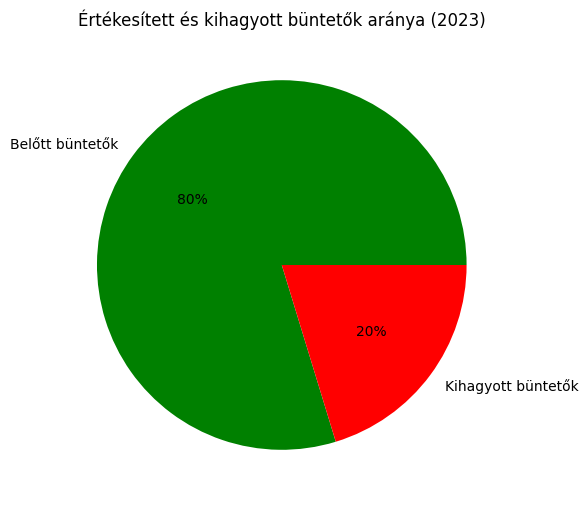

In [170]:
#Értékesített és kihagyott büntetők aránya
L1_Pen_Attempted_2023=L12023["PKatt"].sum()
L1_Pen_Scored_2023=L12023["Penalty_Kicks_Made"].sum()
L1_Pen_Missed_2023=L1_Pen_Attempted_2023-L1_Pen_Scored_2023

plt.figure(figsize=(13,6))
plt.title("Értékesített és kihagyott büntetők aránya (2023)")
data=[L1_Pen_Scored_2023,L1_Pen_Missed_2023]
colors=["green","red"]
labels=["Belőtt büntetők","Kihagyott büntetők"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()


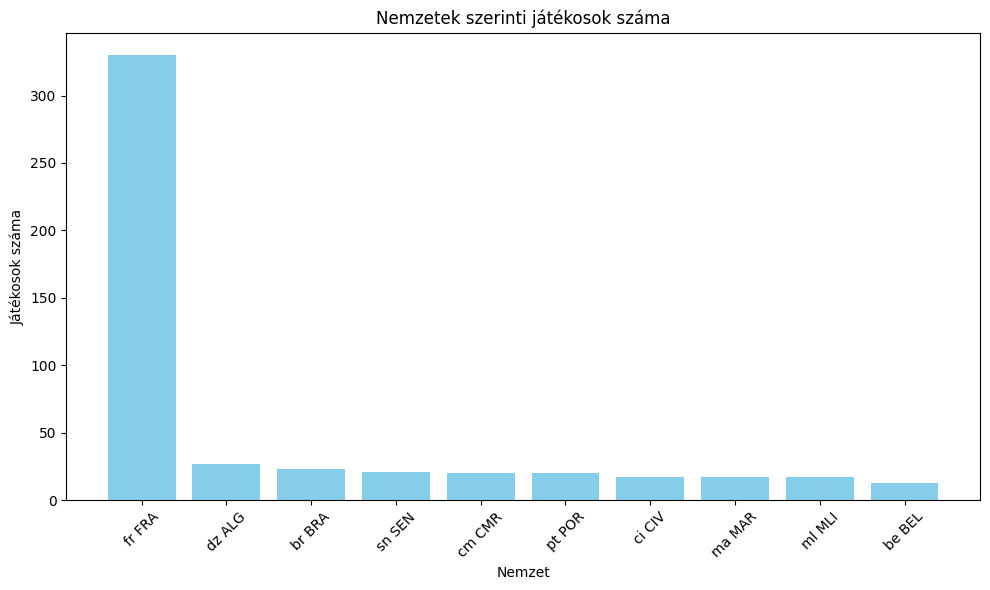

In [171]:
#Top 10 legtöbb játékost adó nemzet (2023)
jatekosok_szama = L12023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")

# Oszlopdiagram létrehozáL1
plt.figure(figsize=(10, 6))
plt.bar(top_10_nemzet['Nation'], top_10_nemzet['Játékosok száma'], color='skyblue')
plt.xlabel('Nemzet')
plt.ylabel('Játékosok száma')
plt.title('Nemzetek szerinti játékosok száma')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

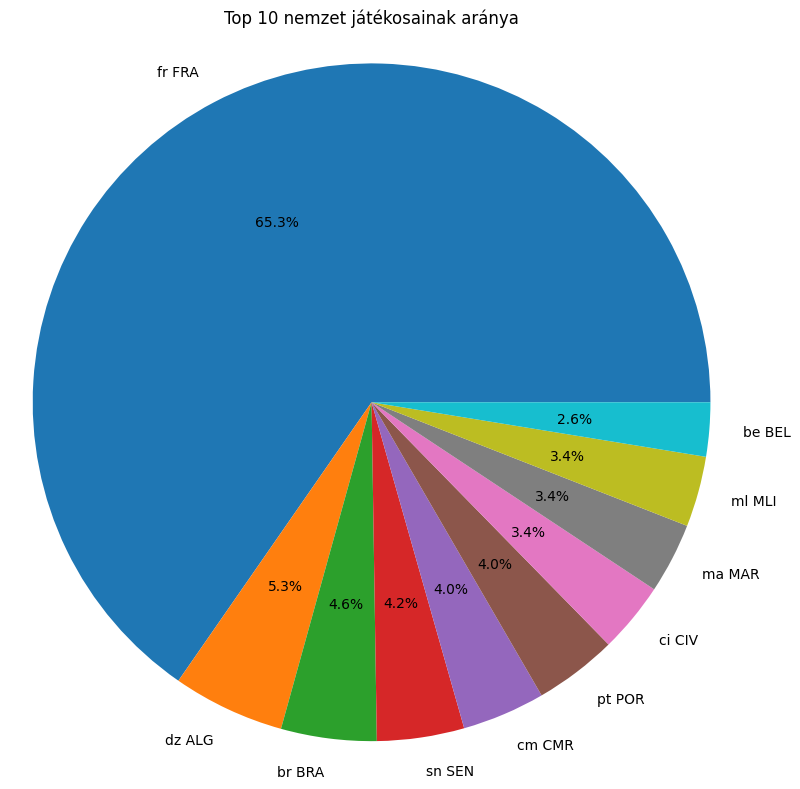

In [172]:
#Az előző kimutatás csak kördiagrammal
jatekosok_szama = L12023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")
plt.figure(figsize=(8, 8))
plt.pie(top_10_nemzet['Játékosok száma'], labels=top_10_nemzet['Nation'], autopct='%1.1f%%')
plt.title('Top 10 nemzet játékosainak aránya')
plt.axis('equal')
plt.tight_layout()
plt.show()


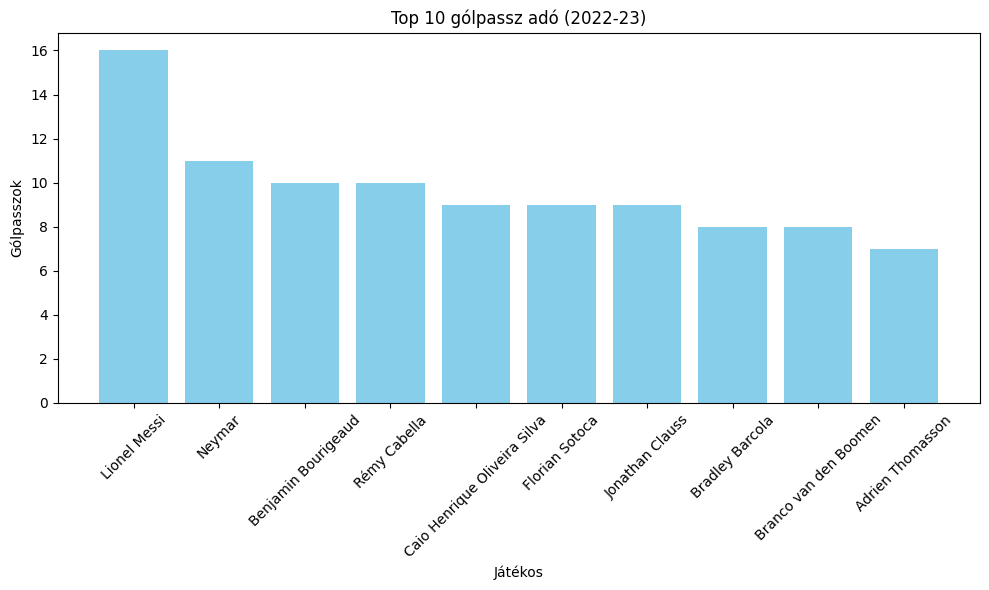

In [173]:
#Top 10 gólpassz adó
top_10_gólpassz_adó_2023_L1 = L12023.groupby('Player')["Ast"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_gólpassz_adó_2023_L1['Player'], top_10_gólpassz_adó_2023_L1['Ast'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


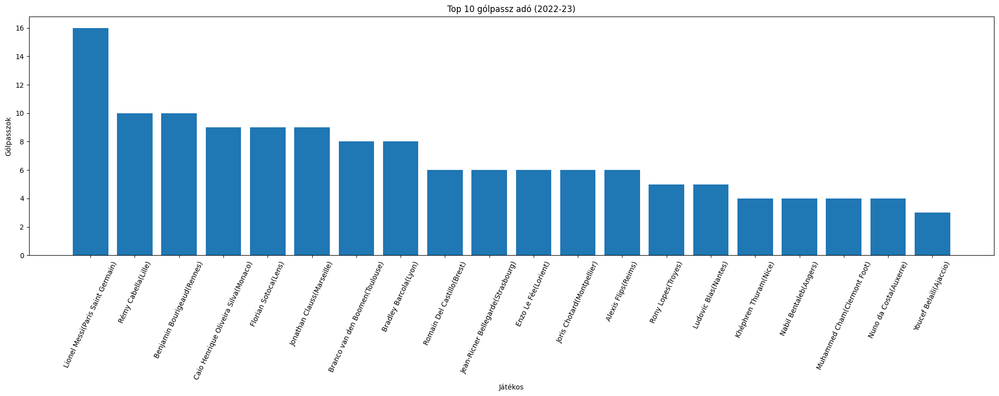

In [174]:
#Legjobb gólpassz adók csapatonként
legjobb_golpassz_adok_csapatonként = L12023.groupby('Team').apply(lambda x: x.nlargest(1, 'Ast')).reset_index(drop=True)
legjobb_golpassz_adok_csapatonként=legjobb_golpassz_adok_csapatonként.sort_values(by="Ast",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(legjobb_golpassz_adok_csapatonként['Player(Team)'], legjobb_golpassz_adok_csapatonként['Ast'])
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()


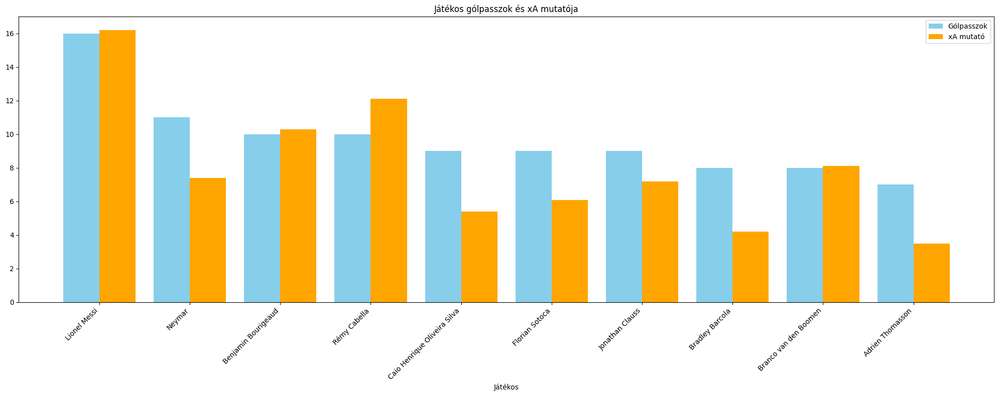

In [175]:
#Top 10 gólpasssz adó és hogy hány gólpasszuknak kellett volna lennie (xA)
gp_xA_2023_L1 = L12023.groupby('Player').agg({"Ast":'sum','xA':'sum'}).nlargest(10,'Ast').reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(20, 8))
bar_width = 0.4
index = range(len(gp_xA_2023_L1))
plt.bar(index, gp_xA_2023_L1['Ast'], bar_width, color='skyblue', label='Gólpasszok')
plt.bar([i + bar_width for i in index], gp_xA_2023_L1['xA'], bar_width, color='orange', label='xA mutató')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Játékos gólpasszok és xA mutatója')
plt.xticks([i + bar_width/2 for i in index], gp_xA_2023_L1['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


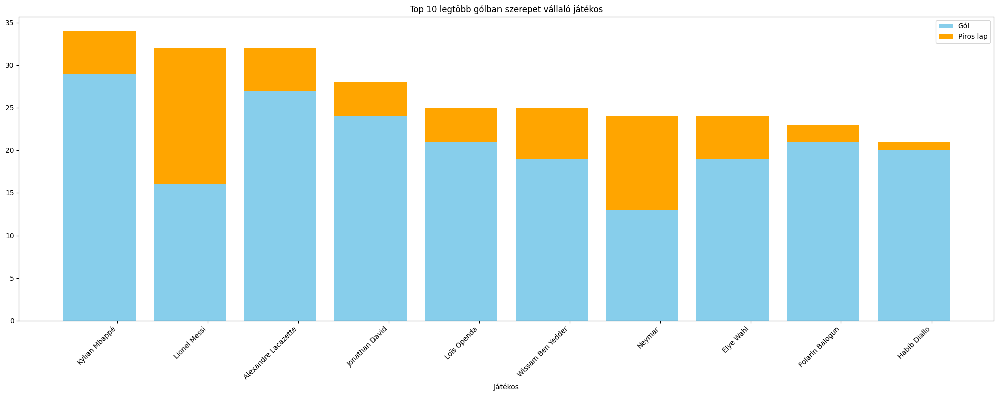

In [176]:
#Top 10 legtöbb gólban szerepet vállaló játékos
top10_ga_L12023=L12023.nlargest(10,"G+A")
top10_ga_L12023=top10_ga_L12023.sort_values(by="G+A",ascending=False)

plt.figure(figsize=(20, 8))
plt.bar(top10_ga_L12023["Player"], top10_ga_L12023['Gls'], color='skyblue', label='Gól')
plt.bar(top10_ga_L12023["Player"], top10_ga_L12023['Ast'], bottom=top10_ga_L12023['Gls'], color='orange', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb gólban szerepet vállaló játékos')
plt.xticks([i + bar_width/2 for i in index], top10_ga_L12023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


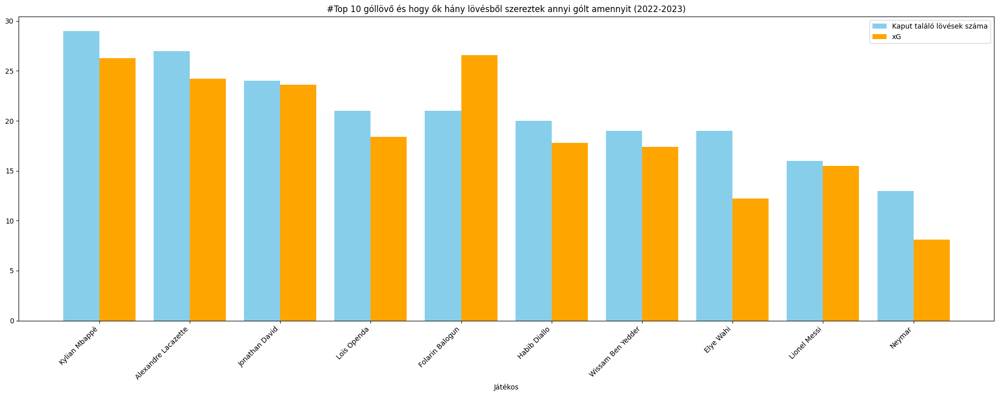

In [177]:
#Top 10 góllövő és hogy ők hány gólt kellett vna szerezniük (xG).
top10_scorer_L12023=L12023.nlargest(10,"Gls")
top10_scorer_L12023=top10_ga_L12023.sort_values(by="Gls",ascending=False)

plt.figure(figsize=(20, 8))
bar_width = 0.4
index = range(len(top10_scorer_L12023))
plt.bar(index, top10_scorer_L12023['Gls'], bar_width, color='skyblue', label='Kaput találó lövések száma')
plt.bar([i + bar_width for i in index], top10_scorer_L12023['xG'], bar_width, color='orange', label='xG')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_scorer_L12023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


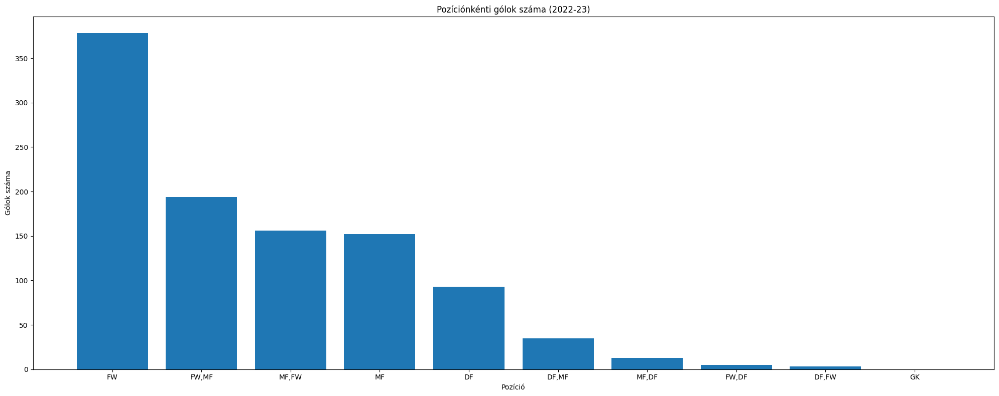

In [178]:
#Pozíciónkénti gólok száma
gls_per_pos_L12023=L12023.groupby('Pos')['Gls'].sum().reset_index()
gls_per_pos_L12023=gls_per_pos_L12023.sort_values(by="Gls",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(gls_per_pos_L12023['Pos'], gls_per_pos_L12023['Gls'])
plt.xlabel('Pozíció')
plt.ylabel('Gólok száma')
plt.title('Pozíciónkénti gólok száma (2022-23)')

plt.tight_layout()
plt.show()

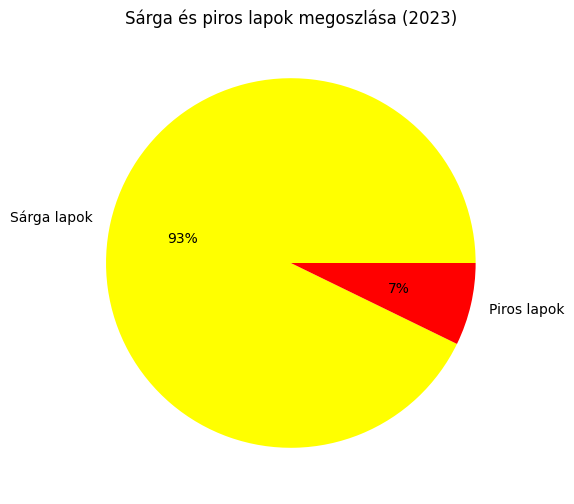

In [179]:
#Sárga és piros lapok megoszlása
yellow_L12023=L12023["CrdY"].sum()
red_L12023=L12023["CrdR"].sum()
plt.figure(figsize=(13,6))
plt.title("Sárga és piros lapok megoszlása (2023)")
data=[yellow_L12023,red_L12023]
colors=["yellow","red"]
labels=["Sárga lapok","Piros lapok"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()


<ipython-input-180-51561dded1fd>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  L12023["cardssum"]=L12023['CrdY']+L12023['CrdR']


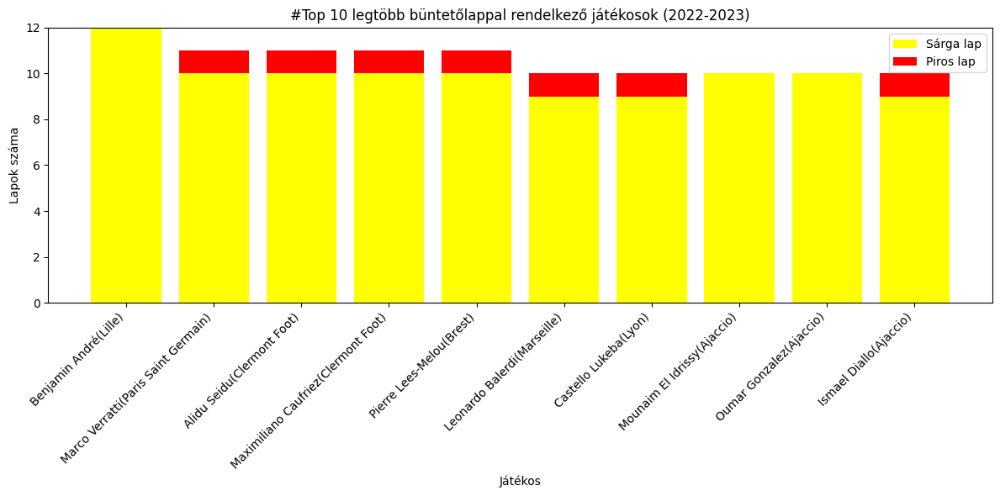

In [180]:
#Legtöbb büntetőlappal rendelkező játékosok
L12023["cardssum"]=L12023['CrdY']+L12023['CrdR']
top10_carded_L12023=L12023.nlargest(10,"cardssum")
top10_carded_L12023=top10_carded_L12023.sort_values(by="cardssum",ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(top10_carded_L12023["Player(Team)"], top10_carded_L12023['CrdY'], color='yellow', label='Sárga lap')
plt.bar(top10_carded_L12023["Player(Team)"], top10_carded_L12023['CrdR'], bottom=top10_carded_L12023['CrdY'], color='red', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('Lapok száma')
plt.title('#Top 10 legtöbb büntetőlappal rendelkező játékosok (2022-2023)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


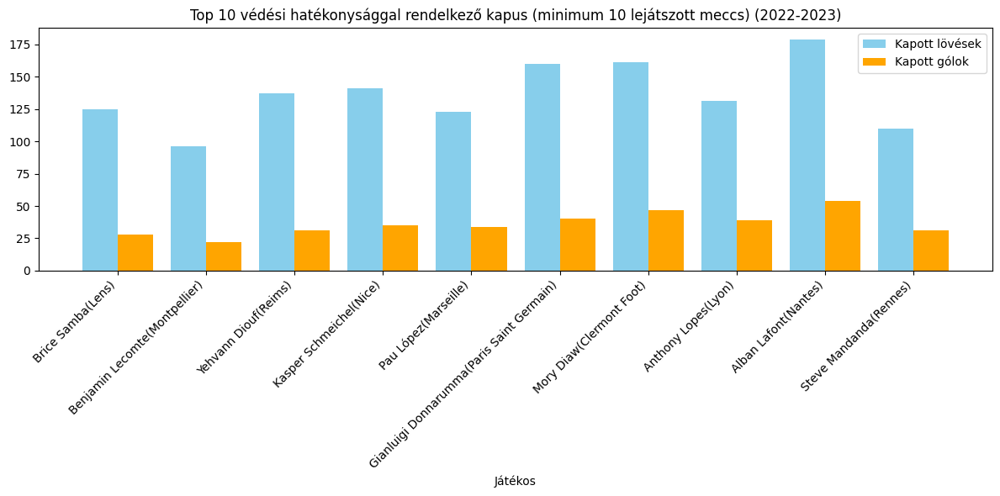

In [181]:
#Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_L12023=L12023[L12023["Pos"]=="GK"]
KeepertoCompare_L12023=Keepers_L12023[Keepers_L12023["MP"]>=10]
top10_savepercent_L12023=KeepertoCompare_L12023.nlargest(10,"Save%")
top10_savepercent_L12023=top10_savepercent_L12023.sort_values(by="Save%",ascending=False)

plt.figure(figsize=(12, 6))
bar_width = 0.4
index = range(len(top10_savepercent_L12023))
plt.bar(index, top10_savepercent_L12023['SoTA'], bar_width, color='skyblue', label='Kapott lövések')
plt.bar([i + bar_width for i in index], top10_savepercent_L12023['GA'], bar_width, color='orange', label='Kapott gólok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_savepercent_L12023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


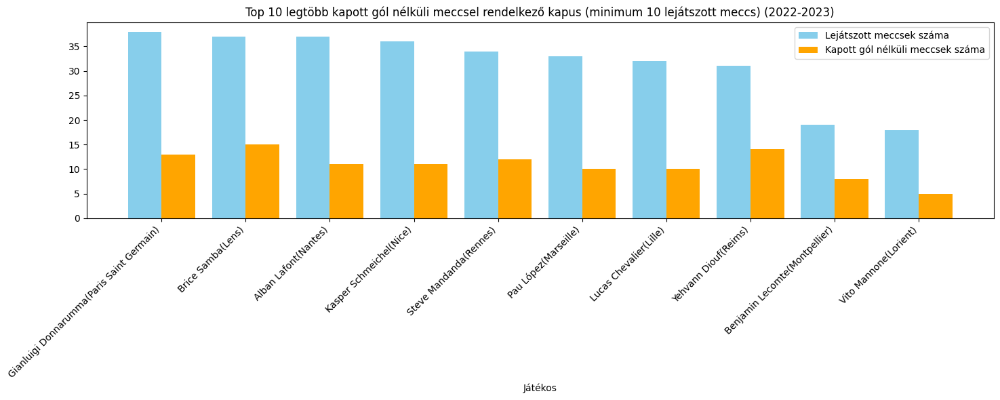

In [182]:
#Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_L12023=L12023[L12023["Pos"]=="GK"]
KeepertoCompare_L12023=Keepers_L12023[Keepers_L12023["MP"]>=10]
top10_cs_L12023=KeepertoCompare_L12023.nlargest(10,"CS%")
top10_cs_L12023=top10_cs_L12023.sort_values(by="MP",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_cs_L12023))
plt.bar(index, top10_cs_L12023['MP'], bar_width, color='skyblue', label='Lejátszott meccsek száma')
plt.bar([i + bar_width for i in index], top10_cs_L12023['CS'], bar_width, color='orange', label='Kapott gól nélküli meccsek száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_cs_L12023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


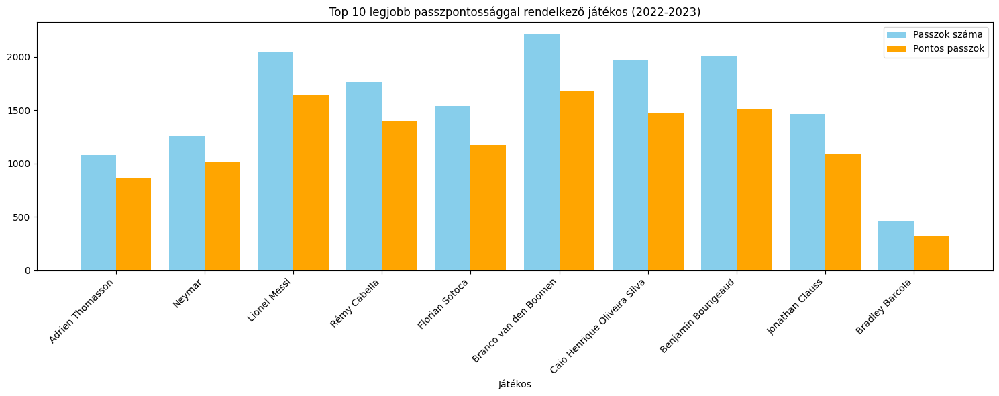

In [183]:
#Top 10 legjobb passzpontossággal rendelkező játékos
gp_pp_L12023 = L12023.groupby('Player').agg({"Ast":'sum','Att':'sum','Cmp':'sum','Cmp%':'sum'}).nlargest(10,'Ast').reset_index()
top10_pp_L12023=gp_pp_L12023.sort_values(by="Cmp%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_pp_L12023))
plt.bar(index, top10_pp_L12023['Att'], bar_width, color='skyblue', label='Passzok száma')
plt.bar([i + bar_width for i in index], top10_pp_L12023['Cmp'], bar_width, color='orange', label='Pontos passzok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_pp_L12023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-184-dcac93500fea>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  L12023["Tkl_Tkl%"]=L12023['TklW']/L12023['Tkl']*100


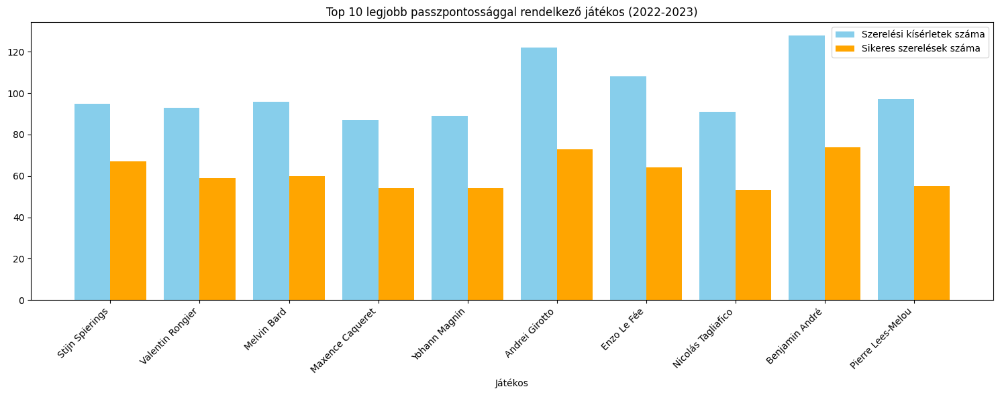

In [184]:
#Top 10 legjobban szerelő játékos
L12023["Tkl_Tkl%"]=L12023['TklW']/L12023['Tkl']*100
top10_tkl_L12023 = L12023.groupby('Player').agg({"Tkl":'sum','TklW':'sum','Tkl_Tkl%':'sum'}).nlargest(10,'TklW').reset_index()
top10_tkl_L12023 = top10_tkl_L12023.sort_values(by="Tkl_Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_tkl_L12023))
plt.bar(index, top10_tkl_L12023['Tkl'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_tkl_L12023['TklW'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_tkl_L12023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


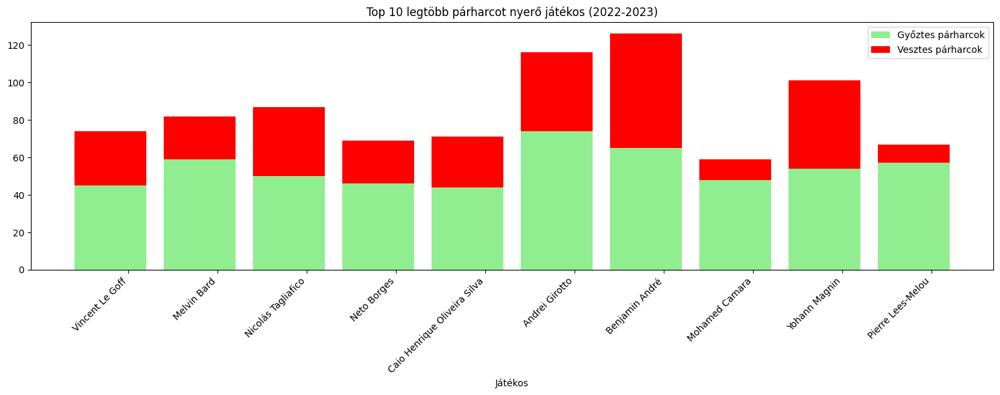

In [185]:
#Top 10 legtöbb párharcot nyerő játékos
top10_chl_L12023 = L12023.groupby('Player').agg({"Challenges_Tkl":'sum','Lost':'sum','Tkl%':'sum'}).nlargest(10,'Challenges_Tkl').reset_index()
top10_chl_L12023 = top10_chl_L12023.sort_values(by="Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_chl_L12023["Player"], top10_chl_L12023['Challenges_Tkl'], color='lightgreen', label='Győztes párharcok')
plt.bar(top10_chl_L12023["Player"], top10_chl_L12023['Lost'], bottom=top10_chl_L12023['Challenges_Tkl'], color='red', label='Vesztes párharcok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb párharcot nyerő játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_chl_L12023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()



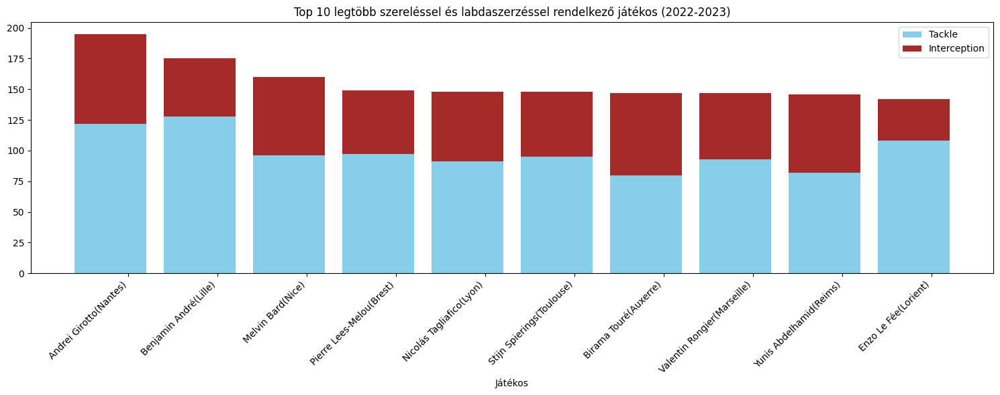

In [186]:
#'Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos
top10_TklInt_L12023 = L12023.groupby('Player(Team)').agg({"Tkl":'sum','Int':'sum','Tkl+Int':'sum'}).nlargest(10,'Tkl+Int').reset_index()
top10_TklInt_L12023 = top10_TklInt_L12023.sort_values(by="Tkl+Int",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_TklInt_L12023["Player(Team)"], top10_TklInt_L12023['Tkl'], color='skyblue', label='Tackle')
plt.bar(top10_TklInt_L12023["Player(Team)"], top10_TklInt_L12023['Int'], bottom=top10_TklInt_L12023['Tkl'], color='brown', label='Interception')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_TklInt_L12023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


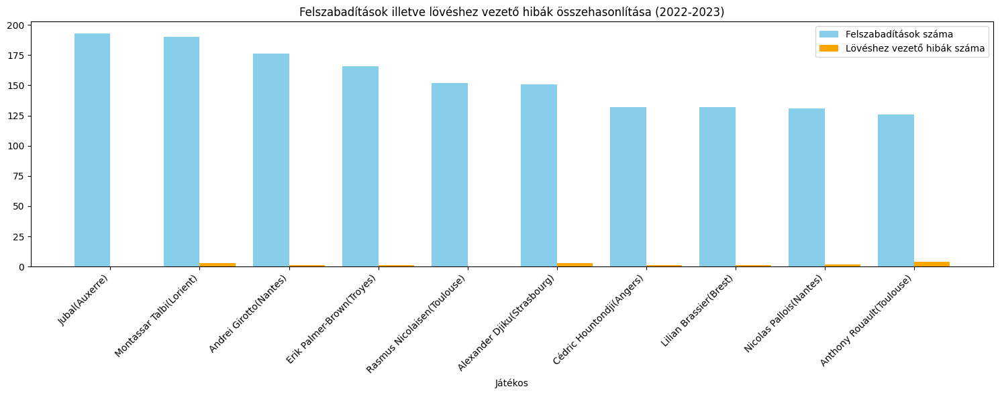

In [187]:
#Felszabadítások illetve lövéshez vezető hibák összehasonlítása
top10_clrerr_L12023 = L12023.groupby('Player(Team)').agg({"Clr":'sum','Err':'sum'}).nlargest(10,'Clr').reset_index()
top10_clrerr_L12023 = top10_clrerr_L12023.sort_values(by="Clr",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_clrerr_L12023))
plt.bar(index, top10_clrerr_L12023['Clr'], bar_width, color='skyblue', label='Felszabadítások száma')
plt.bar([i + bar_width for i in index], top10_clrerr_L12023['Err'], bar_width, color='orange', label='Lövéshez vezető hibák száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_clrerr_L12023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


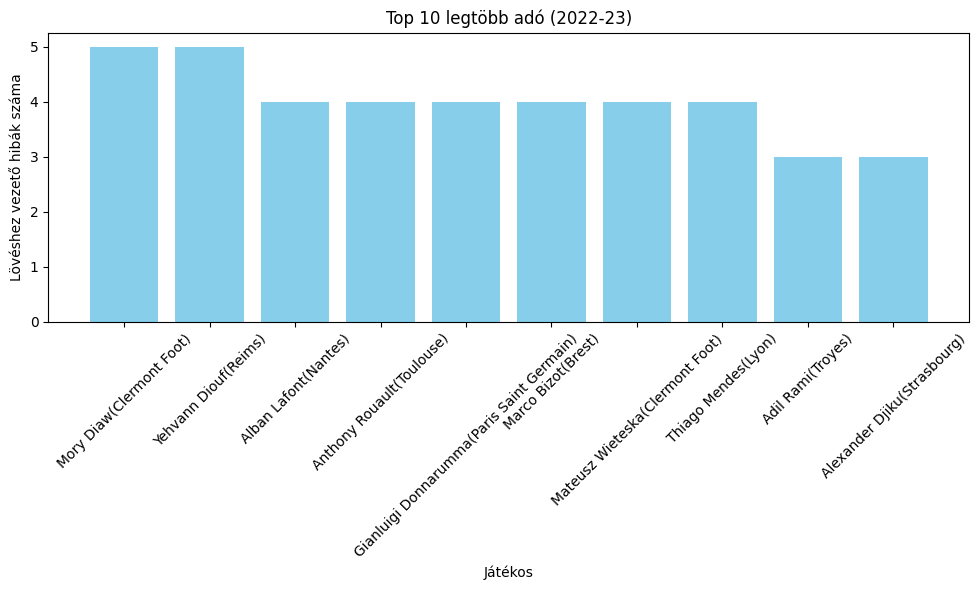

In [188]:
#Legtöbb lövéshez vezető hibát vétő játékosok
top_10_error_maker_L12023 = L12023.groupby('Player(Team)')["Err"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_error_maker_L12023['Player(Team)'], top_10_error_maker_L12023['Err'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Lövéshez vezető hibák száma')
plt.title('Top 10 legtöbb adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


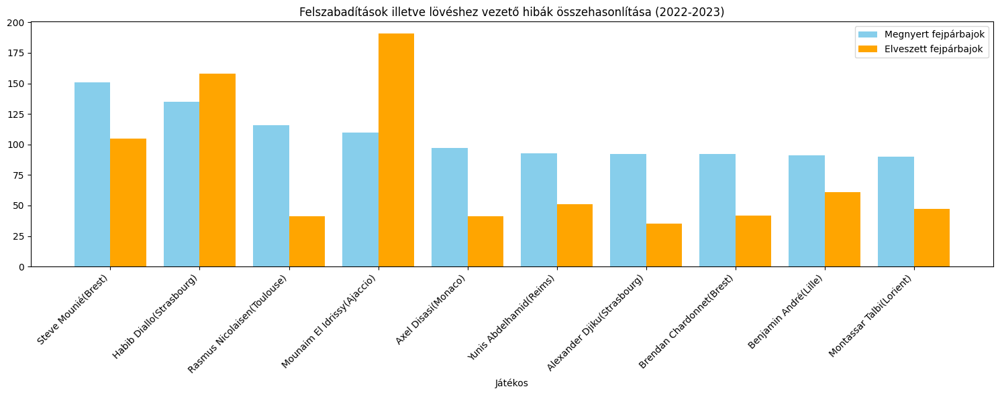

In [189]:
#Top 10 legtöbb fejpárbajt nyerő játékos

top10_airduel_L12023 = L12023.groupby('Player(Team)').agg({"Won":'sum','Lost':'sum'}).nlargest(10,'Won').reset_index()
top10_airduel_L12023 = top10_airduel_L12023.sort_values(by="Won",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_airduel_L12023))
plt.bar(index, top10_airduel_L12023['Won'], bar_width, color='skyblue', label='Megnyert fejpárbajok')
plt.bar([i + bar_width for i in index], top10_airduel_L12023['Lost'], bar_width, color='orange', label='Elveszett fejpárbajok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_airduel_L12023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


####Összefüggések keresése
Bizonoys játékosok statisztikái feltűnően gyengébbek az elvártnál, ezért meg szeretném vizsgálni, hogy ezen játékosok mélyrepülése hogyan hatott a csapatuk teljesítményére. Ehhez szükségem volt a bajnoki tabellára

In [190]:
L1_table=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/Ligue1_tables.csv")

In [191]:
L1_table

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Paris S-G,38,27,4,7,89,40,49,85,2022-2023,Ligue 1
1,1,2,Lens,38,25,9,4,68,29,39,84,2022-2023,Ligue 1
2,2,3,Marseille,38,22,7,9,67,40,27,73,2022-2023,Ligue 1
3,3,4,Rennes,38,21,5,12,69,39,30,68,2022-2023,Ligue 1
4,4,5,Lille,38,19,10,9,65,44,21,67,2022-2023,Ligue 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Toulouse,38,8,14,16,35,57,-22,38,2018-2019,Ligue 1
96,16,17,Monaco,38,8,12,18,38,57,-19,36,2018-2019,Ligue 1
97,17,18,Dijon,38,9,7,22,31,60,-29,34,2018-2019,Ligue 1
98,18,19,Caen,38,7,12,19,29,54,-25,33,2018-2019,Ligue 1


In [192]:
del L1_table["Unnamed: 0"]

In [193]:
L1_table

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Paris S-G,38,27,4,7,89,40,49,85,2022-2023,Ligue 1
1,2,Lens,38,25,9,4,68,29,39,84,2022-2023,Ligue 1
2,3,Marseille,38,22,7,9,67,40,27,73,2022-2023,Ligue 1
3,4,Rennes,38,21,5,12,69,39,30,68,2022-2023,Ligue 1
4,5,Lille,38,19,10,9,65,44,21,67,2022-2023,Ligue 1
...,...,...,...,...,...,...,...,...,...,...,...,...
95,16,Toulouse,38,8,14,16,35,57,-22,38,2018-2019,Ligue 1
96,17,Monaco,38,8,12,18,38,57,-19,36,2018-2019,Ligue 1
97,18,Dijon,38,9,7,22,31,60,-29,34,2018-2019,Ligue 1
98,19,Caen,38,7,12,19,29,54,-25,33,2018-2019,Ligue 1


#####Ligue 1 tabella 2022-2023

In [194]:
L1_table_2023=L1_table[L1_table["Season"]=="2022-2023"]
L1_table_2023


,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Paris S-G,38,27,4,7,89,40,49,85,2022-2023,Ligue 1
1,2,Lens,38,25,9,4,68,29,39,84,2022-2023,Ligue 1
2,3,Marseille,38,22,7,9,67,40,27,73,2022-2023,Ligue 1
3,4,Rennes,38,21,5,12,69,39,30,68,2022-2023,Ligue 1
4,5,Lille,38,19,10,9,65,44,21,67,2022-2023,Ligue 1
5,6,Monaco,38,19,8,11,70,58,12,65,2022-2023,Ligue 1
6,7,Lyon,38,18,8,12,65,47,18,62,2022-2023,Ligue 1
7,8,Clermont Foot,38,17,8,13,45,49,-4,59,2022-2023,Ligue 1
8,9,Nice,38,15,13,10,48,37,11,58,2022-2023,Ligue 1
9,10,Lorient,38,15,10,13,52,53,-1,55,2022-2023,Ligue 1


#####Az Lens szárnyalása

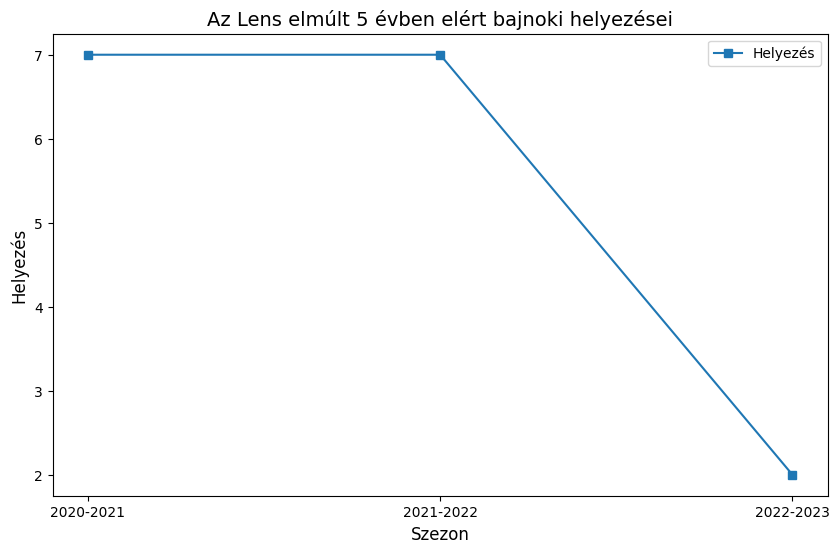

In [195]:
Lens=L1_table[L1_table["Squad"]=="Lens"]
Lens=Lens[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Lens["Season"])
ypoints = np.array(Lens["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Lens["Rk"], label='Helyezés', marker='s')

plt.title('Az Lens elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()


Mint az látható nagy meglepetésre az Lens a 2-ik, bajnokok ligája indulást jelentő helyen végzett a 2022-2023-as kiírásban, decára annak hogy ez volt csupán a harmadik szezonja a csapatnak az első osztályban és az előtte levő 2 szezonban egyaránt 7-ik helyen végeztek. Ez bravúr a javából. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

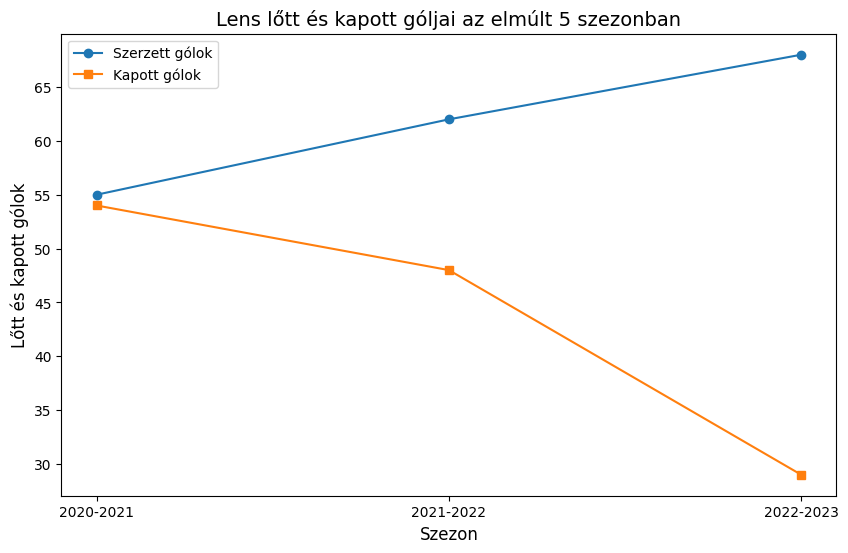

In [196]:
Lens=L1_table[L1_table["Squad"]=="Lens"]
Lens_gf_ga=Lens[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Lens_gf_ga["GF"])
ga = np.array(Lens_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gf, label='Szerzett gólok', marker='o')
plt.plot(xpoints, ga, label='Kapott gólok', marker='s')

plt.title('Lens lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)
plt.legend()
plt.show()


Az ábrából kitűnik, hogy a korábbi évekhez képest valamennyivel több gólt rúgtak viszont sokkal kevesebb gólt kaptak. Így itt inkább a védők és a középpályások teljesítményét elemeztem.

######Középpályások

In [197]:
Lens2022_2023=L12023[L12023["Team"]=="Lens"]
Lens2022_2023_df=Lens2022_2023[Lens2022_2023['Pos']=="MF"]
Lens2022_2023_df=Lens2022_2023_df[Lens2022_2023['Starts']>=12]
Lens2022_2023_df


<ipython-input-197-3934cdefb2df>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Lens2022_2023_df=Lens2022_2023_df[Lens2022_2023['Starts']>=12]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player),cardssum,Tkl_Tkl%
37,Seko Fofana,ci CIV,MF,27.0,35,34,3073.0,34.1,7.0,5.0,...,22.0,15.0,59.5,2022-2023,Lens,Ligue 1,Seko Fofana(Lens),2022-2023(Seko Fofana),2.0,46.428571
39,Salis Abdul Samed,gh GHA,MF,22.0,33,33,2894.0,32.2,1.0,1.0,...,14.0,17.0,45.2,2022-2023,Lens,Ligue 1,Salis Abdul Samed(Lens),2022-2023(Salis Abdul Samed),7.0,56.521739


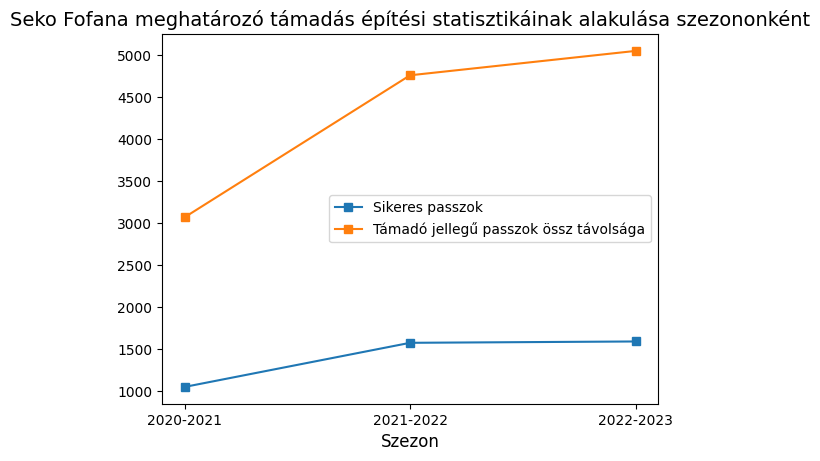

In [198]:
#Seko Fofana - támadás építés
Fofana=L1[L1["Player"]=="Seko Fofana"]
Fofana=Fofana[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Fofana["Cmp"])
PrgDist = np.array(Fofana["PrgDist"])

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Seko Fofana meghatározó támadás építési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

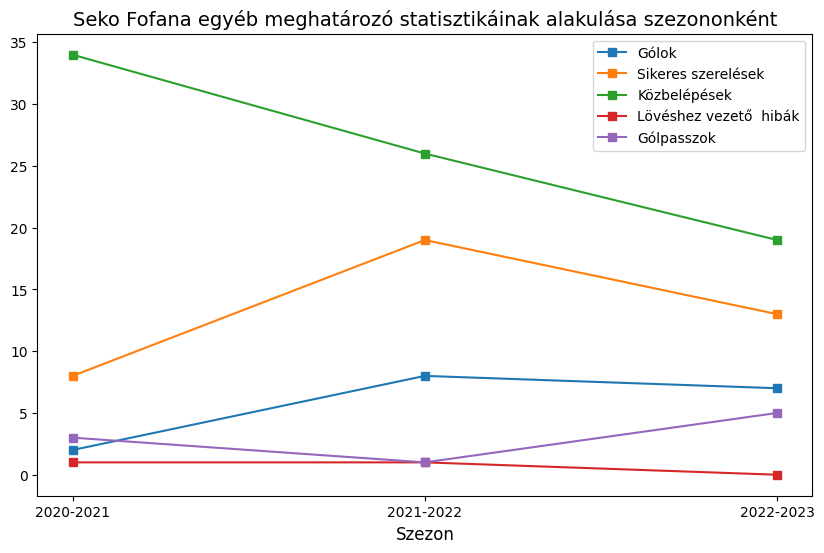

In [199]:
#Seko Fofana
Fofana=L1[L1["Player"]=="Seko Fofana"]
Fofana=Fofana[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Fofana["TklW"])
Int = np.array(Fofana["Int"])
Err= np.array(Fofana["Err"])
Ast = np.array(Fofana["Ast"])
Gls = np.array(Fofana["Gls"])


plt.figure(figsize=(10, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Seko Fofana egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

<ipython-input-200-fa373fa652a3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Salis.loc[len(Salis)] = {'Gls': 0, 'Ast':0,'Season': "2020-2021","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}


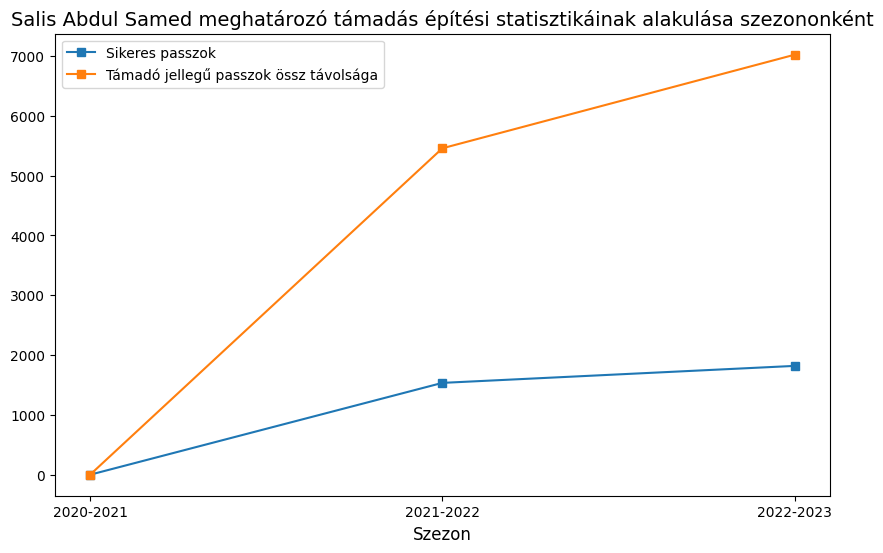

In [200]:
#Salis Abdul Samed - támadás építés
Salis=L1[L1["Player"]=="Salis Abdul Samed"]
Salis.loc[len(Salis)] = {'Gls': 0, 'Ast':0,'Season': "2020-2021","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}
Salis=Salis[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Salis["Cmp"])
PrgDist = np.array(Salis["PrgDist"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Salis Abdul Samed meghatározó támadás építési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


<ipython-input-201-498346afff02>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Salis.loc[len(Salis)] = {'Gls': 0, 'Ast':0,'Season': "2020-2021","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}


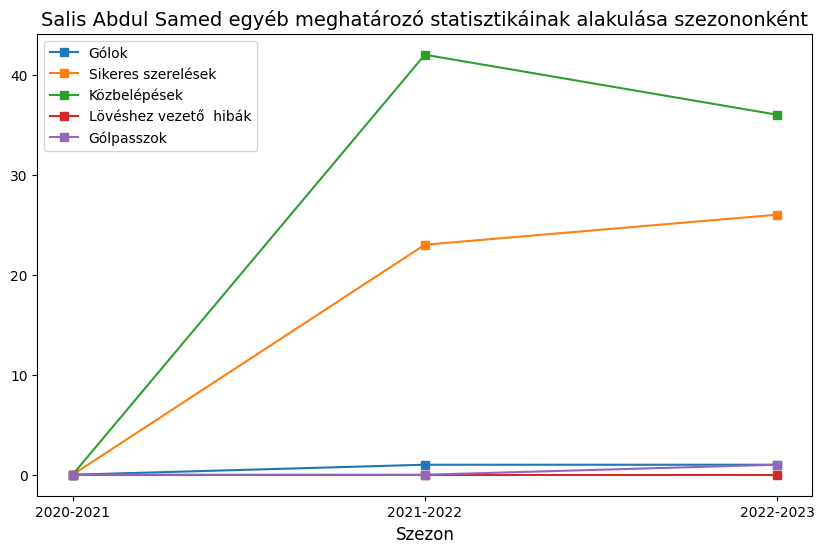

In [201]:
#Salis Abdul Samed - Egyéb statisztikák
Salis=L1[L1["Player"]=="Salis Abdul Samed"]
Salis.loc[len(Salis)] = {'Gls': 0, 'Ast':0,'Season': "2020-2021","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}
Salis=Salis[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Salis["TklW"])
Int = np.array(Salis["Int"])
Err= np.array(Salis["Err"])
Ast = np.array(Salis["Ast"])
Gls = np.array(Salis["Gls"])


plt.figure(figsize=(10, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Salis Abdul Samed egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

A Lens 2 ilyen stabilan jó teljesítményt hozó középpályással rendelkezett így volt egy szolid tengelye a csapatnak ami elengedhetetlen a sikerhez.

######Védők

In [202]:
Lens2022_2023=L12023[L12023["Team"]=="Lens"]
Lens2022_2023_df=Lens2022_2023[Lens2022_2023['Pos']=="DF"]
Lens2022_2023_df=Lens2022_2023_df[Lens2022_2023['Starts']>=12]
Lens2022_2023_df

<ipython-input-202-30ec6ee9cdc1>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Lens2022_2023_df=Lens2022_2023_df[Lens2022_2023['Starts']>=12]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player),cardssum,Tkl_Tkl%
36,Kevin Danso,at AUT,DF,23.0,37,37,3232.0,35.9,1.0,2.0,...,82.0,32.0,71.9,2022-2023,Lens,Ligue 1,Kevin Danso(Lens),2022-2023(Kevin Danso),8.0,51.351351
40,Jonathan Gradit,fr FRA,DF,29.0,33,33,2823.0,31.4,1.0,3.0,...,47.0,45.0,51.1,2022-2023,Lens,Ligue 1,Jonathan Gradit(Lens),2022-2023(Jonathan Gradit),7.0,64.516129
41,Facundo Medina,ar ARG,DF,23.0,32,32,2779.0,30.9,2.0,4.0,...,37.0,43.0,46.3,2022-2023,Lens,Ligue 1,Facundo Medina(Lens),2022-2023(Facundo Medina),7.0,64.516129


<ipython-input-203-789c889f1837>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Danso.loc[len(Danso)] = {'Clr': 0, 'TklW':0, "Int":0, "Challenges_Tkl":0, "Won":0, "Lost":0, "Err":0,'Season': "2020-2021"}


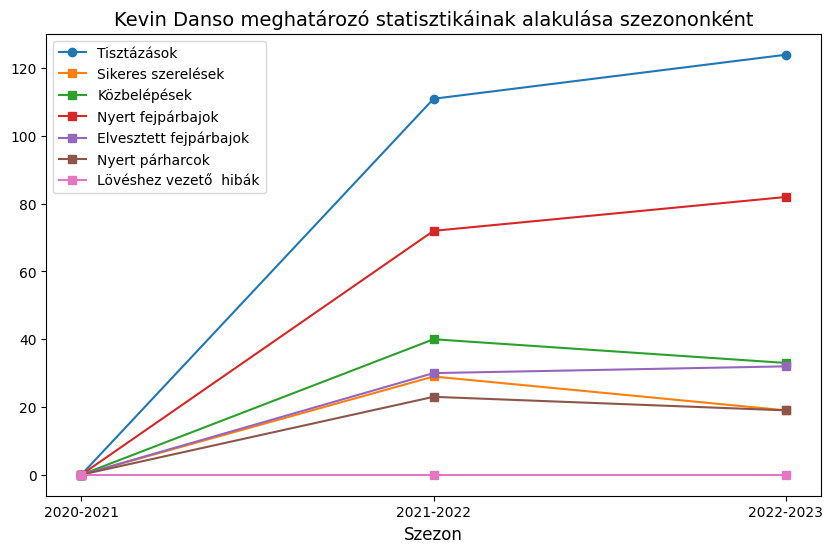

In [203]:
#Kevin Danso
Danso=L1[L1['Player']=="Kevin Danso"]
Danso.loc[len(Danso)] = {'Clr': 0, 'TklW':0, "Int":0, "Challenges_Tkl":0, "Won":0, "Lost":0, "Err":0,'Season': "2020-2021"}
Danso=Danso[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Danso["Clr"])
TklW = np.array(Danso["TklW"])
Int = np.array(Danso["Int"])
Challenges_Tkl=np.array(Danso["Challenges_Tkl"])
Won = np.array(Danso["Won"])
Lost = np.array(Danso["Lost"])
Err= np.array(Danso["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Kevin Danso meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()



<Figure size 1000x600 with 0 Axes>

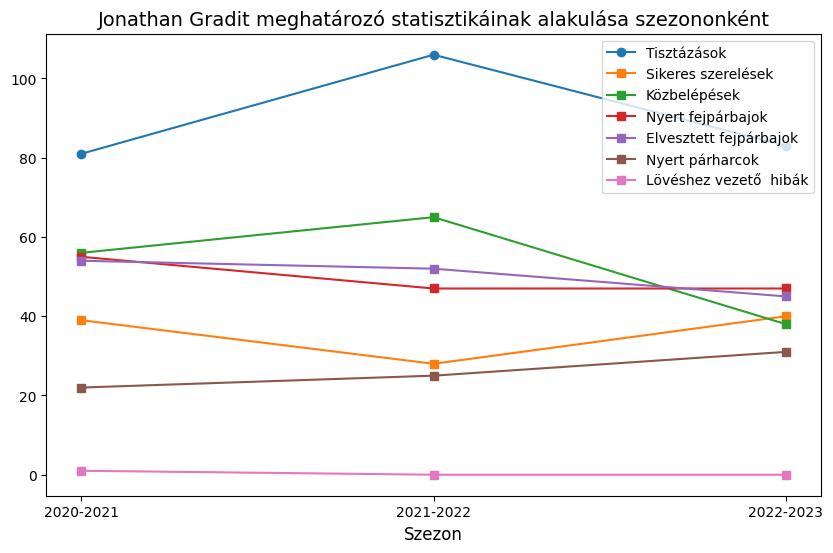

In [204]:
#Jonathan Gradit

L12021=L1[L1['Season']=='2020-2021']
L12022=L1[L1['Season']=='2021-2022']
L12023=L1[L1['Season']=='2022-2023']
L1Gradit=pd.concat([L12023,L12022,L12021], ignore_index=True)
Gradit=L1Gradit[L1Gradit['Player']=="Jonathan Gradit"]
Gradit=Gradit[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

plt.figure(figsize=(10, 6))


Clr = np.array(Gradit["Clr"])
TklW = np.array(Gradit["TklW"])
Int = np.array(Gradit["Int"])
Challenges_Tkl=np.array(Gradit["Challenges_Tkl"])
Won = np.array(Gradit["Won"])
Lost = np.array(Gradit["Lost"])
Err= np.array(Gradit["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')

plt.title('Jonathan Gradit meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

<Figure size 1000x600 with 0 Axes>

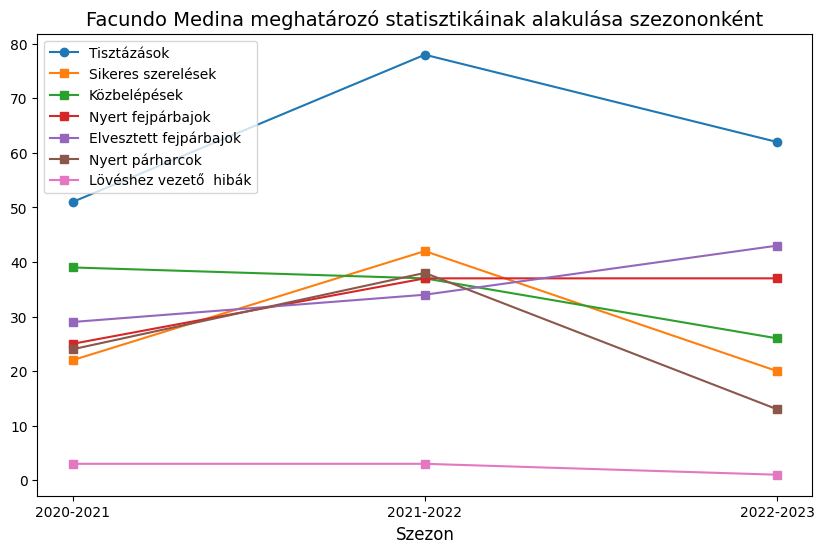

In [205]:
#Facundo Medina

Medina=L1[L1['Player']=="Facundo Medina"]
Medina=Medina[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

plt.figure(figsize=(10, 6))


Clr = np.array(Medina["Clr"])
TklW = np.array(Medina["TklW"])
Int = np.array(Medina["Int"])
Challenges_Tkl=np.array(Medina["Challenges_Tkl"])
Won = np.array(Medina["Won"])
Lost = np.array(Medina["Lost"])
Err= np.array(Medina["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')

plt.title('Facundo Medina meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

######Kapus(ok)

In [206]:
Lens2022_2023=L12023[L12023["Team"]=="Lens"]
Lens2022_2023_gk=Lens2022_2023[Lens2022_2023['Pos']=="GK"]
Lens2022_2023_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
35,Brice Samba,fr FRA,GK,28.0,37,37,3330.0,37.0,0.0,0.0,...,12.0,2.0,8.0,2.0,80.0,2022-2023,Lens,Ligue 1,Brice Samba(Lens),2022-2023(Brice Samba)
55,Jean-Louis Leca,fr FRA,GK,36.0,1,1,90.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,100.0,2022-2023,Lens,Ligue 1,Jean-Louis Leca(Lens),2022-2023(Jean-Louis Leca)
70,Yannick Pandor,km COM,GK,21.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Lens,Ligue 1,Yannick Pandor(Lens),2022-2023(Yannick Pandor)


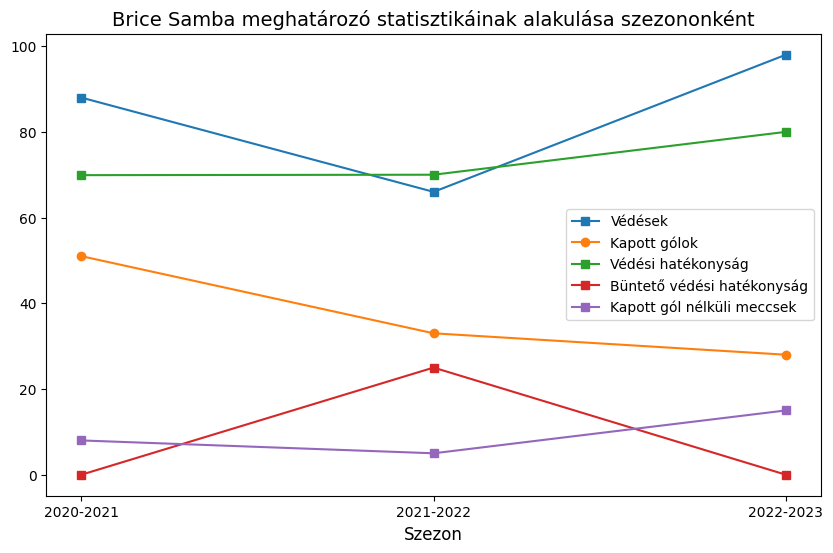

In [207]:
#Kapusok
Leca2021=L12021[L12021["Player"]=="Jean-Louis Leca"]
Leca2022=L12022[L12022["Player"]=="Jean-Louis Leca"]
Samba=L12023[L12023["Player"]=="Brice Samba"]
Kapusok=pd.concat([Samba,Leca2022,Leca2021])
Kapusok=Kapusok[["Player","GA","Saves","Save%","PK_Save%","CS","Season","MP"]].sort_values(by='Season', ascending=True)

GA = np.array(Kapusok["GA"])
Save = np.array(Kapusok["Save%"])
PK_Save = np.array(Kapusok["PK_Save%"])
CS=np.array(Kapusok["CS"])
Saves = np.array(Kapusok["Saves"])

plt.figure(figsize=(10, 6))
plt.plot(xpoints, Saves, label='Védések', marker='s')
plt.plot(xpoints, GA, label='Kapott gólok', marker='o')
plt.plot(xpoints, Save, label='Védési hatékonyság', marker='s')
plt.plot(xpoints, PK_Save, label='Büntető védési hatékonyság', marker='s')
plt.plot(xpoints, CS, label='Kapott gól nélküli meccsek', marker='s')


plt.title('Brice Samba meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


**ÖSSZEGZÉS**
Összességében elmondható, hogy a Lens a 2022-2023-as szezonban nyújtott kimagasló teljesítményét főként középpályásainak, védőinek és kapusának kiváló teljesítménye eredményezte, jól látható ugyanis hogy a legtöbb, fontos védelmi mutatóban nagyot javult a csapat.

##Bundesliga

###.csv file beolvasása és utótisztítása

In [282]:
BL=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/BL_vegleges.csv")

In [283]:
del BL["Unnamed: 0"]

In [284]:
pd.isnull(BL).sum()

Player                   0
Nation                   0
Pos                      0
Age                      0
MP                       0
Starts                   0
Min                    390
90s                    390
Gls                    390
Ast                    390
G+A                    390
G-PK                   390
Penalty_Kicks_Made     390
PKatt                  390
CrdY                   390
CrdR                   390
xG                     390
npxG                   390
xAG                    390
npxG.1                 390
GA                    2721
SoTA                  2721
Saves                 2721
Save%                 2723
PK_Save%              2774
CS                    2721
CS%                   2727
Sh                     390
SoT                    390
SoT%                   849
G/Sh                   849
Dist                   849
Cmp                    390
Att                    390
Cmp%                   410
TotDist                390
PrgDist                390
x

In [285]:
BL=BL.fillna(0)

In [286]:
pd.isnull(BL).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [287]:
#A későbbi kimutatások végett bevezettem 2 új változót
BL["Player(Team)"]=BL["Player"]+ "(" + BL["Team"] + ")"
BL["Season(Player)"]=BL["Season"]+ "(" + BL["Player"] + ")"


In [288]:
BL.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Joshua Kimmich,de GER,MF,27.0,33,32,2809.0,31.2,5.0,6.0,...,39.0,2.0,16.0,32.0,33.3,2022-2023,Bayern Munich,Bundesliga,Joshua Kimmich(Bayern Munich),2022-2023(Joshua Kimmich)
1,Benjamin Pavard,fr FRA,DF,26.0,30,27,2431.0,27.0,4.0,1.0,...,83.0,0.0,64.0,33.0,66.0,2022-2023,Bayern Munich,Bundesliga,Benjamin Pavard(Bayern Munich),2022-2023(Benjamin Pavard)
2,Matthijs de Ligt,nl NED,DF,22.0,31,27,2403.0,26.7,3.0,1.0,...,85.0,0.0,96.0,64.0,60.0,2022-2023,Bayern Munich,Bundesliga,Matthijs de Ligt(Bayern Munich),2022-2023(Matthijs de Ligt)
3,Dayot Upamecano,fr FRA,DF,23.0,29,27,2348.0,26.1,0.0,1.0,...,71.0,4.0,47.0,47.0,50.0,2022-2023,Bayern Munich,Bundesliga,Dayot Upamecano(Bayern Munich),2022-2023(Dayot Upamecano)
4,Jamal Musiala,de GER,"MF,FW",19.0,33,26,2198.0,24.4,12.0,10.0,...,3.0,0.0,12.0,12.0,50.0,2022-2023,Bayern Munich,Bundesliga,Jamal Musiala(Bayern Munich),2022-2023(Jamal Musiala)


In [289]:
BL.columns

Index(['Player', 'Nation', 'Pos', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'npxG.1', 'GA', 'SoTA', 'Saves', 'Save%',
       'PK_Save%', 'CS', 'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp',
       'Att', 'Cmp%', 'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl',
       'TklW', 'Tkl%', 'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%',
       'Season', 'Team', 'Competition', 'Player(Team)', 'Season(Player)'],
      dtype='object')

###2022-2023
####A 2022-2023-as szezon statisztikái, azok elemzése.



####A dataframe statisztikáinak elemzése, összehasonlítások, rangsorolások

In [290]:
BL2023=BL[BL["Season"]=="2022-2023"]
BL2023


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Joshua Kimmich,de GER,MF,27.0,33,32,2809.0,31.2,5.0,6.0,...,39.0,2.0,16.0,32.0,33.3,2022-2023,Bayern Munich,Bundesliga,Joshua Kimmich(Bayern Munich),2022-2023(Joshua Kimmich)
1,Benjamin Pavard,fr FRA,DF,26.0,30,27,2431.0,27.0,4.0,1.0,...,83.0,0.0,64.0,33.0,66.0,2022-2023,Bayern Munich,Bundesliga,Benjamin Pavard(Bayern Munich),2022-2023(Benjamin Pavard)
2,Matthijs de Ligt,nl NED,DF,22.0,31,27,2403.0,26.7,3.0,1.0,...,85.0,0.0,96.0,64.0,60.0,2022-2023,Bayern Munich,Bundesliga,Matthijs de Ligt(Bayern Munich),2022-2023(Matthijs de Ligt)
3,Dayot Upamecano,fr FRA,DF,23.0,29,27,2348.0,26.1,0.0,1.0,...,71.0,4.0,47.0,47.0,50.0,2022-2023,Bayern Munich,Bundesliga,Dayot Upamecano(Bayern Munich),2022-2023(Dayot Upamecano)
4,Jamal Musiala,de GER,"MF,FW",19.0,33,26,2198.0,24.4,12.0,10.0,...,3.0,0.0,12.0,12.0,50.0,2022-2023,Bayern Munich,Bundesliga,Jamal Musiala(Bayern Munich),2022-2023(Jamal Musiala)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,Linus Gechter,de GER,DF,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Hertha BSC,Bundesliga,Linus Gechter(Hertha BSC),2022-2023(Linus Gechter)
595,Rune Jarstein,no NOR,GK,37.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Hertha BSC,Bundesliga,Rune Jarstein(Hertha BSC),2022-2023(Rune Jarstein)
596,Robert Kwasigroch,de GER,GK,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Hertha BSC,Bundesliga,Robert Kwasigroch(Hertha BSC),2022-2023(Robert Kwasigroch)
597,Joel da Silva Kiala,de GER,DF,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Hertha BSC,Bundesliga,Joel da Silva Kiala(Hertha BSC),2022-2023(Joel da Silva Kiala)


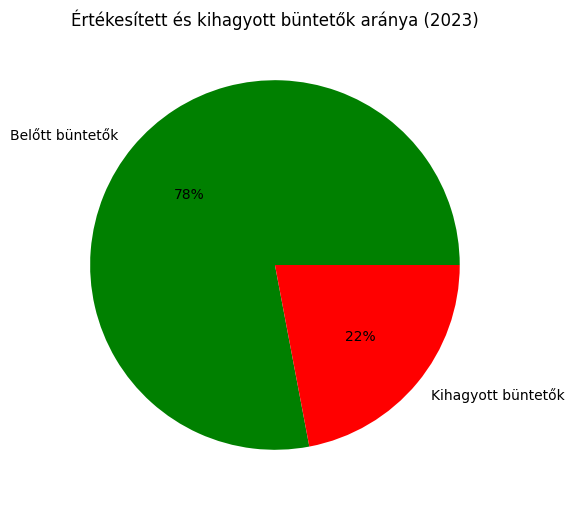

In [291]:
#Értékesített és kihagyott büntetők aránya
BL_Pen_Attempted_2023=BL2023["PKatt"].sum()
BL_Pen_Scored_2023=BL2023["Penalty_Kicks_Made"].sum()
BL_Pen_Missed_2023=BL_Pen_Attempted_2023-BL_Pen_Scored_2023

plt.figure(figsize=(13,6))
plt.title("Értékesített és kihagyott büntetők aránya (2023)")
data=[BL_Pen_Scored_2023,BL_Pen_Missed_2023]
colors=["green","red"]
labels=["Belőtt büntetők","Kihagyott büntetők"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()


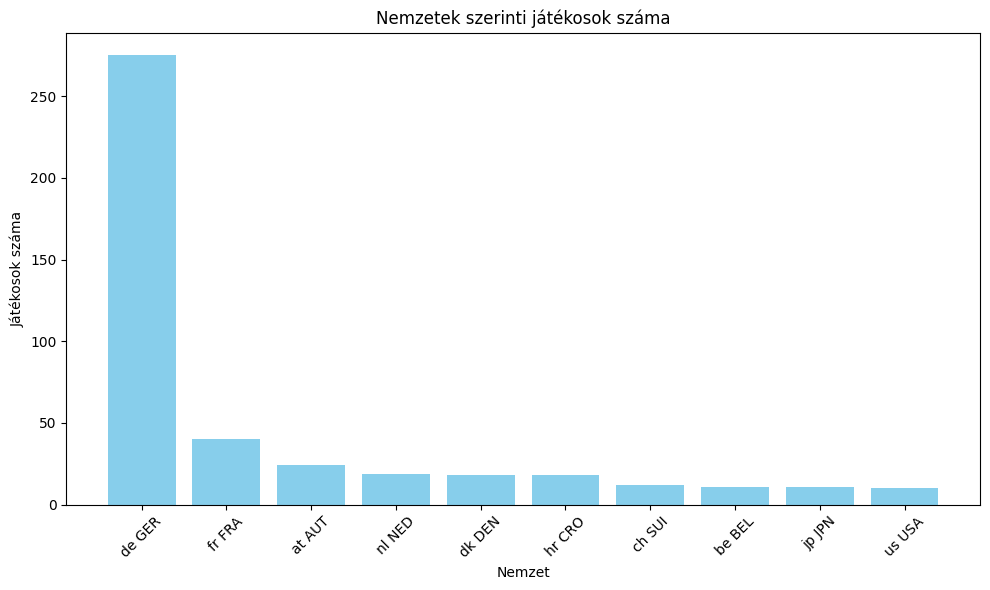

In [292]:
#Top 10 legtöbb játékost adó nemzet (2023)
jatekosok_szama = BL2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")

# Oszlopdiagram létrehozáBL
plt.figure(figsize=(10, 6))
plt.bar(top_10_nemzet['Nation'], top_10_nemzet['Játékosok száma'], color='skyblue')
plt.xlabel('Nemzet')
plt.ylabel('Játékosok száma')
plt.title('Nemzetek szerinti játékosok száma')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




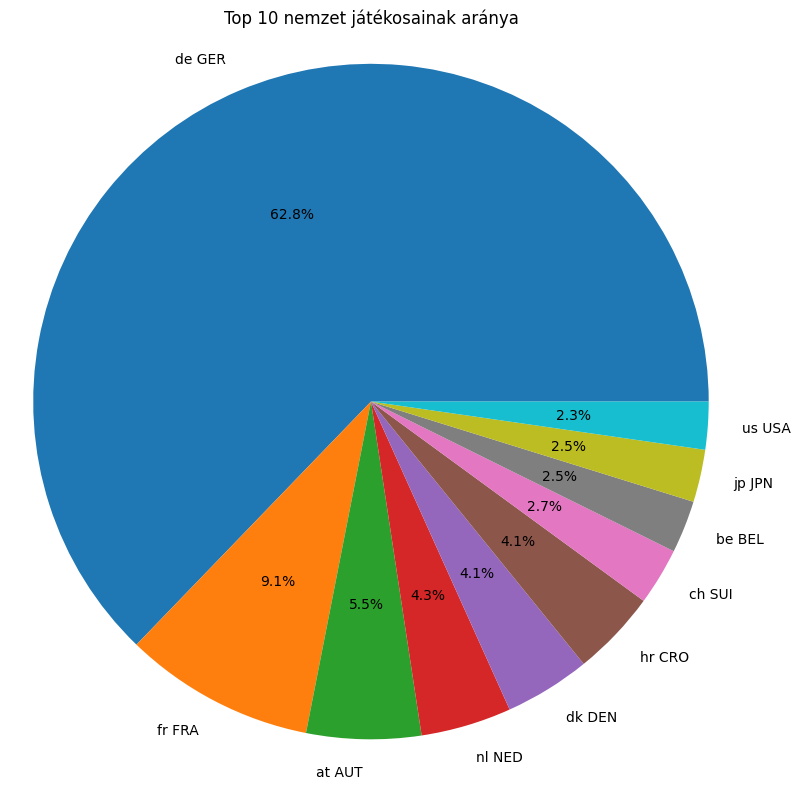

In [293]:
#Az előző kimutatás csak kördiagrammal
jatekosok_szama = BL2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")
plt.figure(figsize=(8, 8))
plt.pie(top_10_nemzet['Játékosok száma'], labels=top_10_nemzet['Nation'], autopct='%1.1f%%')
plt.title('Top 10 nemzet játékosainak aránya')
plt.axis('equal')
plt.tight_layout()
plt.show()


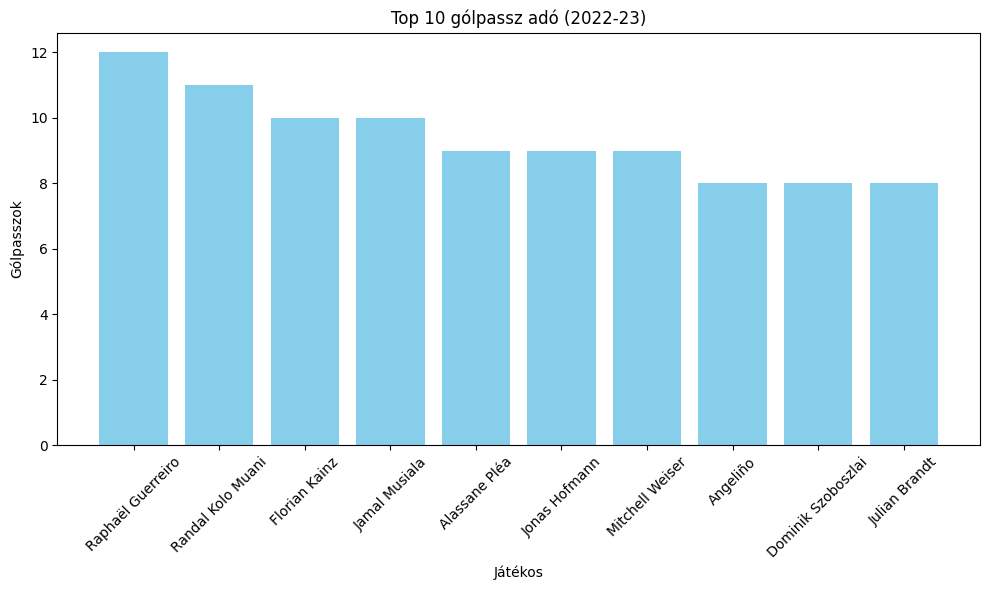

In [294]:
#Top 10 gólpassz adó
top_10_gólpassz_adó_2023_BL = BL2023.groupby('Player')["Ast"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_gólpassz_adó_2023_BL['Player'], top_10_gólpassz_adó_2023_BL['Ast'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


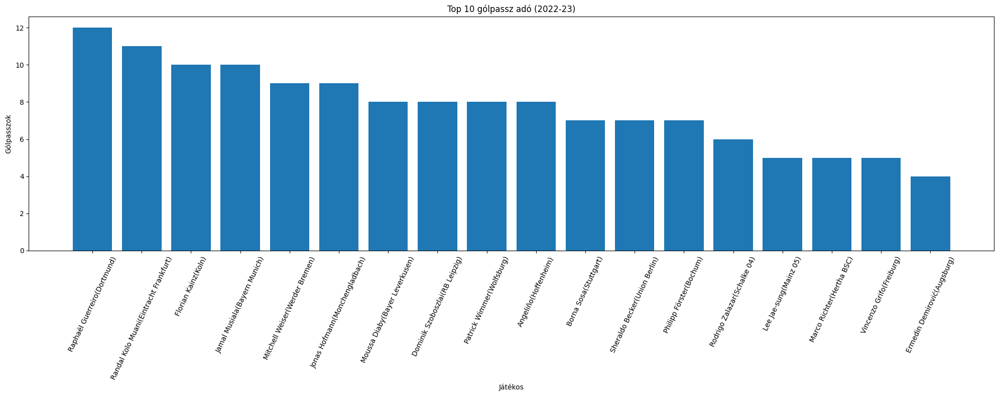

In [295]:
#Legjobb gólpassz adók csapatonként
legjobb_golpassz_adok_csapatonként = BL2023.groupby('Team').apply(lambda x: x.nlargest(1, 'Ast')).reset_index(drop=True)
legjobb_golpassz_adok_csapatonként=legjobb_golpassz_adok_csapatonként.sort_values(by="Ast",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(legjobb_golpassz_adok_csapatonként['Player(Team)'], legjobb_golpassz_adok_csapatonként['Ast'])
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()


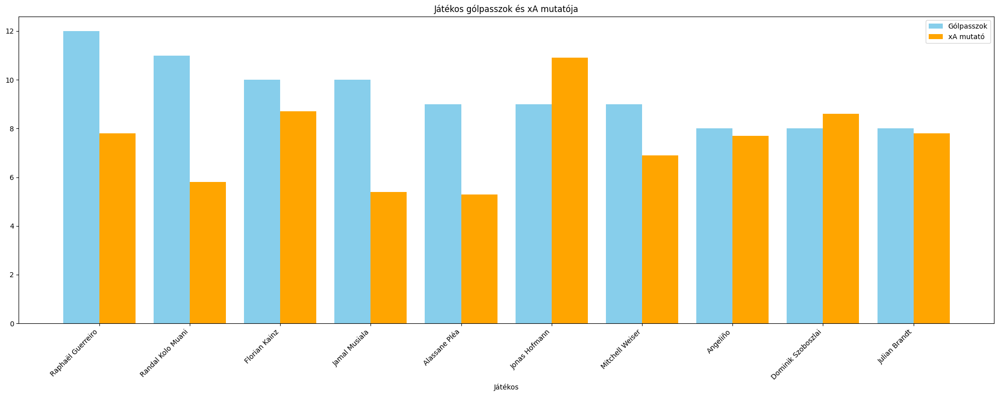

In [296]:
#Top 10 gólpasssz adó és hogy hány gólpasszuknak kellett volna lennie (xA)
gp_xA_2023_BL = BL2023.groupby('Player').agg({"Ast":'sum','xA':'sum'}).nlargest(10,'Ast').reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(20, 8))
bar_width = 0.4
index = range(len(gp_xA_2023_BL))
plt.bar(index, gp_xA_2023_BL['Ast'], bar_width, color='skyblue', label='Gólpasszok')
plt.bar([i + bar_width for i in index], gp_xA_2023_BL['xA'], bar_width, color='orange', label='xA mutató')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Játékos gólpasszok és xA mutatója')
plt.xticks([i + bar_width/2 for i in index], gp_xA_2023_BL['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


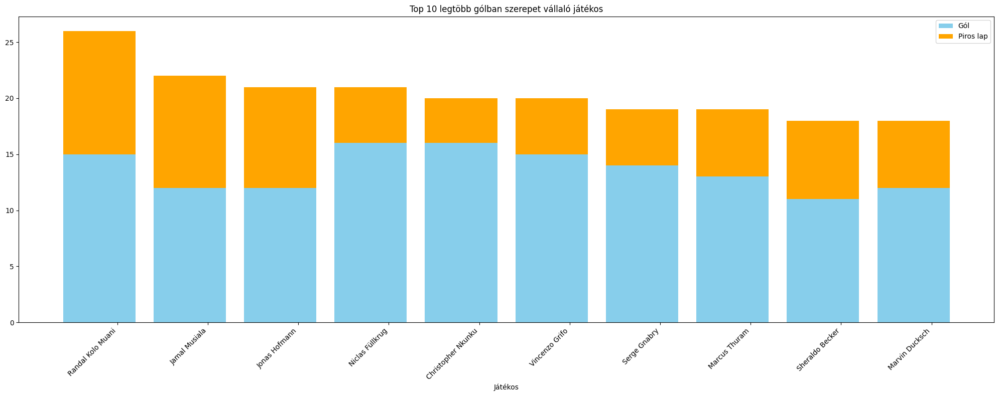

In [297]:
#Top 10 legtöbb gólban szerepet vállaló játékos
top10_ga_BL2023=BL2023.nlargest(10,"G+A")
top10_ga_BL2023=top10_ga_BL2023.sort_values(by="G+A",ascending=False)

plt.figure(figsize=(20, 8))
plt.bar(top10_ga_BL2023["Player"], top10_ga_BL2023['Gls'], color='skyblue', label='Gól')
plt.bar(top10_ga_BL2023["Player"], top10_ga_BL2023['Ast'], bottom=top10_ga_BL2023['Gls'], color='orange', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb gólban szerepet vállaló játékos')
plt.xticks([i + bar_width/2 for i in index], top10_ga_BL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


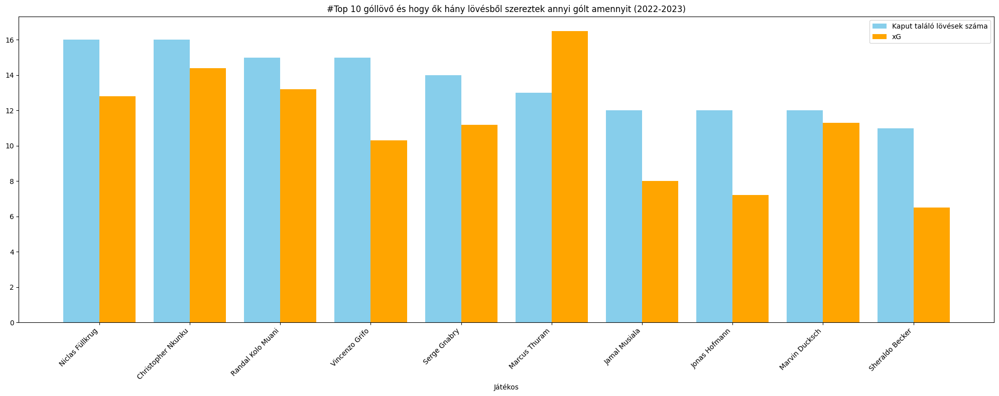

In [298]:
#Top 10 góllövő és hogy ők hány gólt kellett vna szerezniük (xG).
top10_scorer_BL2023=BL2023.nlargest(10,"Gls")
top10_scorer_BL2023=top10_ga_BL2023.sort_values(by="Gls",ascending=False)

plt.figure(figsize=(20, 8))
bar_width = 0.4
index = range(len(top10_scorer_BL2023))
plt.bar(index, top10_scorer_BL2023['Gls'], bar_width, color='skyblue', label='Kaput találó lövések száma')
plt.bar([i + bar_width for i in index], top10_scorer_BL2023['xG'], bar_width, color='orange', label='xG')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_scorer_BL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


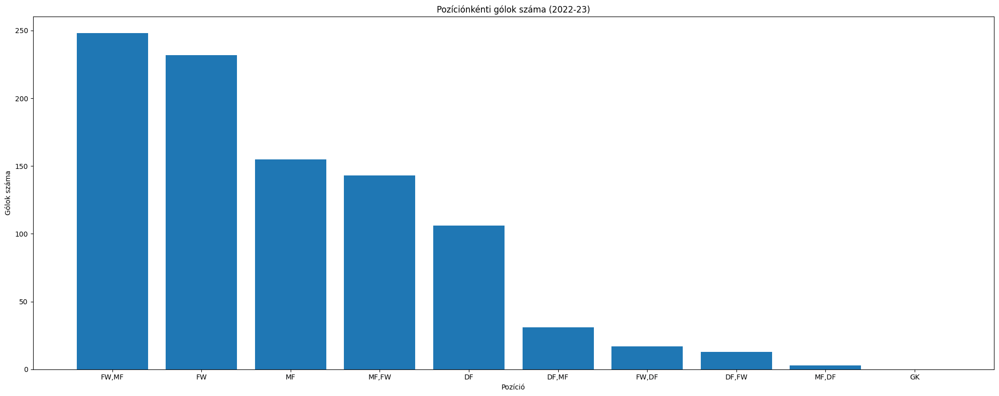

In [299]:
#Pozíciónkénti gólok száma
gls_per_pos_BL2023=BL2023.groupby('Pos')['Gls'].sum().reset_index()
gls_per_pos_BL2023=gls_per_pos_BL2023.sort_values(by="Gls",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(gls_per_pos_BL2023['Pos'], gls_per_pos_BL2023['Gls'])
plt.xlabel('Pozíció')
plt.ylabel('Gólok száma')
plt.title('Pozíciónkénti gólok száma (2022-23)')

plt.tight_layout()
plt.show()


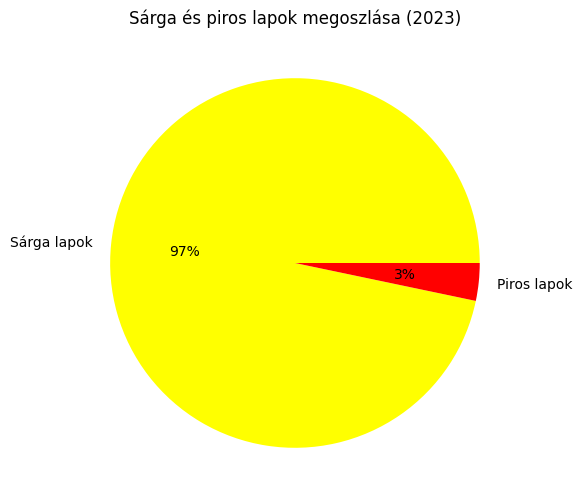

In [300]:
#Sárga és piros lapok megoszlása
yellow_BL2023=BL2023["CrdY"].sum()
red_BL2023=BL2023["CrdR"].sum()
plt.figure(figsize=(13,6))
plt.title("Sárga és piros lapok megoszlása (2023)")
data=[yellow_BL2023,red_BL2023]
colors=["yellow","red"]
labels=["Sárga lapok","Piros lapok"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()

<ipython-input-301-1178566871b5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BL2023["cardssum"]=BL2023['CrdY']+BL2023['CrdR']


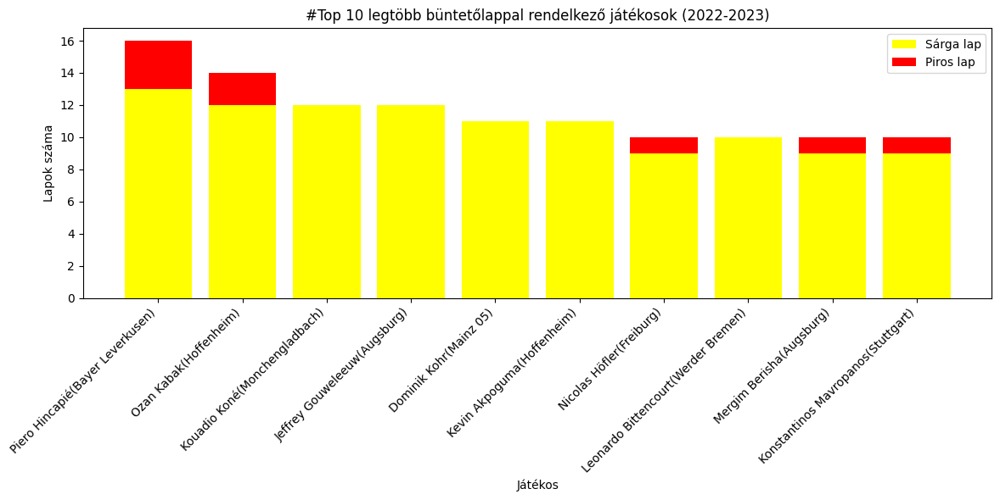

In [301]:
#Legtöbb büntetőlappal rendelkező játékosok
BL2023["cardssum"]=BL2023['CrdY']+BL2023['CrdR']
top10_carded_BL2023=BL2023.nlargest(10,"cardssum")
top10_carded_BL2023=top10_carded_BL2023.sort_values(by="cardssum",ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(top10_carded_BL2023["Player(Team)"], top10_carded_BL2023['CrdY'], color='yellow', label='Sárga lap')
plt.bar(top10_carded_BL2023["Player(Team)"], top10_carded_BL2023['CrdR'], bottom=top10_carded_BL2023['CrdY'], color='red', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('Lapok száma')
plt.title('#Top 10 legtöbb büntetőlappal rendelkező játékosok (2022-2023)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


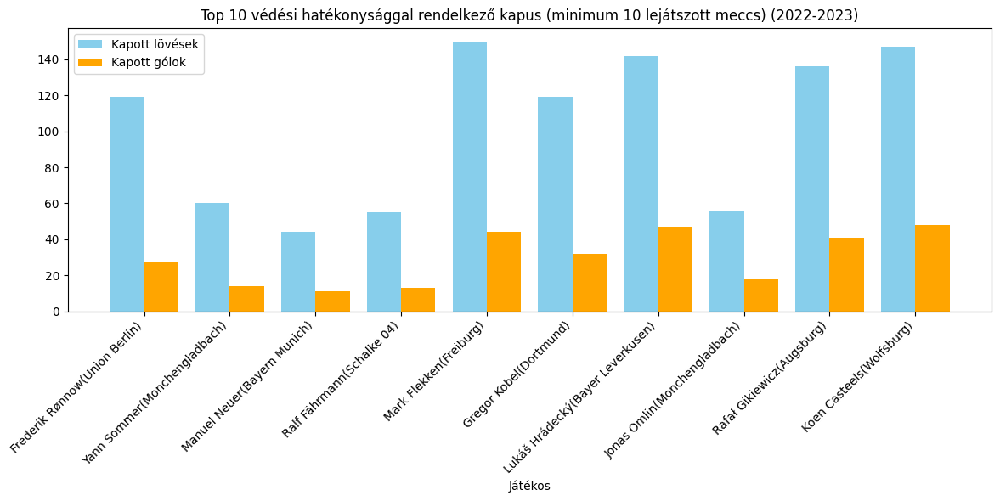

In [302]:
#Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_BL2023=BL2023[BL2023["Pos"]=="GK"]
KeepertoCompare_BL2023=Keepers_BL2023[Keepers_BL2023["MP"]>=10]
top10_savepercent_BL2023=KeepertoCompare_BL2023.nlargest(10,"Save%")
top10_savepercent_BL2023=top10_savepercent_BL2023.sort_values(by="Save%",ascending=False)

plt.figure(figsize=(12, 6))
bar_width = 0.4
index = range(len(top10_savepercent_BL2023))
plt.bar(index, top10_savepercent_BL2023['SoTA'], bar_width, color='skyblue', label='Kapott lövések')
plt.bar([i + bar_width for i in index], top10_savepercent_BL2023['GA'], bar_width, color='orange', label='Kapott gólok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_savepercent_BL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()




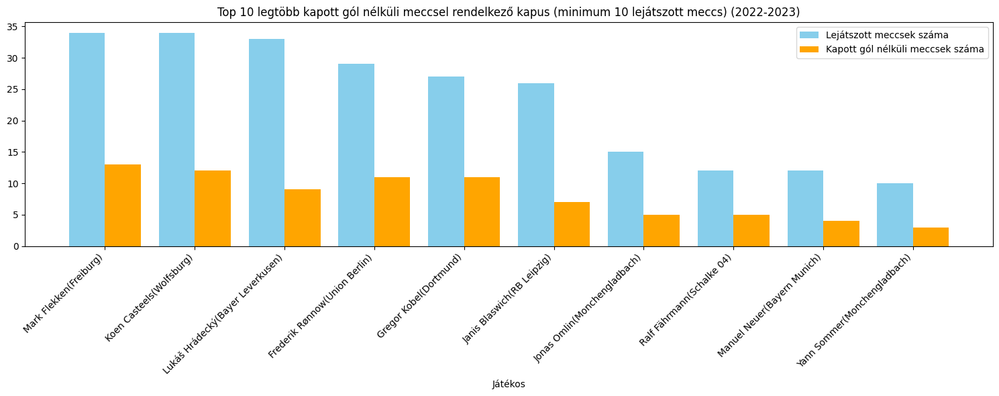

In [303]:
#Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_BL2023=BL2023[BL2023["Pos"]=="GK"]
KeepertoCompare_BL2023=Keepers_BL2023[Keepers_BL2023["MP"]>=10]
top10_cs_BL2023=KeepertoCompare_BL2023.nlargest(10,"CS%")
top10_cs_BL2023=top10_cs_BL2023.sort_values(by="MP",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_cs_BL2023))
plt.bar(index, top10_cs_BL2023['MP'], bar_width, color='skyblue', label='Lejátszott meccsek száma')
plt.bar([i + bar_width for i in index], top10_cs_BL2023['CS'], bar_width, color='orange', label='Kapott gól nélküli meccsek száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_cs_BL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

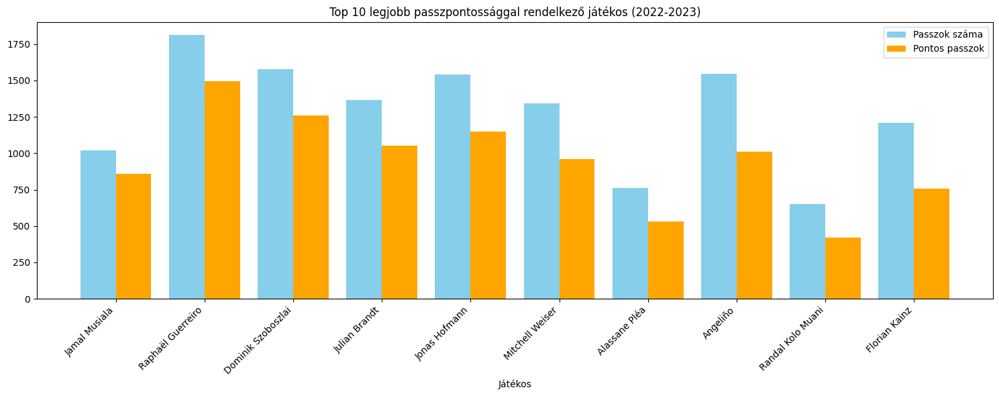

In [304]:
#Top 10 legjobb passzpontossággal rendelkező játékos
gp_pp_BL2023 = BL2023.groupby('Player').agg({"Ast":'sum','Att':'sum','Cmp':'sum','Cmp%':'sum'}).nlargest(10,'Ast').reset_index()
top10_pp_BL2023=gp_pp_BL2023.sort_values(by="Cmp%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_pp_BL2023))
plt.bar(index, top10_pp_BL2023['Att'], bar_width, color='skyblue', label='Passzok száma')
plt.bar([i + bar_width for i in index], top10_pp_BL2023['Cmp'], bar_width, color='orange', label='Pontos passzok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_pp_BL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-305-d8f5d5fd7173>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BL2023["Tkl_Tkl%"]=BL2023['TklW']/BL2023['Tkl']*100


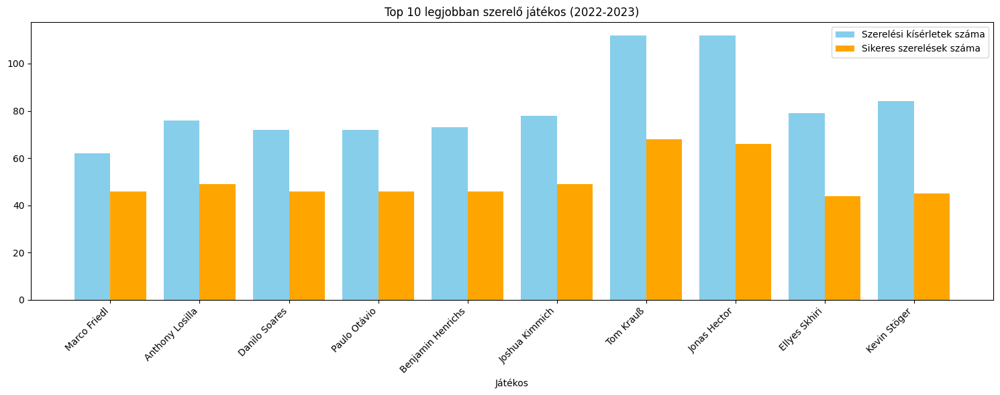

In [305]:
#Top 10 legjobban szerelő játékos
BL2023["Tkl_Tkl%"]=BL2023['TklW']/BL2023['Tkl']*100
top10_tkl_BL2023 = BL2023.groupby('Player').agg({"Tkl":'sum','TklW':'sum','Tkl_Tkl%':'sum'}).nlargest(10,'TklW').reset_index()
top10_tkl_BL2023 = top10_tkl_BL2023.sort_values(by="Tkl_Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_tkl_BL2023))
plt.bar(index, top10_tkl_BL2023['Tkl'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_tkl_BL2023['TklW'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobban szerelő játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_tkl_BL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


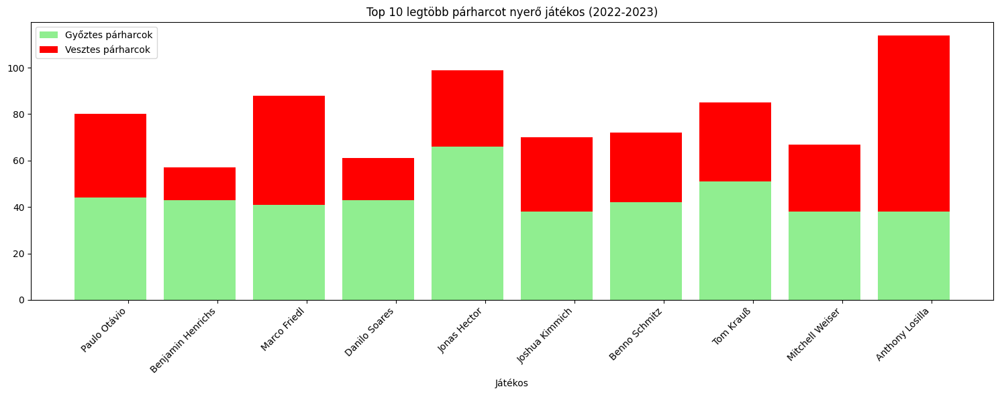

In [306]:
#Top 10 legtöbb párharcot nyerő játékos
top10_chl_BL2023 = BL2023.groupby('Player').agg({"Challenges_Tkl":'sum','Lost':'sum','Tkl%':'sum'}).nlargest(10,'Challenges_Tkl').reset_index()
top10_chl_BL2023 = top10_chl_BL2023.sort_values(by="Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_chl_BL2023["Player"], top10_chl_BL2023['Challenges_Tkl'], color='lightgreen', label='Győztes párharcok')
plt.bar(top10_chl_BL2023["Player"], top10_chl_BL2023['Lost'], bottom=top10_chl_BL2023['Challenges_Tkl'], color='red', label='Vesztes párharcok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb párharcot nyerő játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_chl_BL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()



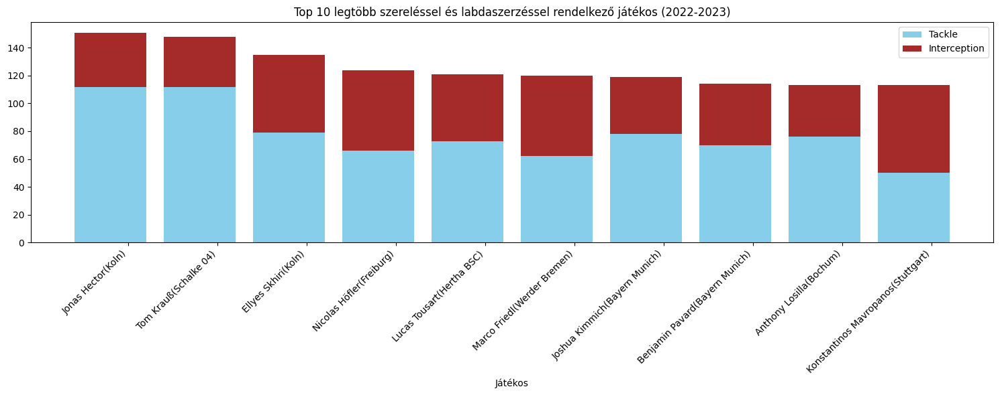

In [307]:
#'Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos
top10_TklInt_BL2023 = BL2023.groupby('Player(Team)').agg({"Tkl":'sum','Int':'sum','Tkl+Int':'sum'}).nlargest(10,'Tkl+Int').reset_index()
top10_TklInt_BL2023 = top10_TklInt_BL2023.sort_values(by="Tkl+Int",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_TklInt_BL2023["Player(Team)"], top10_TklInt_BL2023['Tkl'], color='skyblue', label='Tackle')
plt.bar(top10_TklInt_BL2023["Player(Team)"], top10_TklInt_BL2023['Int'], bottom=top10_TklInt_BL2023['Tkl'], color='brown', label='Interception')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_TklInt_BL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


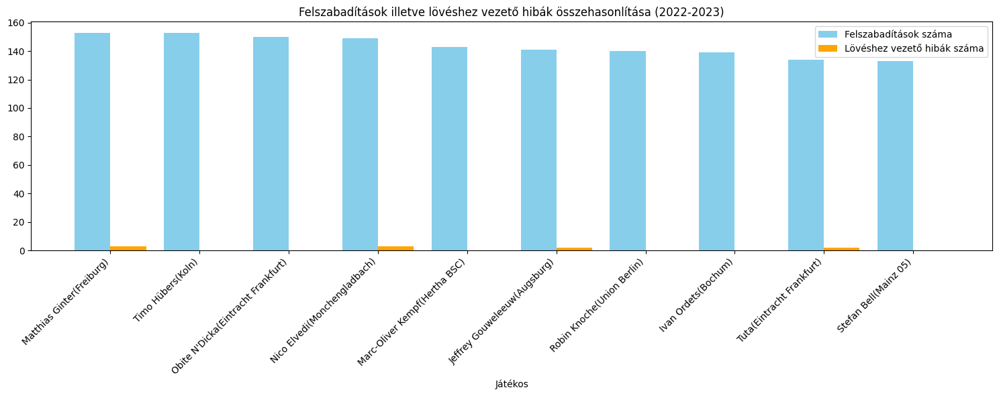

In [308]:
#Felszabadítások illetve lövéshez vezető hibák összehasonlítása
top10_clrerr_BL2023 = BL2023.groupby('Player(Team)').agg({"Clr":'sum','Err':'sum'}).nlargest(10,'Clr').reset_index()
top10_clrerr_BL2023 = top10_clrerr_BL2023.sort_values(by="Clr",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_clrerr_BL2023))
plt.bar(index, top10_clrerr_BL2023['Clr'], bar_width, color='skyblue', label='Felszabadítások száma')
plt.bar([i + bar_width for i in index], top10_clrerr_BL2023['Err'], bar_width, color='orange', label='Lövéshez vezető hibák száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_clrerr_BL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


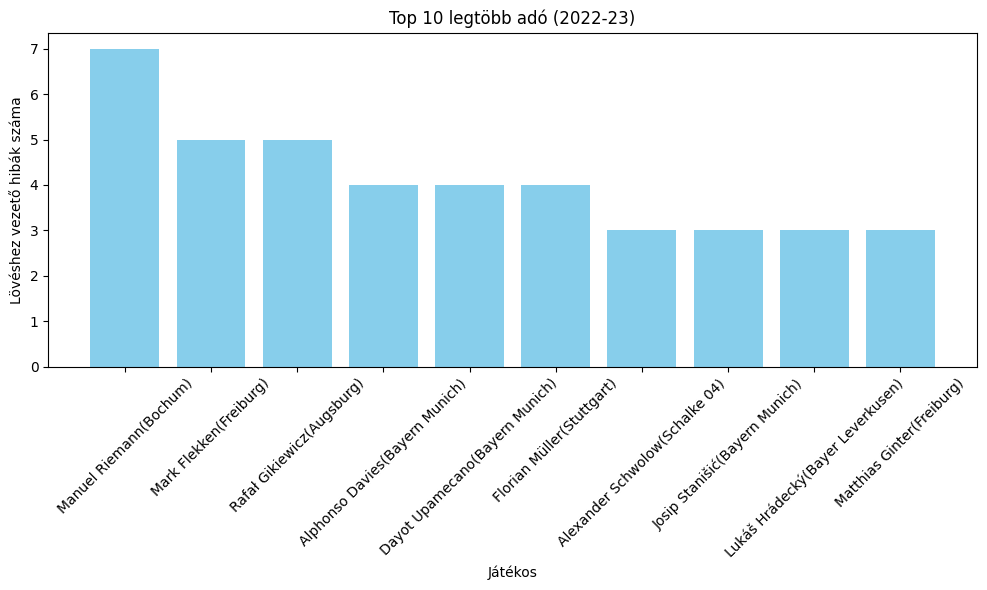

In [309]:
#Legtöbb lövéshez vezető hibát vétő játékosok
top_10_error_maker_BL2023 = BL2023.groupby('Player(Team)')["Err"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_error_maker_BL2023['Player(Team)'], top_10_error_maker_BL2023['Err'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Lövéshez vezető hibák száma')
plt.title('Top 10 legtöbb adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


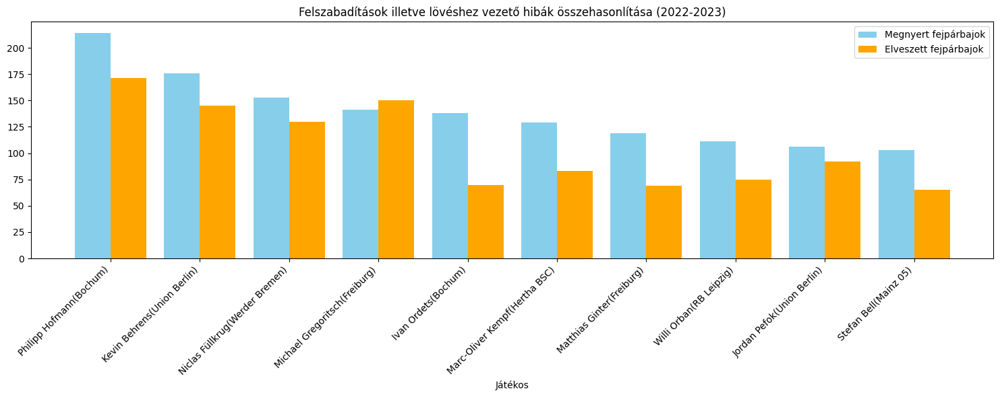

In [310]:
#Top 10 legtöbb fejpárbajt nyerő játékos

top10_airduel_BL2023 = BL2023.groupby('Player(Team)').agg({"Won":'sum','Lost':'sum'}).nlargest(10,'Won').reset_index()
top10_airduel_BL2023 = top10_airduel_BL2023.sort_values(by="Won",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_airduel_BL2023))
plt.bar(index, top10_airduel_BL2023['Won'], bar_width, color='skyblue', label='Megnyert fejpárbajok')
plt.bar([i + bar_width for i in index], top10_airduel_BL2023['Lost'], bar_width, color='orange', label='Elveszett fejpárbajok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_airduel_BL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


####Összefüggések keresése
Bizonyos játékosok statisztikái feltűnően gyengébbek az elvártnál, ezért meg szeretném vizsgálni, hogy ezen játékosok mélyrepülése hogyan hatott a csapatuk teljesítményére. Ehhez szükségem volt a bajnoki tabellára

In [311]:
BL_table=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/Bundesliga_tables.csv")

In [312]:
BL_table

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Bayern Munich,34,21,8,5,92,38,54,71,2022-2023,Bundesliga
1,1,2,Dortmund,34,22,5,7,83,44,39,71,2022-2023,Bundesliga
2,2,3,RB Leipzig,34,20,6,8,64,41,23,66,2022-2023,Bundesliga
3,3,4,Union Berlin,34,18,8,8,51,38,13,62,2022-2023,Bundesliga
4,4,5,Freiburg,34,17,8,9,51,44,7,59,2022-2023,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,13,14,Schalke 04,34,8,9,17,37,55,-18,33,2018-2019,Bundesliga
86,14,15,Augsburg,34,8,8,18,51,71,-20,32,2018-2019,Bundesliga
87,15,16,Stuttgart,34,7,7,20,32,70,-38,28,2018-2019,Bundesliga
88,16,17,Hannover 96,34,5,6,23,31,71,-40,21,2018-2019,Bundesliga


In [313]:
del BL_table["Unnamed: 0"]

In [314]:
BL_table

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Bayern Munich,34,21,8,5,92,38,54,71,2022-2023,Bundesliga
1,2,Dortmund,34,22,5,7,83,44,39,71,2022-2023,Bundesliga
2,3,RB Leipzig,34,20,6,8,64,41,23,66,2022-2023,Bundesliga
3,4,Union Berlin,34,18,8,8,51,38,13,62,2022-2023,Bundesliga
4,5,Freiburg,34,17,8,9,51,44,7,59,2022-2023,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...
85,14,Schalke 04,34,8,9,17,37,55,-18,33,2018-2019,Bundesliga
86,15,Augsburg,34,8,8,18,51,71,-20,32,2018-2019,Bundesliga
87,16,Stuttgart,34,7,7,20,32,70,-38,28,2018-2019,Bundesliga
88,17,Hannover 96,34,5,6,23,31,71,-40,21,2018-2019,Bundesliga


#####Bundesliga tabella 2022-2023

In [315]:
BL_table_2023=BL_table[BL_table["Season"]=="2022-2023"]
BL_table_2023


,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Bayern Munich,34,21,8,5,92,38,54,71,2022-2023,Bundesliga
1,2,Dortmund,34,22,5,7,83,44,39,71,2022-2023,Bundesliga
2,3,RB Leipzig,34,20,6,8,64,41,23,66,2022-2023,Bundesliga
3,4,Union Berlin,34,18,8,8,51,38,13,62,2022-2023,Bundesliga
4,5,Freiburg,34,17,8,9,51,44,7,59,2022-2023,Bundesliga
5,6,Leverkusen,34,14,8,12,57,49,8,50,2022-2023,Bundesliga
6,7,Eint Frankfurt,34,13,11,10,58,52,6,50,2022-2023,Bundesliga
7,8,Wolfsburg,34,13,10,11,57,48,9,49,2022-2023,Bundesliga
8,9,Mainz 05,34,12,10,12,54,55,-1,46,2022-2023,Bundesliga
9,10,M'Gladbach,34,11,10,13,52,55,-3,43,2022-2023,Bundesliga


#####AZ Union Berlin nagy szezonja

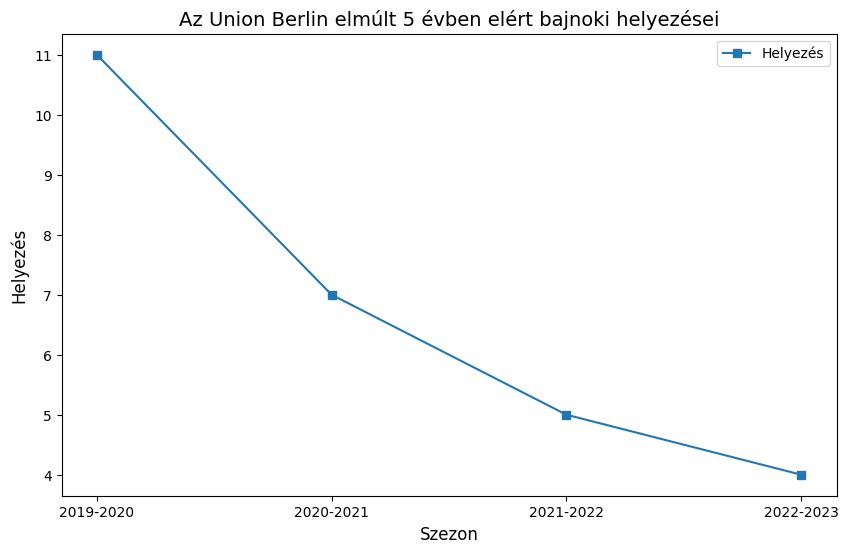

In [316]:
Union=BL_table[BL_table["Squad"]=="Union Berlin"]
Union=Union[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Union["Season"])
ypoints = np.array(Union["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Union["Rk"], label='Helyezés', marker='s')

plt.title('Az Union Berlin elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()

Mint az látható nagy meglepetésre az Union Berlin a 4-ik, Bajnokok Ligája indulást jelentő helyen végzett a 2022-2023-as kiírásban ami a vonaldiagramot tekintve egy 4 éves folyamat koronázott meg. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

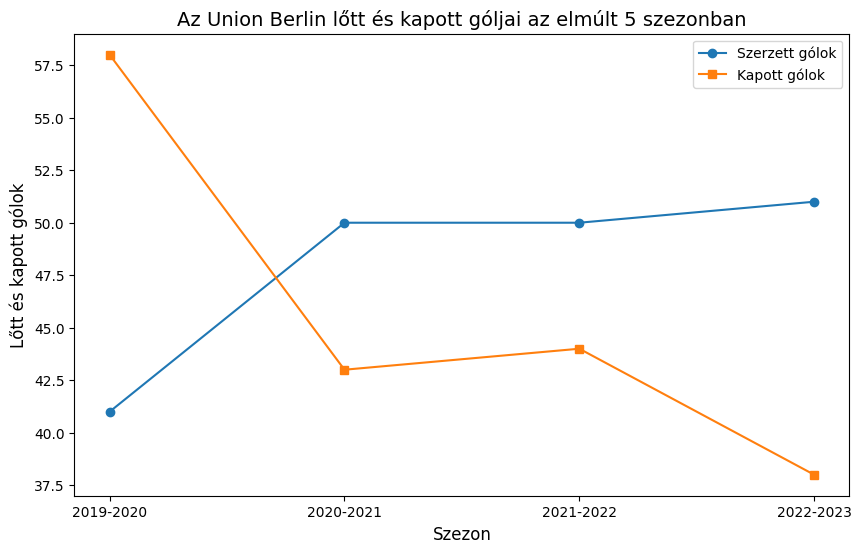

In [317]:
Union=BL_table[BL_table["Squad"]=="Union Berlin"]
Union_gf_ga=Union[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Union_gf_ga["GF"])
ga = np.array(Union_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gf, label='Szerzett gólok', marker='o')
plt.plot(xpoints, ga, label='Kapott gólok', marker='s')

plt.title('Az Union Berlin lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)
plt.legend()
plt.show()

Az ábrából kitűnik, hogy a korábbi évekhez képest nagyjából ugyanannyi gólt rúgtak viszont kevesebb gólt kaptak. Így itt inkább a középpályások, védők és a kapusok teljesítményét elemeztem.

######Középpályások

In [318]:
Union2023=BL2023[BL2023["Team"]=="Union Berlin"]
Union2023_mf=Union2023[Union2023['Pos']=="MF"]
Union2023_mf

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player),cardssum,Tkl_Tkl%
93,Rani Khedira,de GER,MF,28.0,33,33,2882.0,32.0,2.0,0.0,...,44.0,30.0,59.5,2022-2023,Union Berlin,Bundesliga,Rani Khedira(Union Berlin),2022-2023(Rani Khedira),8.0,55.000000
96,Janik Haberer,de GER,MF,28.0,32,30,2187.0,24.3,5.0,1.0,...,38.0,51.0,42.7,2022-2023,Union Berlin,Bundesliga,Janik Haberer(Union Berlin),2022-2023(Janik Haberer),1.0,58.620690
107,Aïssa Laïdouni,tn TUN,MF,25.0,14,11,871.0,9.7,2.0,0.0,...,7.0,10.0,41.2,2022-2023,Union Berlin,Bundesliga,Aïssa Laïdouni(Union Berlin),2022-2023(Aïssa Laïdouni),4.0,50.000000
109,András Schäfer,hu HUN,MF,23.0,16,10,860.0,9.6,0.0,0.0,...,11.0,14.0,44.0,2022-2023,Union Berlin,Bundesliga,András Schäfer(Union Berlin),2022-2023(András Schäfer),0.0,42.857143
110,Morten Thorsby,no NOR,MF,26.0,24,8,833.0,9.3,1.0,1.0,...,21.0,25.0,45.7,2022-2023,Union Berlin,Bundesliga,Morten Thorsby(Union Berlin),2022-2023(Morten Thorsby),3.0,45.454545
112,Genki Haraguchi,jp JPN,MF,31.0,11,6,498.0,5.5,0.0,0.0,...,8.0,7.0,53.3,2022-2023,Union Berlin,Bundesliga,Genki Haraguchi(Union Berlin),2022-2023(Genki Haraguchi),0.0,66.666667
114,Paul Seguin,de GER,MF,27.0,20,4,691.0,7.7,1.0,3.0,...,13.0,11.0,54.2,2022-2023,Union Berlin,Bundesliga,Paul Seguin(Union Berlin),2022-2023(Paul Seguin),4.0,47.058824
118,Miloš Pantović,rs SRB,MF,26.0,13,0,206.0,2.3,1.0,0.0,...,6.0,9.0,40.0,2022-2023,Union Berlin,Bundesliga,Miloš Pantović(Union Berlin),2022-2023(Miloš Pantović),1.0,50.000000
120,Levin Öztunalı,de GER,MF,26.0,2,0,9.0,0.1,0.0,1.0,...,0.0,1.0,0.0,2022-2023,Union Berlin,Bundesliga,Levin Öztunalı(Union Berlin),2022-2023(Levin Öztunalı),0.0,NaN
122,Aljoscha Kemlein,de GER,MF,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Union Berlin,Bundesliga,Aljoscha Kemlein(Union Berlin),2022-2023(Aljoscha Kemlein),0.0,NaN


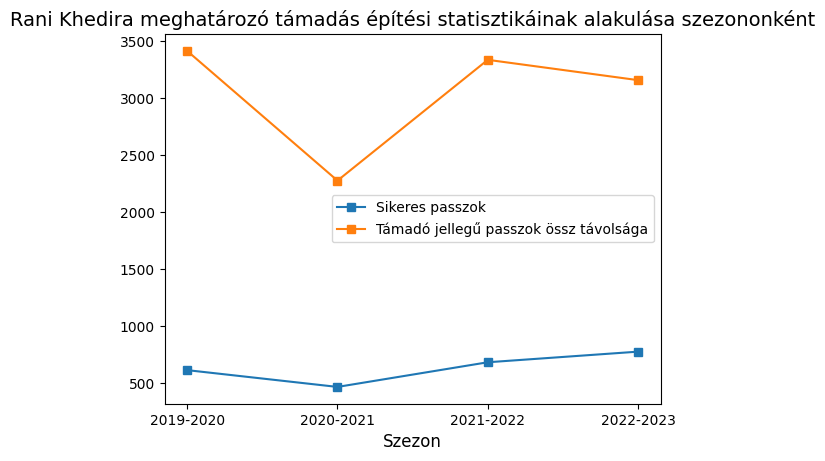

In [319]:
#Rani Khedira - támadás építés

BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Khedira=pd.concat([BL2023,BL2022,BL2021,BL2020], ignore_index=True)
Khedira=Khedira[Khedira["Player"]=="Rani Khedira"]
Khedira=Khedira[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Khedira["Cmp"])
PrgDist = np.array(Khedira["PrgDist"])

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Rani Khedira meghatározó támadás építési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

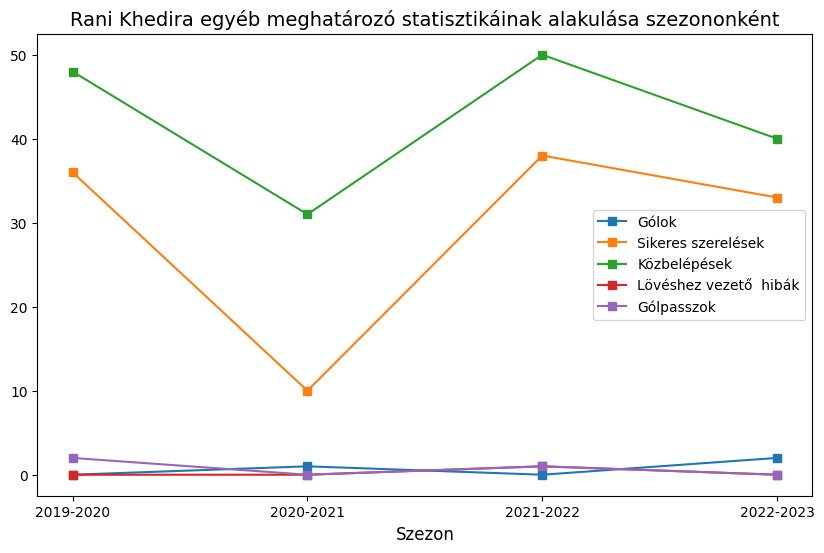

In [320]:
#Rani Khedira - Egyéb statisztikák
BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Khedira=pd.concat([BL2023,BL2022,BL2021,BL2020], ignore_index=True)
Khedira=Khedira[Khedira["Player"]=="Rani Khedira"]
Khedira=Khedira[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Khedira["TklW"])
Int = np.array(Khedira["Int"])
Err= np.array(Khedira["Err"])
Ast = np.array(Khedira["Ast"])
Gls = np.array(Khedira["Gls"])


plt.figure(figsize=(10, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Rani Khedira egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

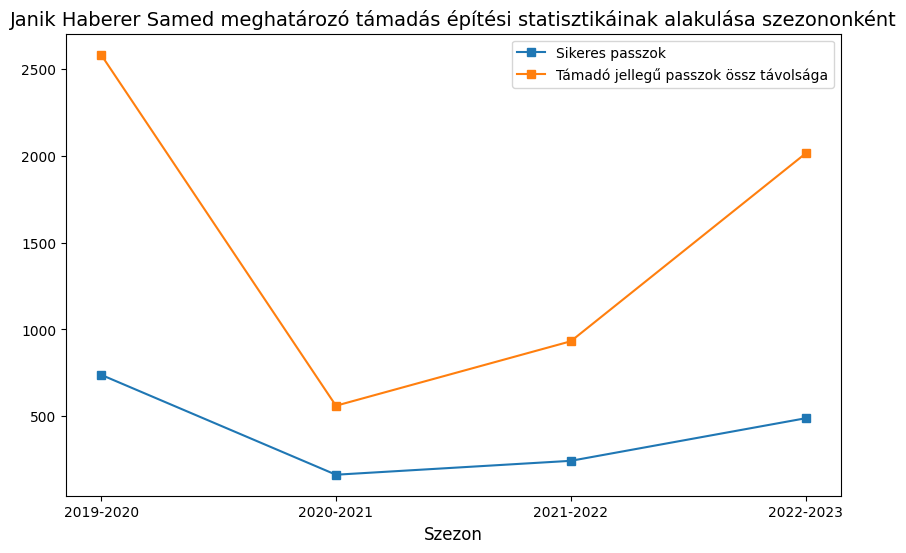

In [321]:
#Janik Haberer - támadás építés
BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Haberer=pd.concat([BL2023,BL2022,BL2021,BL2020], ignore_index=True)
Haberer=Haberer[Haberer["Player"]=="Janik Haberer"]
Haberer=Haberer[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Haberer["Cmp"])
PrgDist = np.array(Haberer["PrgDist"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Janik Haberer Samed meghatározó támadás építési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


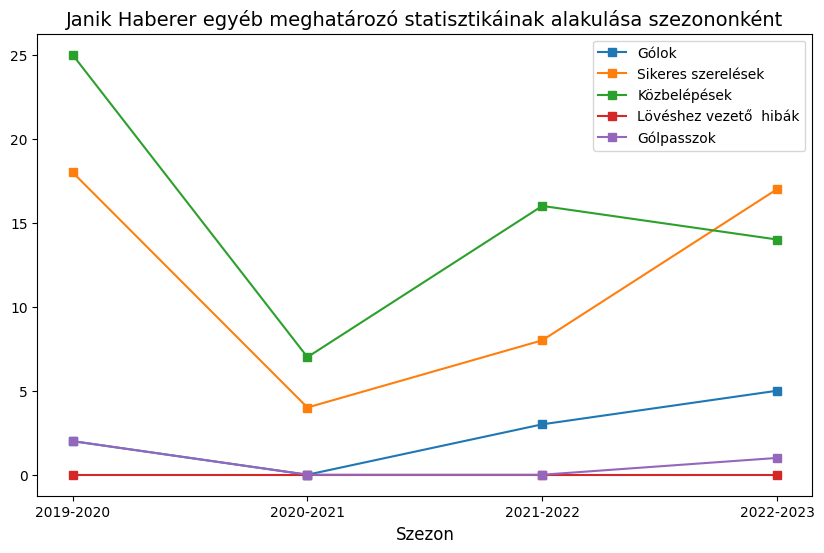

In [322]:
#Janik Haberer - Egyéb statisztikák
BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Haberer=pd.concat([BL2023,BL2022,BL2021,BL2020], ignore_index=True)
Haberer=Haberer[Haberer["Player"]=="Janik Haberer"]
Haberer=Haberer[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Haberer["TklW"])
Int = np.array(Haberer["Int"])
Err= np.array(Haberer["Err"])
Ast = np.array(Haberer["Ast"])
Gls = np.array(Haberer["Gls"])


plt.figure(figsize=(10, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Janik Haberer egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

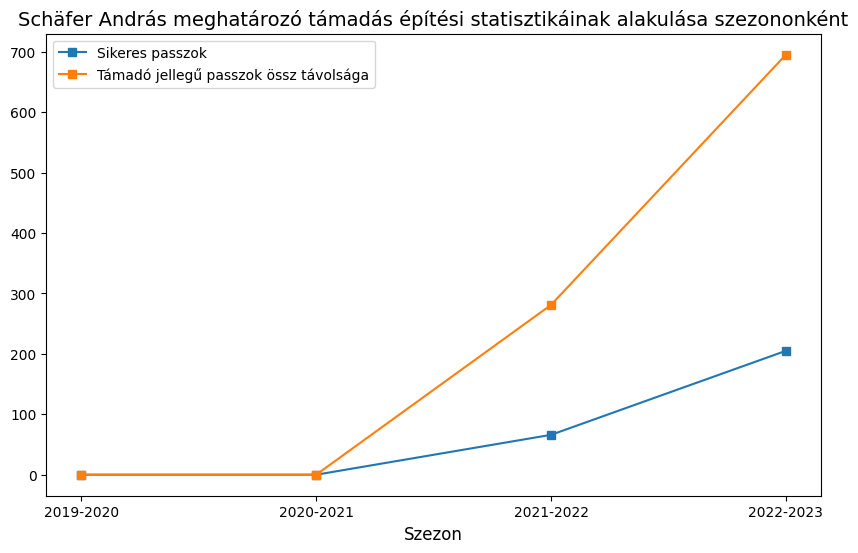

In [323]:
#András Schäfer - támadás építés
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Schäfer=pd.concat([BL2023,BL2022], ignore_index=True)
Schäfer=Schäfer[Schäfer["Player"]=="András Schäfer"]
Schäfer.loc[len(Schäfer)] = {'Gls': 0, 'Ast':0,'Season': "2020-2021","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}
Schäfer.loc[len(Schäfer)] = {'Gls': 0, 'Ast':0,'Season': "2019-2020","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}

Schäfer=Schäfer[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Schäfer["Cmp"])
PrgDist = np.array(Schäfer["PrgDist"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Schäfer András meghatározó támadás építési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

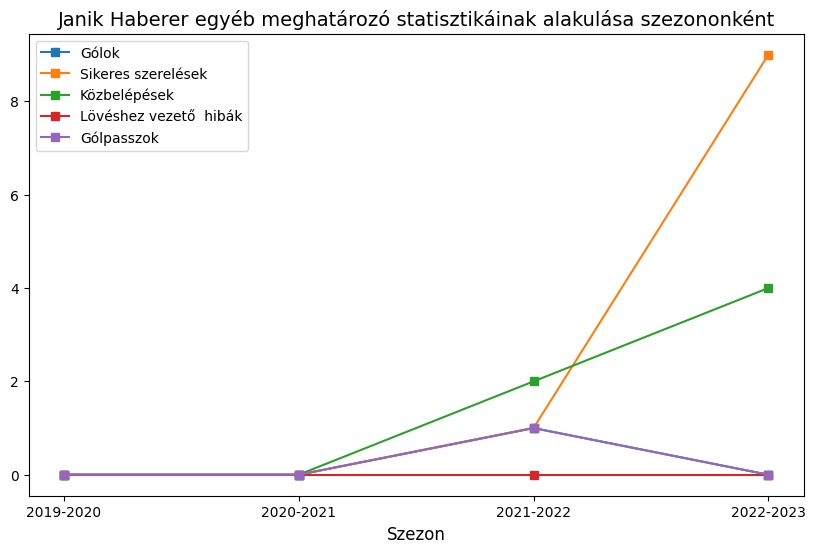

In [324]:
#András Schäfer - Egyéb statisztikák
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Schäfer=pd.concat([BL2023,BL2022], ignore_index=True)
Schäfer=Schäfer[Schäfer["Player"]=="András Schäfer"]
Schäfer.loc[len(Schäfer)] = {'Gls': 0, 'Ast':0,'Season': "2020-2021","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}
Schäfer.loc[len(Schäfer)] = {'Gls': 0, 'Ast':0,'Season': "2019-2020","TklW":0,"Err":0,"Cmp":0,"PrgDist":0,"Int":0}

Schäfer=Schäfer[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Schäfer["TklW"])
Int = np.array(Schäfer["Int"])
Err= np.array(Schäfer["Err"])
Ast = np.array(Schäfer["Ast"])
Gls = np.array(Schäfer["Gls"])


plt.figure(figsize=(10, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Janik Haberer egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

In [325]:
Schäfer

,Gls,Ast,Season,TklW,Err,Cmp,PrgDist,Int
3,0.0,0.0,2019-2020,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,2020-2021,0.0,0.0,0.0,0.0,0.0
762,1.0,1.0,2021-2022,1.0,0.0,66.0,281.0,2.0
109,0.0,0.0,2022-2023,9.0,0.0,205.0,695.0,4.0


Az Union középpályási hatalmas fejlődést produkáltak a szezonok során így kialakult egy erős tengely a csapat középpályáján.

######Védők

In [326]:
Union2023=BL2023[BL2023["Team"]=="Union Berlin"]
Union2023_df=Union2023[Union2023['Pos']=="DF"]
#Union2023_df=Union2023_df[Union2023['Starts']>=12]
Union2023_df


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
95,Robin Knoche,de GER,DF,30.0,32,32,2873.0,31.9,2.0,3.0,...,140.0,0.0,55.0,56.0,49.5,2022-2023,Union Berlin,Bundesliga,Robin Knoche(Union Berlin),2022-2023(Robin Knoche)
98,Diogo Leite,pt POR,DF,23.0,28,26,2254.0,25.0,0.0,1.0,...,99.0,1.0,70.0,50.0,58.3,2022-2023,Union Berlin,Bundesliga,Diogo Leite(Union Berlin),2022-2023(Diogo Leite)
99,Danilho Doekhi,nl NED,DF,24.0,25,25,2216.0,24.6,5.0,1.0,...,93.0,0.0,61.0,49.0,55.5,2022-2023,Union Berlin,Bundesliga,Danilho Doekhi(Union Berlin),2022-2023(Danilho Doekhi)
100,Christopher Trimmel,at AUT,DF,35.0,25,20,1811.0,20.1,0.0,6.0,...,48.0,0.0,23.0,19.0,54.8,2022-2023,Union Berlin,Bundesliga,Christopher Trimmel(Union Berlin),2022-2023(Christopher Trimmel)
103,Niko Gießelmann,de GER,DF,30.0,26,14,1302.0,14.5,0.0,2.0,...,28.0,0.0,21.0,18.0,53.8,2022-2023,Union Berlin,Bundesliga,Niko Gießelmann(Union Berlin),2022-2023(Niko Gießelmann)
104,Paul Jaeckel,de GER,DF,24.0,16,13,1196.0,13.3,1.0,0.0,...,44.0,1.0,19.0,22.0,46.3,2022-2023,Union Berlin,Bundesliga,Paul Jaeckel(Union Berlin),2022-2023(Paul Jaeckel)
105,Julian Ryerson,no NOR,DF,24.0,13,12,1037.0,11.5,0.0,0.0,...,19.0,0.0,5.0,11.0,31.3,2022-2023,Union Berlin,Bundesliga,Julian Ryerson(Union Berlin),2022-2023(Julian Ryerson)
106,Jérôme Roussillon,fr FRA,DF,29.0,16,11,957.0,10.6,0.0,2.0,...,22.0,0.0,6.0,11.0,35.3,2022-2023,Union Berlin,Bundesliga,Jérôme Roussillon(Union Berlin),2022-2023(Jérôme Roussillon)
108,Josip Juranović,hr CRO,DF,26.0,12,10,935.0,10.4,2.0,1.0,...,22.0,1.0,3.0,7.0,30.0,2022-2023,Union Berlin,Bundesliga,Josip Juranović(Union Berlin),2022-2023(Josip Juranović)
111,Timo Baumgartl,de GER,DF,26.0,8,6,562.0,6.2,0.0,1.0,...,14.0,0.0,19.0,10.0,65.5,2022-2023,Union Berlin,Bundesliga,Timo Baumgartl(Union Berlin),2022-2023(Timo Baumgartl)


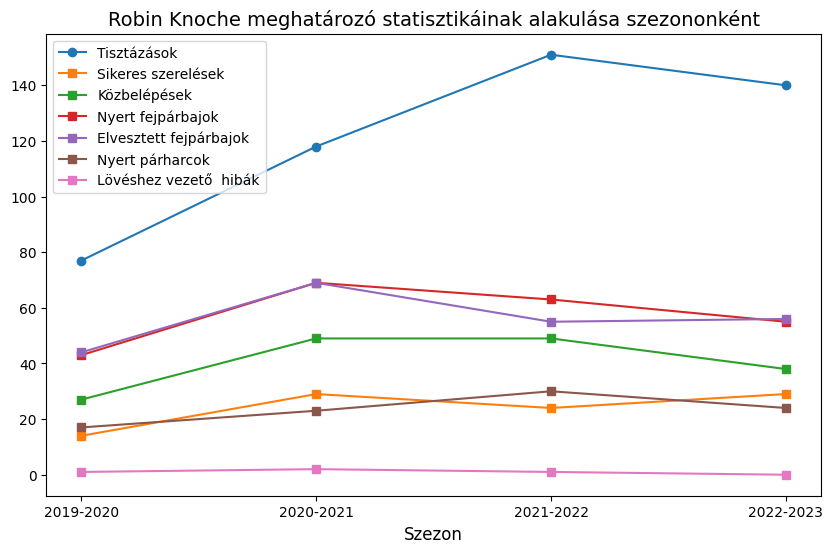

In [327]:
#Robin Knoche
BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Knoche=pd.concat([BL2023,BL2022,BL2021,BL2020], ignore_index=True)
Knoche=Knoche[Knoche["Player"]=="Robin Knoche"]
Knoche=Knoche[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Knoche["Clr"])
TklW = np.array(Knoche["TklW"])
Int = np.array(Knoche["Int"])
Challenges_Tkl=np.array(Knoche["Challenges_Tkl"])
Won = np.array(Knoche["Won"])
Lost = np.array(Knoche["Lost"])
Err= np.array(Knoche["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Robin Knoche meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()



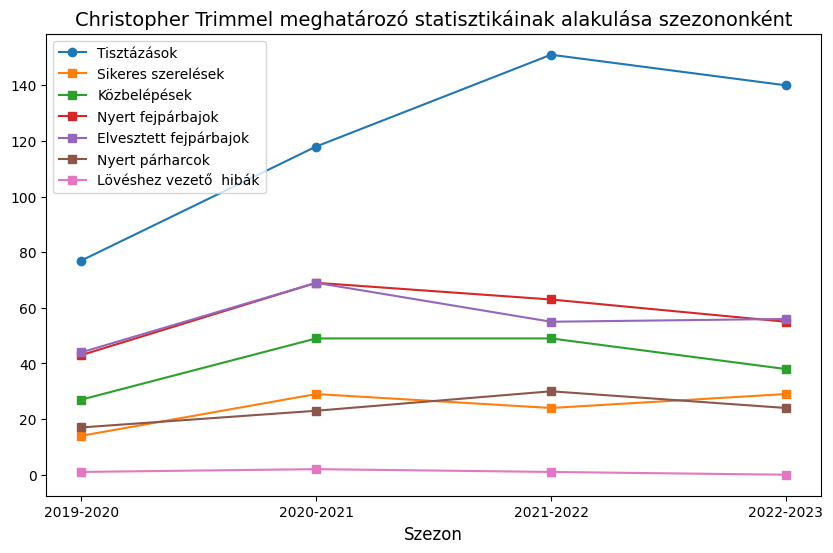

In [328]:
#Christopher Trimmel

Trimmel=BL[BL["Player"]=="Christopher Trimmel"]
Trimmel=Trimmel[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Knoche["Clr"])
TklW = np.array(Knoche["TklW"])
Int = np.array(Knoche["Int"])
Challenges_Tkl=np.array(Knoche["Challenges_Tkl"])
Won = np.array(Knoche["Won"])
Lost = np.array(Knoche["Lost"])
Err= np.array(Knoche["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Christopher Trimmel meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


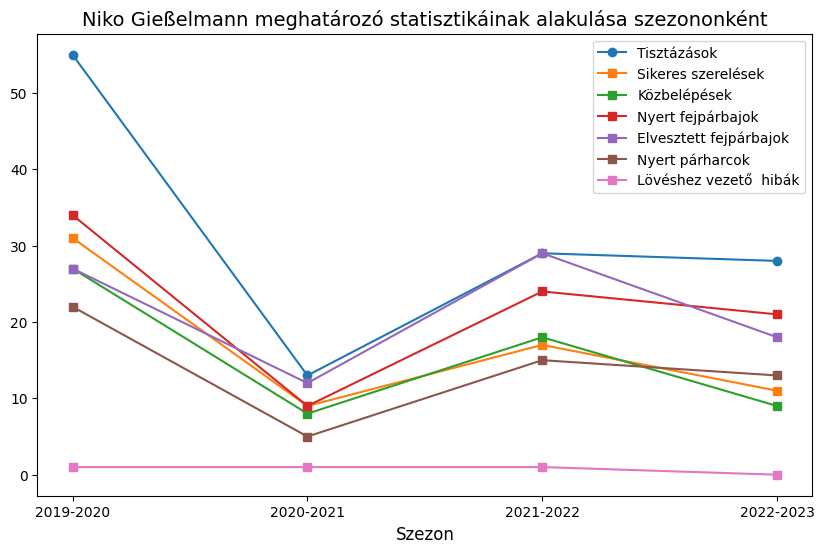

In [329]:
#Niko Gießelmann
BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Gießelmann=pd.concat([BL2023,BL2022,BL2021,BL2020], ignore_index=True)
Gießelmann=Gießelmann[Gießelmann["Player"]=="Niko Gießelmann"]
Gießelmann=Gießelmann[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Gießelmann["Clr"])
TklW = np.array(Gießelmann["TklW"])
Int = np.array(Gießelmann["Int"])
Challenges_Tkl=np.array(Gießelmann["Challenges_Tkl"])
Won = np.array(Gießelmann["Won"])
Lost = np.array(Gießelmann["Lost"])
Err= np.array(Gießelmann["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Niko Gießelmann meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


A védők tekintetében olyanokat vizsgáltam akik több szezont is lejátszottak a bajnokságban, és többüknél is nagy formjavulás figyelhető meg, ezen felül az új igazolások, Diogo Leite és Danilo Doekhi is jó teljesítménnyel rukkoltak elő, így a védelmét egyértelműen jól erősítették meg a csapatnak.

######Kapus(ok)

In [330]:
Union2023=BL2023[BL2023["Team"]=="Union Berlin"]
Union2023_gk=Union2023[Union2023['Pos']=="GK"]
Union2023_gk=Union2023_gk[Union2023['Starts']>=12]
Union2023_gk

<ipython-input-330-fa2ab1d8b7c9>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Union2023_gk=Union2023_gk[Union2023['Starts']>=12]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
97,Frederik Rønnow,dk DEN,GK,29.0,29,29,2610.0,29.0,0.0,1.0,...,9.0,1.0,10.0,2.0,83.3,2022-2023,Union Berlin,Bundesliga,Frederik Rønnow(Union Berlin),2022-2023(Frederik Rønnow)


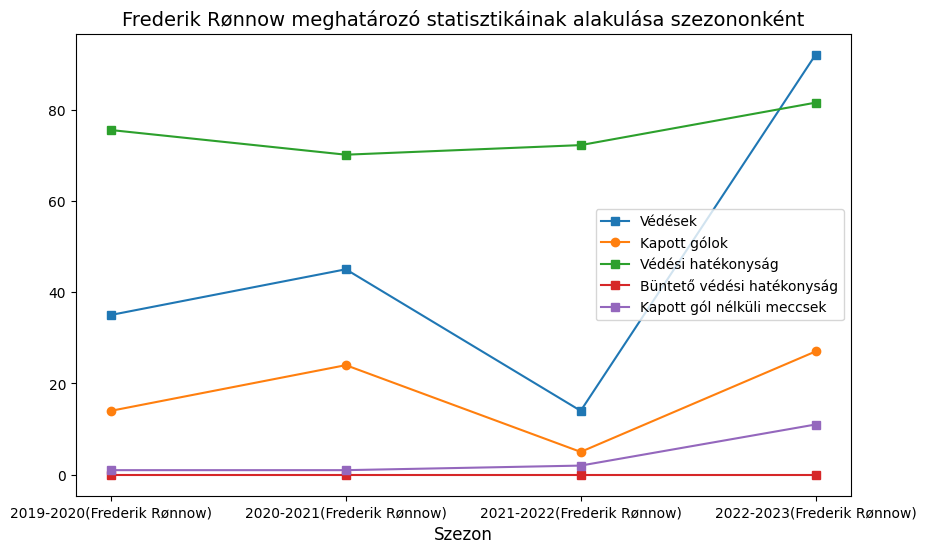

In [331]:
#Frederik Rønnow
BL2020=BL[BL["Season"]=="2019-2020"]
BL2021=BL[BL["Season"]=="2020-2021"]
Ronnow2021=BL[BL["Team"]=="Schalke 04"]
Ronnow2021=Ronnow2021[Ronnow2021["Player"]=="Frederik Rønnow"]
BL2022=BL[BL["Season"]=="2021-2022"]
BL2023=BL[BL["Season"]=="2022-2023"]
Rønnow=pd.concat([BL2023,BL2022,Ronnow2021,BL2020], ignore_index=True)
Rønnow=Rønnow[Rønnow["Player"]=="Frederik Rønnow"]
Rønnow=Rønnow[["Player","GA","Saves","Save%","PK_Save%","CS","Season","MP","Season(Player)"]].sort_values(by='Season(Player)', ascending=True)

GA = np.array(Rønnow["GA"])
Save = np.array(Rønnow["Save%"])
PK_Save = np.array(Rønnow["PK_Save%"])
CS=np.array(Rønnow["CS"])
Saves = np.array(Rønnow["Saves"])

plt.figure(figsize=(10, 6))
plt.plot(Rønnow["Season(Player)"], Saves, label='Védések', marker='s')
plt.plot(Rønnow["Season(Player)"], GA, label='Kapott gólok', marker='o')
plt.plot(Rønnow["Season(Player)"], Save, label='Védési hatékonyság', marker='s')
plt.plot(Rønnow["Season(Player)"], PK_Save, label='Büntető védési hatékonyság', marker='s')
plt.plot(Rønnow["Season(Player)"], CS, label='Kapott gól nélküli meccsek', marker='s')


plt.title('Frederik Rønnow meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


A 2020-2021-es szezonban Ronnow kapus 2 csapatban is szerepelt, de az egyikben nem játszott így a másikat, a Schalke 04 csapatát vettem figyelembe. Egyébként az ő teljesítményén is jelentő javulást lehet felfedezni

######**ÖSSZEGZÉS**
Összességében elmondható, hogy az Union Berlin a 2022-2023-as szezonban nyújtott kimagasló teljesítményét főként középpályásainak, védőinek és kapusának kiváló teljesítménye eredményezte, jól látható ugyanis hogy a legtöbb, fontos védelmi mutatóban nagyot javult a csapat.

##LaLiga

###.csv file beolvasása és utótisztítása

In [227]:
LL=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/LaLiga_vegleges.csv")

In [228]:
del LL["Unnamed: 0"]

In [229]:
pd.isnull(LL).sum()

Player                   0
Nation                  13
Pos                      2
Age                      2
MP                       0
Starts                   0
Min                    580
90s                    576
Gls                    575
Ast                    576
G+A                    576
G-PK                   575
Penalty_Kicks_Made     575
PKatt                  575
CrdY                   576
CrdR                   576
xG                     588
npxG                   588
xAG                    588
npxG.1                 588
GA                    3272
SoTA                  3271
Saves                 3271
Save%                 3274
PK_Save%              3334
CS                    3272
CS%                   3279
Sh                     580
SoT                    580
SoT%                  1084
G/Sh                  1084
Dist                  1090
Cmp                    589
Att                    589
Cmp%                   603
TotDist                589
PrgDist                589
x

In [230]:
LL[pd.isnull(LL["Nation"])][["Player","Nation"]]

,Player,Nation
309,Marcos Fernández Cózar,NaN
487,Blanco,NaN
533,Santiago García,NaN
547,Hugo Guillamón,NaN
754,Blanco,NaN
1036,Hugo Guillamón,NaN
1326,Marcos Fernández Cózar,NaN
1454,Mamadou N'Diaye,NaN
1486,Oscar Medina,NaN
1550,Blanco,NaN


In [231]:
LL=LL[LL["Player"]!="Marcos Fernández Cózar"]
LL=LL[LL["Player"]!="Blanco"]
LL=LL[LL["Player"]!="Santiago García"]
LL=LL[LL["Player"]!="Hugo Guillamón"]
LL=LL[LL["Player"]!="Mamadou N'Diaye"]
LL=LL[LL["Player"]!="Oscar Medina"]
LL=LL[LL["Player"]!="Ricardo Visus"]

In [232]:
pd.isnull(LL).sum()

Player                   0
Nation                   0
Pos                      1
Age                      1
MP                       0
Starts                   0
Min                    574
90s                    570
Gls                    569
Ast                    570
G+A                    570
G-PK                   569
Penalty_Kicks_Made     569
PKatt                  569
CrdY                   570
CrdR                   570
xG                     574
npxG                   574
xAG                    574
npxG.1                 574
GA                    3258
SoTA                  3257
Saves                 3257
Save%                 3260
PK_Save%              3320
CS                    3258
CS%                   3265
Sh                     574
SoT                    574
SoT%                  1075
G/Sh                  1075
Dist                  1076
Cmp                    575
Att                    575
Cmp%                   589
TotDist                575
PrgDist                575
x

In [233]:
LL[pd.isnull(LL["Pos"])][["Player","Pos"]]

,Player,Pos
1489,Iván Sanz,NaN


In [234]:
LL=LL[LL["Player"]!="Iván Sanz"]

In [235]:
LL[pd.isnull(LL["Age"])][["Player","Age"]]

,Player,Age
3455,Javito Lopez,NaN


In [236]:
LL=LL[LL["Player"]!="Javito Lopez"]

In [237]:
LL=LL.fillna(0)

In [238]:
pd.isnull(LL).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [239]:
#A későbbi kimutatások miatt hozzáadtam 2 új oszlopot
LL["Player(Team)"]=LL["Player"]+ "(" + LL["Team"] + ")"
LL["Season(Player)"]=LL["Season"]+ "(" + LL["Player"] + ")"

In [240]:
LL.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Marc-André ter Stegen,de GER,GK,30.0,38,38,3347.0,37.2,0.0,0.0,...,7.0,3.0,6.0,1.0,85.7,2022-2023,Barcelona,La Liga,Marc-André ter Stegen(Barcelona),2022-2023(Marc-André ter Stegen)
1,Robert Lewandowski,pl POL,FW,33.0,34,33,2847.0,31.6,23.0,7.0,...,14.0,0.0,52.0,45.0,53.6,2022-2023,Barcelona,La Liga,Robert Lewandowski(Barcelona),2022-2023(Robert Lewandowski)
2,Gavi,es ESP,"MF,FW",17.0,36,30,2531.0,28.1,2.0,4.0,...,22.0,0.0,39.0,33.0,54.2,2022-2023,Barcelona,La Liga,Gavi(Barcelona),2022-2023(Gavi)
3,Alejandro Balde,es ESP,DF,18.0,33,30,2471.0,27.5,1.0,6.0,...,17.0,1.0,19.0,18.0,51.4,2022-2023,Barcelona,La Liga,Alejandro Balde(Barcelona),2022-2023(Alejandro Balde)
4,Frenkie de Jong,nl NED,MF,25.0,33,29,2534.0,28.2,2.0,4.0,...,22.0,1.0,32.0,15.0,68.1,2022-2023,Barcelona,La Liga,Frenkie de Jong(Barcelona),2022-2023(Frenkie de Jong)


In [241]:
LL.columns

Index(['Player', 'Nation', 'Pos', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'npxG.1', 'GA', 'SoTA', 'Saves', 'Save%',
       'PK_Save%', 'CS', 'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp',
       'Att', 'Cmp%', 'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl',
       'TklW', 'Tkl%', 'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%',
       'Season', 'Team', 'Competition', 'Player(Team)', 'Season(Player)'],
      dtype='object')

###2022-2023
####A 2022-2023-as szezon statisztikái, azok elemzése.



####A dataframe statisztikáinak elemzése, összehasonlítások, rangsorolások

In [242]:
LL2023=LL[LL["Season"]=="2022-2023"]
LL2023


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Marc-André ter Stegen,de GER,GK,30.0,38,38,3347.0,37.2,0.0,0.0,...,7.0,3.0,6.0,1.0,85.7,2022-2023,Barcelona,La Liga,Marc-André ter Stegen(Barcelona),2022-2023(Marc-André ter Stegen)
1,Robert Lewandowski,pl POL,FW,33.0,34,33,2847.0,31.6,23.0,7.0,...,14.0,0.0,52.0,45.0,53.6,2022-2023,Barcelona,La Liga,Robert Lewandowski(Barcelona),2022-2023(Robert Lewandowski)
2,Gavi,es ESP,"MF,FW",17.0,36,30,2531.0,28.1,2.0,4.0,...,22.0,0.0,39.0,33.0,54.2,2022-2023,Barcelona,La Liga,Gavi(Barcelona),2022-2023(Gavi)
3,Alejandro Balde,es ESP,DF,18.0,33,30,2471.0,27.5,1.0,6.0,...,17.0,1.0,19.0,18.0,51.4,2022-2023,Barcelona,La Liga,Alejandro Balde(Barcelona),2022-2023(Alejandro Balde)
4,Frenkie de Jong,nl NED,MF,25.0,33,29,2534.0,28.2,2.0,4.0,...,22.0,1.0,32.0,15.0,68.1,2022-2023,Barcelona,La Liga,Frenkie de Jong(Barcelona),2022-2023(Frenkie de Jong)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
723,Jesús López,es ESP,GK,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Elche,La Liga,Jesús López(Elche),2022-2023(Jesús López)
724,Rodrigo Mendoza,es ESP,MF,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Elche,La Liga,Rodrigo Mendoza(Elche),2022-2023(Rodrigo Mendoza)
725,Juan Navarro,es ESP,GK,23.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Elche,La Liga,Juan Navarro(Elche),2022-2023(Juan Navarro)
726,Javi Pamies,es ESP,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2022-2023,Elche,La Liga,Javi Pamies(Elche),2022-2023(Javi Pamies)


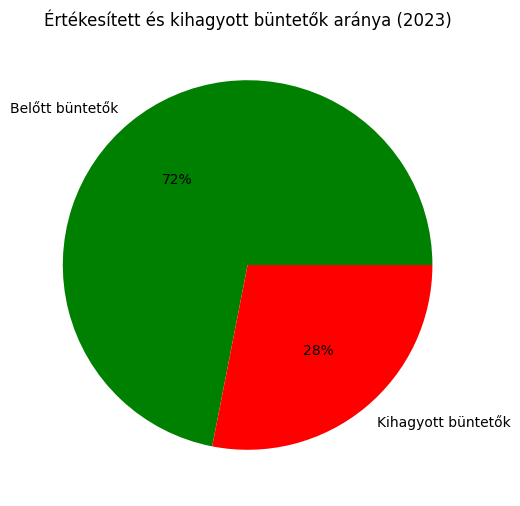

In [243]:
#Értékesített és kihagyott büntetők aránya
LL_Pen_Attempted_2023=LL2023["PKatt"].sum()
LL_Pen_Scored_2023=LL2023["Penalty_Kicks_Made"].sum()
LL_Pen_Missed_2023=LL_Pen_Attempted_2023-LL_Pen_Scored_2023

plt.figure(figsize=(13,6))
plt.title("Értékesített és kihagyott büntetők aránya (2023)")
data=[LL_Pen_Scored_2023,LL_Pen_Missed_2023]
colors=["green","red"]
labels=["Belőtt büntetők","Kihagyott büntetők"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()


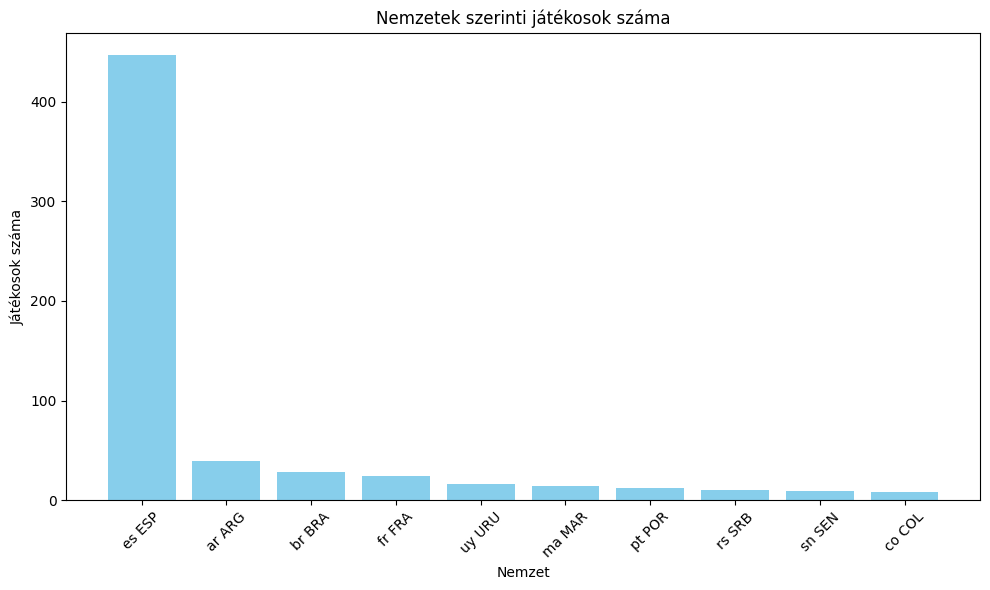

In [244]:
#Top 10 legtöbb játékost adó nemzet (2023)
jatekosok_szama = LL2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")

# Oszlopdiagram létrehozáLL
plt.figure(figsize=(10, 6))
plt.bar(top_10_nemzet['Nation'], top_10_nemzet['Játékosok száma'], color='skyblue')
plt.xlabel('Nemzet')
plt.ylabel('Játékosok száma')
plt.title('Nemzetek szerinti játékosok száma')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



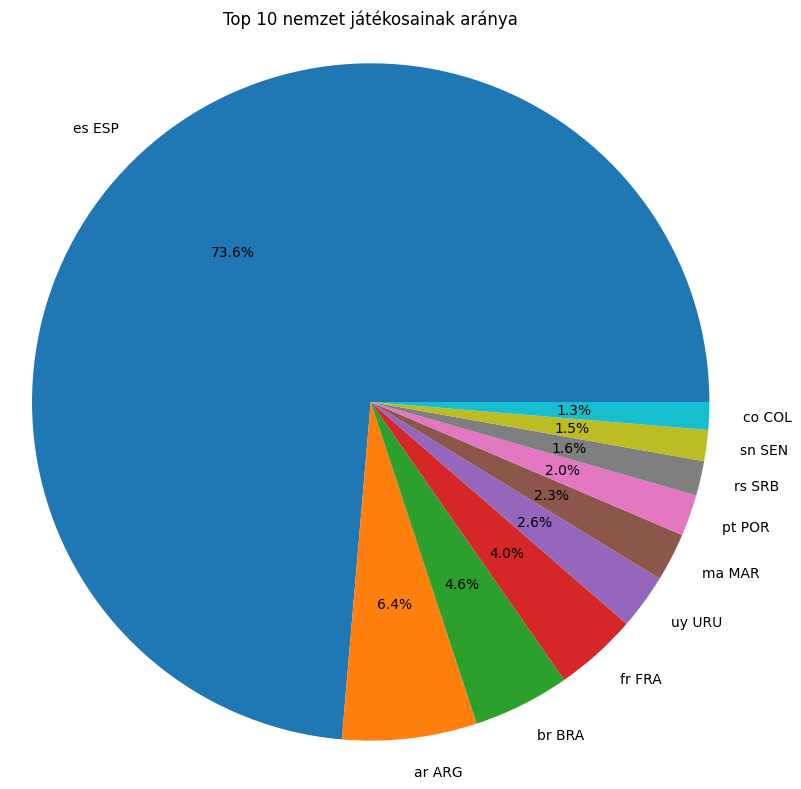

In [245]:
#Az előző kimutatás csak kördiagrammal
jatekosok_szama = LL2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")
plt.figure(figsize=(8, 8))
plt.pie(top_10_nemzet['Játékosok száma'], labels=top_10_nemzet['Nation'], autopct='%1.1f%%')
plt.title('Top 10 nemzet játékosainak aránya')
plt.axis('equal')
plt.tight_layout()
plt.show()


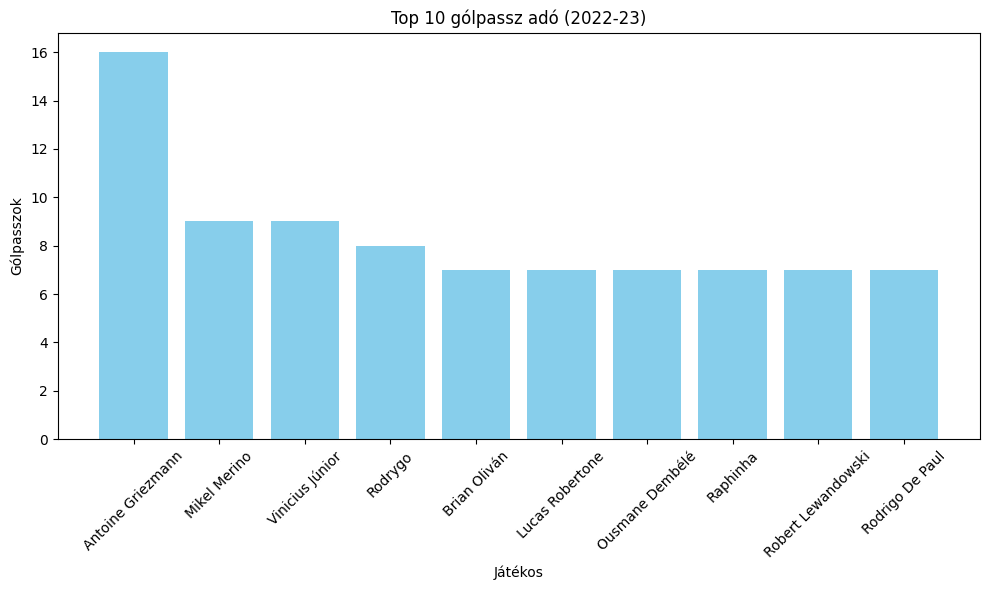

In [246]:
#Top 10 gólpassz adó
top_10_gólpassz_adó_2023_LL = LL2023.groupby('Player')["Ast"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_gólpassz_adó_2023_LL['Player'], top_10_gólpassz_adó_2023_LL['Ast'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


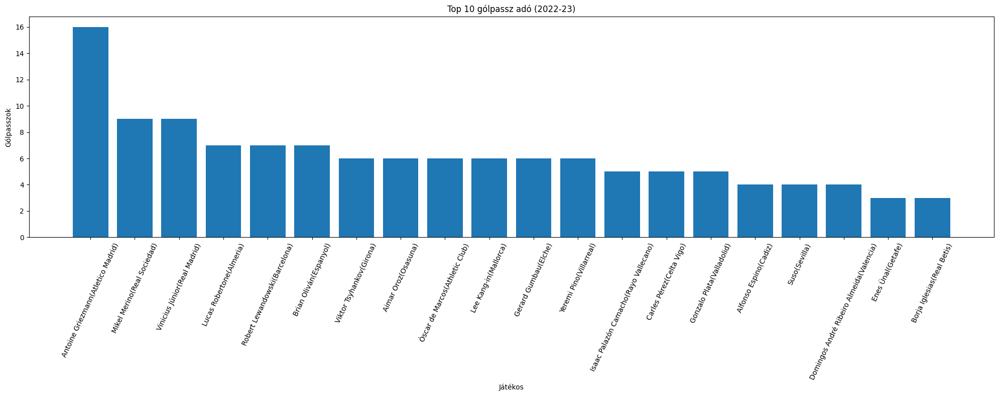

In [247]:
#Legjobb gólpassz adók csapatonként
legjobb_golpassz_adok_csapatonként = LL2023.groupby('Team').apply(lambda x: x.nlargest(1, 'Ast')).reset_index(drop=True)
legjobb_golpassz_adok_csapatonként=legjobb_golpassz_adok_csapatonként.sort_values(by="Ast",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(legjobb_golpassz_adok_csapatonként['Player(Team)'], legjobb_golpassz_adok_csapatonként['Ast'])
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()


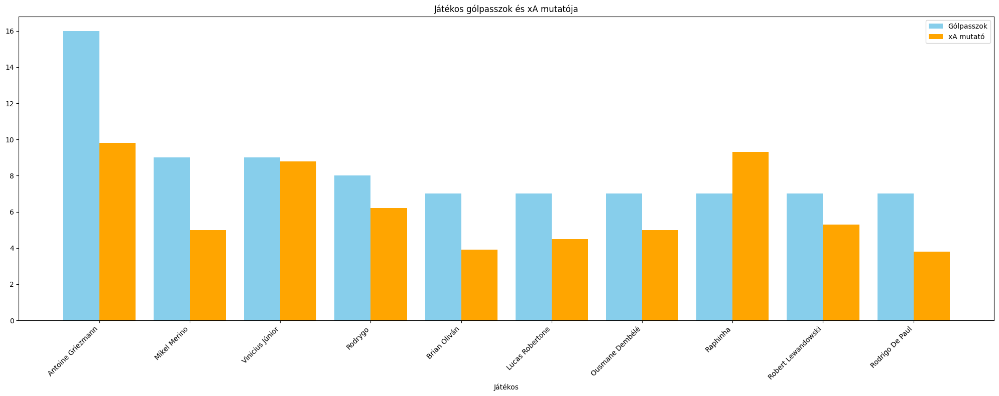

In [248]:
#Top 10 gólpasssz adó és hogy hány gólpasszuknak kellett volna lennie (xA)
gp_xA_2023_LL = LL2023.groupby('Player').agg({"Ast":'sum','xA':'sum'}).nlargest(10,'Ast').reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(20, 8))
bar_width = 0.4
index = range(len(gp_xA_2023_LL))
plt.bar(index, gp_xA_2023_LL['Ast'], bar_width, color='skyblue', label='Gólpasszok')
plt.bar([i + bar_width for i in index], gp_xA_2023_LL['xA'], bar_width, color='orange', label='xA mutató')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Játékos gólpasszok és xA mutatója')
plt.xticks([i + bar_width/2 for i in index], gp_xA_2023_LL['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


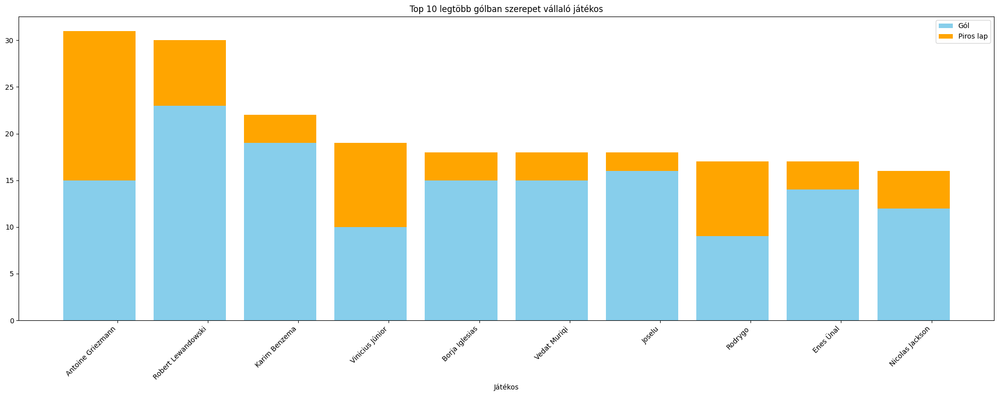

In [249]:
#Top 10 legtöbb gólban szerepet vállaló játékos
top10_ga_LL2023=LL2023.nlargest(10,"G+A")
top10_ga_LL2023=top10_ga_LL2023.sort_values(by="G+A",ascending=False)

plt.figure(figsize=(20, 8))
plt.bar(top10_ga_LL2023["Player"], top10_ga_LL2023['Gls'], color='skyblue', label='Gól')
plt.bar(top10_ga_LL2023["Player"], top10_ga_LL2023['Ast'], bottom=top10_ga_LL2023['Gls'], color='orange', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb gólban szerepet vállaló játékos')
plt.xticks([i + bar_width/2 for i in index], top10_ga_LL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


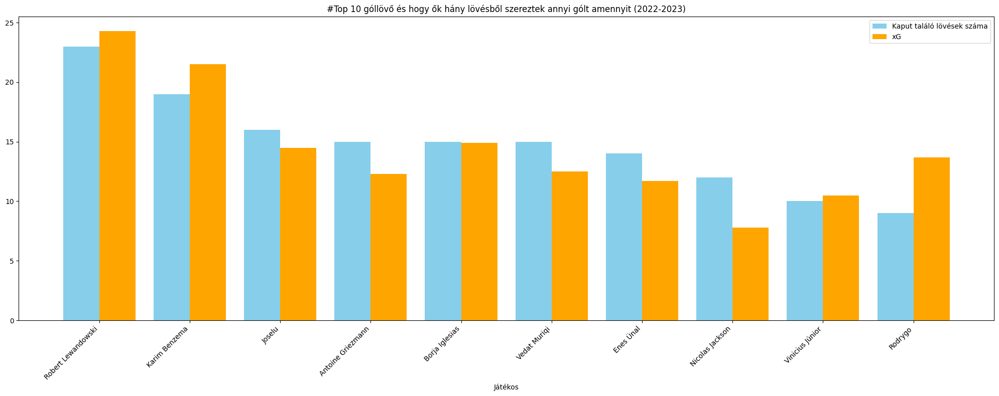

In [250]:
#Top 10 góllövő és hogy ők hány gólt kellett vna szerezniük (xG).
top10_scorer_LL2023=LL2023.nlargest(10,"Gls")
top10_scorer_LL2023=top10_ga_LL2023.sort_values(by="Gls",ascending=False)

plt.figure(figsize=(20, 8))
bar_width = 0.4
index = range(len(top10_scorer_LL2023))
plt.bar(index, top10_scorer_LL2023['Gls'], bar_width, color='skyblue', label='Kaput találó lövések száma')
plt.bar([i + bar_width for i in index], top10_scorer_LL2023['xG'], bar_width, color='orange', label='xG')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_scorer_LL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


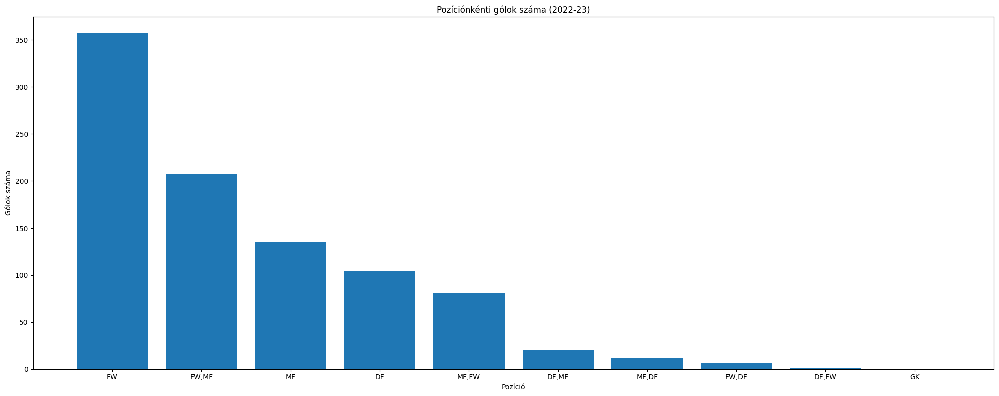

In [251]:
#Pozíciónkénti gólok száma
gls_per_pos_LL2023=LL2023.groupby('Pos')['Gls'].sum().reset_index()
gls_per_pos_LL2023=gls_per_pos_LL2023.sort_values(by="Gls",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(gls_per_pos_LL2023['Pos'], gls_per_pos_LL2023['Gls'])
plt.xlabel('Pozíció')
plt.ylabel('Gólok száma')
plt.title('Pozíciónkénti gólok száma (2022-23)')

plt.tight_layout()
plt.show()


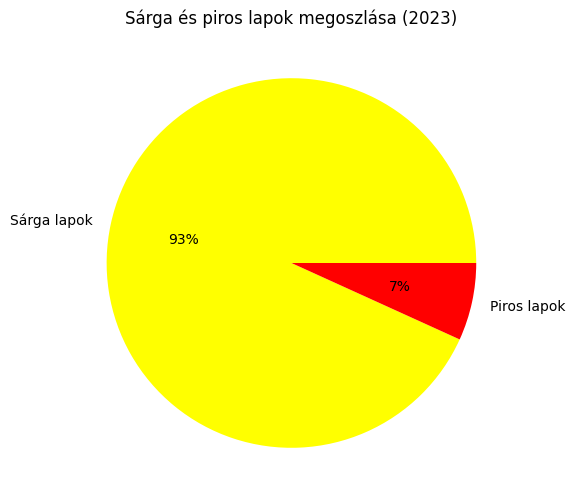

In [252]:
#Sárga és piros lapok megoszlása
yellow_LL2023=LL2023["CrdY"].sum()
red_LL2023=LL2023["CrdR"].sum()
plt.figure(figsize=(13,6))
plt.title("Sárga és piros lapok megoszlása (2023)")
data=[yellow_LL2023,red_LL2023]
colors=["yellow","red"]
labels=["Sárga lapok","Piros lapok"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()


<ipython-input-253-a9262148b9e9>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LL2023["cardssum"]=LL2023['CrdY']+LL2023['CrdR']


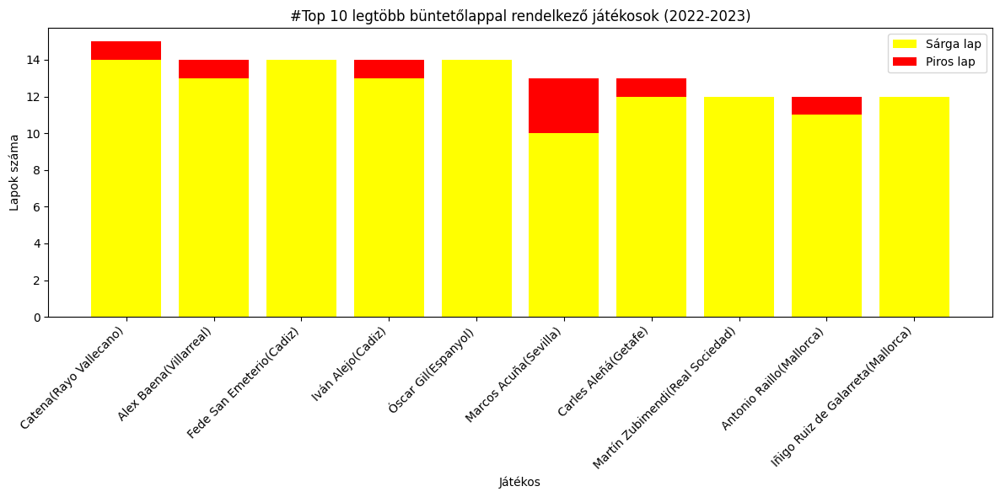

In [253]:
#Legtöbb büntetőlappal rendelkező játékosok
LL2023["cardssum"]=LL2023['CrdY']+LL2023['CrdR']
top10_carded_LL2023=LL2023.nlargest(10,"cardssum")
top10_carded_LL2023=top10_carded_LL2023.sort_values(by="cardssum",ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(top10_carded_LL2023["Player(Team)"], top10_carded_LL2023['CrdY'], color='yellow', label='Sárga lap')
plt.bar(top10_carded_LL2023["Player(Team)"], top10_carded_LL2023['CrdR'], bottom=top10_carded_LL2023['CrdY'], color='red', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('Lapok száma')
plt.title('#Top 10 legtöbb büntetőlappal rendelkező játékosok (2022-2023)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


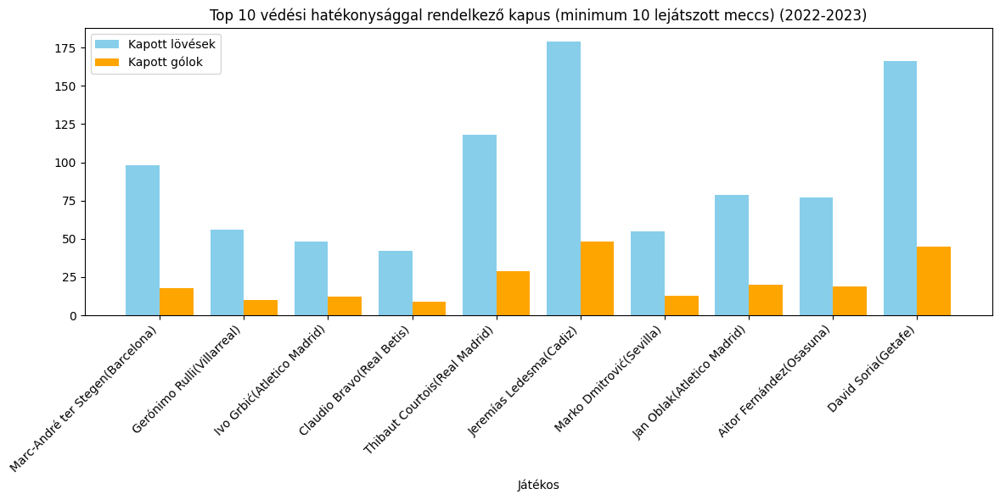

In [254]:
#Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_LL2023=LL2023[LL2023["Pos"]=="GK"]
KeepertoCompare_LL2023=Keepers_LL2023[Keepers_LL2023["MP"]>=10]
top10_savepercent_LL2023=KeepertoCompare_LL2023.nlargest(10,"Save%")
top10_savepercent_LL2023=top10_savepercent_LL2023.sort_values(by="Save%",ascending=False)

plt.figure(figsize=(12, 6))
bar_width = 0.4
index = range(len(top10_savepercent_LL2023))
plt.bar(index, top10_savepercent_LL2023['SoTA'], bar_width, color='skyblue', label='Kapott lövések')
plt.bar([i + bar_width for i in index], top10_savepercent_LL2023['GA'], bar_width, color='orange', label='Kapott gólok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_savepercent_LL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


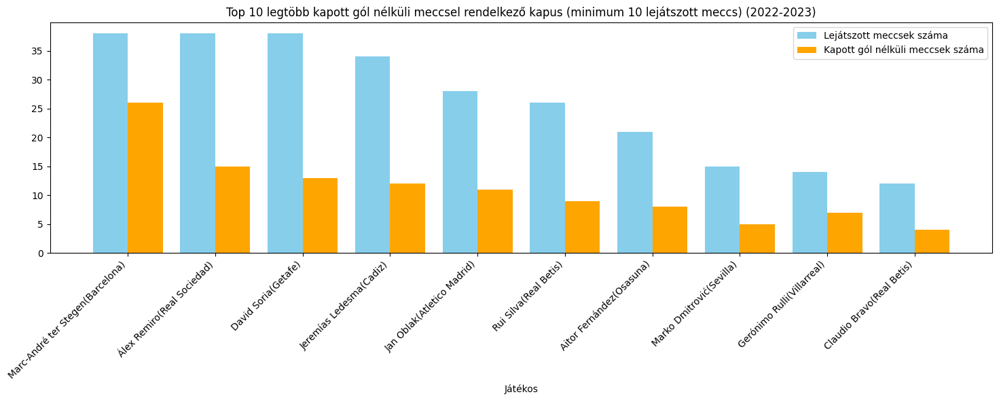

In [255]:
#Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_LL2023=LL2023[LL2023["Pos"]=="GK"]
KeepertoCompare_LL2023=Keepers_LL2023[Keepers_LL2023["MP"]>=10]
top10_cs_LL2023=KeepertoCompare_LL2023.nlargest(10,"CS%")
top10_cs_LL2023=top10_cs_LL2023.sort_values(by="MP",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_cs_LL2023))
plt.bar(index, top10_cs_LL2023['MP'], bar_width, color='skyblue', label='Lejátszott meccsek száma')
plt.bar([i + bar_width for i in index], top10_cs_LL2023['CS'], bar_width, color='orange', label='Kapott gól nélküli meccsek száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_cs_LL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


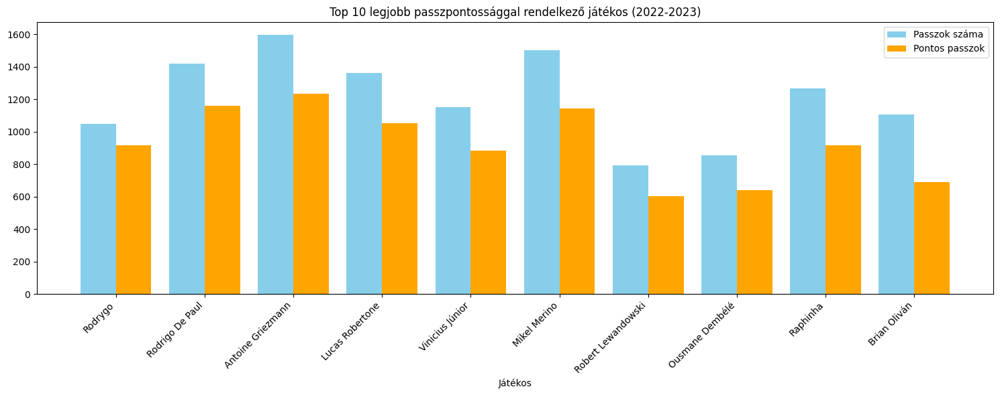

In [256]:
#Top 10 legjobb passzpontossággal rendelkező játékos
gp_pp_LL2023 = LL2023.groupby('Player').agg({"Ast":'sum','Att':'sum','Cmp':'sum','Cmp%':'sum'}).nlargest(10,'Ast').reset_index()
top10_pp_LL2023=gp_pp_LL2023.sort_values(by="Cmp%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_pp_LL2023))
plt.bar(index, top10_pp_LL2023['Att'], bar_width, color='skyblue', label='Passzok száma')
plt.bar([i + bar_width for i in index], top10_pp_LL2023['Cmp'], bar_width, color='orange', label='Pontos passzok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_pp_LL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-257-46167efd8859>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LL2023["Tkl_Tkl%"]=LL2023['TklW']/LL2023['Tkl']*100


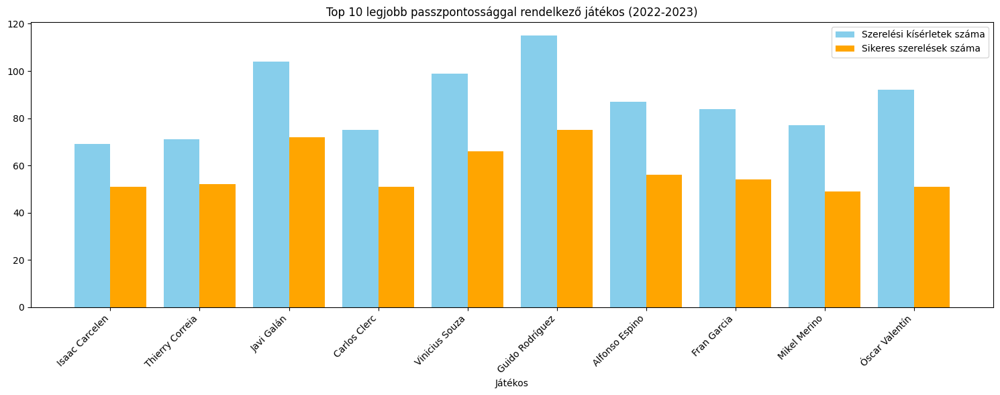

In [257]:
#Top 10 legjobban szerelő játékos
LL2023["Tkl_Tkl%"]=LL2023['TklW']/LL2023['Tkl']*100
top10_tkl_LL2023 = LL2023.groupby('Player').agg({"Tkl":'sum','TklW':'sum','Tkl_Tkl%':'sum'}).nlargest(10,'TklW').reset_index()
top10_tkl_LL2023 = top10_tkl_LL2023.sort_values(by="Tkl_Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_tkl_LL2023))
plt.bar(index, top10_tkl_LL2023['Tkl'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_tkl_LL2023['TklW'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_tkl_LL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


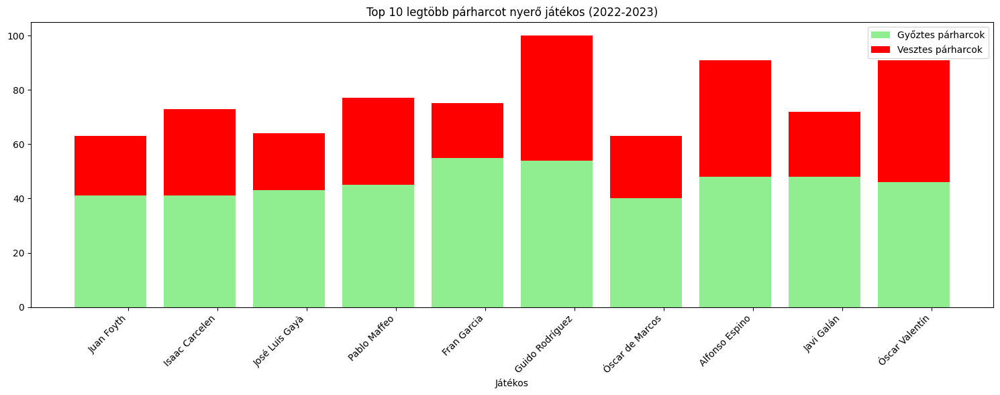

In [258]:
#Top 10 legtöbb párharcot nyerő játékos
top10_chl_LL2023 = LL2023.groupby('Player').agg({"Challenges_Tkl":'sum','Lost':'sum','Tkl%':'sum'}).nlargest(10,'Challenges_Tkl').reset_index()
top10_chl_LL2023 = top10_chl_LL2023.sort_values(by="Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_chl_LL2023["Player"], top10_chl_LL2023['Challenges_Tkl'], color='lightgreen', label='Győztes párharcok')
plt.bar(top10_chl_LL2023["Player"], top10_chl_LL2023['Lost'], bottom=top10_chl_LL2023['Challenges_Tkl'], color='red', label='Vesztes párharcok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb párharcot nyerő játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_chl_LL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()



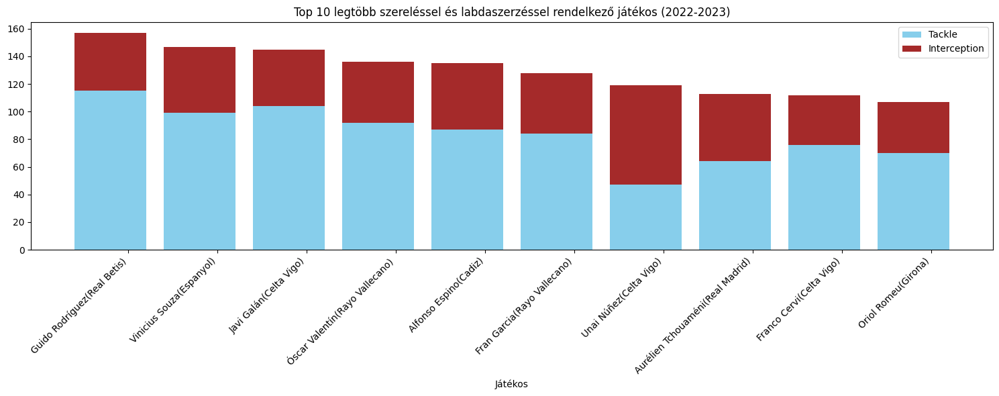

In [259]:
#Top 10 legtöbb párharcot nyerő játékos
top10_TklInt_LL2023 = LL2023.groupby('Player(Team)').agg({"Tkl":'sum','Int':'sum','Tkl+Int':'sum'}).nlargest(10,'Tkl+Int').reset_index()
top10_TklInt_LL2023 = top10_TklInt_LL2023.sort_values(by="Tkl+Int",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_TklInt_LL2023["Player(Team)"], top10_TklInt_LL2023['Tkl'], color='skyblue', label='Tackle')
plt.bar(top10_TklInt_LL2023["Player(Team)"], top10_TklInt_LL2023['Int'], bottom=top10_TklInt_LL2023['Tkl'], color='brown', label='Interception')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_TklInt_LL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


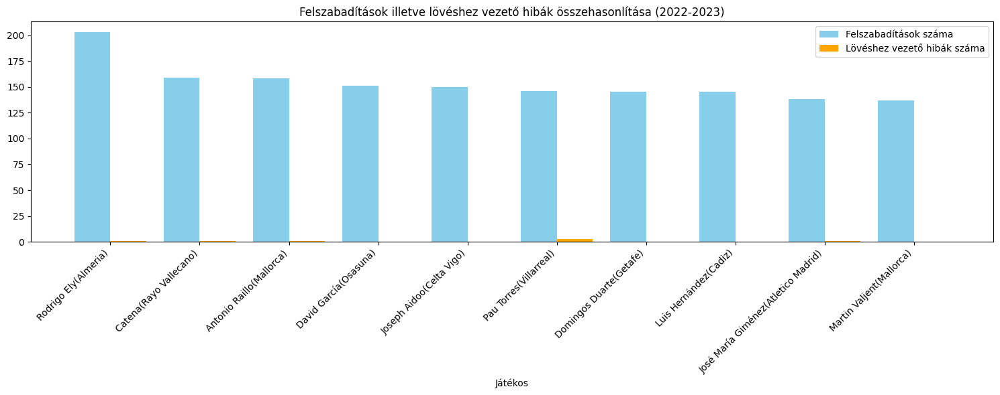

In [260]:
#Felszabadítások illetve lövéshez vezető hibák összehasonlítása


top10_clrerr_LL2023 = LL2023.groupby('Player(Team)').agg({"Clr":'sum','Err':'sum'}).nlargest(10,'Clr').reset_index()
top10_clrerr_LL2023 = top10_clrerr_LL2023.sort_values(by="Clr",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_clrerr_LL2023))
plt.bar(index, top10_clrerr_LL2023['Clr'], bar_width, color='skyblue', label='Felszabadítások száma')
plt.bar([i + bar_width for i in index], top10_clrerr_LL2023['Err'], bar_width, color='orange', label='Lövéshez vezető hibák száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_clrerr_LL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


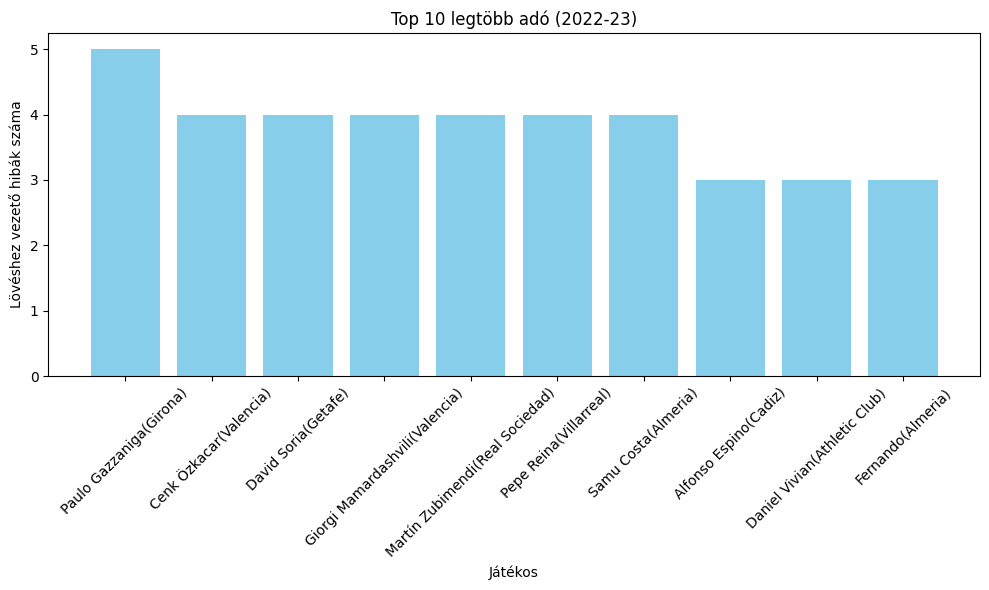

In [261]:
#Legtöbb lövéshez vezető hiát vétő játékosok
top_10_error_maker_LL2023 = LL2023.groupby('Player(Team)')["Err"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_error_maker_LL2023['Player(Team)'], top_10_error_maker_LL2023['Err'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Lövéshez vezető hibák száma')
plt.title('Top 10 legtöbb adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


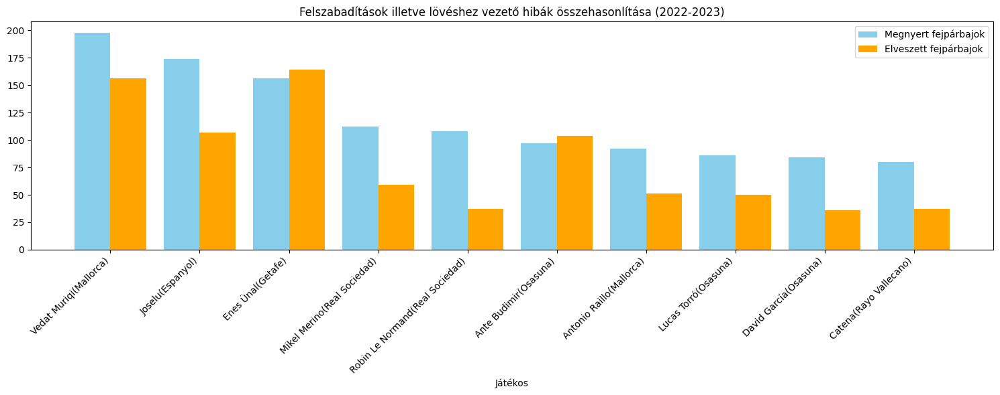

In [262]:
#Top 10 legtöbb fejpárbajt nyerő játékos

top10_airduel_LL2023 = LL2023.groupby('Player(Team)').agg({"Won":'sum','Lost':'sum'}).nlargest(10,'Won').reset_index()
top10_airduel_LL2023 = top10_airduel_LL2023.sort_values(by="Won",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_airduel_LL2023))
plt.bar(index, top10_airduel_LL2023['Won'], bar_width, color='skyblue', label='Megnyert fejpárbajok')
plt.bar([i + bar_width for i in index], top10_airduel_LL2023['Lost'], bar_width, color='orange', label='Elveszett fejpárbajok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_airduel_LL2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


####Összefüggések keresése
Bizonoys játékosok statisztikái feltűnően gyengébbek az elvártnál, ezért meg szeretném vizsgálni, hogy ezen játékosok mélyrepülése hogyan hatott a csapatuk teljesítményére. Ehhez szükségem volt a bajnoki tabellára

In [263]:
LL_table=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/LaLiga_tables.csv")

In [264]:
LL_table

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Barcelona,38,28,4,6,70,20,50,88,2022-2023,La Liga
1,1,2,Real Madrid,38,24,6,8,75,36,39,78,2022-2023,La Liga
2,2,3,Atlético Madrid,38,23,8,7,70,33,37,77,2022-2023,La Liga
3,3,4,Real Sociedad,38,21,8,9,51,35,16,71,2022-2023,La Liga
4,4,5,Villarreal,38,19,7,12,59,40,19,64,2022-2023,La Liga
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Valladolid,38,10,11,17,32,51,-19,41,2018-2019,La Liga
96,16,17,Celta Vigo,38,10,11,17,53,62,-9,41,2018-2019,La Liga
97,17,18,Girona,38,9,10,19,37,53,-16,37,2018-2019,La Liga
98,18,19,Huesca,38,7,12,19,43,65,-22,33,2018-2019,La Liga


In [265]:
del LL_table["Unnamed: 0"]

In [266]:
LL_table

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Barcelona,38,28,4,6,70,20,50,88,2022-2023,La Liga
1,2,Real Madrid,38,24,6,8,75,36,39,78,2022-2023,La Liga
2,3,Atlético Madrid,38,23,8,7,70,33,37,77,2022-2023,La Liga
3,4,Real Sociedad,38,21,8,9,51,35,16,71,2022-2023,La Liga
4,5,Villarreal,38,19,7,12,59,40,19,64,2022-2023,La Liga
...,...,...,...,...,...,...,...,...,...,...,...,...
95,16,Valladolid,38,10,11,17,32,51,-19,41,2018-2019,La Liga
96,17,Celta Vigo,38,10,11,17,53,62,-9,41,2018-2019,La Liga
97,18,Girona,38,9,10,19,37,53,-16,37,2018-2019,La Liga
98,19,Huesca,38,7,12,19,43,65,-22,33,2018-2019,La Liga


#####LaLiga tabella 2022-2023

In [267]:
LL_table_2023=LL_table[LL_table["Season"]=="2022-2023"]
LL_table_2023


,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Barcelona,38,28,4,6,70,20,50,88,2022-2023,La Liga
1,2,Real Madrid,38,24,6,8,75,36,39,78,2022-2023,La Liga
2,3,Atlético Madrid,38,23,8,7,70,33,37,77,2022-2023,La Liga
3,4,Real Sociedad,38,21,8,9,51,35,16,71,2022-2023,La Liga
4,5,Villarreal,38,19,7,12,59,40,19,64,2022-2023,La Liga
5,6,Betis,38,17,9,12,46,41,5,60,2022-2023,La Liga
6,7,Osasuna,38,15,8,15,37,42,-5,53,2022-2023,La Liga
7,8,Athletic Club,38,14,9,15,47,43,4,51,2022-2023,La Liga
8,9,Mallorca,38,14,8,16,37,43,-6,50,2022-2023,La Liga
9,10,Girona,38,13,10,15,58,55,3,49,2022-2023,La Liga


#####A Sevilla mélyrepülése

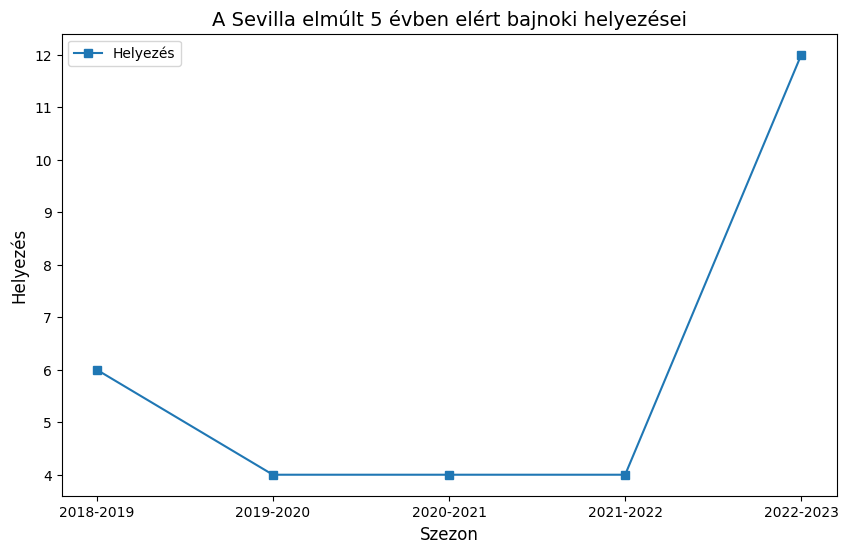

In [268]:
Sevilla=LL_table[LL_table["Squad"]=="Sevilla"]
Sevilla=Sevilla[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Sevilla["Season"])
ypoints = np.array(Sevilla["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Sevilla["Rk"], label='Helyezés', marker='s')

plt.title('A Sevilla elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()

Mint az látható nagy meglepetésre a Sevilla azok után, hogy éveken át ott volt a bajnokság elején, 3 szezonban 4-ik helyen végzett (tehát be jutott a Bajnokok Ligájába), a 2022-2023-as kiírásban csupán a 12-ik helyet kaparintotta meg az egyesület. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

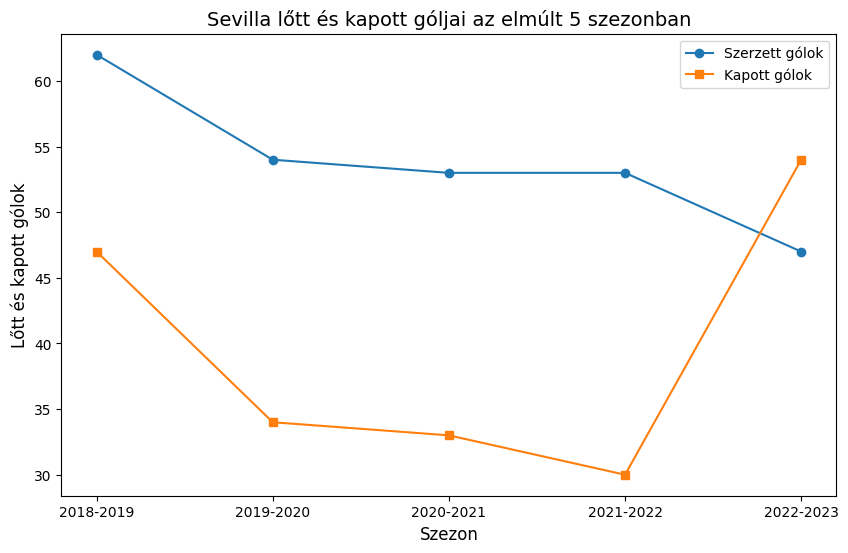

In [269]:
Sevilla=LL_table[LL_table["Squad"]=="Sevilla"]
Sevilla_gf_ga=Sevilla[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Sevilla_gf_ga["GF"])
ga = np.array(Sevilla_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gf, label='Szerzett gólok', marker='o')
plt.plot(xpoints, ga, label='Kapott gólok', marker='s')

plt.title('Sevilla lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)


plt.legend()


plt.show()

Mint az látható, a 2022-2023-as szezonban majdnem 2-szer annyi gólt kaptak mint előtte a 2021-2022-es kiírásban, így itt a védelemmel illetve a középpályával foglalkoztam.

######Középpályások

In [270]:
Sevilla2022_2023=LL2023[LL2023["Team"]=="Sevilla"]
Sevilla2022_2023_mf=Sevilla2022_2023[Sevilla2022_2023['Pos']=="MF"]
Sevilla2022_2023_mf

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player),cardssum,Tkl_Tkl%
386,Ivan Rakitić,hr CRO,MF,34.0,31,21,1788.0,19.9,1.0,3.0,...,20.0,20.0,50.0,2022-2023,Sevilla,La Liga,Ivan Rakitić(Sevilla),2022-2023(Ivan Rakitić),4.0,70.270270
388,Joan Jordán,es ESP,MF,28.0,23,19,1592.0,17.7,0.0,1.0,...,11.0,12.0,47.8,2022-2023,Sevilla,La Liga,Joan Jordán(Sevilla),2022-2023(Joan Jordán),8.0,53.125000
397,Pape Gueye,sn SEN,MF,23.0,16,15,1171.0,13.0,1.0,3.0,...,19.0,17.0,52.8,2022-2023,Sevilla,La Liga,Pape Gueye(Sevilla),2022-2023(Pape Gueye),9.0,59.459459
407,Thomas Delaney,dk DEN,MF,30.0,8,2,309.0,3.4,0.0,0.0,...,9.0,2.0,81.8,2022-2023,Sevilla,La Liga,Thomas Delaney(Sevilla),2022-2023(Thomas Delaney),3.0,50.000000
409,Manuel Sebastián,es ESP,MF,18.0,2,2,149.0,1.7,0.0,0.0,...,1.0,3.0,25.0,2022-2023,Sevilla,La Liga,Manuel Sebastián(Sevilla),2022-2023(Manuel Sebastián),0.0,57.142857
413,Iván Romero,es ESP,MF,21.0,1,0,11.0,0.1,0.0,0.0,...,1.0,0.0,100.0,2022-2023,Sevilla,La Liga,Iván Romero(Sevilla),2022-2023(Iván Romero),1.0,NaN
414,Carlos Álvarez,es ESP,MF,18.0,1,0,10.0,0.1,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Carlos Álvarez(Sevilla),2022-2023(Carlos Álvarez),1.0,100.000000
415,Pedro Ortiz,es ESP,MF,21.0,1,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Pedro Ortiz(Sevilla),2022-2023(Pedro Ortiz),0.0,NaN
417,Lulo Dasilva,es ESP,MF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Lulo Dasilva(Sevilla),2022-2023(Lulo Dasilva),0.0,NaN
421,Nacho Quintana,es ESP,MF,21.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Nacho Quintana(Sevilla),2022-2023(Nacho Quintana),0.0,NaN


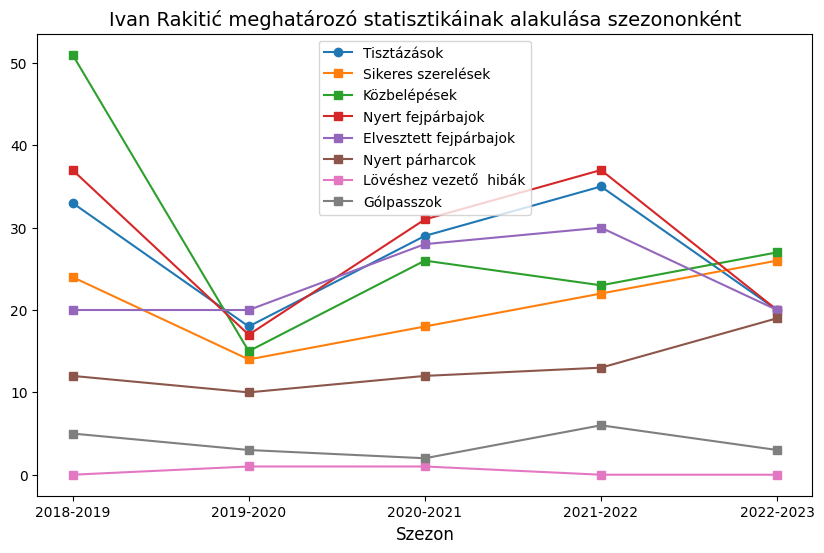

In [271]:
#Ivan Rakitić
Rakitić=LL[LL['Player']=="Ivan Rakitić"]
Rakitić=Rakitić[["Gls","Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Rakitić["Clr"])
TklW = np.array(Rakitić["TklW"])
Int = np.array(Rakitić["Int"])
Challenges_Tkl=np.array(Rakitić["Challenges_Tkl"])
Won = np.array(Rakitić["Won"])
Lost = np.array(Rakitić["Lost"])
Err= np.array(Rakitić["Err"])
Ast = np.array(Rakitić["Ast"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Ivan Rakitić meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()



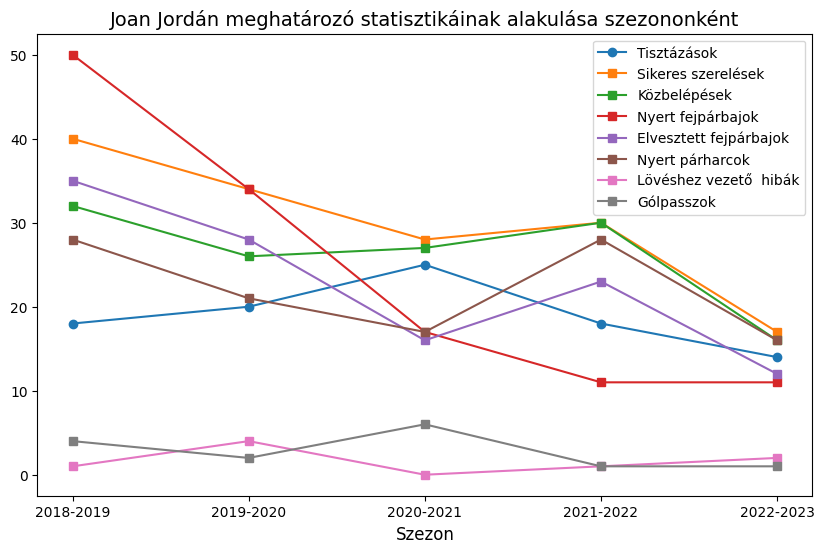

In [272]:
#Joan Jordán
Jordán=LL[LL['Player']=="Joan Jordán"]
Jordán=Jordán[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Jordán["Clr"])
TklW = np.array(Jordán["TklW"])
Int = np.array(Jordán["Int"])
Challenges_Tkl=np.array(Jordán["Challenges_Tkl"])
Won = np.array(Jordán["Won"])
Lost = np.array(Jordán["Lost"])
Err= np.array(Jordán["Err"])
Ast = np.array(Jordán["Ast"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Joan Jordán meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

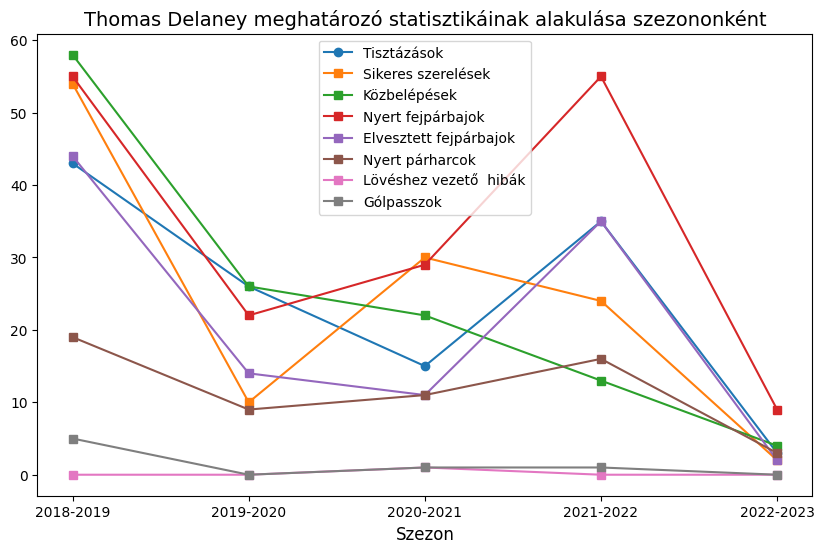

In [273]:
#Thomas Delaney
BL2019=BL[BL['Season']=="2018-2019"]
Delaney2019=BL2019[BL2019['Player']=="Thomas Delaney"]
Delaney2020=BL2020[BL2020['Player']=="Thomas Delaney"]
Delaney2021=BL2021[BL2021['Player']=="Thomas Delaney"]
Delaney=LL[LL['Player']=="Thomas Delaney"]
Delaney=pd.concat([Delaney,Delaney2021,Delaney2020,Delaney2019])
Delaney=Delaney[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Delaney["Clr"])
TklW = np.array(Delaney["TklW"])
Int = np.array(Delaney["Int"])
Challenges_Tkl=np.array(Delaney["Challenges_Tkl"])
Won = np.array(Delaney["Won"])
Lost = np.array(Delaney["Lost"])
Err= np.array(Delaney["Err"])
Ast = np.array(Delaney["Ast"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Thomas Delaney meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

Jól látható, hogy a Sevilla középpályásai mélyen tudásuk alatt teljesítettek, mind a védekezés, mind a támadások segítésében alul múlták az előző szezonokban nyújtott teljesítményeiket.

######Védők

In [274]:
Sevilla2022_2023=LL2023[LL2023["Team"]=="Sevilla"]
Sevilla2022_2023_df=Sevilla2022_2023[Sevilla2022_2023['Pos']=="DF"]
Sevilla2022_2023_df

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player),cardssum,Tkl_Tkl%
385,Marcos Acuña,ar ARG,DF,30.0,30,21,1912.0,21.2,3.0,2.0,...,30.0,18.0,62.5,2022-2023,Sevilla,La Liga,Marcos Acuña(Sevilla),2022-2023(Marcos Acuña),13.0,63.157895
391,Gonzalo Montiel,ar ARG,DF,25.0,28,17,1524.0,16.9,0.0,3.0,...,13.0,16.0,44.8,2022-2023,Sevilla,La Liga,Gonzalo Montiel(Sevilla),2022-2023(Gonzalo Montiel),9.0,57.692308
392,Loïc Bade,fr FRA,DF,22.0,19,16,1449.0,16.1,1.0,0.0,...,34.0,27.0,55.7,2022-2023,Sevilla,La Liga,Loïc Bade(Sevilla),2022-2023(Loïc Bade),4.0,74.074074
393,Tanguy Nianzou,fr FRA,DF,20.0,19,16,1366.0,15.2,1.0,0.0,...,32.0,11.0,74.4,2022-2023,Sevilla,La Liga,Tanguy Nianzou(Sevilla),2022-2023(Tanguy Nianzou),2.0,75.000000
395,Alex Telles,br BRA,DF,29.0,27,15,1427.0,15.9,0.0,2.0,...,26.0,16.0,61.9,2022-2023,Sevilla,La Liga,Alex Telles(Sevilla),2022-2023(Alex Telles),6.0,61.904762
396,Karim Rekik,nl NED,DF,27.0,16,15,1181.0,13.1,1.0,1.0,...,22.0,10.0,68.8,2022-2023,Sevilla,La Liga,Karim Rekik(Sevilla),2022-2023(Karim Rekik),2.0,45.454545
404,Carmona,es ESP,DF,20.0,10,5,527.0,5.9,2.0,1.0,...,3.0,8.0,27.3,2022-2023,Sevilla,La Liga,Carmona(Sevilla),2022-2023(Carmona),7.0,84.615385
405,Marcão,br BRA,DF,26.0,5,4,375.0,4.2,0.0,0.0,...,8.0,4.0,66.7,2022-2023,Sevilla,La Liga,Marcão(Sevilla),2022-2023(Marcão),2.0,100.000000
406,Kike Salas,es ESP,DF,20.0,6,4,368.0,4.1,1.0,1.0,...,9.0,6.0,60.0,2022-2023,Sevilla,La Liga,Kike Salas(Sevilla),2022-2023(Kike Salas),2.0,100.000000
412,Diego Iturralde,es ESP,DF,19.0,1,1,45.0,0.5,0.0,0.0,...,1.0,1.0,50.0,2022-2023,Sevilla,La Liga,Diego Iturralde(Sevilla),2022-2023(Diego Iturralde),1.0,0.000000


<ipython-input-276-de8ab4f86a72>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Acuña.loc[len(Acuña)] = {'Clr': 0, 'TklW':0, "Int":0, "Challenges_Tkl":0, "Won":0, "Lost":0, "Err":0,'Season': "2018-2019"}
<ipython-input-276-de8ab4f86a72>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Acuña.loc[len(Acuña)] = {'Clr': 0, 'TklW':0, "Int":0, "Challenges_Tkl":0, "Won":0, "Lost":0, "Err":0,'Season': "2019-2020"}


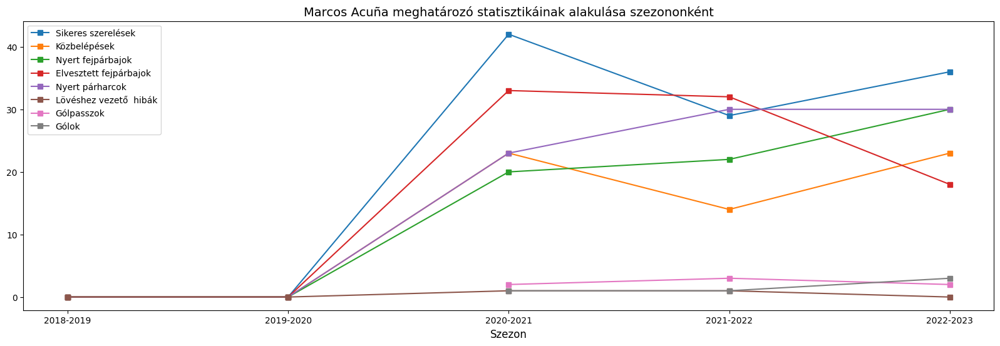

In [276]:
#Marcos Acuña
Acuña=LL[LL['Player']=="Marcos Acuña"]
Acuña.loc[len(Acuña)] = {'Clr': 0, 'TklW':0, "Int":0, "Challenges_Tkl":0, "Won":0, "Lost":0, "Err":0,'Season': "2018-2019"}
Acuña.loc[len(Acuña)] = {'Clr': 0, 'TklW':0, "Int":0, "Challenges_Tkl":0, "Won":0, "Lost":0, "Err":0,'Season': "2019-2020"}
Acuña=Acuña[["Ast","Gls","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Acuña["Clr"])
TklW = np.array(Acuña["TklW"])
Int = np.array(Acuña["Int"])
Challenges_Tkl=np.array(Acuña["Challenges_Tkl"])
Won = np.array(Acuña["Won"])
Lost = np.array(Acuña["Lost"])
Err= np.array(Acuña["Err"])
Ast=np.array(Acuña["Ast"])
Gls=np.array(Acuña["Gls"])

plt.figure(figsize=(20, 6))


plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')
plt.plot(xpoints, Gls, label='Gólok', marker='s')

plt.title('Marcos Acuña meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


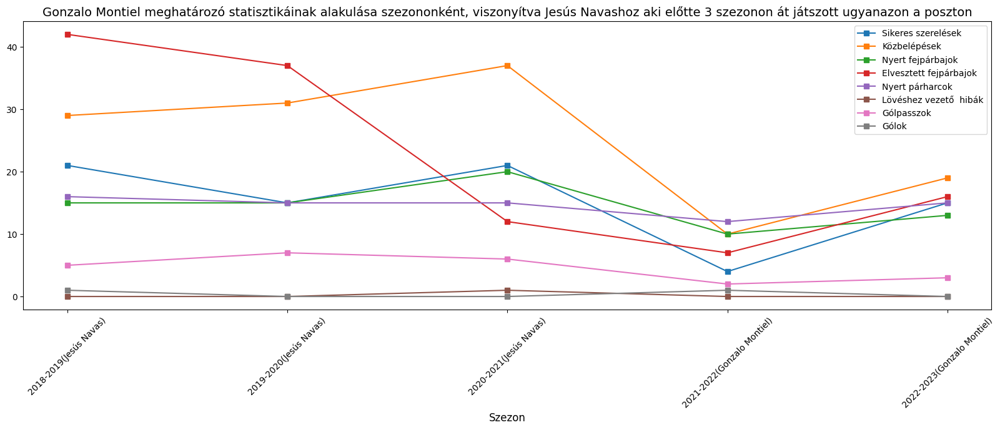

In [277]:
#Gonzalo Montiel
LL2019=LL[LL['Season']=="2018-2019"]
LL2020=LL[LL['Season']=="2019-2020"]
LL2021=LL[LL['Season']=="2020-2021"]
JN2019=LL2019[LL2019['Player']=="Jesús Navas"]
JN2020=LL2020[LL2020['Player']=="Jesús Navas"]
JN2021=LL2021[LL2021['Player']=="Jesús Navas"]
Montiel=LL[LL['Player']=="Gonzalo Montiel"]
MontielNavas=pd.concat([Montiel,JN2021,JN2020,JN2019])
MontielNavas=MontielNavas[["Ast","Gls","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season","Season(Player)"]].sort_values(by='Season', ascending=True)

Clr = np.array(MontielNavas["Clr"])
TklW = np.array(MontielNavas["TklW"])
Int = np.array(MontielNavas["Int"])
Challenges_Tkl=np.array(MontielNavas["Challenges_Tkl"])
Won = np.array(MontielNavas["Won"])
Lost = np.array(MontielNavas["Lost"])
Err= np.array(MontielNavas["Err"])
Ast=np.array(MontielNavas["Ast"])
Gls=np.array(MontielNavas["Gls"])

plt.figure(figsize=(20, 6))


plt.plot(MontielNavas["Season(Player)"], TklW, label='Sikeres szerelések', marker='s')
plt.plot(MontielNavas["Season(Player)"], Int, label='Közbelépések', marker='s')
plt.plot(MontielNavas["Season(Player)"], Won, label='Nyert fejpárbajok', marker='s')
plt.plot(MontielNavas["Season(Player)"], Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(MontielNavas["Season(Player)"], Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(MontielNavas["Season(Player)"], Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(MontielNavas["Season(Player)"], Ast, label='Gólpasszok', marker='s')
plt.plot(MontielNavas["Season(Player)"], Gls, label='Gólok', marker='s')

plt.title('Gonzalo Montiel meghatározó statisztikáinak alakulása szezononként, viszonyítva Jesús Navashoz aki előtte 3 szezonon át játszott ugyanazon a poszton', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
plt.show()

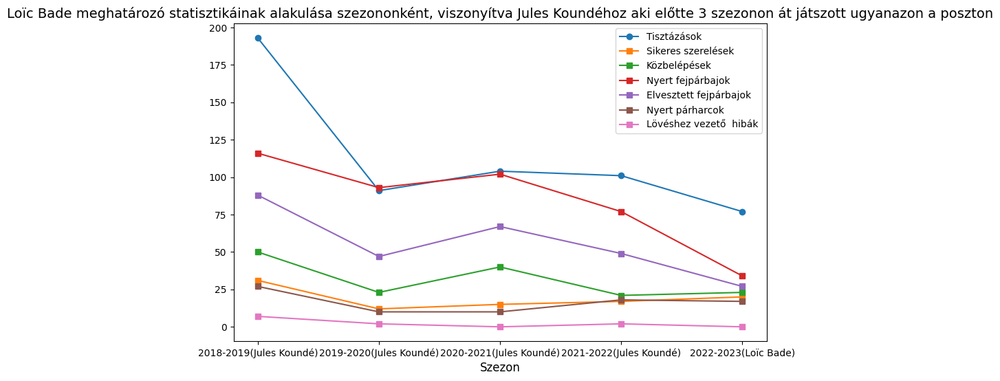

In [278]:
#Loïc Bade
L12019=L1[L1['Season']=="2018-2019"]
LL2020=LL[LL['Season']=="2019-2020"]
LL2021=LL[LL['Season']=="2020-2021"]
LL2022=LL[LL['Season']=="2021-2022"]
JC2019=L12019[L12019['Player']=="Jules Koundé"]
JC2020=LL2020[LL2020['Player']=="Jules Koundé"]
JC2021=LL2021[LL2021['Player']=="Jules Koundé"]
JC2022=LL2022[LL2022['Player']=="Jules Koundé"]
Bade=LL[LL['Player']=="Loïc Bade"]
BadeKounde=pd.concat([Bade,JC2022,JC2021,JC2020,JC2019],ignore_index=True )
BadeKounde=BadeKounde[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season","Season(Player)"]].sort_values(by='Season', ascending=True)

Clr = np.array(BadeKounde["Clr"])
TklW = np.array(BadeKounde["TklW"])
Int = np.array(BadeKounde["Int"])
Challenges_Tkl=np.array(BadeKounde["Challenges_Tkl"])
Won = np.array(BadeKounde["Won"])
Lost = np.array(BadeKounde["Lost"])
Err= np.array(BadeKounde["Err"])


plt.figure(figsize=(10, 6))

plt.plot(BadeKounde["Season(Player)"], Clr, label='Tisztázások', marker='o')
plt.plot(BadeKounde["Season(Player)"], TklW, label='Sikeres szerelések', marker='s')
plt.plot(BadeKounde["Season(Player)"], Int, label='Közbelépések', marker='s')
plt.plot(BadeKounde["Season(Player)"], Won, label='Nyert fejpárbajok', marker='s')
plt.plot(BadeKounde["Season(Player)"], Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(BadeKounde["Season(Player)"], Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(BadeKounde["Season(Player)"], Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Loïc Bade meghatározó statisztikáinak alakulása szezononként, viszonyítva Jules Koundéhoz aki előtte 3 szezonon át játszott ugyanazon a poszton', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


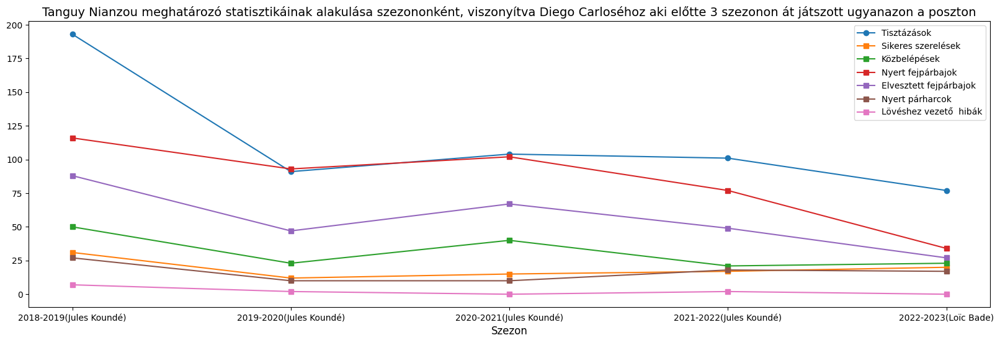

In [279]:
#Tanguy Nianzou
L12019=L1[L1['Season']=="2018-2019"]
LL2020=LL[LL['Season']=="2019-2020"]
LL2021=LL[LL['Season']=="2020-2021"]
LL2022=LL[LL['Season']=="2021-2022"]
DC2019=L12019[L12019['Player']=="Diego Carlos"]
DC2020=LL2020[LL2020['Player']=="Diego Carlos"]
DC2021=LL2021[LL2021['Player']=="Diego Carlos"]
DC2022=LL2022[LL2022['Player']=="Diego Carlos"]
Nianzou=LL[LL['Player']=="Tanguy Nianzou"]
NianzouCarlos=pd.concat([Bade,JC2022,JC2021,JC2020,JC2019],ignore_index=True )
NianzouCarlos=NianzouCarlos[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season","Season(Player)"]].sort_values(by='Season', ascending=True)

Clr = np.array(NianzouCarlos["Clr"])
TklW = np.array(NianzouCarlos["TklW"])
Int = np.array(NianzouCarlos["Int"])
Challenges_Tkl=np.array(NianzouCarlos["Challenges_Tkl"])
Won = np.array(NianzouCarlos["Won"])
Lost = np.array(NianzouCarlos["Lost"])
Err= np.array(NianzouCarlos["Err"])


plt.figure(figsize=(20, 6))

plt.plot(NianzouCarlos["Season(Player)"], Clr, label='Tisztázások', marker='o')
plt.plot(NianzouCarlos["Season(Player)"], TklW, label='Sikeres szerelések', marker='s')
plt.plot(NianzouCarlos["Season(Player)"], Int, label='Közbelépések', marker='s')
plt.plot(NianzouCarlos["Season(Player)"], Won, label='Nyert fejpárbajok', marker='s')
plt.plot(NianzouCarlos["Season(Player)"], Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(NianzouCarlos["Season(Player)"], Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(NianzouCarlos["Season(Player)"], Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Tanguy Nianzou meghatározó statisztikáinak alakulása szezononként, viszonyítva Diego Carloséhoz aki előtte 3 szezonon át játszott ugyanazon a poszton', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

A belső védelemben Diego Carlos és Jules Koundé stabil teljesítményt nyújtott, azonban az ő távozásukkal 2 fiatal, rutintalan védő Tanguy Nianzu és Loic Bade kerültek a védelem tengelyébe mint alapemberek, és a statisztikák megmutatják, hogy nem is tudták pótolni elődjeiket. A szélsővédőkről (Marcos Acuna,Gonzalo Monitel) ez nem mondható el, ott nem következett be jelentősebb teljesítménybeli romlás.

######Kapus

In [280]:
Sevilla2022_2023=LL2023[LL2023["Team"]=="Sevilla"]
Sevilla2022_2023_gk=Sevilla2022_2023[Sevilla2022_2023['Pos']=="GK"]
Sevilla2022_2023_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player),cardssum,Tkl_Tkl%
383,Yassine Bounou,ma MAR,GK,31.0,25,25,2151.0,23.9,0.0,0.0,...,4.0,2.0,66.7,2022-2023,Sevilla,La Liga,Yassine Bounou(Sevilla),2022-2023(Yassine Bounou),2.0,50.0
398,Marko Dmitrović,rs SRB,GK,30.0,15,13,1269.0,14.1,0.0,0.0,...,4.0,0.0,100.0,2022-2023,Sevilla,La Liga,Marko Dmitrović(Sevilla),2022-2023(Marko Dmitrović),1.0,NaN
416,Matías Árbol,es ESP,GK,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Matías Árbol(Sevilla),2022-2023(Matías Árbol),0.0,NaN
419,Marius Herzig,de GER,GK,22.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Marius Herzig(Sevilla),2022-2023(Marius Herzig),0.0,NaN
420,Alberto López,es ESP,GK,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2022-2023,Sevilla,La Liga,Alberto López(Sevilla),2022-2023(Alberto López),0.0,NaN


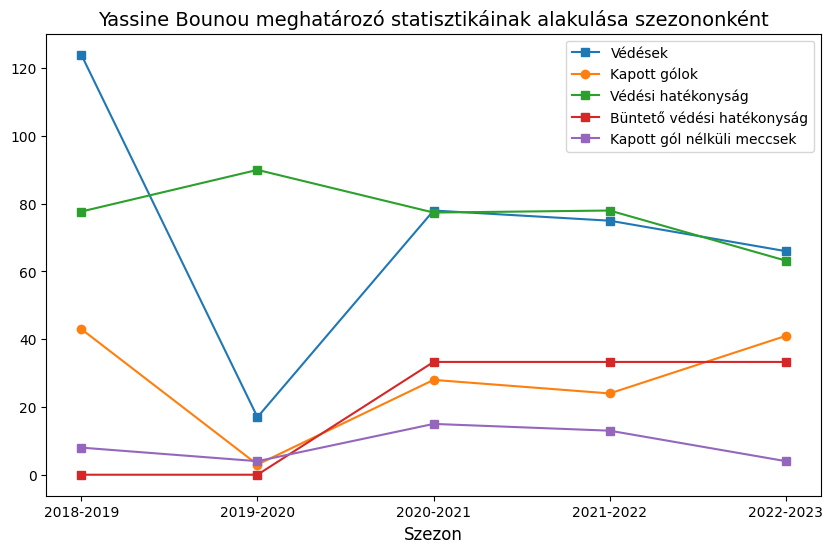

In [281]:
#Yassine Bounou
Bounou=LL[LL["Player"]=="Yassine Bounou"]
Bounou=Bounou[["Player","GA","Saves","Save%","PK_Save%","CS","Season"]].sort_values(by='Season', ascending=True)

GA = np.array(Bounou["GA"])
Save = np.array(Bounou["Save%"])
PK_Save = np.array(Bounou["PK_Save%"])
CS=np.array(Bounou["CS"])
Saves = np.array(Bounou["Saves"])

plt.figure(figsize=(10, 6))
plt.plot(xpoints, Saves, label='Védések', marker='s')
plt.plot(xpoints, GA, label='Kapott gólok', marker='o')
plt.plot(xpoints, Save, label='Védési hatékonyság', marker='s')
plt.plot(xpoints, PK_Save, label='Büntető védési hatékonyság', marker='s')
plt.plot(xpoints, CS, label='Kapott gól nélküli meccsek', marker='s')


plt.title('Yassine Bounou meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


A kapus, Yassine Bounou teljesítményén sem figyelhető meg különösebb romlás.

#####**ÖSSZEGZÉS**
Összességében elmondható, hogy a Sevilla a 2022-2023-as szezonban nyújtott rossz teljesítményét főként belsővédelmének gyengébb teljesítménye okozta, illetve a középpáylások sem mútottak be jó teljesítményt.

##Premier League

###.csv file beolvasása és utótisztítása

In [333]:
PL=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/PL_vegleges.csv")

In [334]:
del PL["Unnamed: 0"]

In [335]:
pd.isnull(PL).sum()

Player                   0
Nation                   0
Pos                      0
Age                      3
MP                       0
Starts                   0
Min                    586
90s                    585
Gls                    585
Ast                    585
G+A                    585
G-PK                   585
Penalty_Kicks_Made     585
PKatt                  585
CrdY                   585
CrdR                   585
xG                     586
npxG                   586
xAG                    586
npxG.1                 586
GA                    3066
SoTA                  3066
Saves                 3066
Save%                 3067
PK_Save%              3127
CS                    3067
CS%                   3071
Sh                     586
SoT                    586
SoT%                  1040
G/Sh                  1040
Dist                  1040
Cmp                    586
Att                    586
Cmp%                   604
TotDist                586
PrgDist                586
x

In [336]:
PL[pd.isnull(PL["Age"])][["Player","Age"]]

,Player,Age
1339,Bobby Thomas,NaN
1961,Bobby Thomas,NaN
2370,Bobby Thomas,NaN


In [337]:
#Nem tudni a játékos életkorát, így töröltem őt a Dataframeből
PL=PL[PL["Player"]!="Bobby Thomas"]

In [338]:
PL[PL["Player"]=="Bobby Thomas"]

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition


In [339]:
PL=PL.fillna(0)

In [340]:
pd.isnull(PL).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [341]:
PL.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Ederson,br BRA,GK,28.0,35,35,3150.0,35.0,0.0,1.0,...,1.0,4.0,10.0,2.0,8.0,1.0,88.9,2022-2023,Manchester City,Premier League
1,Rodri,es ESP,MF,26.0,36,34,2911.0,32.3,2.0,6.0,...,33.0,100.0,43.0,1.0,72.0,32.0,69.2,2022-2023,Manchester City,Premier League
2,Erling Haaland,no NOR,FW,22.0,35,33,2769.0,30.8,36.0,8.0,...,3.0,6.0,14.0,0.0,50.0,50.0,50.0,2022-2023,Manchester City,Premier League
3,Kevin De Bruyne,be BEL,MF,31.0,32,28,2417.0,26.9,7.0,16.0,...,9.0,37.0,10.0,0.0,13.0,13.0,50.0,2022-2023,Manchester City,Premier League
4,İlkay Gündoğan,de GER,MF,31.0,31,27,2353.0,26.1,8.0,4.0,...,20.0,50.0,13.0,0.0,19.0,12.0,61.3,2022-2023,Manchester City,Premier League


In [342]:
PL.columns

Index(['Player', 'Nation', 'Pos', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'npxG.1', 'GA', 'SoTA', 'Saves', 'Save%',
       'PK_Save%', 'CS', 'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp',
       'Att', 'Cmp%', 'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl',
       'TklW', 'Tkl%', 'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%',
       'Season', 'Team', 'Competition'],
      dtype='object')

###2022-2023
####A 2022-2023-as szezon statisztikái, azok elemzése.



####A dataframe statisztikáinak elemzése, összehasonlítások, rangsorolások

In [343]:
PL2023=PL[PL["Season"]=="2022-2023"]
PL2023

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Ederson,br BRA,GK,28.0,35,35,3150.0,35.0,0.0,1.0,...,1.0,4.0,10.0,2.0,8.0,1.0,88.9,2022-2023,Manchester City,Premier League
1,Rodri,es ESP,MF,26.0,36,34,2911.0,32.3,2.0,6.0,...,33.0,100.0,43.0,1.0,72.0,32.0,69.2,2022-2023,Manchester City,Premier League
2,Erling Haaland,no NOR,FW,22.0,35,33,2769.0,30.8,36.0,8.0,...,3.0,6.0,14.0,0.0,50.0,50.0,50.0,2022-2023,Manchester City,Premier League
3,Kevin De Bruyne,be BEL,MF,31.0,32,28,2417.0,26.9,7.0,16.0,...,9.0,37.0,10.0,0.0,13.0,13.0,50.0,2022-2023,Manchester City,Premier League
4,İlkay Gündoğan,de GER,MF,31.0,31,27,2353.0,26.1,8.0,4.0,...,20.0,50.0,13.0,0.0,19.0,12.0,61.3,2022-2023,Manchester City,Premier League
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,Nathan Redmond,eng ENG,DF,28.0,1,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Southampton,Premier League
719,Willy Caballero,ar ARG,GK,40.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Southampton,Premier League
720,Ryan Finnigan,eng ENG,MF,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Southampton,Premier League
721,Jimmy Morgan,eng ENG,FW,16.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Southampton,Premier League


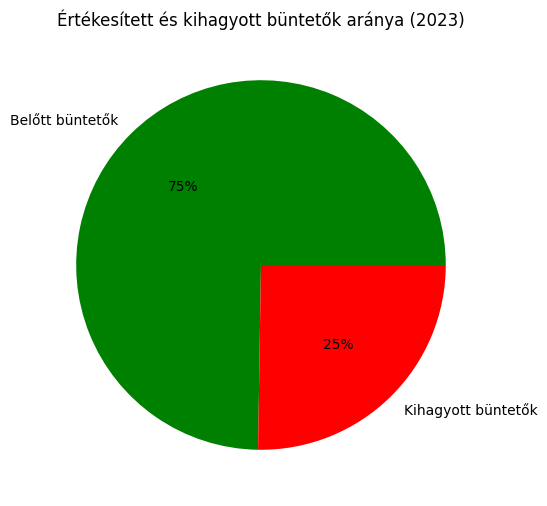

In [344]:
#Értékesített és kihagyott büntetők aránya
PL_Pen_Attempted_2023=PL2023["PKatt"].sum()
PL_Pen_Scored_2023=PL2023["Penalty_Kicks_Made"].sum()
PL_Pen_Missed_2023=PL_Pen_Attempted_2023-PL_Pen_Scored_2023

plt.figure(figsize=(13,6))
plt.title("Értékesített és kihagyott büntetők aránya (2023)")
data=[PL_Pen_Scored_2023,PL_Pen_Missed_2023]
colors=["green","red"]
labels=["Belőtt büntetők","Kihagyott büntetők"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()

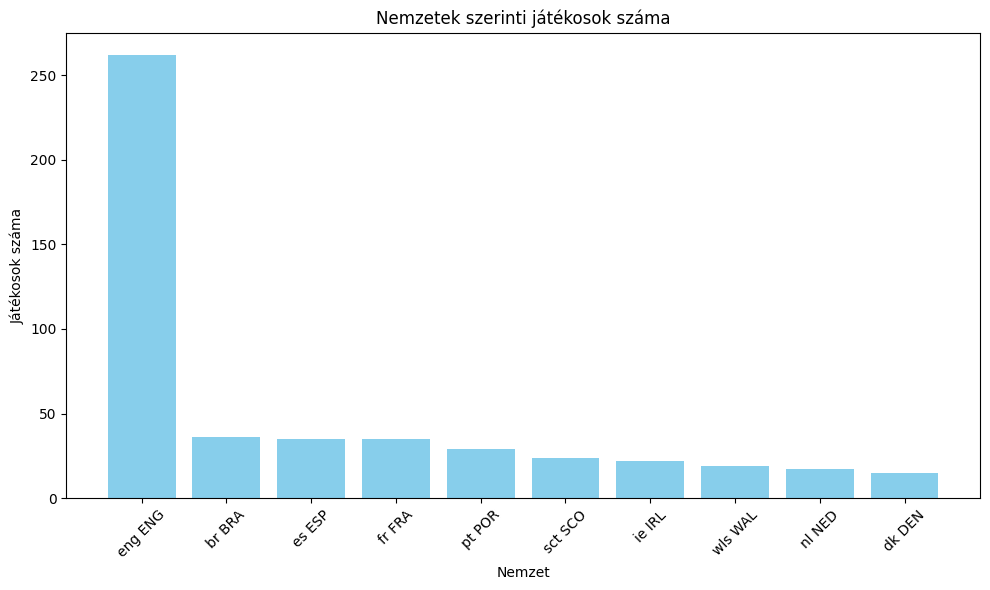

In [345]:
#Top 10 legtöbb játékost adó nemzet (2023)
jatekosok_szama = PL2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_nemzet['Nation'], top_10_nemzet['Játékosok száma'], color='skyblue')
plt.xlabel('Nemzet')
plt.ylabel('Játékosok száma')
plt.title('Nemzetek szerinti játékosok száma')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



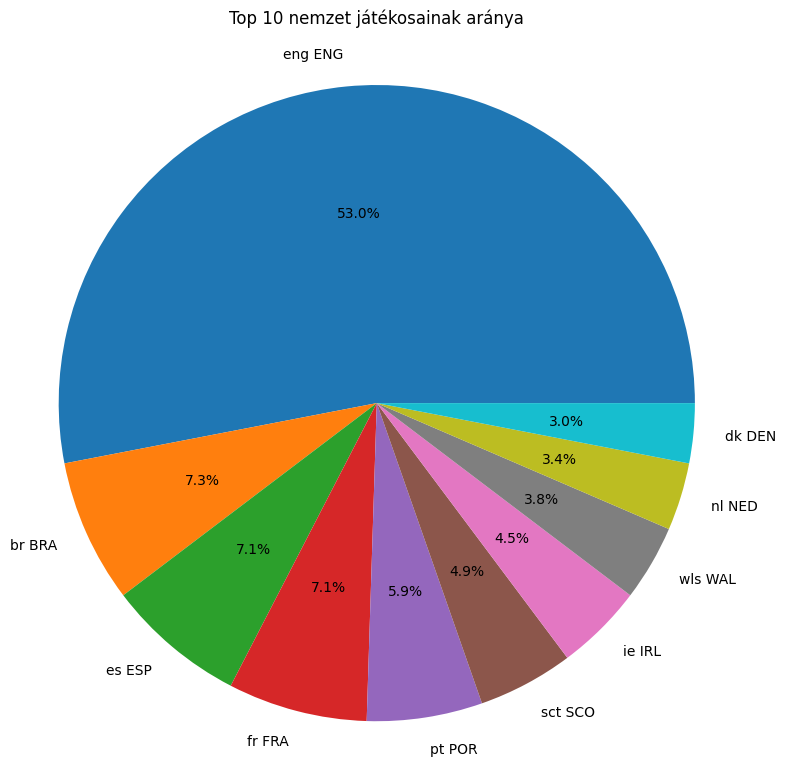

In [346]:
#Az előző kimutatás csak kördiagrammal
jatekosok_szama = PL2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")
plt.figure(figsize=(8, 8))
plt.pie(top_10_nemzet['Játékosok száma'], labels=top_10_nemzet['Nation'], autopct='%1.1f%%')
plt.title('Top 10 nemzet játékosainak aránya')
plt.axis('equal')
plt.tight_layout()
plt.show()

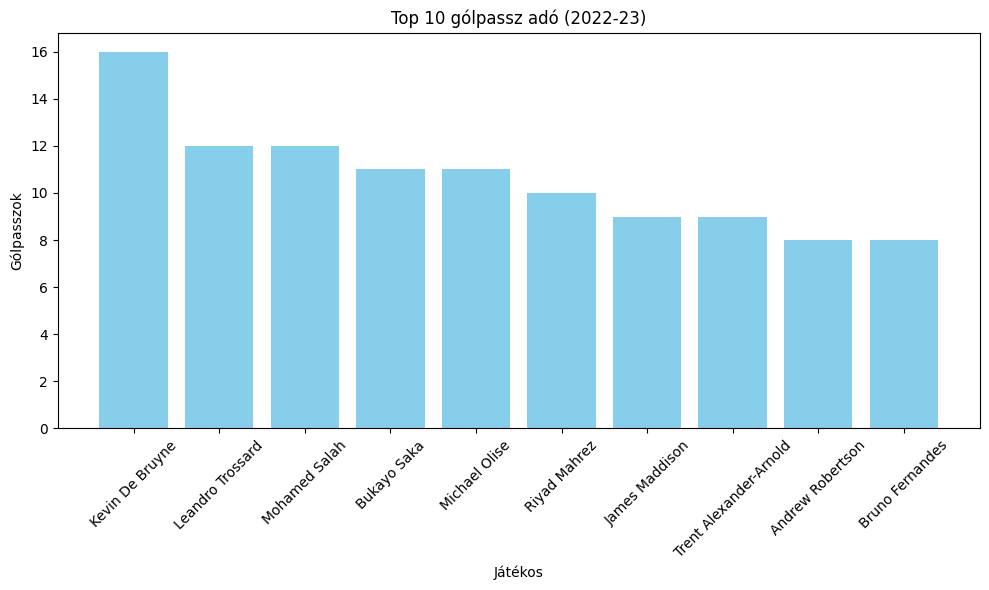

In [347]:
top_10_gólpassz_adó_2023_PL = PL2023.groupby('Player')["Ast"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_gólpassz_adó_2023_PL['Player'], top_10_gólpassz_adó_2023_PL['Ast'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

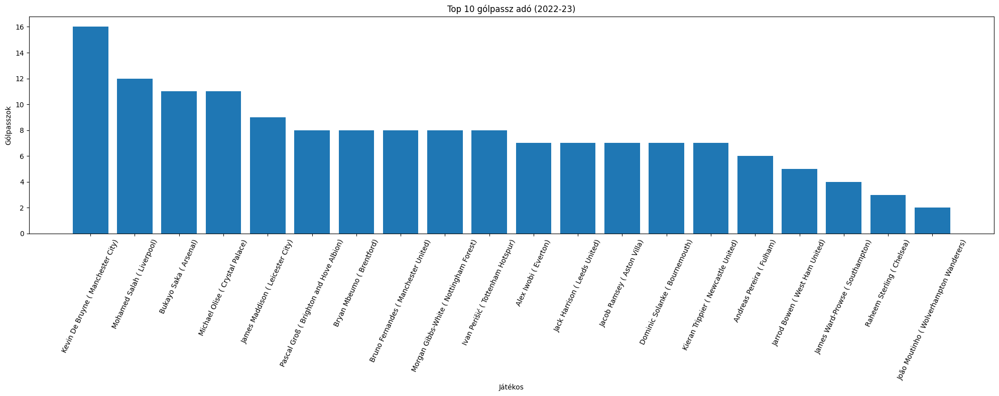

In [348]:
legjobb_golpassz_adok_csapatonként = PL2023.groupby('Team').apply(lambda x: x.nlargest(1, 'Ast')).reset_index(drop=True)
legjobb_golpassz_adok_csapatonként["Player(Team)"]=legjobb_golpassz_adok_csapatonként["Player"]+ " ( " + legjobb_golpassz_adok_csapatonként["Team"] + ")"
legjobb_golpassz_adok_csapatonként=legjobb_golpassz_adok_csapatonként.sort_values(by="Ast",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(legjobb_golpassz_adok_csapatonként['Player(Team)'], legjobb_golpassz_adok_csapatonként['Ast'])
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()

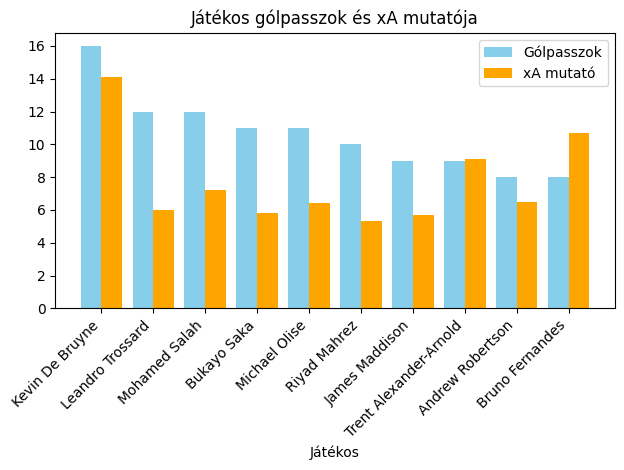

In [349]:
gp_xA_2023_PL = PL2023.groupby('Player').agg({"Ast":'sum','xA':'sum'}).nlargest(10,'Ast').reset_index()

# Oszlopdiagram létrehozása
bar_width = 0.4
index = range(len(gp_xA_2023_PL))
plt.bar(index, gp_xA_2023_PL['Ast'], bar_width, color='skyblue', label='Gólpasszok')
plt.bar([i + bar_width for i in index], gp_xA_2023_PL['xA'], bar_width, color='orange', label='xA mutató')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Játékos gólpasszok és xA mutatója')
plt.xticks([i + bar_width/2 for i in index], gp_xA_2023_PL['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

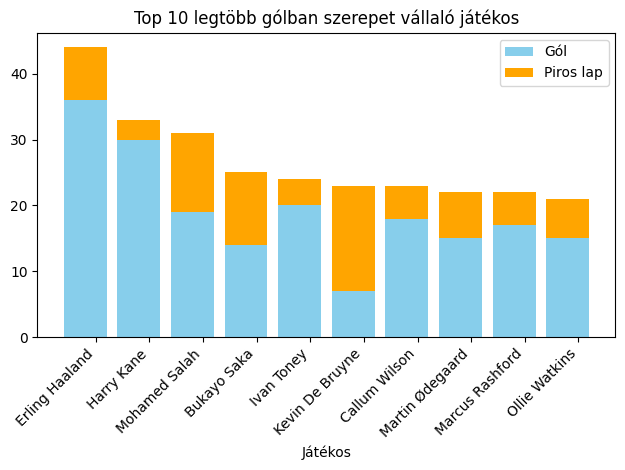

In [350]:
#Top 10 legtöbb gólban szerepet vállaló játékos
top10_ga_PL2023=PL2023.nlargest(10,"G+A")
top10_ga_PL2023=top10_ga_PL2023.sort_values(by="G+A",ascending=False)


plt.bar(top10_ga_PL2023["Player"], top10_ga_PL2023['Gls'], color='skyblue', label='Gól')
plt.bar(top10_ga_PL2023["Player"], top10_ga_PL2023['Ast'], bottom=top10_ga_PL2023['Gls'], color='orange', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb gólban szerepet vállaló játékos')
plt.xticks([i + bar_width/2 for i in index], top10_ga_PL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

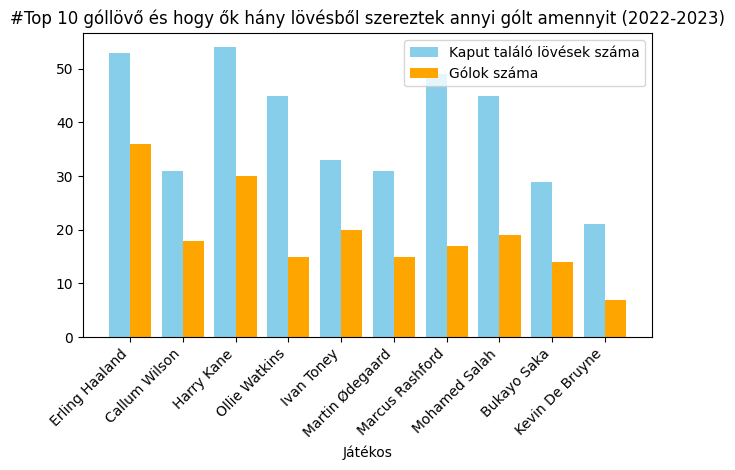

In [351]:
#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit.
top10_scorer_PL2023=PL2023.nlargest(10,"Gls")
top10_scorer_PL2023=top10_ga_PL2023.sort_values(by="G/Sh",ascending=False)

bar_width = 0.4
index = range(len(top10_scorer_PL2023))
plt.bar(index, top10_scorer_PL2023['SoT'], bar_width, color='skyblue', label='Kaput találó lövések száma')
plt.bar([i + bar_width for i in index], top10_scorer_PL2023['Gls'], bar_width, color='orange', label='Gólok száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_scorer_PL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

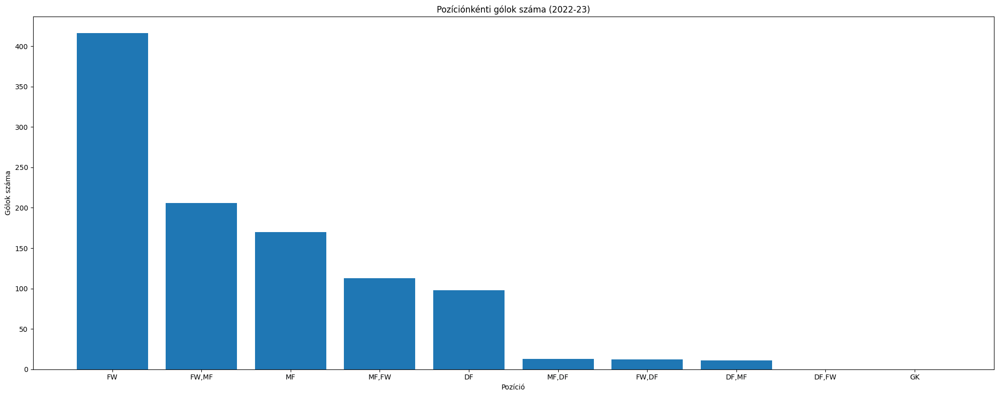

In [352]:
#Pozíciónkénti gólok száma
gls_per_pos_PL_2023=PL2023.groupby('Pos')['Gls'].sum().reset_index()
gls_per_pos_PL_2023=gls_per_pos_PL_2023.sort_values(by="Gls",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(gls_per_pos_PL_2023['Pos'], gls_per_pos_PL_2023['Gls'])
plt.xlabel('Pozíció')
plt.ylabel('Gólok száma')
plt.title('Pozíciónkénti gólok száma (2022-23)')

plt.tight_layout()
plt.show()

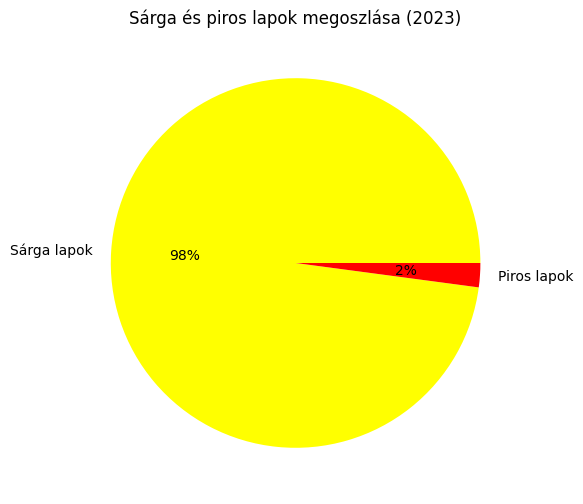

In [353]:
#Sárga és piros lapok megoszlása
yellow_PL_2023=PL2023["CrdY"].sum()
red_PL_2023=PL2023["CrdR"].sum()
plt.figure(figsize=(13,6))
plt.title("Sárga és piros lapok megoszlása (2023)")
data=[yellow_PL_2023,red_PL_2023]
colors=["yellow","red"]
labels=["Sárga lapok","Piros lapok"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()

<ipython-input-354-f32bc93e9d06>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PL2023["cardssum"]=PL2023['CrdY']+PL2023['CrdR']


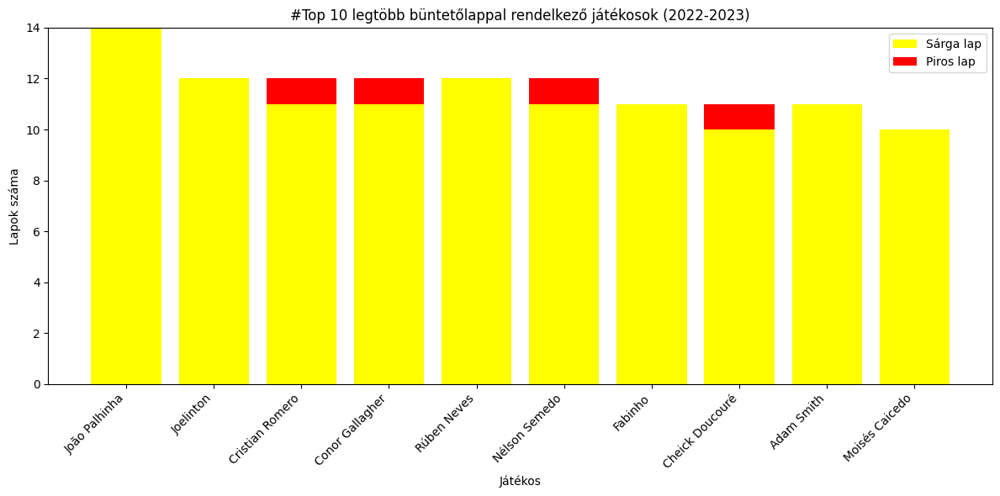

In [354]:
#Legtöbb büntetőlappal rendelkező játékosok
PL2023["cardssum"]=PL2023['CrdY']+PL2023['CrdR']
top10_carded_PL2023=PL2023.nlargest(10,"cardssum")
top10_carded_PL2023=top10_carded_PL2023.sort_values(by="cardssum",ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(top10_carded_PL2023["Player"], top10_carded_PL2023['CrdY'], color='yellow', label='Sárga lap')
plt.bar(top10_carded_PL2023["Player"], top10_carded_PL2023['CrdR'], bottom=top10_carded_PL2023['CrdY'], color='red', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('Lapok száma')
plt.title('#Top 10 legtöbb büntetőlappal rendelkező játékosok (2022-2023)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

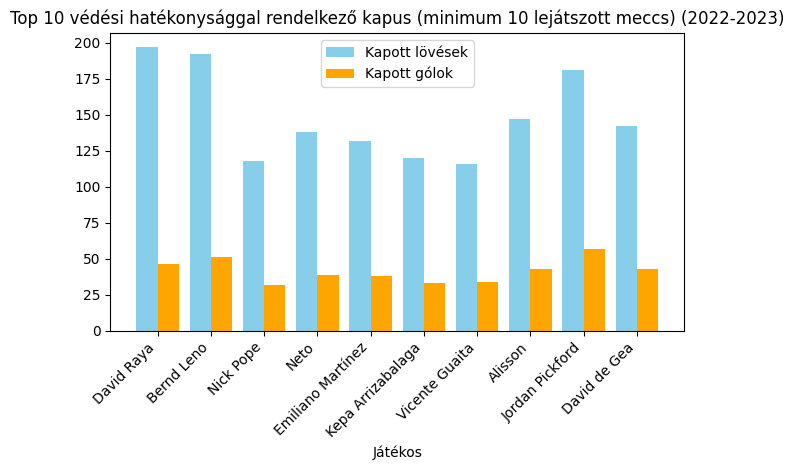

In [355]:
#Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_PL_2023=PL2023[PL2023["Pos"]=="GK"]
KeepertoCompare_PL_2023=Keepers_PL_2023[Keepers_PL_2023["MP"]>=10]
top10_savepercent_PL2023=KeepertoCompare_PL_2023.nlargest(10,"Save%")
top10_savepercent_PL2023=top10_savepercent_PL2023.sort_values(by="Save%",ascending=False)

bar_width = 0.4
index = range(len(top10_savepercent_PL2023))
plt.bar(index, top10_savepercent_PL2023['SoTA'], bar_width, color='skyblue', label='Kapott lövések')
plt.bar([i + bar_width for i in index], top10_savepercent_PL2023['GA'], bar_width, color='orange', label='Kapott gólok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_savepercent_PL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

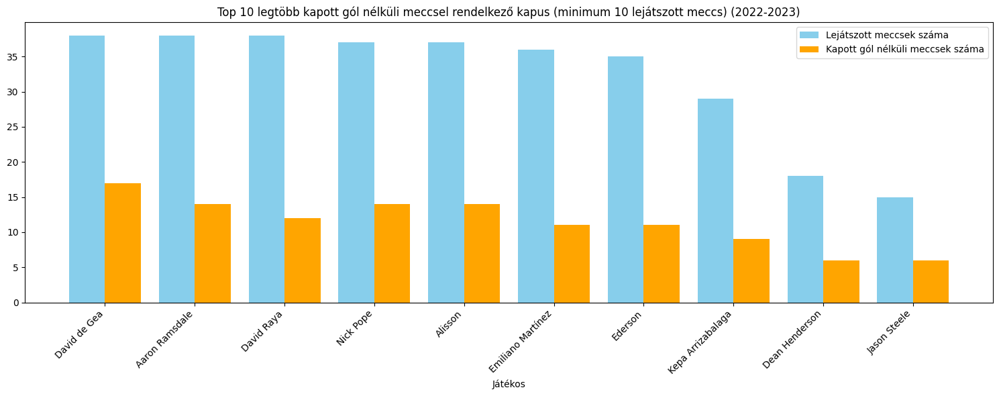

In [356]:
#Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_PL_2023=PL2023[PL2023["Pos"]=="GK"]
KeepertoCompare_PL_2023=Keepers_PL_2023[Keepers_PL_2023["MP"]>=10]
top10_cs_PL2023=KeepertoCompare_PL_2023.nlargest(10,"CS%")
top10_cs_PL2023=top10_cs_PL2023.sort_values(by="MP",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_cs_PL2023))
plt.bar(index, top10_cs_PL2023['MP'], bar_width, color='skyblue', label='Lejátszott meccsek száma')
plt.bar([i + bar_width for i in index], top10_cs_PL2023['CS'], bar_width, color='orange', label='Kapott gól nélküli meccsek száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_cs_PL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

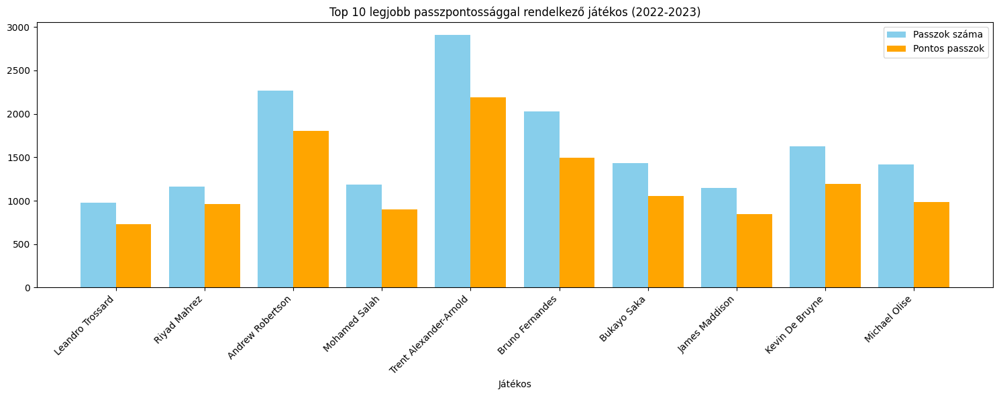

In [357]:
#Top 10 legjobb passzpontossággal rendelkező játékos
gp_pp_2023_PL = PL2023.groupby('Player').agg({"Ast":'sum','Att':'sum','Cmp':'sum','Cmp%':'sum'}).nlargest(10,'Ast').reset_index()
top10_pp_PL2023=gp_pp_2023_PL.sort_values(by="Cmp%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_pp_PL2023))
plt.bar(index, top10_pp_PL2023['Att'], bar_width, color='skyblue', label='Passzok száma')
plt.bar([i + bar_width for i in index], top10_pp_PL2023['Cmp'], bar_width, color='orange', label='Pontos passzok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_pp_PL2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-358-fb4cd488386b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PL2023["Tkl_Tkl%"]=PL2023['TklW']/PL2023['Tkl']*100


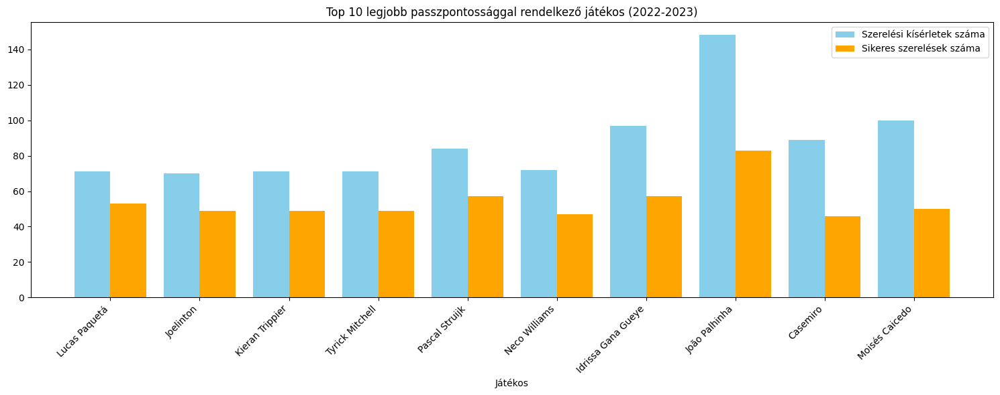

In [358]:
#Top 10 legjobban szerelő játékos
PL2023["Tkl_Tkl%"]=PL2023['TklW']/PL2023['Tkl']*100
top10_tkl_2023_PL = PL2023.groupby('Player').agg({"Tkl":'sum','TklW':'sum','Tkl_Tkl%':'sum'}).nlargest(10,'TklW').reset_index()
top10_tkl_2023_PL = top10_tkl_2023_PL.sort_values(by="Tkl_Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_tkl_2023_PL))
plt.bar(index, top10_tkl_2023_PL['Tkl'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_tkl_2023_PL['TklW'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_tkl_2023_PL['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

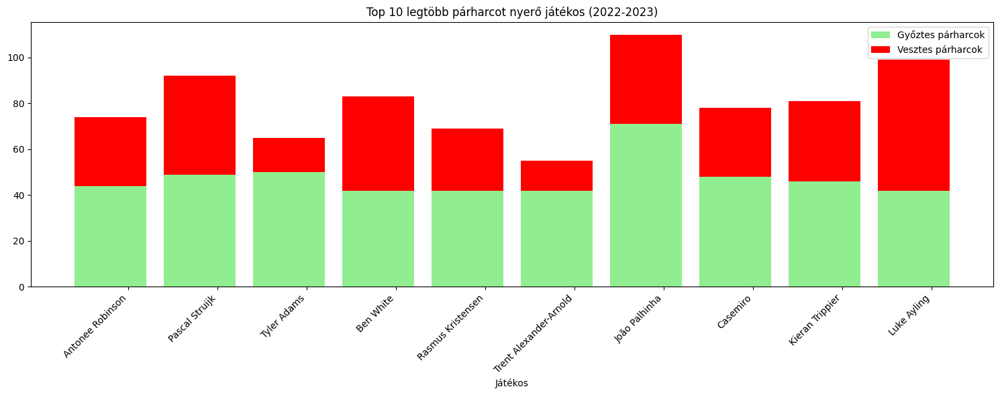

In [359]:
#Top 10 legtöbb párharcot nyerő játékos
top10_chl_2023_PL = PL2023.groupby('Player').agg({"Challenges_Tkl":'sum','Lost':'sum','Tkl%':'sum'}).nlargest(10,'Challenges_Tkl').reset_index()
top10_chl_2023_PL = top10_chl_2023_PL.sort_values(by="Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_chl_2023_PL["Player"], top10_chl_2023_PL['Challenges_Tkl'], color='lightgreen', label='Győztes párharcok')
plt.bar(top10_chl_2023_PL["Player"], top10_chl_2023_PL['Lost'], bottom=top10_chl_2023_PL['Challenges_Tkl'], color='red', label='Vesztes párharcok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb párharcot nyerő játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_chl_2023_PL['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


In [360]:
top10_chl_2023_PL

,Player,Challenges_Tkl,Lost,Tkl%
5,Antonee Robinson,44.0,30.0,67.7
2,Pascal Struijk,49.0,43.0,65.3
1,Tyler Adams,50.0,15.0,64.9
6,Ben White,42.0,41.0,60.0
8,Rasmus Kristensen,42.0,27.0,55.3
9,Trent Alexander-Arnold,42.0,13.0,53.2
0,João Palhinha,71.0,39.0,52.6
3,Casemiro,48.0,30.0,52.2
4,Kieran Trippier,46.0,35.0,51.1
7,Luke Ayling,42.0,57.0,49.4


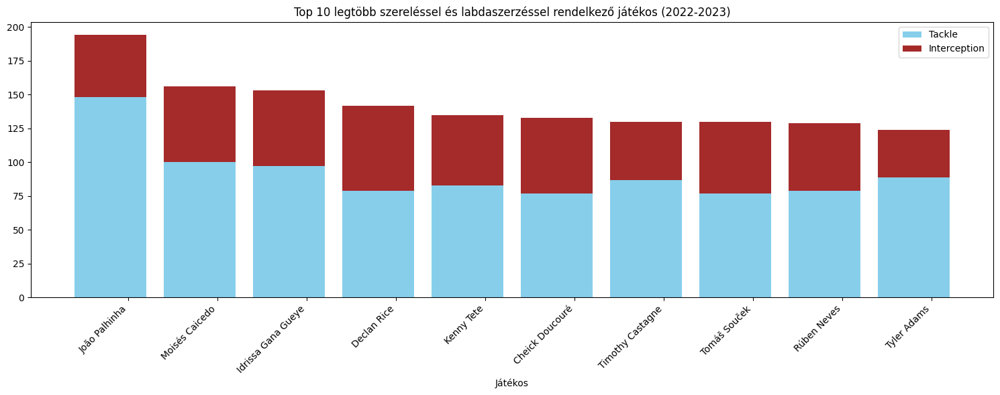

In [361]:
#Top 10 legtöbb párharcot nyerő játékos
top10_TklInt_2023_PL = PL2023.groupby('Player').agg({"Tkl":'sum','Int':'sum','Tkl+Int':'sum'}).nlargest(10,'Tkl+Int').reset_index()
top10_TklInt_2023_PL = top10_TklInt_2023_PL.sort_values(by="Tkl+Int",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_TklInt_2023_PL["Player"], top10_TklInt_2023_PL['Tkl'], color='skyblue', label='Tackle')
plt.bar(top10_TklInt_2023_PL["Player"], top10_TklInt_2023_PL['Int'], bottom=top10_TklInt_2023_PL['Tkl'], color='brown', label='Interception')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_TklInt_2023_PL['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-362-e17504704a06>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PL2023["Player(Team)"]=PL2023["Player"]+ "(" + PL2023["Team"] + ")"


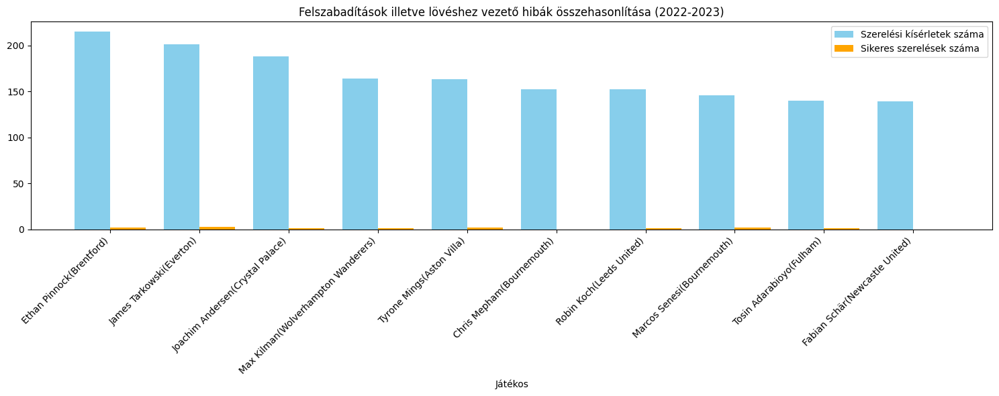

In [362]:
#Felszabadítások illetve lövéshez vezető hibák összehasonlítása
PL2023["Player(Team)"]=PL2023["Player"]+ "(" + PL2023["Team"] + ")"
top10_clrerr_2023_PL = PL2023.groupby('Player(Team)').agg({"Clr":'sum','Err':'sum'}).nlargest(10,'Clr').reset_index()
top10_clrerr_2023_PL = top10_clrerr_2023_PL.sort_values(by="Clr",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_clrerr_2023_PL))
plt.bar(index, top10_clrerr_2023_PL['Clr'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_clrerr_2023_PL['Err'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_clrerr_2023_PL['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

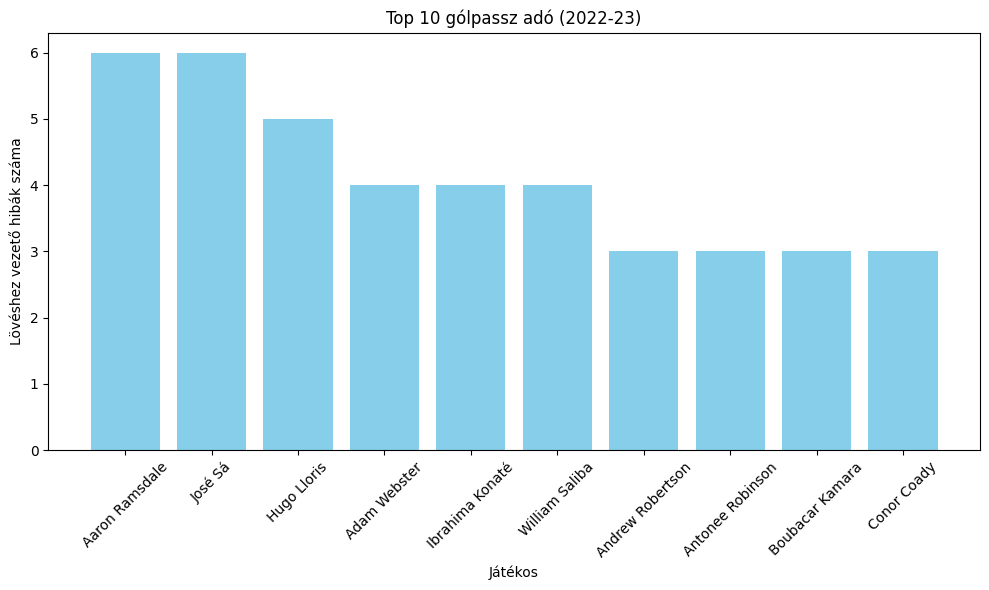

In [363]:
top_10_error_maker_2023_PL = PL2023.groupby('Player')["Err"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_error_maker_2023_PL['Player'], top_10_error_maker_2023_PL['Err'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Lövéshez vezető hibák száma')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-364-9c36fb5ecd36>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PL2023["Player(Team)"]=PL2023["Player"]+ "(" + PL2023["Team"] + ")"


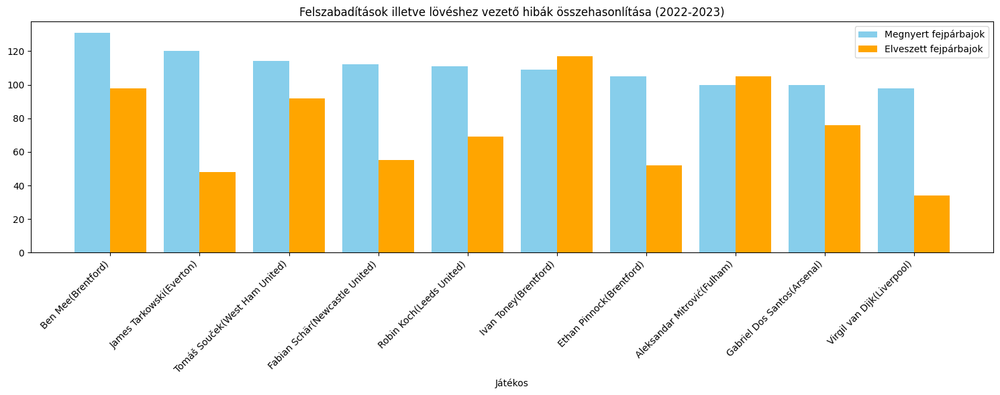

In [364]:
#Top 10 legtöbb fejpárbajt nyerő játékos
PL2023["Player(Team)"]=PL2023["Player"]+ "(" + PL2023["Team"] + ")"
top10_airduel_2023_PL = PL2023.groupby('Player(Team)').agg({"Won":'sum','Lost':'sum'}).nlargest(10,'Won').reset_index()
top10_airduel_2023_PL = top10_airduel_2023_PL.sort_values(by="Won",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_airduel_2023_PL))
plt.bar(index, top10_airduel_2023_PL['Won'], bar_width, color='skyblue', label='Megnyert fejpárbajok')
plt.bar([i + bar_width for i in index], top10_airduel_2023_PL['Lost'], bar_width, color='orange', label='Elveszett fejpárbajok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_airduel_2023_PL['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()

####Összefüggések keresése
Bizonoys játékosok statisztikái feltűnően gyengébbek az elvártnál, ezért meg szeretném vizsgálni, hogy ezen játékosok mélyrepülése hogyan hatott a csapatuk teljesítményére. Ehhez szükségem volt a bajnoki tabellára

In [365]:
PL_table=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/PL_tables.csv")

In [366]:
PL_table

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,Premier League
1,1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,Premier League
2,2,3,Manchester Utd,38,23,6,9,58,43,15,75,2022-2023,Premier League
3,3,4,Newcastle Utd,38,19,14,5,68,33,35,71,2022-2023,Premier League
4,4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,Premier League
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Southampton,38,9,12,17,45,65,-20,39,2018-2019,Premier League
96,16,17,Brighton,38,9,9,20,35,60,-25,36,2018-2019,Premier League
97,17,18,Cardiff City,38,10,4,24,34,69,-35,34,2018-2019,Premier League
98,18,19,Fulham,38,7,5,26,34,81,-47,26,2018-2019,Premier League


In [367]:
del PL_table["Unnamed: 0"]

In [368]:
PL_table

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,Premier League
1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,Premier League
2,3,Manchester Utd,38,23,6,9,58,43,15,75,2022-2023,Premier League
3,4,Newcastle Utd,38,19,14,5,68,33,35,71,2022-2023,Premier League
4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,Premier League
...,...,...,...,...,...,...,...,...,...,...,...,...
95,16,Southampton,38,9,12,17,45,65,-20,39,2018-2019,Premier League
96,17,Brighton,38,9,9,20,35,60,-25,36,2018-2019,Premier League
97,18,Cardiff City,38,10,4,24,34,69,-35,34,2018-2019,Premier League
98,19,Fulham,38,7,5,26,34,81,-47,26,2018-2019,Premier League


#####Premier League tabella 2022-2023

In [369]:
PL_table_2023=PL_table[PL_table["Season"]=="2022-2023"]
PL_table_2023

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,Premier League
1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,Premier League
2,3,Manchester Utd,38,23,6,9,58,43,15,75,2022-2023,Premier League
3,4,Newcastle Utd,38,19,14,5,68,33,35,71,2022-2023,Premier League
4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,Premier League
5,6,Brighton,38,18,8,12,72,53,19,62,2022-2023,Premier League
6,7,Aston Villa,38,18,7,13,51,46,5,61,2022-2023,Premier League
7,8,Tottenham,38,18,6,14,70,63,7,60,2022-2023,Premier League
8,9,Brentford,38,15,14,9,58,46,12,59,2022-2023,Premier League
9,10,Fulham,38,15,7,16,55,53,2,52,2022-2023,Premier League


#####A Leicester City kiesése

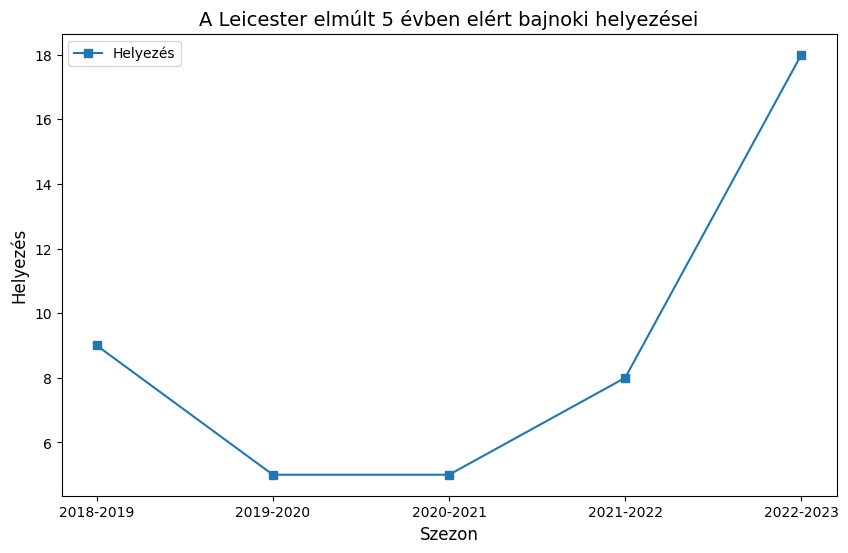

In [370]:
Leicester=PL_table[PL_table["Squad"]=="Leicester City"]
Leicester=Leicester[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Leicester["Season"])
ypoints = np.array(Leicester["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Leicester["Rk"], label='Helyezés', marker='s')

plt.title('A Leicester elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()

Mint az látható nagy meglepetésre a Leicester City 18-ik helyen végzett (tehát kiesett az első osztályból) a 2022-2023-as kiírásban, decára annak hogy előtte éveken stabilan top 10-es csapat volt. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

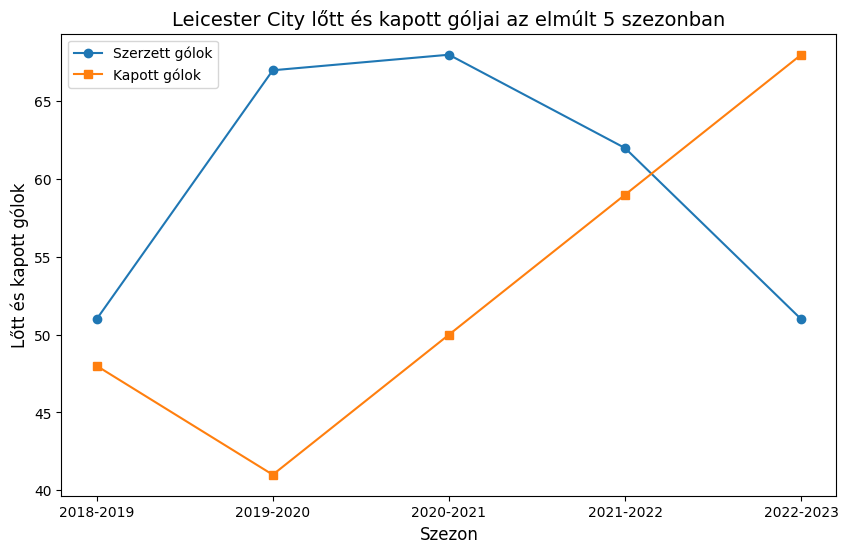

In [371]:
Leicester=PL_table[PL_table["Squad"]=="Leicester City"]
Leicester_gf_ga=Leicester[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Leicester_gf_ga["GF"])
ga = np.array(Leicester_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gf, label='Szerzett gólok', marker='o')
plt.plot(xpoints, ga, label='Kapott gólok', marker='s')

plt.title('Leicester City lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)


plt.legend()


plt.show()

Az ábrából kitűnik, hogy a korábbi évekhez képest sokkal kevesebb rúgtak és sokkal több gólt kaptak. Így a támadók és a védők teljesítményét egyaránt meg kell vizsgálni.

######Támadók

In [372]:
Leicester2022_2023=PL2023[PL2023["Team"]=="Leicester City"]
Leicester2022_2023_att=Leicester2022_2023[Leicester2022_2023['Pos'].str.contains(r'\bFW\b')]
Leicester2022_2023_att

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
615,Harvey Barnes,eng ENG,"FW,MF",24.0,34,32,2711.0,30.1,13.0,1.0,...,0.0,29.0,57.0,33.7,2022-2023,Leicester City,Premier League,3.0,53.846154,Harvey Barnes(Leicester City)
617,James Maddison,eng ENG,"MF,FW",25.0,30,28,2480.0,27.6,10.0,9.0,...,1.0,4.0,10.0,28.6,2022-2023,Leicester City,Premier League,10.0,50.980392,James Maddison(Leicester City)
622,Jamie Vardy,eng ENG,FW,35.0,37,19,1857.0,20.6,3.0,4.0,...,0.0,47.0,78.0,37.6,2022-2023,Leicester City,Premier League,1.0,50.000000,Jamie Vardy(Leicester City)
626,Patson Daka,zm ZAM,FW,23.0,30,13,1187.0,13.2,4.0,4.0,...,0.0,26.0,45.0,36.6,2022-2023,Leicester City,Premier League,2.0,57.142857,Patson Daka(Leicester City)
629,Kelechi Iheanacho,ng NGA,"FW,MF",25.0,28,11,1127.0,12.5,5.0,5.0,...,0.0,15.0,31.0,32.6,2022-2023,Leicester City,Premier League,0.0,28.571429,Kelechi Iheanacho(Leicester City)
633,Tetê,br BRA,FW,22.0,13,9,734.0,8.2,1.0,0.0,...,0.0,5.0,12.0,29.4,2022-2023,Leicester City,Premier League,0.0,57.142857,Tetê(Leicester City)
635,Dennis Praet,be BEL,"MF,FW",28.0,22,6,649.0,7.2,1.0,0.0,...,0.0,1.0,11.0,8.3,2022-2023,Leicester City,Premier League,1.0,75.000000,Dennis Praet(Leicester City)
638,Ayoze Pérez,es ESP,"MF,FW",29.0,8,3,382.0,4.2,0.0,1.0,...,0.0,2.0,4.0,33.3,2022-2023,Leicester City,Premier League,0.0,72.727273,Ayoze Pérez(Leicester City)
640,Marc Albrighton,eng ENG,"FW,MF",32.0,6,1,237.0,2.6,1.0,0.0,...,0.0,1.0,1.0,50.0,2022-2023,Leicester City,Premier League,0.0,25.000000,Marc Albrighton(Leicester City)


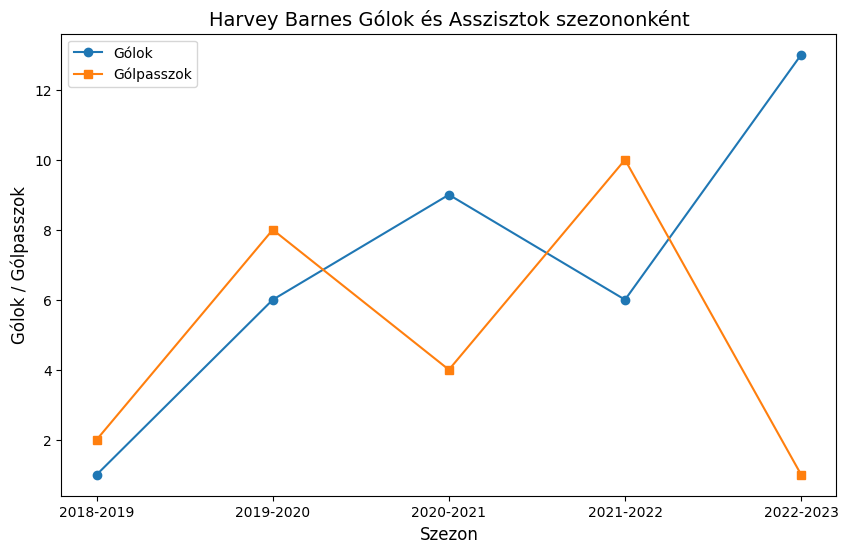

In [373]:
#Harvey Barnes
HarveyBarnes=PL[PL["Player"]=="Harvey Barnes"]
HarveyBarnes=HarveyBarnes[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(HarveyBarnes["Gls"])
ast = np.array(HarveyBarnes["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Harvey Barnes Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)


plt.legend()


plt.show()

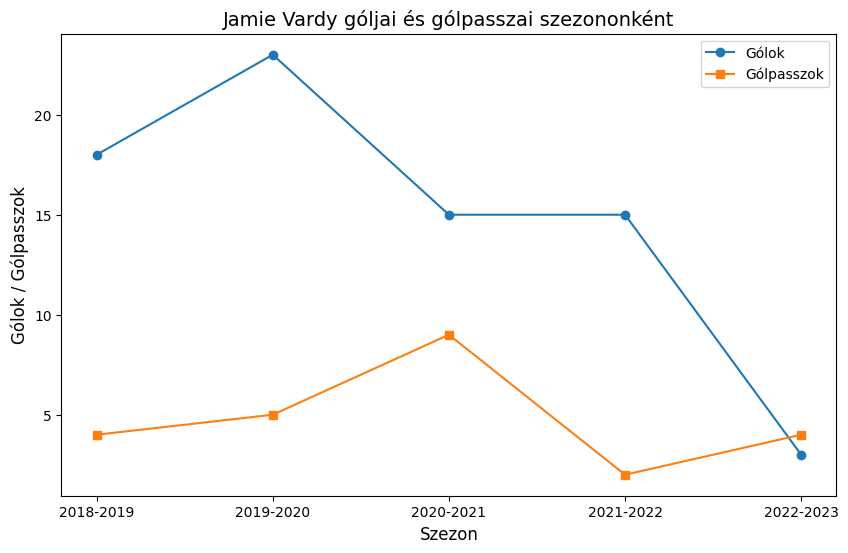

In [374]:
#Jamie Vardy
JamieVardy=PL[PL["Player"]=="Jamie Vardy"]
JamieVardy=JamieVardy[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(JamieVardy["Gls"])
ast = np.array(JamieVardy["Ast"])

# Az ábra inicializálása
plt.figure(figsize=(10, 6))  # Ábra mérete

# Gólok vonalának hozzáadása az ábrához
plt.plot(xpoints, gls, label='Gólok', marker='o')

# Asszisztok vonalának hozzáadása az ábrához
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

# Az ábra címe és tengelyfeliratai
plt.title('Jamie Vardy góljai és gólpasszai szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)

# Az ábra jelmagyarázata (legend)
plt.legend()

# Az ábra megjelenítése
plt.show()

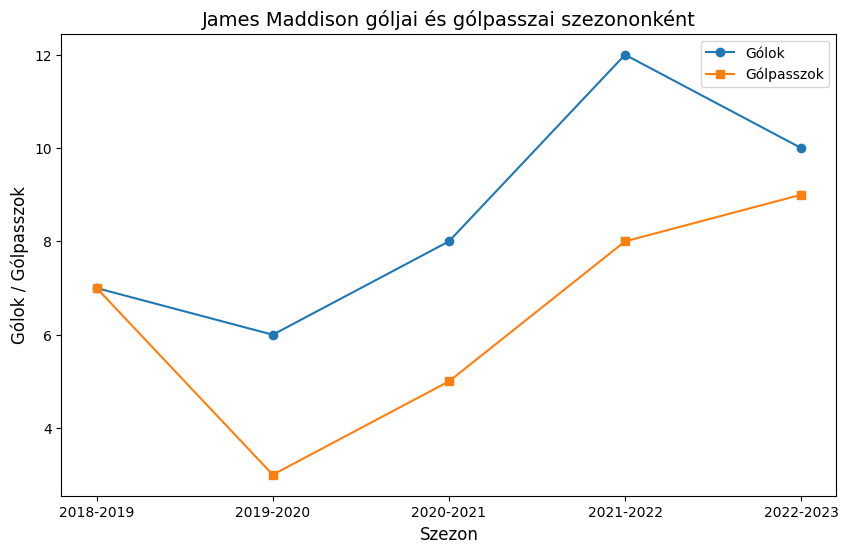

In [375]:
#James Maddison
Maddison=PL[PL["Player"]=="James Maddison"]
Maddison=Maddison[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Maddison["Gls"])
ast = np.array(Maddison["Ast"])

# Az ábra inicializálása
plt.figure(figsize=(10, 6))  # Ábra mérete

# Gólok vonalának hozzáadása az ábrához
plt.plot(xpoints, gls, label='Gólok', marker='o')

# Asszisztok vonalának hozzáadása az ábrához
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

# Az ábra címe és tengelyfeliratai
plt.title('James Maddison góljai és gólpasszai szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)

# Az ábra jelmagyarázata (legend)
plt.legend()

# Az ábra megjelenítése
plt.show()

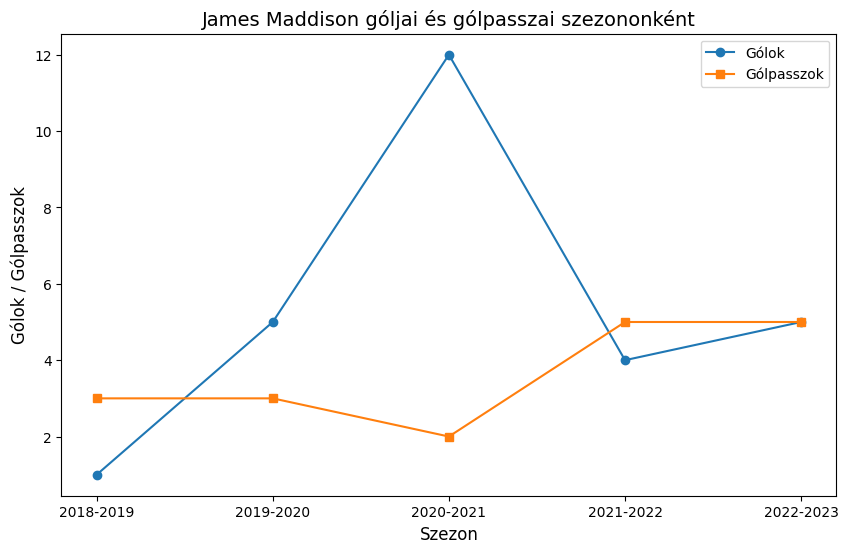

In [376]:
#Kelechi Iheanacho
Iheanacho=PL[PL["Player"]=="Kelechi Iheanacho"]
Iheanacho=Iheanacho[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Iheanacho["Gls"])
ast = np.array(Iheanacho["Ast"])

# Az ábra inicializálása
plt.figure(figsize=(10, 6))  # Ábra mérete

# Gólok vonalának hozzáadása az ábrához
plt.plot(xpoints, gls, label='Gólok', marker='o')

# Asszisztok vonalának hozzáadása az ábrához
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

# Az ábra címe és tengelyfeliratai
plt.title('James Maddison góljai és gólpasszai szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)

# Az ábra jelmagyarázata (legend)
plt.legend()

# Az ábra megjelenítése
plt.show()

A 4 vizsgált játékos húzóembere volt az évek alatt a Leicester City támadójátékának, azonban mindhárom játékos teljesítménye visszább esett, különösen Jamie Vardyé aki a csapat gólfelelőse volt és szezonokon át ott volt a legeredményesebb gól lövők között, azonban az ő teljesítménye drasztikusan visszaesett, ami a góllövést illeti.

######Középpályások

In [377]:
Leicester2022_2023=PL2023[PL2023["Team"]=="Leicester City"]
Leicester2022_2023_mf=Leicester2022_2023[Leicester2022_2023['Pos']=="MF"]
Leicester2022_2023_mf=Leicester2022_2023_mf[Leicester2022_2023['Starts']>=19]
Leicester2022_2023_mf

<ipython-input-377-869c21e7817d>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Leicester2022_2023_mf=Leicester2022_2023_mf[Leicester2022_2023['Starts']>=19]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
618,Kiernan Dewsbury-Hall,eng ENG,MF,23.0,31,28,2306.0,25.6,2.0,2.0,...,0.0,15.0,13.0,53.6,2022-2023,Leicester City,Premier League,6.0,54.716981,Kiernan Dewsbury-Hall(Leicester City)
619,Youri Tielemans,be BEL,MF,25.0,31,27,2344.0,26.0,3.0,2.0,...,1.0,26.0,12.0,68.4,2022-2023,Leicester City,Premier League,4.0,59.090909,Youri Tielemans(Leicester City)
621,Boubakary Soumaré,fr FRA,MF,23.0,26,20,1629.0,18.1,0.0,0.0,...,1.0,18.0,14.0,56.3,2022-2023,Leicester City,Premier League,9.0,59.649123,Boubakary Soumaré(Leicester City)
623,Wilfred Ndidi,ng NGA,MF,25.0,27,19,1679.0,18.7,0.0,0.0,...,3.0,25.0,22.0,53.2,2022-2023,Leicester City,Premier League,4.0,68.852459,Wilfred Ndidi(Leicester City)


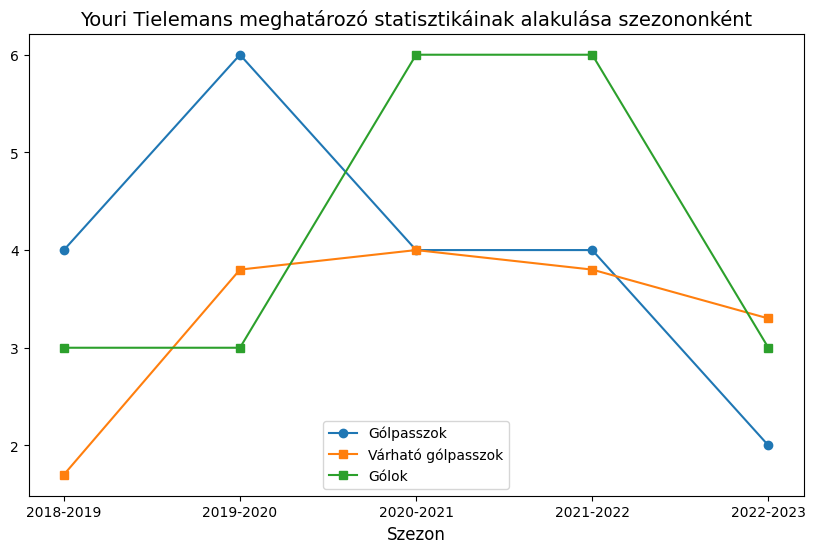

In [378]:
#Youri Tielemans
Tielemenas=PL[PL['Player']=="Youri Tielemans"]
Tielemenas=Tielemenas[["Gls","Ast","xA","Season"]].sort_values(by='Season', ascending=True)

Ast = np.array(Tielemenas["Ast"])
xA = np.array(Tielemenas["xA"])
Gls = np.array(Tielemenas["Gls"])
# Az ábra inicializálása
plt.figure(figsize=(10, 6))

plt.plot(xpoints, Ast, label='Gólpasszok', marker='o')
plt.plot(xpoints, xA, label='Várható gólpasszok', marker='s')
plt.plot(xpoints, Gls, label='Gólok', marker='s')


plt.title('Youri Tielemans meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

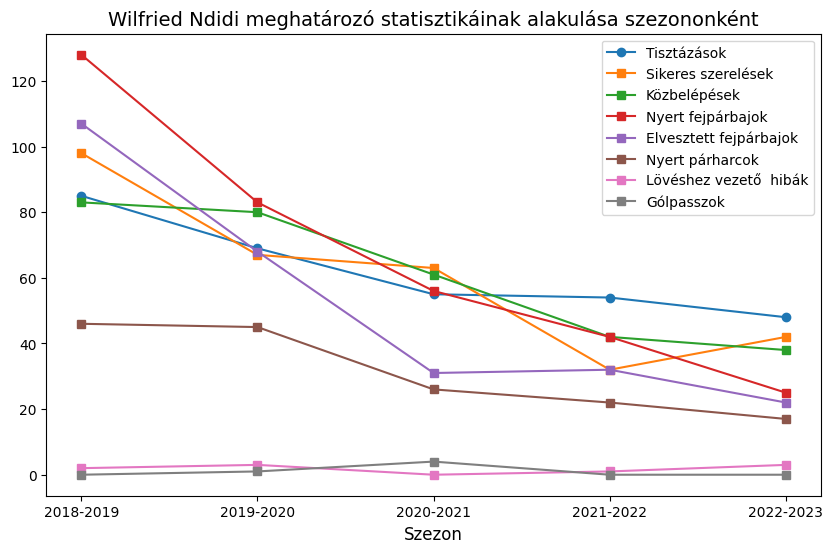

In [379]:
Ndidi=PL[PL['Player']=="Wilfred Ndidi"]
Ndidi=Ndidi[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Ndidi["Clr"])
TklW = np.array(Ndidi["TklW"])
Int = np.array(Ndidi["Int"])
Challenges_Tkl=np.array(Ndidi["Challenges_Tkl"])
Won = np.array(Ndidi["Won"])
Lost = np.array(Ndidi["Lost"])
Err= np.array(Ndidi["Err"])
Ast = np.array(Ndidi["Ast"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Wilfried Ndidi meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

Jól látható, hogy mindkét középpályás azon statisztikái amelyek meghatározzák a játékukat javarészt romlottak a szezonok során konstansan, tehát a csapatnak a pálya tengelyében is voltak problémái.

######Védők


In [380]:
Leicester2022_2023=PL2023[PL2023["Team"]=="Leicester City"]
Leicester2022_2023_df=Leicester2022_2023[Leicester2022_2023['Pos']=="DF"]
Leicester2022_2023_df=Leicester2022_2023_df[Leicester2022_2023['Starts']>=12]
Leicester2022_2023_df

<ipython-input-380-a596ce68508b>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Leicester2022_2023_df=Leicester2022_2023_df[Leicester2022_2023['Starts']>=12]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
614,Timothy Castagne,be BEL,DF,26.0,37,36,3254.0,36.2,2.0,3.0,...,0.0,55.0,62.0,47.0,2022-2023,Leicester City,Premier League,3.0,50.574713,Timothy Castagne(Leicester City)
616,Wout Faes,be BEL,DF,24.0,31,31,2786.0,31.0,1.0,2.0,...,2.0,58.0,41.0,58.6,2022-2023,Leicester City,Premier League,7.0,58.928571,Wout Faes(Leicester City)
624,Daniel Amartey,gh GHA,DF,27.0,20,18,1610.0,17.9,0.0,0.0,...,0.0,34.0,26.0,56.7,2022-2023,Leicester City,Premier League,1.0,42.105263,Daniel Amartey(Leicester City)
625,James Justin,eng ENG,DF,24.0,14,14,1252.0,13.9,0.0,0.0,...,0.0,23.0,32.0,41.8,2022-2023,Leicester City,Premier League,0.0,90.000000,James Justin(Leicester City)
628,Jonny Evans,nir NIR,DF,34.0,13,12,1051.0,11.7,0.0,0.0,...,0.0,26.0,13.0,66.7,2022-2023,Leicester City,Premier League,1.0,38.461538,Jonny Evans(Leicester City)


<ipython-input-381-fc233f75d6e8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Castagne.loc[len(Castagne)] = {'Ast': 0, 'Clr':0,'Season': "2018-2019",'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0,'Err': 0}
<ipython-input-381-fc233f75d6e8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Castagne.loc[len(Castagne)] = {'Ast': 0, 'Clr':0,'Season': "2019-2020",'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0,'Err': 0}


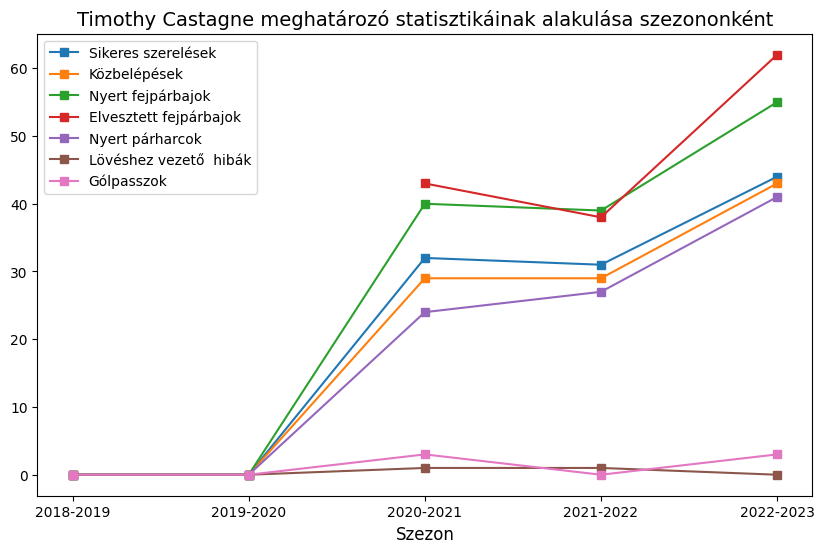

In [381]:
#Timothy Castagne
Castagne=PL[PL['Player']=="Timothy Castagne"]
Castagne.loc[len(Castagne)] = {'Ast': 0, 'Clr':0,'Season': "2018-2019",'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0,'Err': 0}
Castagne.loc[len(Castagne)] = {'Ast': 0, 'Clr':0,'Season': "2019-2020",'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0,'Err': 0}
Castagne=Castagne[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Castagne["Clr"])
TklW = np.array(Castagne["TklW"])
Int = np.array(Castagne["Int"])
Challenges_Tkl=np.array(Castagne["Challenges_Tkl"])
Won = np.array(Castagne["Won"])
Lost = np.array(Castagne["Lost"])
Err= np.array(Castagne["Err"])
Ast=np.array(Castagne["Ast"])

plt.figure(figsize=(10, 6))


plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Timothy Castagne meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

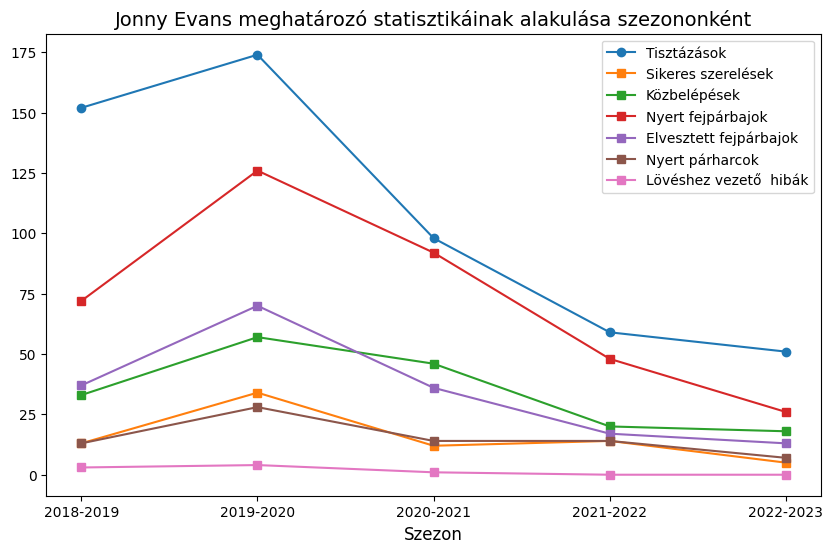

In [382]:
#Jonny Evans
Evans=PL[PL['Player']=="Jonny Evans"]
Evans=Evans[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Evans["Clr"])
TklW = np.array(Evans["TklW"])
Int = np.array(Evans["Int"])
Challenges_Tkl=np.array(Evans["Challenges_Tkl"])
Won = np.array(Evans["Won"])
Lost = np.array(Evans["Lost"])
Err= np.array(Evans["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Jonny Evans meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

A védők esetén ugyanaz figyelhető meg mint a középpályásoknál, kivéve Timothy Castagnet aki jó évet zárt, nem csoda, hogy nem tartott a másodosztályba a Leicesterrel.

######Kapus(ok)

In [383]:
Leicester2022_2023=PL2023[PL2023["Team"]=="Leicester City"]
Leicester2022_2023_gk=Leicester2022_2023[Leicester2022_2023['Pos']=="GK"]
Leicester2022_2023_gk=Leicester2022_2023_gk[Leicester2022_2023['Starts']>=26]
Leicester2022_2023_gk

<ipython-input-383-49d3ba13108a>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Leicester2022_2023_gk=Leicester2022_2023_gk[Leicester2022_2023['Starts']>=26]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
620,Danny Ward,wls WAL,GK,29.0,26,26,2340.0,26.0,0.0,0.0,...,2.0,3.0,0.0,100.0,2022-2023,Leicester City,Premier League,0.0,100.0,Danny Ward(Leicester City)


In [384]:
PL2019=PL[PL['Season']=='2018-2019']
Leicester2018_2019=PL2019[PL2019["Team"]=="Leicester City"]
Leicester2018_2019_gk=Leicester2018_2019[Leicester2018_2019['Pos']=="GK"]
Leicester2018_2019_gk=Leicester2018_2019_gk[Leicester2018_2019_gk['Starts']>=38]
Leicester2018_2019_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
2910,Kasper Schmeichel,dk DEN,GK,31.0,38,38,3420.0,38.0,0.0,0.0,...,3.0,4.0,14.0,3.0,10.0,1.0,90.9,2018-2019,Leicester City,Premier League


In [385]:
PL2020=PL[PL['Season']=='2019-2020']
Leicester2019_2020=PL2020[PL2020["Team"]=="Leicester City"]
Leicester2019_2020_gk=Leicester2019_2020[Leicester2019_2020['Pos']=="GK"]
Leicester2019_2020_gk=Leicester2019_2020_gk[Leicester2019_2020_gk['Starts']>=38]
Leicester2019_2020_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
2184,Kasper Schmeichel,dk DEN,GK,32.0,38,38,3420.0,38.0,0.0,0.0,...,1.0,2.0,4.0,2.0,6.0,2.0,75.0,2019-2020,Leicester City,Premier League


In [386]:
PL2021=PL[PL['Season']=='2020-2021']
Leicester2020_2021=PL2021[PL2021["Team"]=="Leicester City"]
Leicester2020_2021_gk=Leicester2020_2021[Leicester2020_2021['Pos']=="GK"]
Leicester2020_2021_gk=Leicester2020_2021_gk[Leicester2020_2021_gk['Starts']>=38]
Leicester2020_2021_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
1544,Kasper Schmeichel,dk DEN,GK,33.0,38,38,3420.0,38.0,0.0,0.0,...,0.0,0.0,10.0,0.0,10.0,0.0,100.0,2020-2021,Leicester City,Premier League


In [387]:
PL2022=PL[PL['Season']=='2021-2022']
Leicester2021_2022=PL2022[PL2022["Team"]=="Leicester City"]
Leicester2021_2022_gk=Leicester2021_2022[Leicester2021_2022['Pos']=="GK"]
Leicester2021_2022_gk=Leicester2021_2022_gk[Leicester2021_2022_gk['Starts']>=37]
Leicester2021_2022_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
965,Kasper Schmeichel,dk DEN,GK,34.0,37,37,3330.0,37.0,0.0,0.0,...,1.0,1.0,15.0,2.0,9.0,4.0,69.2,2021-2022,Leicester City,Premier League


In [388]:
gk_df = pd.concat([Leicester2022_2023_gk, Leicester2021_2022_gk, Leicester2020_2021_gk, Leicester2019_2020_gk, Leicester2018_2019_gk], ignore_index=True)
gk_df


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
0,Danny Ward,wls WAL,GK,29.0,26,26,2340.0,26.0,0.0,0.0,...,2.0,3.0,0.0,100.0,2022-2023,Leicester City,Premier League,0.0,100.0,Danny Ward(Leicester City)
1,Kasper Schmeichel,dk DEN,GK,34.0,37,37,3330.0,37.0,0.0,0.0,...,2.0,9.0,4.0,69.2,2021-2022,Leicester City,Premier League,NaN,NaN,NaN
2,Kasper Schmeichel,dk DEN,GK,33.0,38,38,3420.0,38.0,0.0,0.0,...,0.0,10.0,0.0,100.0,2020-2021,Leicester City,Premier League,NaN,NaN,NaN
3,Kasper Schmeichel,dk DEN,GK,32.0,38,38,3420.0,38.0,0.0,0.0,...,2.0,6.0,2.0,75.0,2019-2020,Leicester City,Premier League,NaN,NaN,NaN
4,Kasper Schmeichel,dk DEN,GK,31.0,38,38,3420.0,38.0,0.0,0.0,...,3.0,10.0,1.0,90.9,2018-2019,Leicester City,Premier League,NaN,NaN,NaN


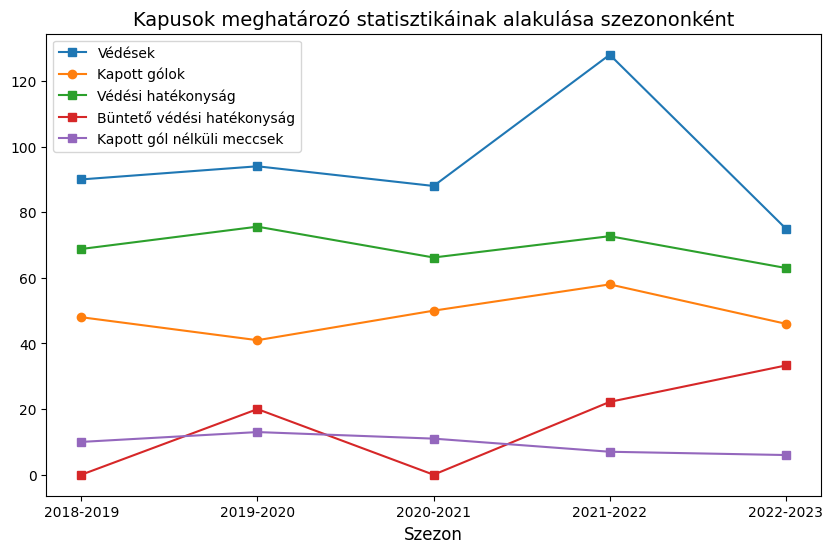

In [389]:
gk=gk_df[["Player","GA","Saves","Save%","PK_Save%","CS","Season"]].sort_values(by='Season', ascending=True)

GA = np.array(gk["GA"])
Save = np.array(gk["Save%"])
PK_Save = np.array(gk["PK_Save%"])
CS=np.array(gk["CS"])
Saves = np.array(gk["Saves"])

plt.figure(figsize=(10, 6))
plt.plot(xpoints, Saves, label='Védések', marker='s')
plt.plot(xpoints, GA, label='Kapott gólok', marker='o')
plt.plot(xpoints, Save, label='Védési hatékonyság', marker='s')
plt.plot(xpoints, PK_Save, label='Büntető védési hatékonyság', marker='s')
plt.plot(xpoints, CS, label='Kapott gól nélküli meccsek', marker='s')


plt.title('Kapusok meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

Kapusok terén, megállapítható hogy Kasper Schmeichel 2022-es távozásával olyan ürt hagyott maga után amelyet Danny Ward nem tudott betölteni, de itt azért nem olyan vészes a statisztikák változása, sőt vannak statisztikák amelyekben jobban is teljesített Ward.

######**ÖSSZEGZÉS**
Összegzés gyanánt megállapítható, hogy a Leicester City vesztét húzóembereinek a teljesítményének a drasztikus visszaesése okozta.

#####Az Arsenal felemelkedése

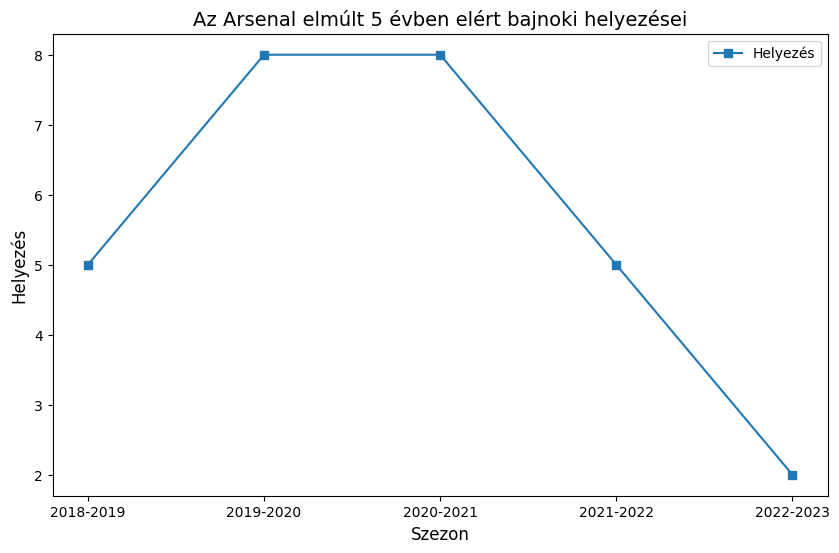

In [390]:
Arsenal=PL_table[PL_table["Squad"]=="Arsenal"]
Arsenal=Arsenal[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Arsenal["Season"])
ypoints = np.array(Arsenal["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Arsenal["Rk"], label='Helyezés', marker='s')

plt.title('Az Arsenal elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()

Mint az látható nagy meglepetésre az Arsenal a 2-ik, bajnokok ligája indulást jelentő helyen végzett a 2022-2023-as kiírásban, decára annak hogy előtte éveken át top 4-be se került a csapat. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

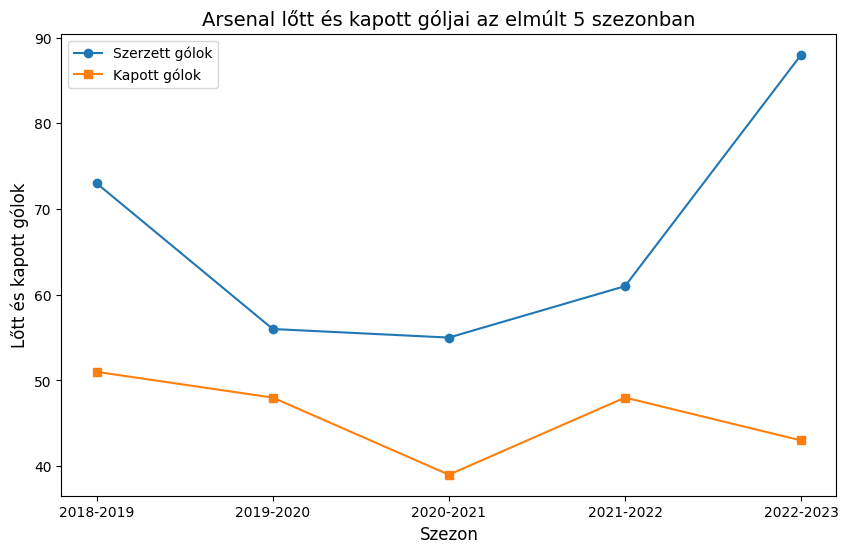

In [391]:
Arsenal=PL_table[PL_table["Squad"]=="Arsenal"]
Arsenal_gf_ga=Arsenal[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Arsenal_gf_ga["GF"])
ga = np.array(Arsenal_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gf, label='Szerzett gólok', marker='o')
plt.plot(xpoints, ga, label='Kapott gólok', marker='s')

plt.title('Arsenal lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)
plt.legend()
plt.show()

Az ábrából kitűnik, hogy a korábbi évekhez képest sokkal több gólt rúgtak és valamennyivel kevesebb több gólt kaptak. Így itt inkább a támadók teljesítményét elemeztem

######Támadók

In [392]:
Arsenal2022_2023=PL2023[PL2023["Team"]=="Arsenal"]
Arsenal2022_2023_att=Arsenal2022_2023[Arsenal2022_2023['Pos'].str.contains(r'\bFW\b')]
Arsenal2022_2023_att

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
34,Bukayo Saka,eng ENG,FW,20.0,38,37,3181.0,35.3,14.0,11.0,...,0.0,16.0,38.0,29.6,2022-2023,Arsenal,Premier League,6.0,53.968254,Bukayo Saka(Arsenal)
38,Gabriel Martinelli,br BRA,FW,21.0,36,34,2789.0,31.0,15.0,5.0,...,0.0,14.0,63.0,18.2,2022-2023,Arsenal,Premier League,3.0,58.064516,Gabriel Martinelli(Arsenal)
42,Gabriel Jesus,br BRA,FW,25.0,26,24,2064.0,22.9,11.0,6.0,...,1.0,44.0,78.0,36.1,2022-2023,Arsenal,Premier League,6.0,75.757576,Gabriel Jesus(Arsenal)
43,Leandro Trossard,be BEL,FW,27.0,20,10,931.0,10.3,1.0,10.0,...,1.0,1.0,4.0,20.0,2022-2023,Arsenal,Premier League,0.0,58.333333,Leandro Trossard(Arsenal)
44,Eddie Nketiah,eng ENG,FW,23.0,30,9,1089.0,12.1,4.0,1.0,...,0.0,10.0,31.0,24.4,2022-2023,Arsenal,Premier League,3.0,69.230769,Eddie Nketiah(Arsenal)
50,Fabio Vieira,pt POR,"MF,FW",22.0,22,3,514.0,5.7,1.0,2.0,...,0.0,3.0,5.0,37.5,2022-2023,Arsenal,Premier League,0.0,66.666667,Fabio Vieira(Arsenal)
53,Reiss Nelson,eng ENG,FW,22.0,11,0,212.0,2.4,3.0,2.0,...,0.0,2.0,5.0,28.6,2022-2023,Arsenal,Premier League,0.0,25.000000,Reiss Nelson(Arsenal)
54,Emile Smith Rowe,eng ENG,"MF,FW",22.0,12,0,172.0,1.9,0.0,2.0,...,0.0,0.0,2.0,0.0,2022-2023,Arsenal,Premier League,0.0,100.000000,Emile Smith Rowe(Arsenal)
57,Ethan Nwaneri,eng ENG,FW,15.0,1,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Arsenal,Premier League,0.0,NaN,Ethan Nwaneri(Arsenal)
59,Nathan Butler-Oyedeji,eng ENG,FW,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Arsenal,Premier League,0.0,NaN,Nathan Butler-Oyedeji(Arsenal)


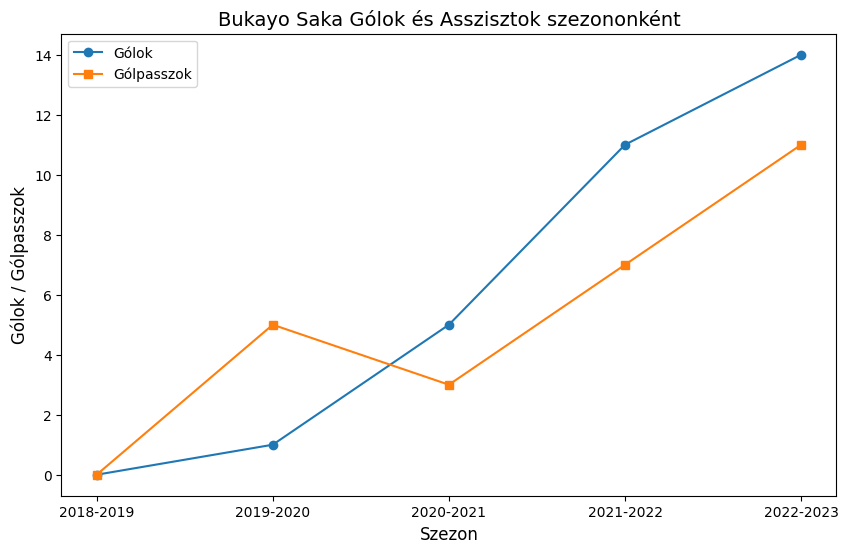

In [393]:
Saka=PL[PL["Player"]=="Bukayo Saka"]
Saka=Saka[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Saka["Gls"])
ast = np.array(Saka["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Bukayo Saka Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)


plt.legend()


plt.show()


<ipython-input-394-9ceaaac40e58>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Martinelli.loc[len(Martinelli)] = {'Gls': 0, 'Ast':0,'Season': "2018-2019"}


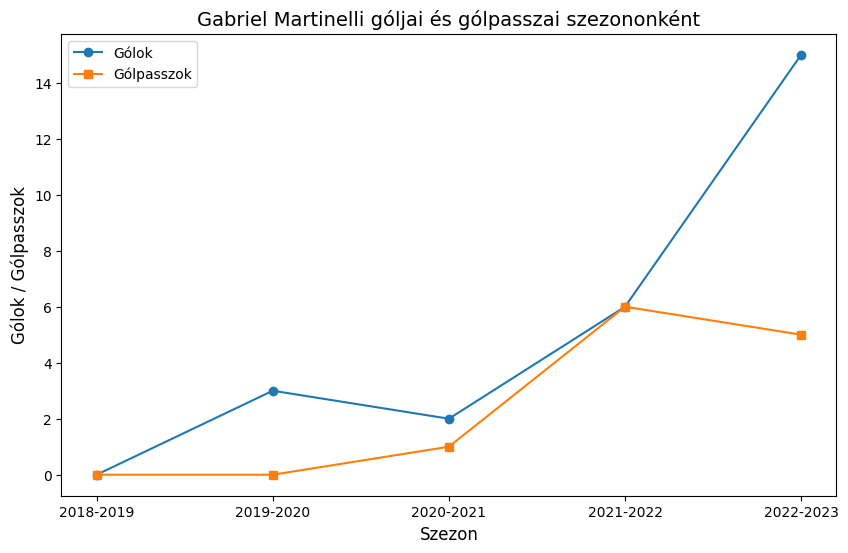

In [394]:
#Gabriel Martinelli

Martinelli=PL[PL["Player"]=="Gabriel Martinelli"]
Martinelli.loc[len(Martinelli)] = {'Gls': 0, 'Ast':0,'Season': "2018-2019"}
Martinelli=Martinelli[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)


gls = np.array(Martinelli["Gls"])
ast = np.array(Martinelli["Ast"])

# Az ábra inicializálása
plt.figure(figsize=(10, 6))  # Ábra mérete

# Gólok vonalának hozzáadása az ábrához
plt.plot(xpoints, gls, label='Gólok', marker='o')

# Asszisztok vonalának hozzáadása az ábrához
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

# Az ábra címe és tengelyfeliratai
plt.title('Gabriel Martinelli góljai és gólpasszai szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)

plt.legend()
plt.show()

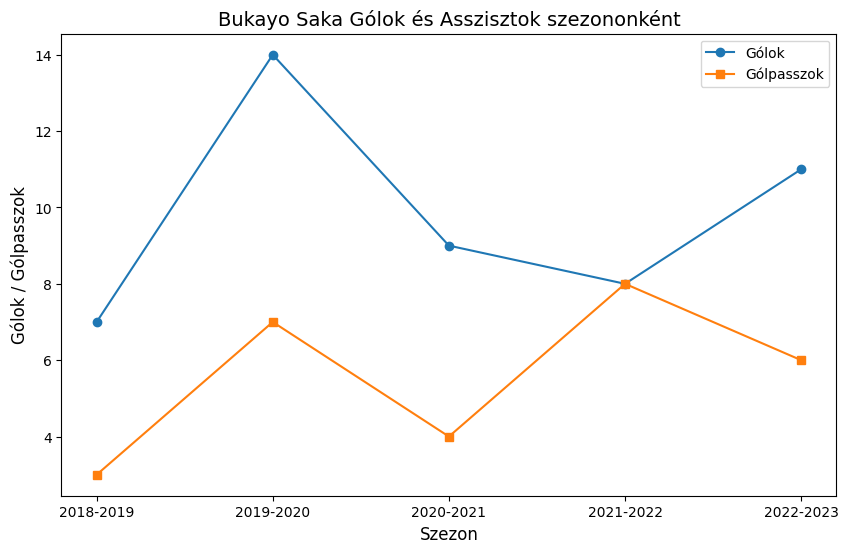

In [395]:
Jesus=PL[PL["Player"]=="Gabriel Jesus"]
Jesus=Jesus[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Jesus["Gls"])
ast = np.array(Jesus["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Bukayo Saka Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)


plt.legend()


plt.show()

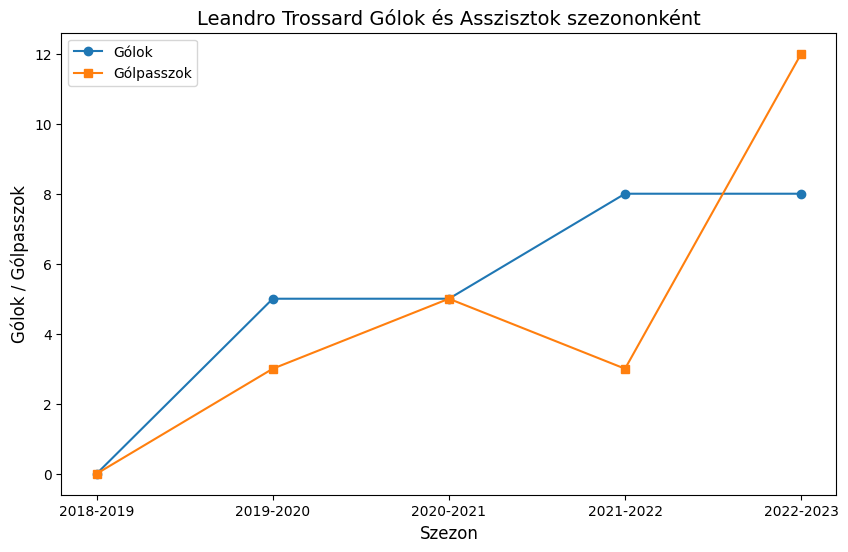

In [396]:
Trossard2023=PL2023[PL2023['Player']=='Leandro Trossard']
Trossard2023 = Trossard2023.groupby('Player').agg({"Gls":'sum','Ast':'sum','Season':lambda x: x.iloc[0]}).reset_index()

Trossard2022=PL2022[PL2022['Player']=='Leandro Trossard']
Trossard2021=PL2021[PL2021['Player']=='Leandro Trossard']
Trossard2020=PL2020[PL2020['Player']=='Leandro Trossard']
Trossard = pd.concat([Trossard2023, Trossard2022, Trossard2021, Trossard2020], ignore_index=True)
Trossard.loc[len(Trossard)] = {'Gls': 0, 'Ast':0,'Season': "2018-2019"}
Trossard=Trossard[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Trossard["Gls"])
ast = np.array(Trossard["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Leandro Trossard Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)


plt.legend()


plt.show()

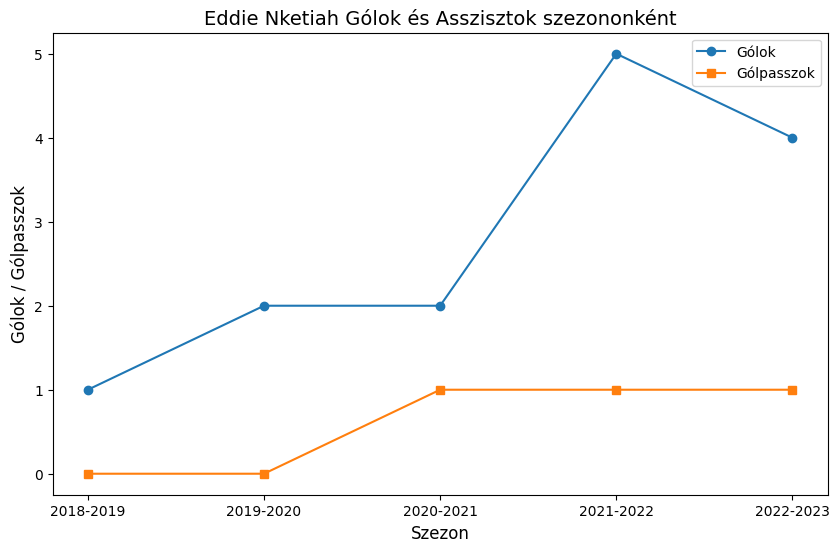

In [397]:
Nketiah=PL[PL["Player"]=="Eddie Nketiah"]
Nketiah=Nketiah[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Nketiah["Gls"])
ast = np.array(Nketiah["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Eddie Nketiah Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)


plt.legend()


plt.show()

######Középpálya

In [398]:
Arsenal2022_2023=PL2023[PL2023["Team"]=="Arsenal"]
Arsenal2022_2023_mf=Arsenal2022_2023[Arsenal2022_2023['Pos']=="MF"]
Arsenal2022_2023_mf

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
35,Martin Ødegaard,no NOR,MF,23.0,37,37,3127.0,34.7,15.0,7.0,...,1.0,13.0,20.0,39.4,2022-2023,Arsenal,Premier League,4.0,63.888889,Martin Ødegaard(Arsenal)
37,Granit Xhaka,ch SUI,MF,29.0,37,36,2993.0,33.3,7.0,7.0,...,1.0,37.0,30.0,55.2,2022-2023,Arsenal,Premier League,4.0,79.411765,Granit Xhaka(Arsenal)
39,Thomas Partey,gh GHA,MF,29.0,33,28,2483.0,27.6,3.0,0.0,...,1.0,37.0,25.0,59.7,2022-2023,Arsenal,Premier League,5.0,57.142857,Thomas Partey(Arsenal)
45,Jorginho,it ITA,MF,30.0,14,9,855.0,9.5,0.0,1.0,...,0.0,10.0,8.0,55.6,2022-2023,Arsenal,Premier League,0.0,72.222222,Jorginho(Arsenal)
51,Albert Sambi Lokonga,be BEL,MF,22.0,6,2,198.0,2.2,0.0,0.0,...,0.0,3.0,2.0,60.0,2022-2023,Arsenal,Premier League,0.0,100.000000,Albert Sambi Lokonga(Arsenal)
52,Mohamed Elneny,eg EGY,MF,30.0,5,1,113.0,1.3,0.0,0.0,...,0.0,0.0,2.0,0.0,2022-2023,Arsenal,Premier League,0.0,100.000000,Mohamed Elneny(Arsenal)
56,Marquinhos,br BRA,MF,19.0,1,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Arsenal,Premier League,0.0,NaN,Marquinhos(Arsenal)
58,Mauro Bandeira,pt POR,MF,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Arsenal,Premier League,0.0,NaN,Mauro Bandeira(Arsenal)
63,Matthew Smith,eng ENG,MF,21.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Arsenal,Premier League,0.0,NaN,Matthew Smith(Arsenal)


<ipython-input-399-a71fa23ce3b6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Odegaard.loc[len(Odegaard)] = {'Gls': 0, 'Ast':0,'Season': "2018-2019"}
<ipython-input-399-a71fa23ce3b6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Odegaard.loc[len(Odegaard)] = {'Gls': 0, 'Ast':0,'Season': "2019-2020"}


Text(0, 0.5, 'Gólok / Gólpasszok')

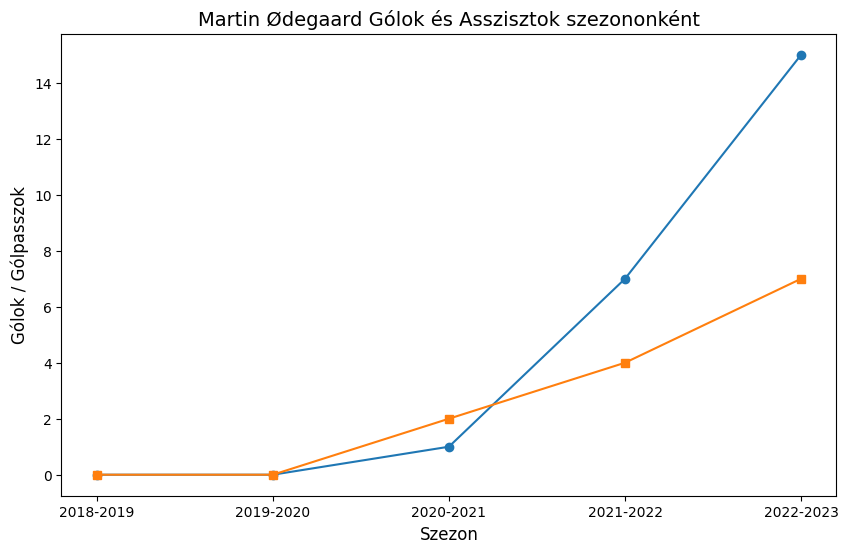

In [399]:
Odegaard=PL[PL["Player"]=="Martin Ødegaard"]
Odegaard.loc[len(Odegaard)] = {'Gls': 0, 'Ast':0,'Season': "2018-2019"}
Odegaard.loc[len(Odegaard)] = {'Gls': 0, 'Ast':0,'Season': "2019-2020"}
Odegaard=Odegaard[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)
gls = np.array(Odegaard["Gls"])
ast = np.array(Odegaard["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Martin Ødegaard Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)

A 6 vizsgált játékos húzóembere volt az évek alatt a Arsenal támadójátékának, és mindegyik játékos teljesítménye növekvő tendenciát mutat ezáltal kijelenthető, hogy az Arsenal sikerrességének kulcsa a 2022-2023-as szezonban támadójátékának minőségében rejlett.

#####A Liverpool mélyrepülése

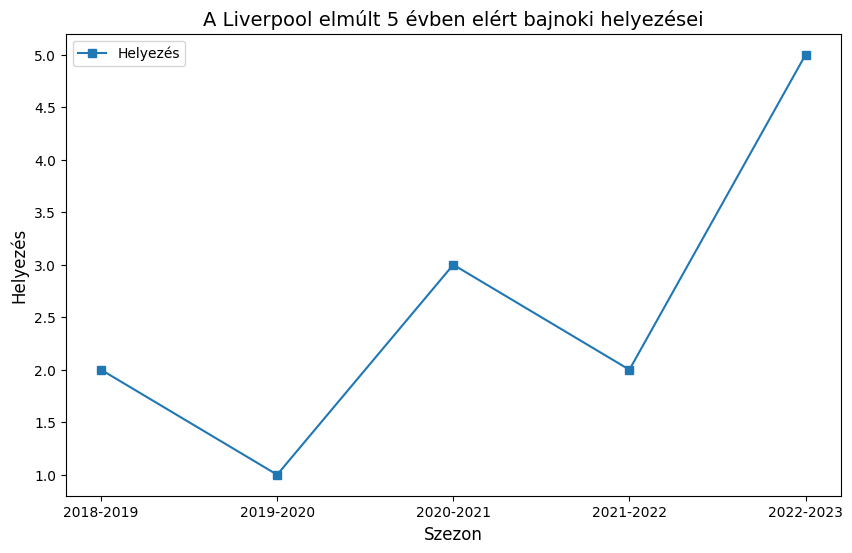

In [400]:
Liverpool=PL_table[PL_table["Squad"]=="Liverpool"]
Liverpool=Liverpool[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Liverpool["Season"])
ypoints = np.array(Liverpool["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Liverpool["Rk"], label='Helyezés', marker='s')

plt.title('A Liverpool elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()

Mint az látható nagy meglepetésre a Liverpool 5-ik helyen végzett (tehát nem jutott be a bajnokok ligájába) a 2022-2023-as kiírásban, decára annak, hogy előtte éveken át stabilan top 3-ban végzett a csapat. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

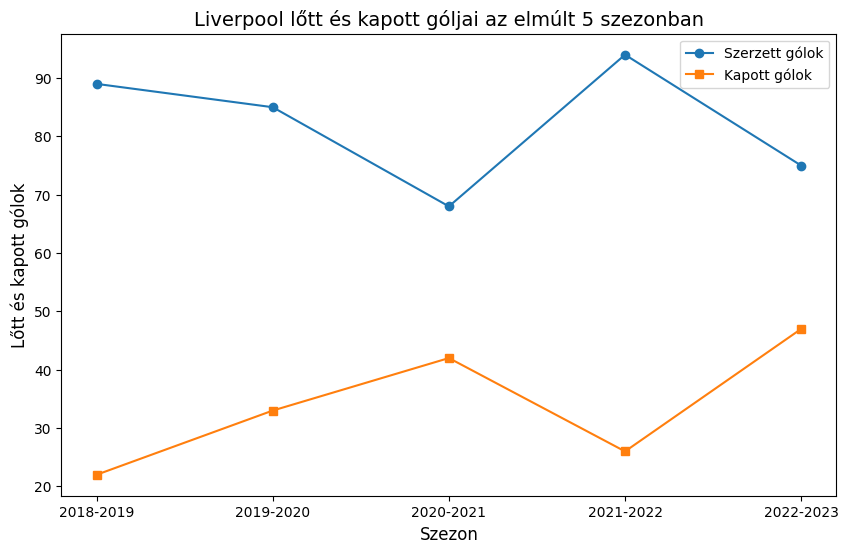

In [401]:
Liverpool=PL_table[PL_table["Squad"]=="Liverpool"]
Liverpool_gf_ga=Liverpool[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Liverpool_gf_ga["GF"])
ga = np.array(Liverpool_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gf, label='Szerzett gólok', marker='o')
plt.plot(xpoints, ga, label='Kapott gólok', marker='s')

plt.title('Liverpool lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)


plt.legend()


plt.show()

Az ábrából kitűnik, hogy a 2022-2023-as szezonhoz képest sokkal kevesebb gólt rúgtak és sokkal több gólt kaptak. Így a támadók és a védők teljesítményét egyaránt meg kell vizsgálni.

######Támadók

In [402]:
Liverpool2022_2023=PL2023[PL2023["Team"]=="Liverpool"]
Liverpool2022_2023_att=Liverpool2022_2023[Liverpool2022_2023['Pos'].str.contains(r'\bFW\b')]
Liverpool2022_2023_att

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
137,Mohamed Salah,eg EGY,FW,30.0,38,37,3290.0,36.6,19.0,12.0,...,0.0,8.0,30.0,21.1,2022-2023,Liverpool,Premier League,2.0,57.142857,Mohamed Salah(Liverpool)
143,Darwin Núñez,uy URU,FW,23.0,29,19,1695.0,18.8,9.0,3.0,...,0.0,36.0,51.0,41.4,2022-2023,Liverpool,Premier League,2.0,45.454545,Darwin Núñez(Liverpool)
144,Harvey Elliott,eng ENG,"MF,FW",19.0,32,18,1613.0,17.9,1.0,2.0,...,0.0,4.0,16.0,20.0,2022-2023,Liverpool,Premier League,2.0,66.666667,Harvey Elliott(Liverpool)
146,Cody Gakpo,nl NED,"FW,MF",23.0,21,17,1458.0,16.2,7.0,2.0,...,0.0,26.0,24.0,52.0,2022-2023,Liverpool,Premier League,0.0,57.692308,Cody Gakpo(Liverpool)
149,Roberto Firmino,br BRA,"FW,MF",30.0,25,13,1213.0,13.5,11.0,4.0,...,0.0,15.0,30.0,33.3,2022-2023,Liverpool,Premier League,0.0,70.588235,Roberto Firmino(Liverpool)
150,Diogo Jota,pt POR,FW,25.0,22,12,1131.0,12.6,7.0,4.0,...,0.0,18.0,26.0,40.9,2022-2023,Liverpool,Premier League,2.0,65.217391,Diogo Jota(Liverpool)
153,Luis Díaz,co COL,FW,25.0,17,11,996.0,11.1,4.0,2.0,...,0.0,8.0,23.0,25.8,2022-2023,Liverpool,Premier League,2.0,64.705882,Luis Díaz(Liverpool)
157,Fabio Carvalho,pt POR,"MF,FW",19.0,13,4,347.0,3.9,2.0,0.0,...,0.0,4.0,10.0,28.6,2022-2023,Liverpool,Premier League,0.0,100.000000,Fabio Carvalho(Liverpool)
158,Alex Oxlade-Chamberlain,eng ENG,"FW,MF",28.0,9,4,335.0,3.7,1.0,0.0,...,0.0,1.0,4.0,20.0,2022-2023,Liverpool,Premier League,0.0,80.000000,Alex Oxlade-Chamberlain(Liverpool)
162,Ben Doak,sct SCO,FW,16.0,2,0,26.0,0.3,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Liverpool,Premier League,0.0,66.666667,Ben Doak(Liverpool)


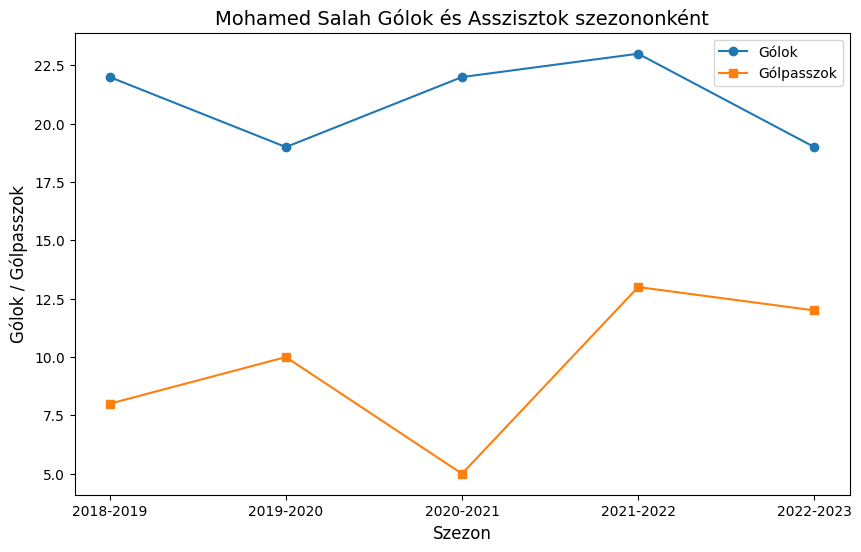

In [403]:
#Mohamed Salah
Salah=PL[PL["Player"]=="Mohamed Salah"]
Salah=Salah[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Salah["Gls"])
ast = np.array(Salah["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Mohamed Salah Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)
plt.legend()
plt.show()

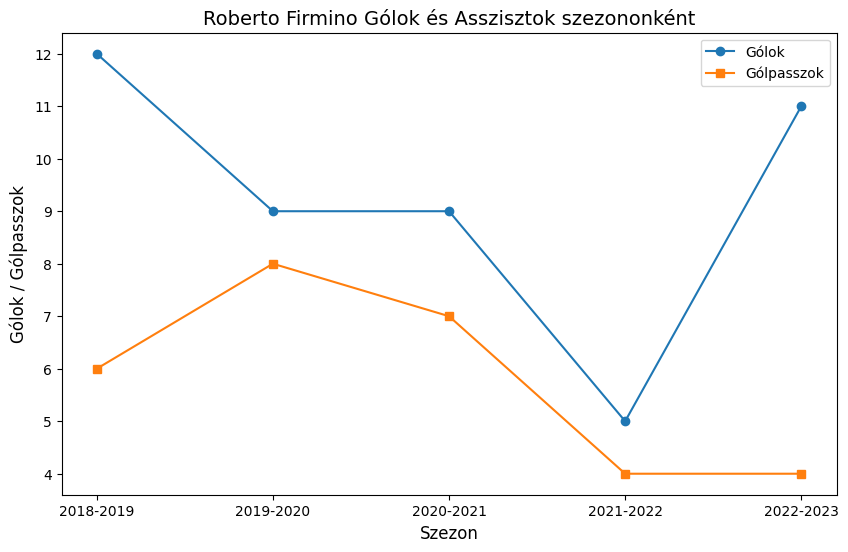

In [404]:
#Roberto Firmino
Firmino=PL[PL["Player"]=="Roberto Firmino"]
Firmino=Firmino[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Firmino["Gls"])
ast = np.array(Firmino["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Roberto Firmino Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)
plt.legend()
plt.show()

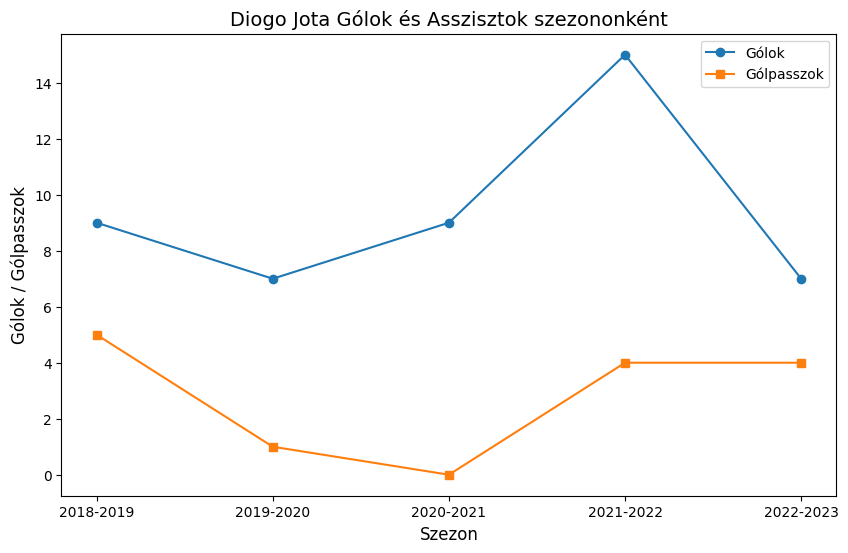

In [405]:
#Diogo Jota
Jota2023=PL2023[PL2023['Player']=='Diogo Jota']
Jota2022=PL2022[PL2022['Player']=='Diogo Jota']
Jota2021=PL2021[PL2021['Player']=='Diogo Jota']
Jota2021 = Jota2021.groupby('Player').agg({"Gls":'sum','Ast':'sum','Season':lambda x: x.iloc[0]}).reset_index()
Jota2020=PL2020[PL2020['Player']=='Diogo Jota']
Jota2019=PL2019[PL2019['Player']=='Diogo Jota']
Jota = pd.concat([Jota2023, Jota2022, Jota2021, Jota2020,Jota2019], ignore_index=True)
Jota=Jota[["Gls","Ast","Season"]].sort_values(by='Season', ascending=True)

gls = np.array(Jota["Gls"])
ast = np.array(Jota["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, gls, label='Gólok', marker='o')
plt.plot(xpoints, ast, label='Gólpasszok', marker='s')

plt.title('Diogo Jota Gólok és Asszisztok szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)


plt.legend()


plt.show()

A 3 vizsgált játékos húzóembere volt az évek alatt a Liverpool támadójátékának, azonban Mohamed Salah illetve Diogo Jota teljesítménye is visszább esett, különösen Diogo Jotaé aki a csapat egyik gólfelelőse volt, de Salah teljesítménye is romló tendeciát mutatott.

######Középpályások

In [406]:
Liverpool2022_2023=PL2023[PL2023["Team"]=="Liverpool"]
Liverpool2022_2023_mf=Liverpool2022_2023[Liverpool2022_2023['Pos']=="MF"]
Liverpool2022_2023_mf

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
140,Fabinho,br BRA,MF,28.0,36,31,2671.0,29.7,0.0,2.0,...,0.0,30.0,21.0,58.8,2022-2023,Liverpool,Premier League,11.0,58.461538,Fabinho(Liverpool)
142,Jordan Henderson,eng ENG,MF,32.0,35,23,2074.0,23.0,0.0,2.0,...,1.0,11.0,10.0,52.4,2022-2023,Liverpool,Premier League,2.0,71.875000,Jordan Henderson(Liverpool)
148,Thiago Alcántara,es ESP,MF,31.0,18,14,1254.0,13.9,0.0,0.0,...,2.0,14.0,24.0,36.8,2022-2023,Liverpool,Premier League,2.0,55.813953,Thiago Alcántara(Liverpool)
152,Curtis Jones,eng ENG,MF,21.0,18,12,1035.0,11.5,3.0,1.0,...,0.0,3.0,6.0,33.3,2022-2023,Liverpool,Premier League,2.0,50.000000,Curtis Jones(Liverpool)
156,Stefan Bajcetic,es ESP,MF,17.0,11,6,526.0,5.8,1.0,0.0,...,0.0,9.0,5.0,64.3,2022-2023,Liverpool,Premier League,2.0,66.666667,Stefan Bajcetic(Liverpool)
159,Naby Keïta,gn GUI,MF,27.0,8,3,293.0,3.3,0.0,0.0,...,0.0,3.0,7.0,30.0,2022-2023,Liverpool,Premier League,1.0,80.000000,Naby Keïta(Liverpool)
163,Bobby Clark,eng ENG,MF,17.0,1,0,8.0,0.1,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Liverpool,Premier League,0.0,NaN,Bobby Clark(Liverpool)
168,Arthur Melo,br BRA,MF,25.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Liverpool,Premier League,0.0,NaN,Arthur Melo(Liverpool)


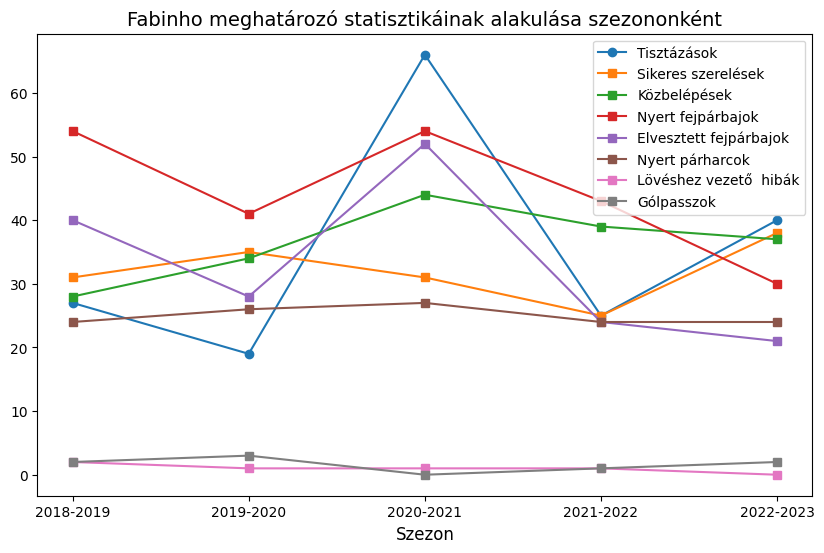

In [407]:
#Fabinho
Fabinho=PL[PL['Player']=="Fabinho"]
Fabinho=Fabinho[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Fabinho["Clr"])
TklW = np.array(Fabinho["TklW"])
Int = np.array(Fabinho["Int"])
Challenges_Tkl=np.array(Fabinho["Challenges_Tkl"])
Won = np.array(Fabinho["Won"])
Lost = np.array(Fabinho["Lost"])
Err= np.array(Fabinho["Err"])
Ast = np.array(Fabinho["Ast"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Fabinho meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()



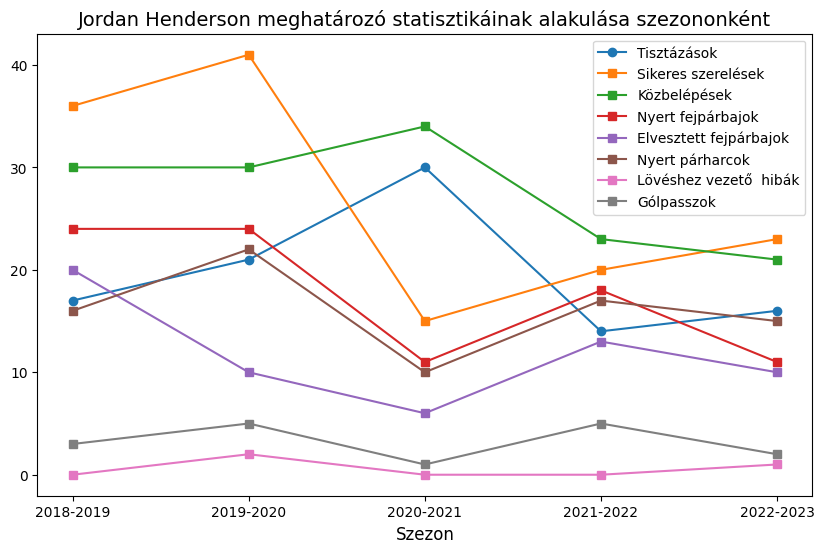

In [408]:
#Jordan Henderson
Henderson=PL[PL['Player']=="Jordan Henderson"]
Henderson=Henderson[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Henderson["Clr"])
TklW = np.array(Henderson["TklW"])
Int = np.array(Henderson["Int"])
Challenges_Tkl=np.array(Henderson["Challenges_Tkl"])
Won = np.array(Henderson["Won"])
Lost = np.array(Henderson["Lost"])
Err= np.array(Henderson["Err"])
Ast = np.array(Henderson["Ast"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Jordan Henderson meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

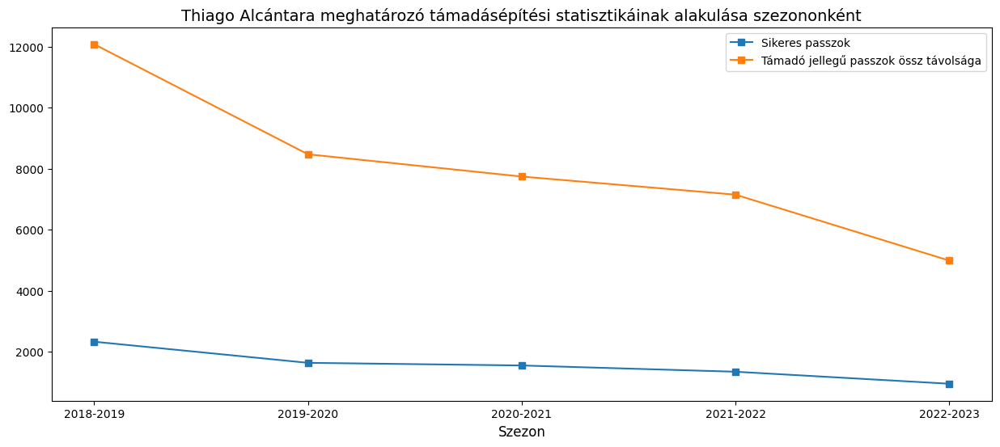

In [441]:
#Thiago Alcántara - Támadásépítés
Thiago2019=BL2019[BL2019["Player"]=="Thiago Alcántara"]
Thiago2020=BL2020[BL2020["Player"]=="Thiago Alcántara"]
Thiago=PL[PL["Player"]=="Thiago Alcántara"]
Thiago=pd.concat([Thiago,Thiago2020,Thiago2019],ignore_index=True)
Thiago=Thiago[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Thiago["Cmp"])
PrgDist = np.array(Thiago["PrgDist"])



plt.figure(figsize=(15, 6))

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Thiago Alcántara meghatározó támadásépítési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

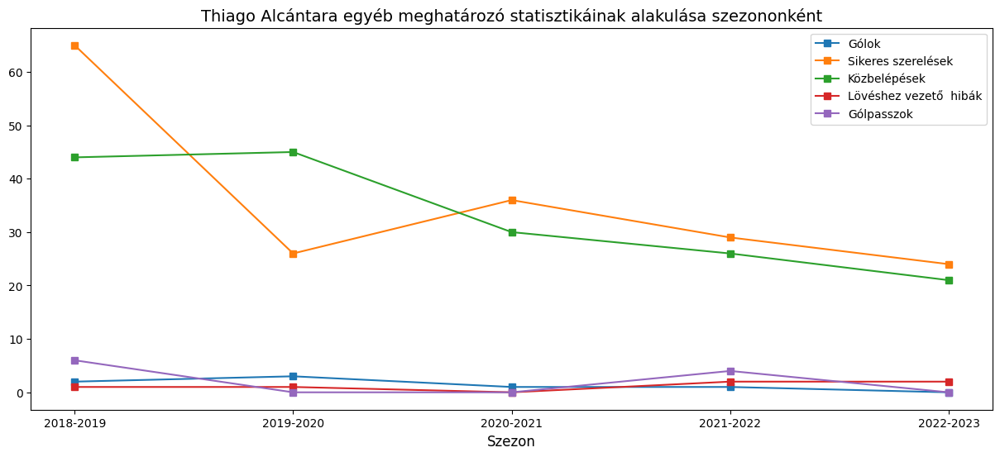

In [426]:
#Thiago Alcántara - Egyéb statisztikák
Thiago2019=BL2019[BL2019["Player"]=="Thiago Alcántara"]
Thiago2020=BL2020[BL2020["Player"]=="Thiago Alcántara"]
Thiago=PL[PL["Player"]=="Thiago Alcántara"]
Thiago=pd.concat([Thiago,Thiago2020,Thiago2019])
Thiago=Thiago[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Thiago["TklW"])
Int = np.array(Thiago["Int"])
Err= np.array(Thiago["Err"])
Ast = np.array(Thiago["Ast"])
Gls = np.array(Thiago["Gls"])


plt.figure(figsize=(15, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Thiago Alcántara egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

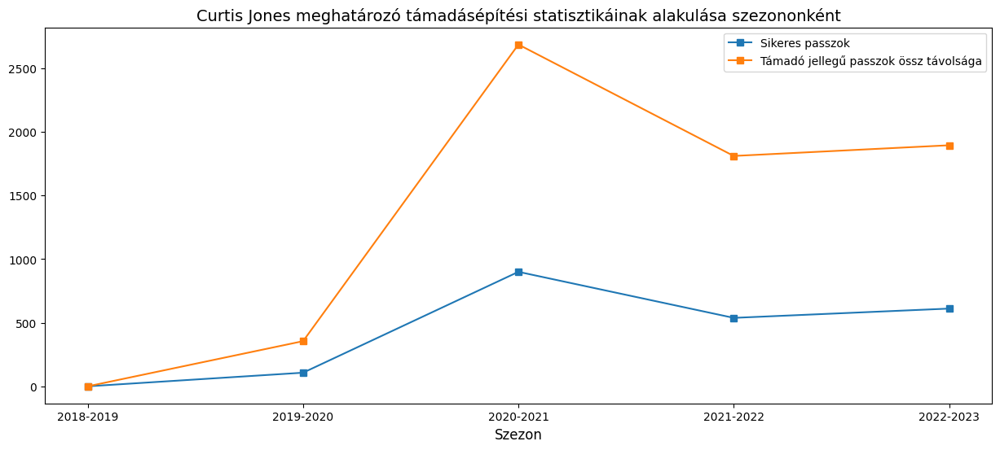

In [430]:
#Curtis Jones - Támadásépítés
Jones=PL[PL["Player"]=="Curtis Jones"]
Jones=Jones[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Jones["Cmp"])
PrgDist = np.array(Jones["PrgDist"])



plt.figure(figsize=(15, 6))

plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Curtis Jones meghatározó támadásépítési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

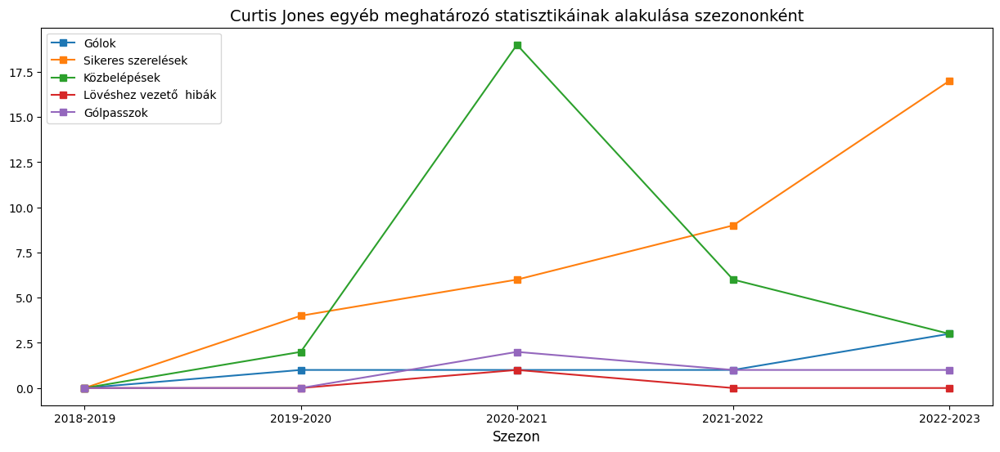

In [428]:
#Curtis Jones - Egyéb statisztikák
Jones=PL[PL["Player"]=="Curtis Jones"]
Jones=Jones[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Jones["TklW"])
Int = np.array(Jones["Int"])
Err= np.array(Jones["Err"])
Ast = np.array(Jones["Ast"])
Gls = np.array(Jones["Gls"])


plt.figure(figsize=(15, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Curtis Jones egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

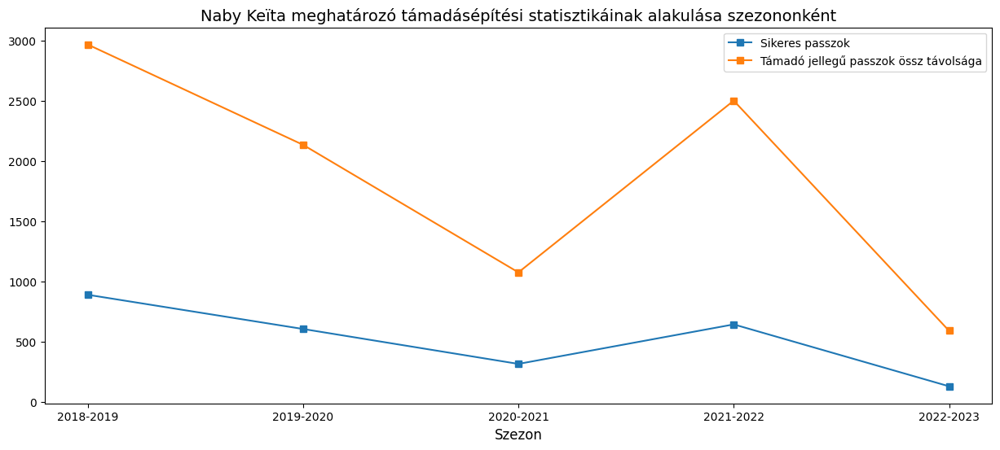

In [431]:
#Naby Keïta - Támadásépítés
Keïta=PL[PL["Player"]=="Naby Keïta"]
Keïta=Keïta[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)


Cmp = np.array(Keïta["Cmp"])
PrgDist = np.array(Keïta["PrgDist"])



plt.figure(figsize=(15, 6))
plt.plot(xpoints, Cmp, label='Sikeres passzok', marker='s')
plt.plot(xpoints, PrgDist, label='Támadó jellegű passzok össz távolsága', marker='s')

plt.title('Naby Keïta meghatározó támadásépítési statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

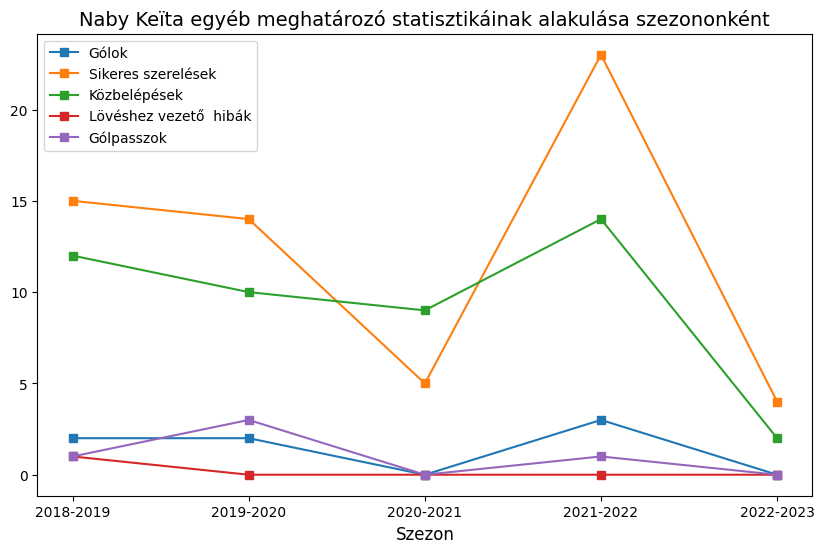

In [432]:
#Naby Keïta - Egyéb statisztikák
Keïta=PL[PL["Player"]=="Naby Keïta"]
Keïta=Keïta[["Gls","Ast","Season","TklW","Err","Cmp","PrgDist","Int"]].sort_values(by='Season', ascending=True)

TklW = np.array(Keïta["TklW"])
Int = np.array(Keïta["Int"])
Err= np.array(Keïta["Err"])
Ast = np.array(Keïta["Ast"])
Gls = np.array(Keïta["Gls"])


plt.figure(figsize=(10, 6))
plt.plot(xpoints, Gls, label='Gólok', marker='s')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')


plt.title('Naby Keïta egyéb meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

Jól látható, hogy a középpályások azon statisztikái amelyek meghatározzák a játékukat javarészt romlottak, tehát a csapatnak a pálya tengelyében is voltak problémái. Tekintve hogy a Liverpool játéka erősen függ attól, hogy a középpályát mennyire tudják kontrollálni, látva a fenti statisztikákat, nem csoda a mélyrepülés.

######Védők

In [412]:
Liverpool2022_2023=PL2023[PL2023["Team"]=="Liverpool"]
Liverpool2022_2023_df=Liverpool2022_2023[Liverpool2022_2023['Pos']=="DF"]
Liverpool2022_2023_df=Liverpool2022_2023_df[Liverpool2022_2023['Starts']>=12]
Liverpool2022_2023_df

<ipython-input-412-f210f82c60c5>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Liverpool2022_2023_df=Liverpool2022_2023_df[Liverpool2022_2023['Starts']>=12]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
138,Trent Alexander-Arnold,eng ENG,DF,23.0,37,34,2923.0,32.5,2.0,9.0,...,2.0,20.0,13.0,60.6,2022-2023,Liverpool,Premier League,5.0,70.175439,Trent Alexander-Arnold(Liverpool)
139,Virgil van Dijk,nl NED,DF,31.0,32,32,2835.0,31.5,3.0,1.0,...,3.0,98.0,34.0,74.2,2022-2023,Liverpool,Premier League,3.0,51.851852,Virgil van Dijk(Liverpool)
141,Andrew Robertson,sct SCO,DF,28.0,34,29,2583.0,28.7,0.0,8.0,...,3.0,22.0,24.0,47.8,2022-2023,Liverpool,Premier League,3.0,55.263158,Andrew Robertson(Liverpool)
145,Ibrahima Konaté,fr FRA,DF,23.0,18,17,1552.0,17.2,0.0,0.0,...,4.0,46.0,14.0,76.7,2022-2023,Liverpool,Premier League,5.0,68.421053,Ibrahima Konaté(Liverpool)
147,Joe Gomez,eng ENG,DF,25.0,21,15,1466.0,16.3,0.0,0.0,...,2.0,46.0,38.0,54.8,2022-2023,Liverpool,Premier League,3.0,75.000000,Joe Gomez(Liverpool)
151,Joël Matip,cm CMR,DF,30.0,14,12,1092.0,12.1,1.0,0.0,...,3.0,25.0,23.0,52.1,2022-2023,Liverpool,Premier League,3.0,57.142857,Joël Matip(Liverpool)


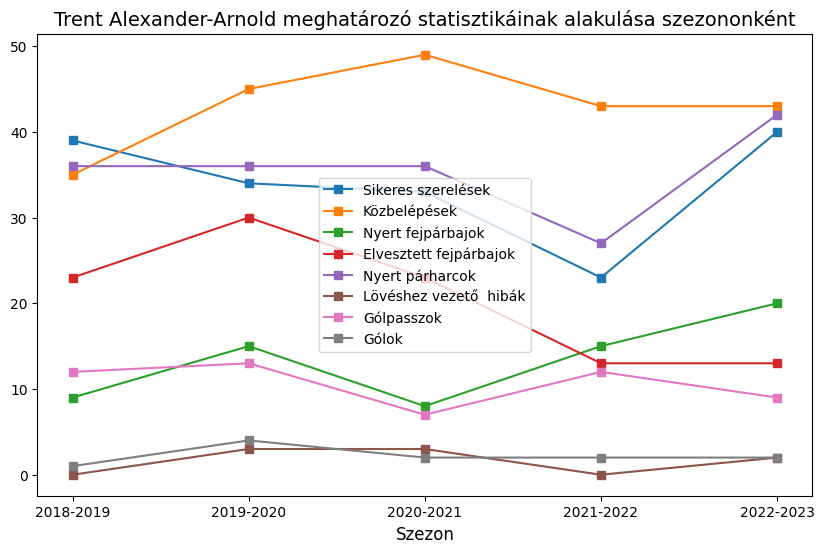

In [413]:
#Trent Alexander-Arnold
TAA=PL[PL['Player']=="Trent Alexander-Arnold"]
TAA=TAA[["Ast","Gls","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(TAA["Clr"])
TklW = np.array(TAA["TklW"])
Int = np.array(TAA["Int"])
Challenges_Tkl=np.array(TAA["Challenges_Tkl"])
Won = np.array(TAA["Won"])
Lost = np.array(TAA["Lost"])
Err= np.array(TAA["Err"])
Ast=np.array(TAA["Ast"])
Gls=np.array(TAA["Gls"])

plt.figure(figsize=(10, 6))


plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')
plt.plot(xpoints, Gls, label='Gólok', marker='s')

plt.title('Trent Alexander-Arnold meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


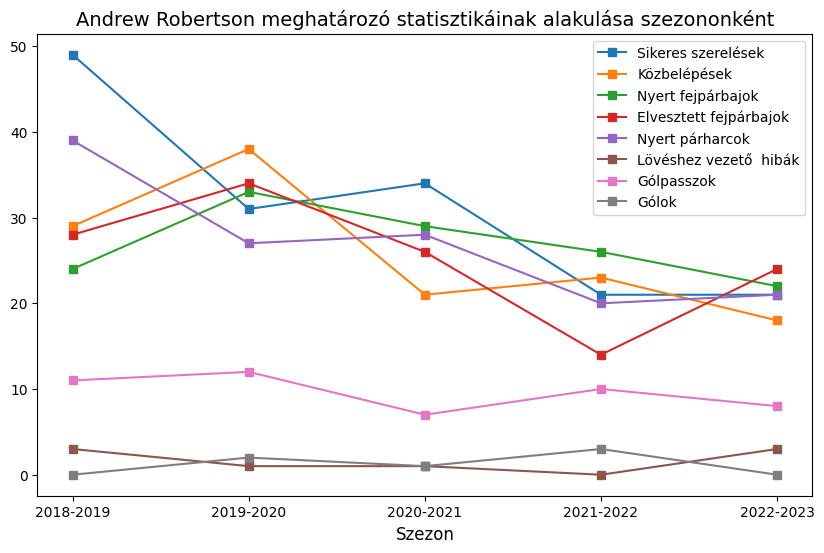

In [414]:
#Andrew Robertson
Robbo=PL[PL['Player']=="Andrew Robertson"]
Robbo=Robbo[["Ast","Gls","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Robbo["Clr"])
TklW = np.array(Robbo["TklW"])
Int = np.array(Robbo["Int"])
Challenges_Tkl=np.array(Robbo["Challenges_Tkl"])
Won = np.array(Robbo["Won"])
Lost = np.array(Robbo["Lost"])
Err= np.array(Robbo["Err"])
Ast=np.array(Robbo["Ast"])
Gls=np.array(Robbo["Gls"])

plt.figure(figsize=(10, 6))


plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')
plt.plot(xpoints, Gls, label='Gólok', marker='s')

plt.title('Andrew Robertson meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

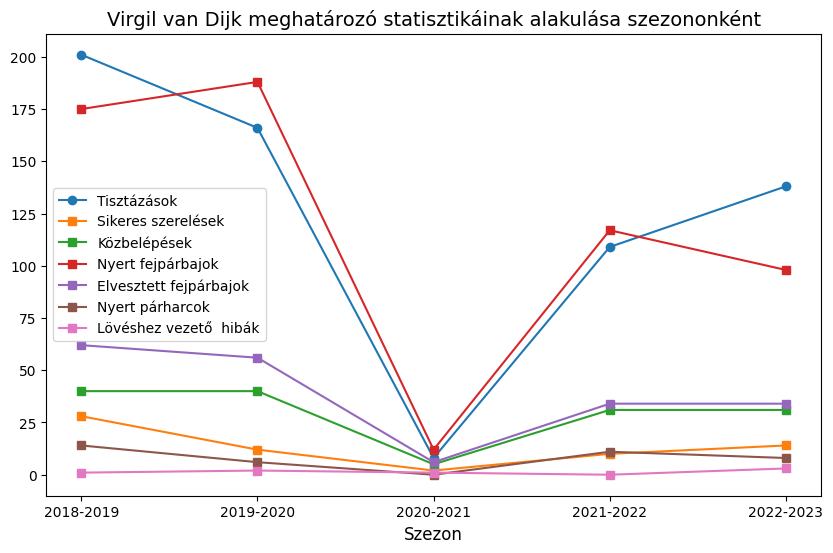

In [433]:
#Virgil van Dijk
VVD=PL[PL['Player']=="Virgil van Dijk"]
VVD=VVD[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(VVD["Clr"])
TklW = np.array(VVD["TklW"])
Int = np.array(VVD["Int"])
Challenges_Tkl=np.array(VVD["Challenges_Tkl"])
Won = np.array(VVD["Won"])
Lost = np.array(VVD["Lost"])
Err= np.array(VVD["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Virgil van Dijk meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


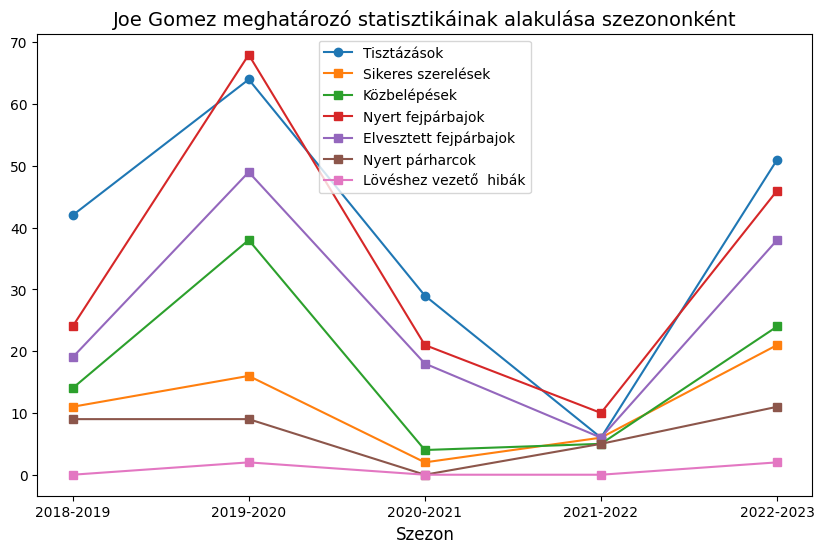

In [416]:
#Joe Gomez
Gomez=PL[PL['Player']=="Joe Gomez"]
Gomez=Gomez[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Gomez["Clr"])
TklW = np.array(Gomez["TklW"])
Int = np.array(Gomez["Int"])
Challenges_Tkl=np.array(Gomez["Challenges_Tkl"])
Won = np.array(Gomez["Won"])
Lost = np.array(Gomez["Lost"])
Err= np.array(Gomez["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Joe Gomez meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

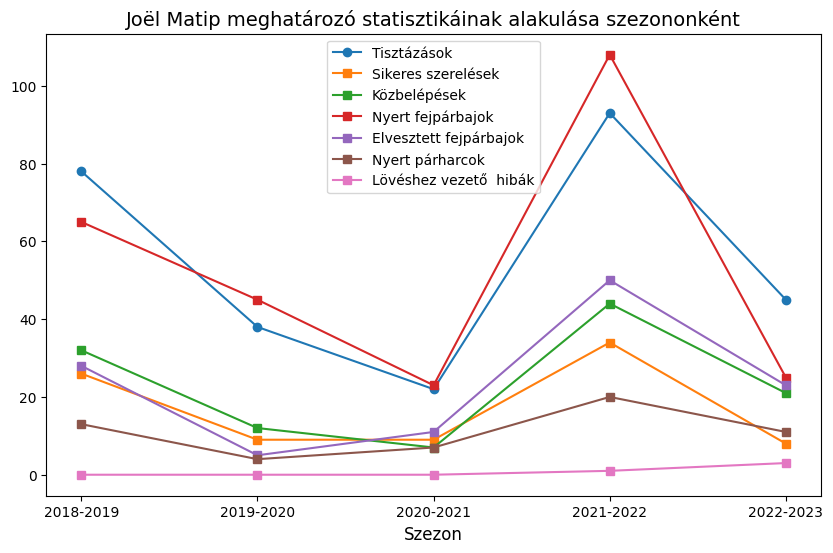

In [417]:
#Joël Matip
Matip=PL[PL['Player']=="Joël Matip"]
Matip=Matip[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Matip["Clr"])
TklW = np.array(Matip["TklW"])
Int = np.array(Matip["Int"])
Challenges_Tkl=np.array(Matip["Challenges_Tkl"])
Won = np.array(Matip["Won"])
Lost = np.array(Matip["Lost"])
Err= np.array(Matip["Err"])


plt.figure(figsize=(10, 6))

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


plt.title('Joël Matip meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

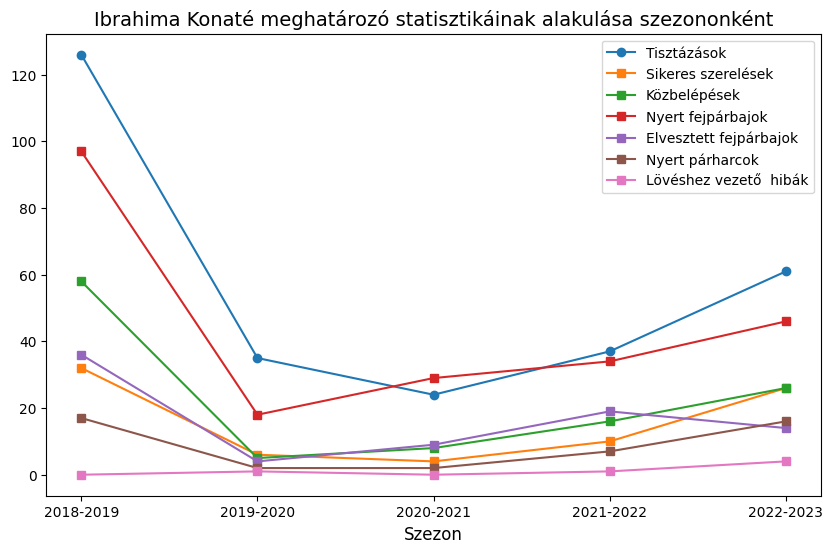

In [447]:
#Ibrahima Konaté
Konaté2019=BL2019[BL2019["Player"]=="Ibrahima Konaté"]
Konaté2020=BL2020[BL2020["Player"]=="Ibrahima Konaté"]
Konaté2021=BL2021[BL2021["Player"]=="Ibrahima Konaté"]
Konaté=PL[PL["Player"]=="Ibrahima Konaté"]
Konaté=pd.concat([Konaté,Konaté2021,Konaté2020,Konaté2019],ignore_index=True)
Konaté=Konaté[["Clr","TklW","Season","Int","Challenges_Tkl","Won","Lost","Err"]].sort_values(by='Season', ascending=True)

Clr = np.array(Konaté["Clr"])
TklW = np.array(Konaté["TklW"])
Int = np.array(Konaté["Int"])
Challenges_Tkl=np.array(Konaté["Challenges_Tkl"])
Won = np.array(Konaté["Won"])
Lost = np.array(Konaté["Lost"])
Err= np.array(Konaté["Err"])

plt.figure(figsize=(10, 6))
plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')

plt.title('Ibrahima Konaté meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

A védők statisztikáit elemezve arra a következtetésre jutottam, hogy Joel Matip gyengébb szereplése mellett a többi védő eljesítménye nem vagy csak kis mértékben romlott így ez nem okozhatta a Liverpool vesszőfutását.

######Kapus

In [419]:
Liverpool2022_2023=PL2023[PL2023["Team"]=="Liverpool"]
Liverpool2022_2023_gk=Liverpool2022_2023[Liverpool2022_2023['Pos']=="GK"]
Liverpool2022_2023_gk

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,cardssum,Tkl_Tkl%,Player(Team)
136,Alisson,br BRA,GK,29.0,37,37,3330.0,37.0,0.0,1.0,...,0.0,11.0,1.0,91.7,2022-2023,Liverpool,Premier League,1.0,NaN,Alisson(Liverpool)
160,Caoimhín Kelleher,ie IRL,GK,23.0,1,1,90.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Liverpool,Premier League,0.0,NaN,Caoimhín Kelleher(Liverpool)
164,Adrián,es ESP,GK,35.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Liverpool,Premier League,0.0,NaN,Adrián(Liverpool)
166,Harvey Davies,eng ENG,GK,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2022-2023,Liverpool,Premier League,0.0,NaN,Harvey Davies(Liverpool)


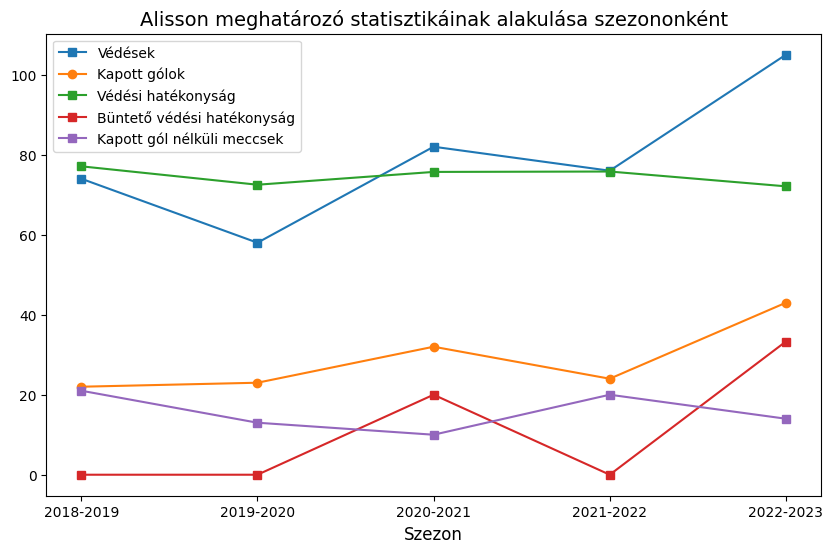

In [420]:
#Alisson
Alisson=PL[PL["Player"]=="Alisson"]
Alisson=Alisson[["Player","GA","Saves","Save%","PK_Save%","CS","Season"]].sort_values(by='Season', ascending=True)

GA = np.array(Alisson["GA"])
Save = np.array(Alisson["Save%"])
PK_Save = np.array(Alisson["PK_Save%"])
CS=np.array(Alisson["CS"])
Saves = np.array(Alisson["Saves"])

plt.figure(figsize=(10, 6))
plt.plot(xpoints, Saves, label='Védések', marker='s')
plt.plot(xpoints, GA, label='Kapott gólok', marker='o')
plt.plot(xpoints, Save, label='Védési hatékonyság', marker='s')
plt.plot(xpoints, PK_Save, label='Büntető védési hatékonyság', marker='s')
plt.plot(xpoints, CS, label='Kapott gól nélküli meccsek', marker='s')


plt.title('Alisson meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()


A kapus, Alisson teljesítményén sem figyelhető meg különösebb romlás.

######**ÖSSZEGZÉS**
Összességében elmondható, hogy a Liverpool a 2022-2023-as szezonban nyújtott rossz teljesítményét főként középpályásainak gyengébb teljesítménye okozta.

##Serie A

###.csv file beolvasása és utótisztítása

In [ ]:
SA=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/SerieA_vegleges.csv")

In [ ]:
del SA["Unnamed: 0"]

In [ ]:
pd.isnull(SA).sum()

Player                   0
Nation                   4
Pos                      0
Age                      0
MP                       0
Starts                   0
Min                    807
90s                    800
Gls                    800
Ast                    800
G+A                    800
G-PK                   800
Penalty_Kicks_Made     800
PKatt                  800
CrdY                   800
CrdR                   800
xG                     807
npxG                   807
xAG                    807
npxG.1                 807
GA                    3587
SoTA                  3587
Saves                 3587
Save%                 3595
PK_Save%              3664
CS                    3587
CS%                   3609
Sh                     807
SoT                    807
SoT%                  1391
G/Sh                  1391
Dist                  1393
Cmp                    807
Att                    807
Cmp%                   824
TotDist                807
PrgDist                807
x

In [ ]:
SA[pd.isnull(SA["Nation"])][["Player","Nation"]]

,Player,Nation
1562,Roman Lazar,NaN
2833,Jan Kubala,NaN
2984,Sinan Gümüş,NaN
3582,Alessio da Cruz,NaN


In [ ]:
#Nem tudni a játékos életkorát, így töröltem őt a Dataframeből
SA=SA[SA["Player"]!="Roman Lazar"]
SA=SA[SA["Player"]!="Jan Kubala"]
SA=SA[SA["Player"]!="Sinan Gümüş"]
SA=SA[SA["Player"]!="Alessio da Cruz"]

In [ ]:
SA=SA.fillna(0)

In [ ]:
pd.isnull(SA).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [ ]:
SA["Player(Team)"]=SA["Player"]+ "(" + SA["Team"] + ")"
SA["Season(Player)"]=SA["Season"]+ "(" + SA["Player"] + ")"

In [ ]:
SA.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
0,Giovanni Di Lorenzo,it ITA,DF,28.0,37,36,3257.0,36.2,3.0,4.0,...,60.0,0.0,41.0,34.0,54.7,2022-2023,Napoli,Serie A,Giovanni Di Lorenzo(Napoli),2022-2023(Giovanni Di Lorenzo)
1,Andre-Frank Zambo Anguissa,cm CMR,MF,26.0,36,36,3050.0,33.9,3.0,5.0,...,25.0,0.0,47.0,27.0,63.5,2022-2023,Napoli,Serie A,Andre-Frank Zambo Anguissa(Napoli),2022-2023(Andre-Frank Zambo Anguissa)
2,Kim Min-jae,kr KOR,DF,25.0,35,35,3050.0,33.9,2.0,2.0,...,123.0,1.0,91.0,54.0,62.8,2022-2023,Napoli,Serie A,Kim Min-jae(Napoli),2022-2023(Kim Min-jae)
3,Stanislav Lobotka,sk SVK,MF,27.0,38,34,3101.0,34.5,1.0,1.0,...,16.0,0.0,12.0,17.0,41.4,2022-2023,Napoli,Serie A,Stanislav Lobotka(Napoli),2022-2023(Stanislav Lobotka)
4,Alex Meret,it ITA,GK,25.0,34,34,3060.0,34.0,0.0,0.0,...,6.0,1.0,4.0,0.0,100.0,2022-2023,Napoli,Serie A,Alex Meret(Napoli),2022-2023(Alex Meret)


In [ ]:
SA.columns

Index(['Player', 'Nation', 'Pos', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'npxG.1', 'GA', 'SoTA', 'Saves', 'Save%',
       'PK_Save%', 'CS', 'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp',
       'Att', 'Cmp%', 'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl',
       'TklW', 'Tkl%', 'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%',
       'Season', 'Team', 'Competition'],
      dtype='object')

###2022-2023
####A 2022-2023-as szezon statisztikái, azok elemzése.



####A dataframe statisztikáinak elemzése, összehasonlítások, rangsorolások

In [ ]:
SA2023=SA[SA["Season"]=="2022-2023"]
SA2023

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Giovanni Di Lorenzo,it ITA,DF,28.0,37,36,3257.0,36.2,3.0,4.0,...,30.0,90.0,60.0,0.0,41.0,34.0,54.7,2022-2023,Napoli,Serie A
1,Andre-Frank Zambo Anguissa,cm CMR,MF,26.0,36,36,3050.0,33.9,3.0,5.0,...,49.0,102.0,25.0,0.0,47.0,27.0,63.5,2022-2023,Napoli,Serie A
2,Kim Min-jae,kr KOR,DF,25.0,35,35,3050.0,33.9,2.0,2.0,...,41.0,96.0,123.0,1.0,91.0,54.0,62.8,2022-2023,Napoli,Serie A
3,Stanislav Lobotka,sk SVK,MF,27.0,38,34,3101.0,34.5,1.0,1.0,...,23.0,106.0,16.0,0.0,12.0,17.0,41.4,2022-2023,Napoli,Serie A
4,Alex Meret,it ITA,GK,25.0,34,34,3060.0,34.0,0.0,0.0,...,0.0,0.0,6.0,1.0,4.0,0.0,100.0,2022-2023,Napoli,Serie A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
756,Arttu Lötjönen,fi FIN,DF,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Sampdoria,Serie A
757,Elia Tantalocchi,it ITA,GK,18.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Sampdoria,Serie A
758,Simone Trimboli,it ITA,MF,20.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Sampdoria,Serie A
759,Lorenzo Villa,it ITA,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-2023,Sampdoria,Serie A


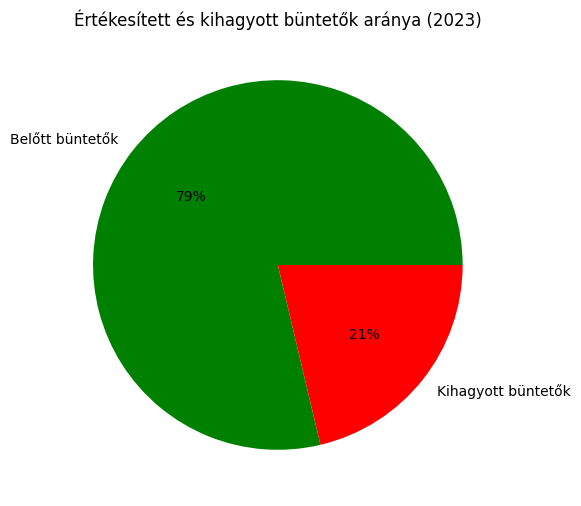

In [ ]:
#Értékesített és kihagyott büntetők aránya
SA_Pen_Attempted_2023=SA2023["PKatt"].sum()
SA_Pen_Scored_2023=SA2023["Penalty_Kicks_Made"].sum()
SA_Pen_Missed_2023=SA_Pen_Attempted_2023-SA_Pen_Scored_2023

plt.figure(figsize=(13,6))
plt.title("Értékesített és kihagyott büntetők aránya (2023)")
data=[SA_Pen_Scored_2023,SA_Pen_Missed_2023]
colors=["green","red"]
labels=["Belőtt büntetők","Kihagyott büntetők"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()

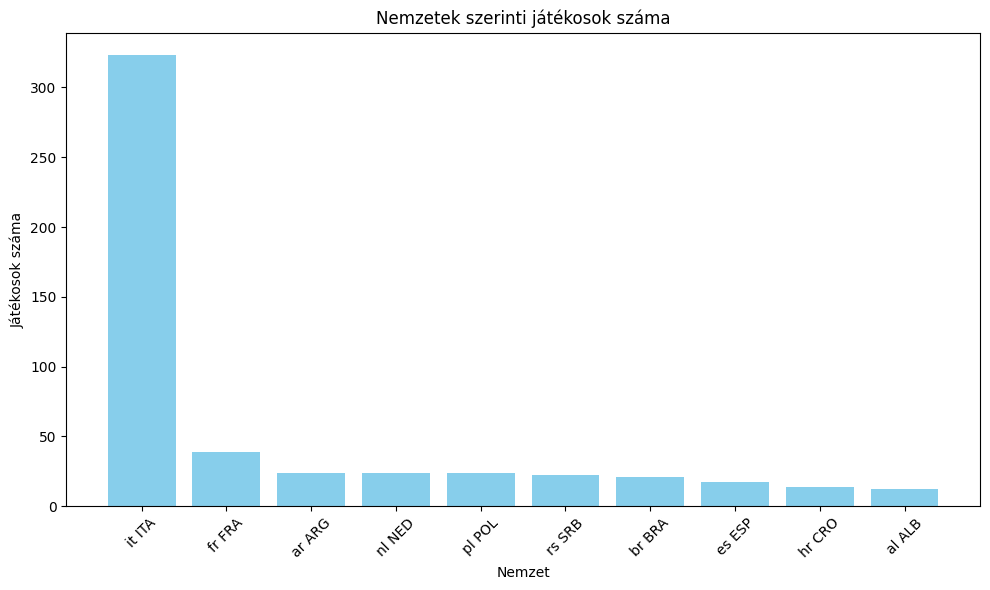

In [ ]:
#Top 10 legtöbb játékost adó nemzet (2023)
jatekosok_szama = SA2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_nemzet['Nation'], top_10_nemzet['Játékosok száma'], color='skyblue')
plt.xlabel('Nemzet')
plt.ylabel('Játékosok száma')
plt.title('Nemzetek szerinti játékosok száma')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




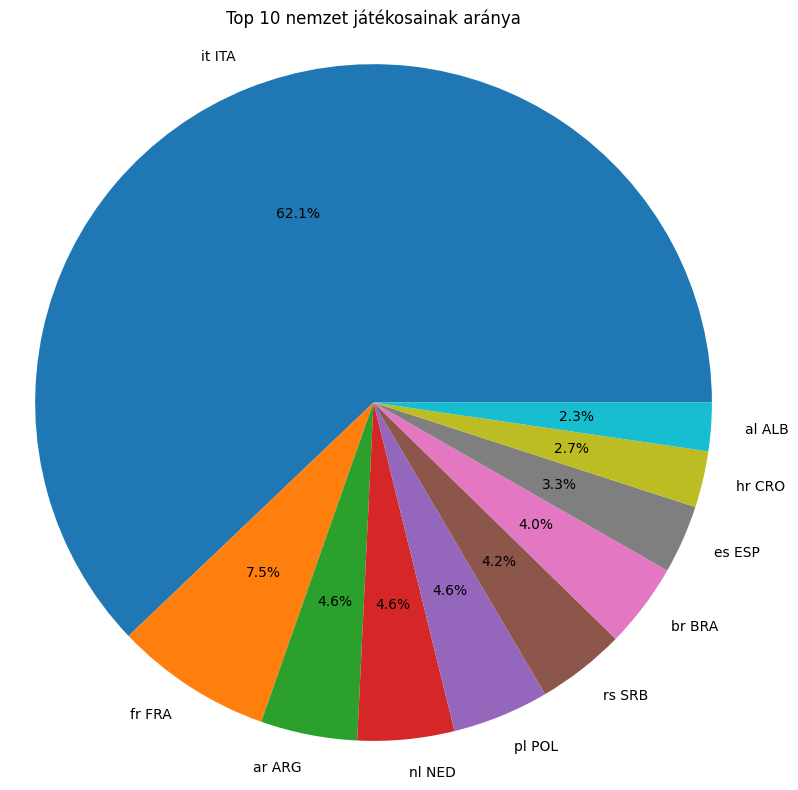

In [ ]:
#Az előző kimutatás csak kördiagrammal
jatekosok_szama = SA2023.groupby('Nation').size().reset_index(name='Játékosok száma')
top_10_nemzet=jatekosok_szama.nlargest(10,"Játékosok száma")
plt.figure(figsize=(8, 8))
plt.pie(top_10_nemzet['Játékosok száma'], labels=top_10_nemzet['Nation'], autopct='%1.1f%%')
plt.title('Top 10 nemzet játékosainak aránya')
plt.axis('equal')
plt.tight_layout()
plt.show()


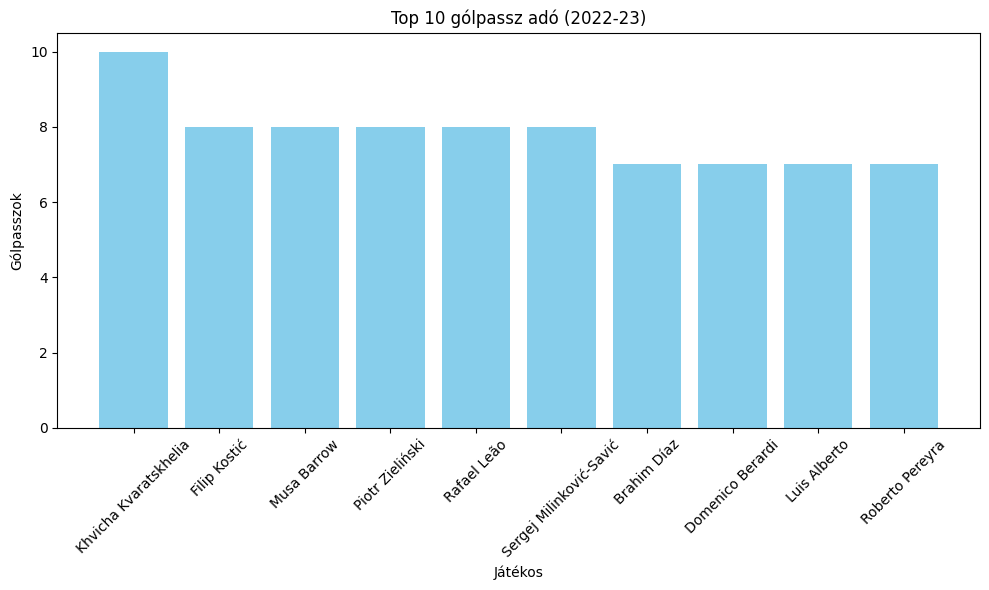

In [ ]:
top_10_gólpassz_adó_2023_SA = SA2023.groupby('Player')["Ast"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_gólpassz_adó_2023_SA['Player'], top_10_gólpassz_adó_2023_SA['Ast'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


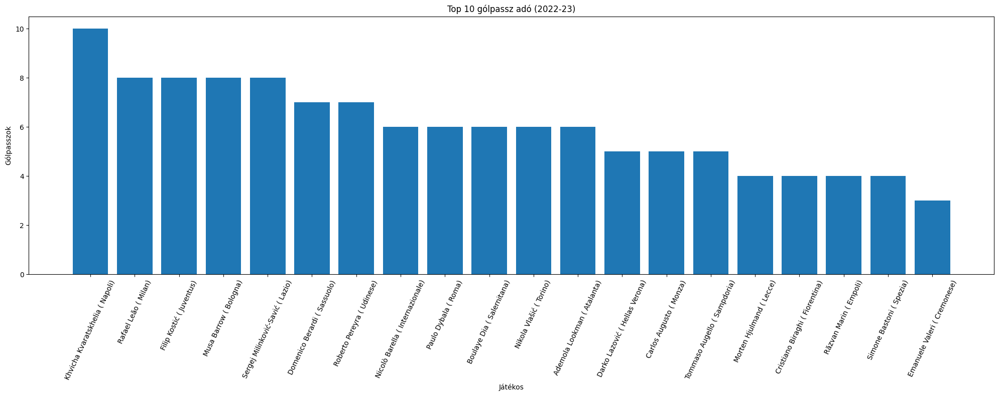

In [ ]:
legjobb_golpassz_adok_csapatonként = SA2023.groupby('Team').apply(lambda x: x.nlargest(1, 'Ast')).reset_index(drop=True)
legjobb_golpassz_adok_csapatonként["Player(Team)"]=legjobb_golpassz_adok_csapatonként["Player"]+ " ( " + legjobb_golpassz_adok_csapatonként["Team"] + ")"
legjobb_golpassz_adok_csapatonként=legjobb_golpassz_adok_csapatonként.sort_values(by="Ast",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(legjobb_golpassz_adok_csapatonként['Player(Team)'], legjobb_golpassz_adok_csapatonként['Ast'])
plt.xlabel('Játékos')
plt.ylabel('Gólpasszok')
plt.title('Top 10 gólpassz adó (2022-23)')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()


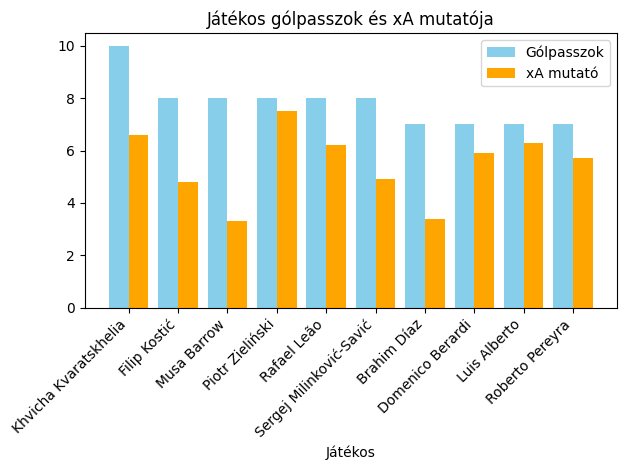

In [ ]:
gp_xA_2023_SA = SA2023.groupby('Player').agg({"Ast":'sum','xA':'sum'}).nlargest(10,'Ast').reset_index()

# Oszlopdiagram létrehozása
bar_width = 0.4
index = range(len(gp_xA_2023_SA))
plt.bar(index, gp_xA_2023_SA['Ast'], bar_width, color='skyblue', label='Gólpasszok')
plt.bar([i + bar_width for i in index], gp_xA_2023_SA['xA'], bar_width, color='orange', label='xA mutató')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Játékos gólpasszok és xA mutatója')
plt.xticks([i + bar_width/2 for i in index], gp_xA_2023_SA['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


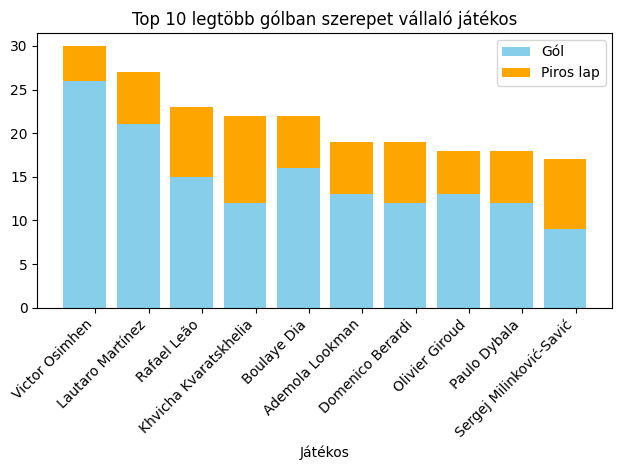

In [ ]:
#Top 10 legtöbb gólban szerepet vállaló játékos
top10_ga_SA2023=SA2023.nlargest(10,"G+A")
top10_ga_SA2023=top10_ga_SA2023.sort_values(by="G+A",ascending=False)


plt.bar(top10_ga_SA2023["Player"], top10_ga_SA2023['Gls'], color='skyblue', label='Gól')
plt.bar(top10_ga_SA2023["Player"], top10_ga_SA2023['Ast'], bottom=top10_ga_SA2023['Gls'], color='orange', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb gólban szerepet vállaló játékos')
plt.xticks([i + bar_width/2 for i in index], top10_ga_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


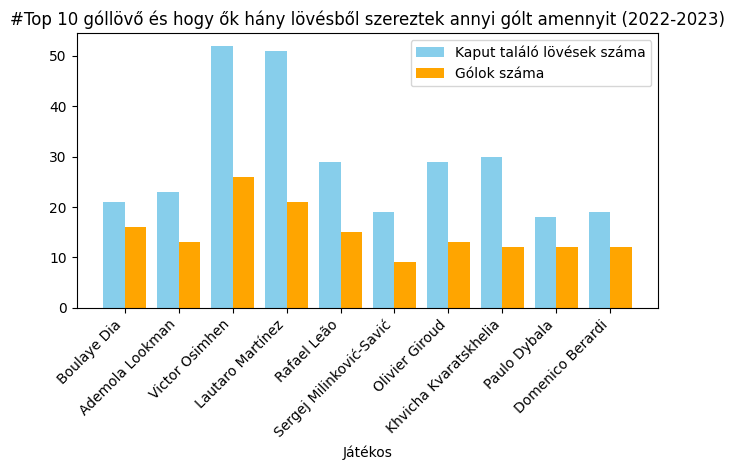

In [ ]:
#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit.
top10_scorer_SA2023=SA2023.nlargest(10,"Gls")
top10_scorer_SA2023=top10_ga_SA2023.sort_values(by="G/Sh",ascending=False)

bar_width = 0.4
index = range(len(top10_scorer_SA2023))
plt.bar(index, top10_scorer_SA2023['SoT'], bar_width, color='skyblue', label='Kaput találó lövések száma')
plt.bar([i + bar_width for i in index], top10_scorer_SA2023['Gls'], bar_width, color='orange', label='Gólok száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('#Top 10 góllövő és hogy ők hány lövésből szereztek annyi gólt amennyit (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_scorer_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


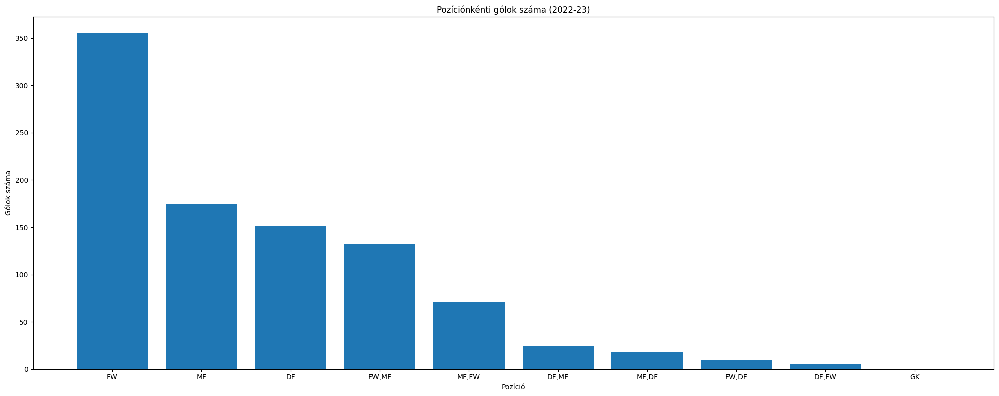

In [ ]:
#Pozíciónkénti gólok száma
gls_per_pos_SA2023=SA2023.groupby('Pos')['Gls'].sum().reset_index()
gls_per_pos_SA2023=gls_per_pos_SA2023.sort_values(by="Gls",ascending=False)
plt.figure(figsize=(20, 8))
plt.bar(gls_per_pos_SA2023['Pos'], gls_per_pos_SA2023['Gls'])
plt.xlabel('Pozíció')
plt.ylabel('Gólok száma')
plt.title('Pozíciónkénti gólok száma (2022-23)')

plt.tight_layout()
plt.show()


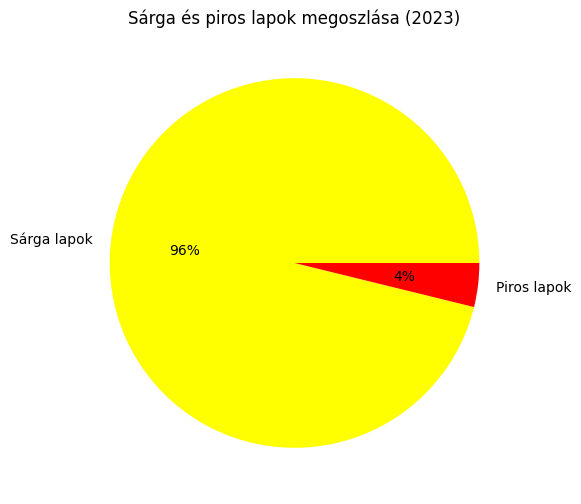

In [ ]:
#Sárga és piros lapok megoszlása
yellow_SA2023=SA2023["CrdY"].sum()
red_SA2023=SA2023["CrdR"].sum()
plt.figure(figsize=(13,6))
plt.title("Sárga és piros lapok megoszlása (2023)")
data=[yellow_SA2023,red_SA2023]
colors=["yellow","red"]
labels=["Sárga lapok","Piros lapok"]
plt.pie(data, labels=labels, colors=colors, autopct="%.0f%%")
plt.show()


<ipython-input-677-7d8c30f7a38b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SA2023["cardssum"]=SA2023['CrdY']+SA2023['CrdR']


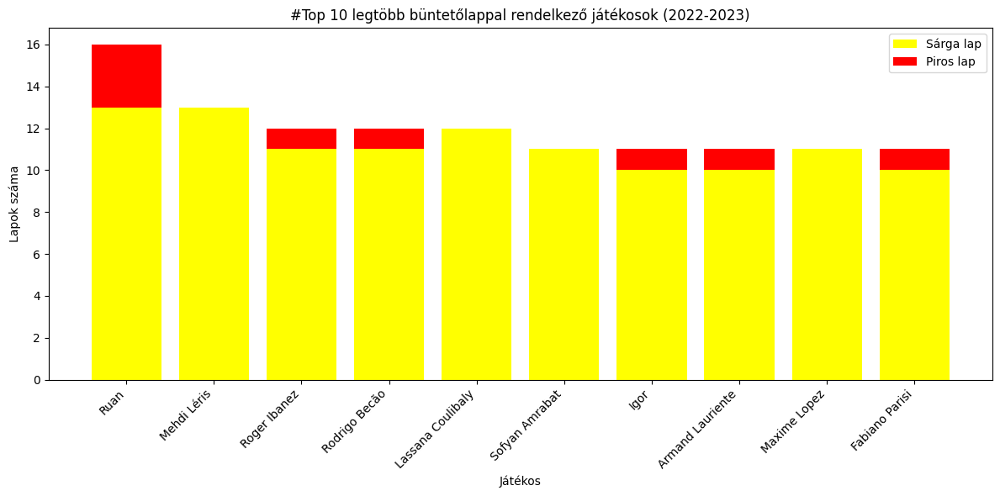

In [ ]:
#Legtöbb büntetőlappal rendelkező játékosok
SA2023["cardssum"]=SA2023['CrdY']+SA2023['CrdR']
top10_carded_SA2023=SA2023.nlargest(10,"cardssum")
top10_carded_SA2023=top10_carded_SA2023.sort_values(by="cardssum",ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(top10_carded_SA2023["Player"], top10_carded_SA2023['CrdY'], color='yellow', label='Sárga lap')
plt.bar(top10_carded_SA2023["Player"], top10_carded_SA2023['CrdR'], bottom=top10_carded_SA2023['CrdY'], color='red', label='Piros lap')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('Lapok száma')
plt.title('#Top 10 legtöbb büntetőlappal rendelkező játékosok (2022-2023)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


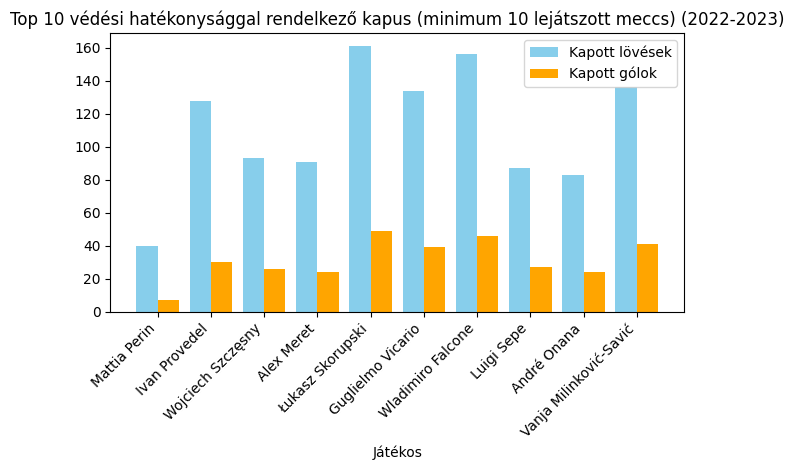

In [ ]:
#Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_SA2023=SA2023[SA2023["Pos"]=="GK"]
KeepertoCompare_SA2023=Keepers_SA2023[Keepers_SA2023["MP"]>=10]
top10_savepercent_SA2023=KeepertoCompare_SA2023.nlargest(10,"Save%")
top10_savepercent_SA2023=top10_savepercent_SA2023.sort_values(by="Save%",ascending=False)

bar_width = 0.4
index = range(len(top10_savepercent_SA2023))
plt.bar(index, top10_savepercent_SA2023['SoTA'], bar_width, color='skyblue', label='Kapott lövések')
plt.bar([i + bar_width for i in index], top10_savepercent_SA2023['GA'], bar_width, color='orange', label='Kapott gólok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 védési hatékonysággal rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_savepercent_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


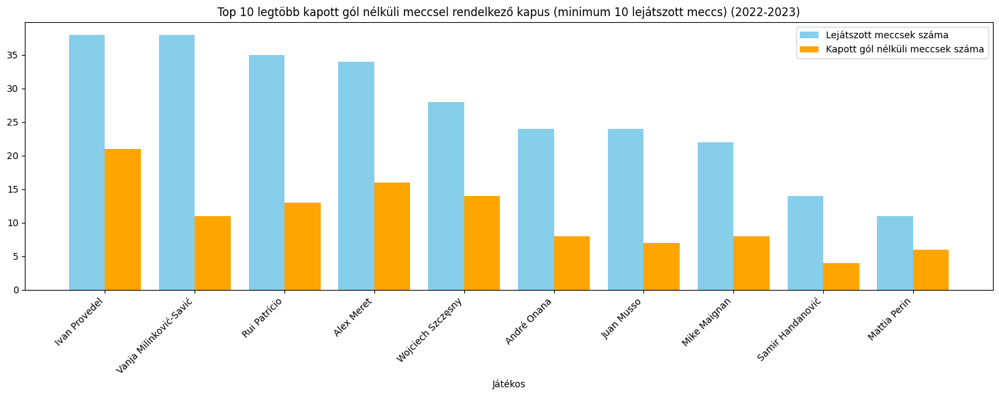

In [ ]:
#Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs)
Keepers_SA2023=SA2023[SA2023["Pos"]=="GK"]
KeepertoCompare_SA2023=Keepers_SA2023[Keepers_SA2023["MP"]>=10]
top10_cs_SA2023=KeepertoCompare_SA2023.nlargest(10,"CS%")
top10_cs_SA2023=top10_cs_SA2023.sort_values(by="MP",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_cs_SA2023))
plt.bar(index, top10_cs_SA2023['MP'], bar_width, color='skyblue', label='Lejátszott meccsek száma')
plt.bar([i + bar_width for i in index], top10_cs_SA2023['CS'], bar_width, color='orange', label='Kapott gól nélküli meccsek száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb kapott gól nélküli meccsel rendelkező kapus (minimum 10 lejátszott meccs) (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_cs_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


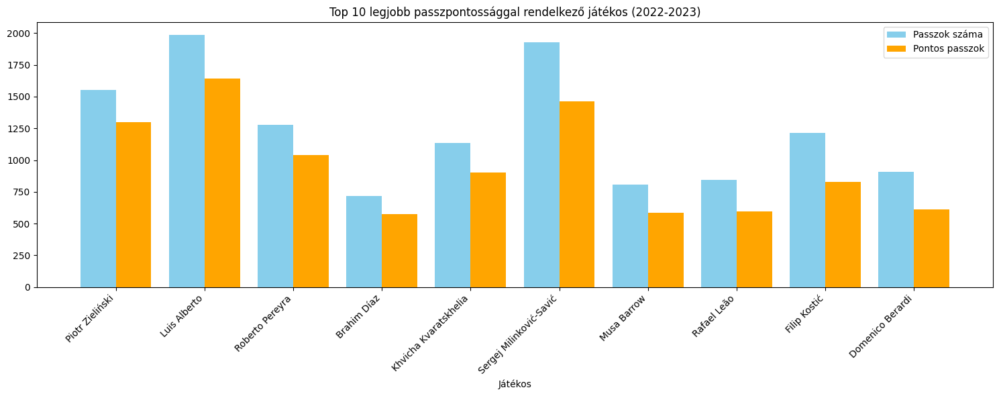

In [ ]:
#Top 10 legjobb passzpontossággal rendelkező játékos
gp_pp_SA2023 = SA2023.groupby('Player').agg({"Ast":'sum','Att':'sum','Cmp':'sum','Cmp%':'sum'}).nlargest(10,'Ast').reset_index()
top10_pp_SA2023=gp_pp_SA2023.sort_values(by="Cmp%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_pp_SA2023))
plt.bar(index, top10_pp_SA2023['Att'], bar_width, color='skyblue', label='Passzok száma')
plt.bar([i + bar_width for i in index], top10_pp_SA2023['Cmp'], bar_width, color='orange', label='Pontos passzok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_pp_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-681-b4cbf45effb3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SA2023["Tkl_Tkl%"]=SA2023['TklW']/SA2023['Tkl']*100


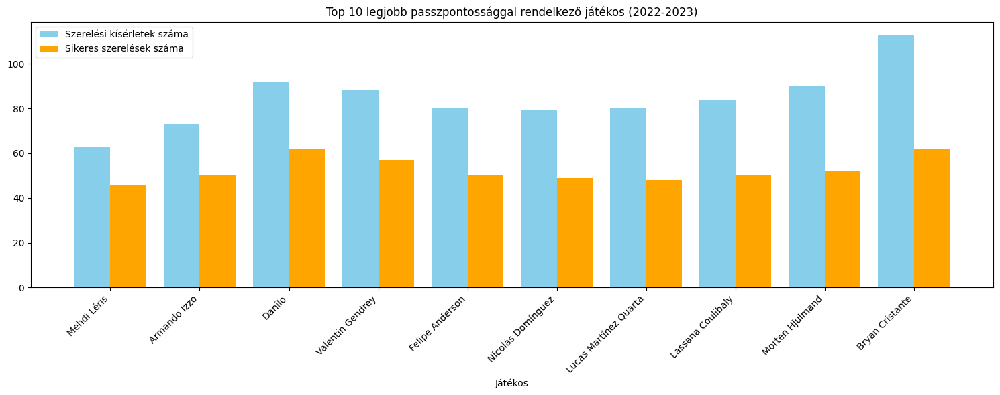

In [ ]:
#Top 10 legjobban szerelő játékos
SA2023["Tkl_Tkl%"]=SA2023['TklW']/SA2023['Tkl']*100
top10_tkl_SA2023 = SA2023.groupby('Player').agg({"Tkl":'sum','TklW':'sum','Tkl_Tkl%':'sum'}).nlargest(10,'TklW').reset_index()
top10_tkl_SA2023 = top10_tkl_SA2023.sort_values(by="Tkl_Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_tkl_SA2023))
plt.bar(index, top10_tkl_SA2023['Tkl'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_tkl_SA2023['TklW'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legjobb passzpontossággal rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_tkl_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


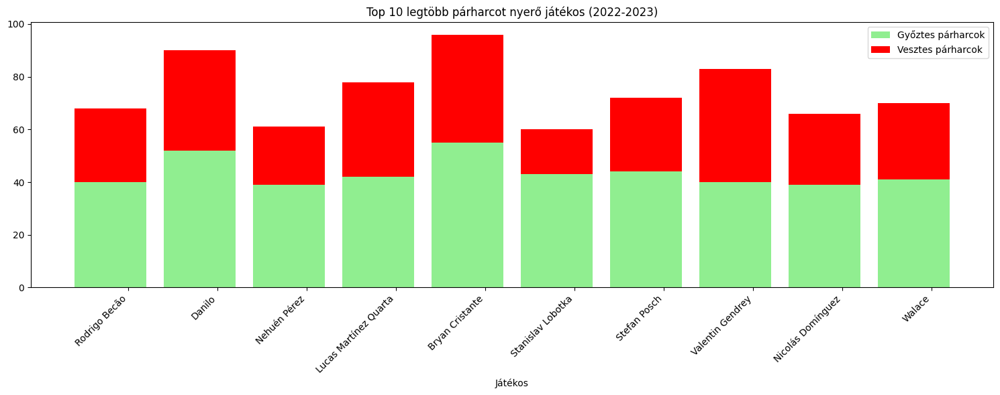

In [ ]:
#Top 10 legtöbb párharcot nyerő játékos
top10_chl_SA2023 = SA2023.groupby('Player').agg({"Challenges_Tkl":'sum','Lost':'sum','Tkl%':'sum'}).nlargest(10,'Challenges_Tkl').reset_index()
top10_chl_SA2023 = top10_chl_SA2023.sort_values(by="Tkl%",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_chl_SA2023["Player"], top10_chl_SA2023['Challenges_Tkl'], color='lightgreen', label='Győztes párharcok')
plt.bar(top10_chl_SA2023["Player"], top10_chl_SA2023['Lost'], bottom=top10_chl_SA2023['Challenges_Tkl'], color='red', label='Vesztes párharcok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb párharcot nyerő játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_chl_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


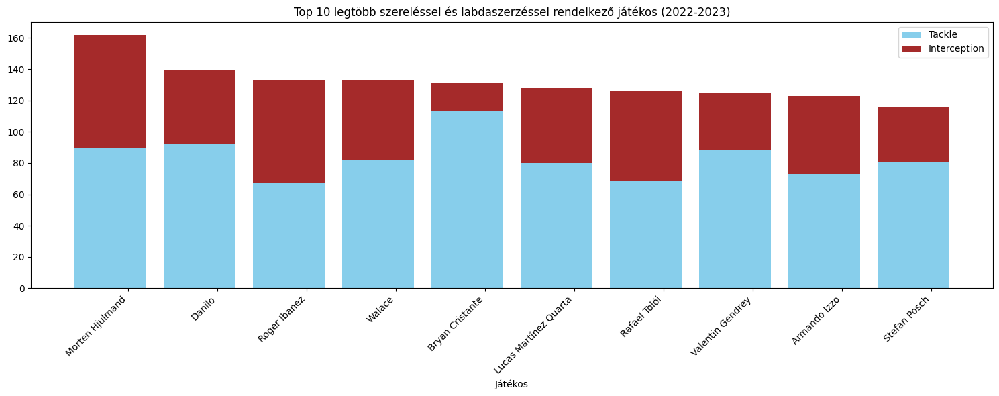

In [ ]:
#Top 10 legtöbb párharcot nyerő játékos
top10_TklInt_SA2023 = SA2023.groupby('Player').agg({"Tkl":'sum','Int':'sum','Tkl+Int':'sum'}).nlargest(10,'Tkl+Int').reset_index()
top10_TklInt_SA2023 = top10_TklInt_SA2023.sort_values(by="Tkl+Int",ascending=False)

plt.figure(figsize=(15, 6))
plt.bar(top10_TklInt_SA2023["Player"], top10_TklInt_SA2023['Tkl'], color='skyblue', label='Tackle')
plt.bar(top10_TklInt_SA2023["Player"], top10_TklInt_SA2023['Int'], bottom=top10_TklInt_SA2023['Tkl'], color='brown', label='Interception')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Top 10 legtöbb szereléssel és labdaszerzéssel rendelkező játékos (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_TklInt_SA2023['Player'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-684-577e369c7363>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SA2023["Player(Team)"]=SA2023["Player"]+ "(" + SA2023["Team"] + ")"


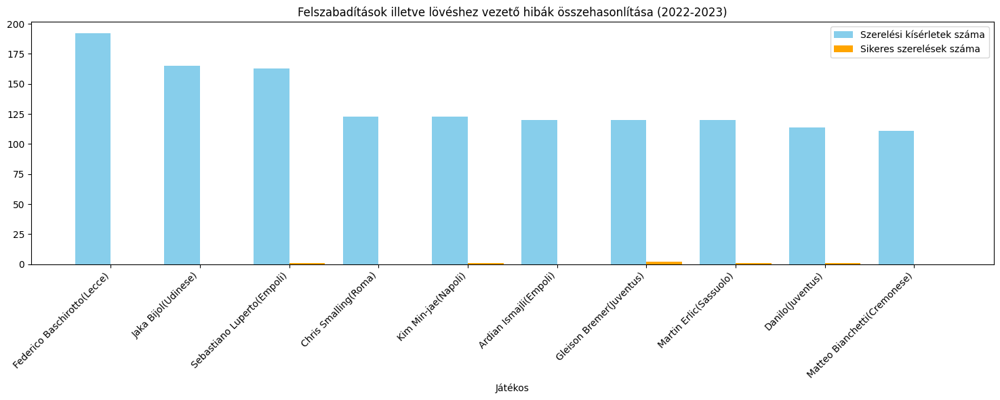

In [ ]:
#Felszabadítások illetve lövéshez vezető hibák összehasonlítása
SA2023["Player(Team)"]=SA2023["Player"]+ "(" + SA2023["Team"] + ")"
top10_clrerr_SA2023 = SA2023.groupby('Player(Team)').agg({"Clr":'sum','Err':'sum'}).nlargest(10,'Clr').reset_index()
top10_clrerr_SA2023 = top10_clrerr_SA2023.sort_values(by="Clr",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_clrerr_SA2023))
plt.bar(index, top10_clrerr_SA2023['Clr'], bar_width, color='skyblue', label='Szerelési kísérletek száma')
plt.bar([i + bar_width for i in index], top10_clrerr_SA2023['Err'], bar_width, color='orange', label='Sikeres szerelések száma')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_clrerr_SA2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


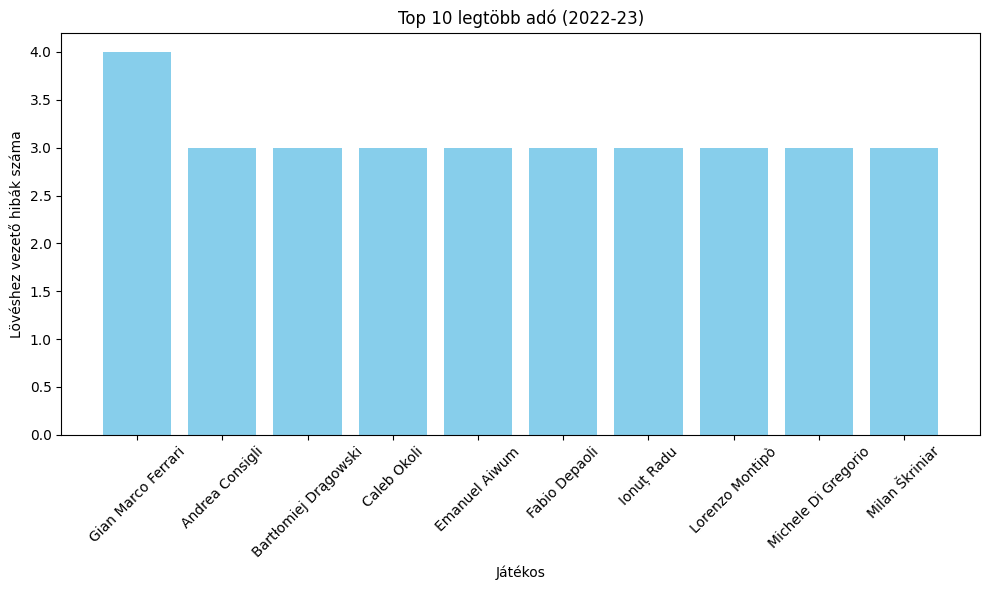

In [ ]:
top_10_error_maker_SA2023 = SA2023.groupby('Player')["Err"].sum().nlargest(10).reset_index()

# Oszlopdiagram létrehozása
plt.figure(figsize=(10, 6))
plt.bar(top_10_error_maker_SA2023['Player'], top_10_error_maker_SA2023['Err'], color='skyblue')
plt.xlabel('Játékos')
plt.ylabel('Lövéshez vezető hibák száma')
plt.title('Top 10 legtöbb adó (2022-23)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
#Top 10 legtöbb fejpárbajt nyerő játékos
SA2023["Player(Team)"]=SA2023["Player"]+ "(" + SA2023["Team"] + ")"
top10_airduel_SA2023 = SA2023.groupby('Player(Team)').agg({"Won":'sum','Lost':'sum'}).nlargest(10,'Won').reset_index()
top10_airduel_SA2023 = top10_airduel_SA2023.sort_values(by="Won",ascending=False)

plt.figure(figsize=(15, 6))
bar_width = 0.4
index = range(len(top10_airduel_SA2023))
plt.bar(index, top10_airduel_SA2023['Won'], bar_width, color='skyblue', label='Megnyert fejpárbajok')
plt.bar([i + bar_width for i in index], top10_airduel_SA2023['Lost'], bar_width, color='orange', label='Elveszett fejpárbajok')

# Tengelyfeliratok beállítása
plt.xlabel('Játékos')
plt.ylabel('')
plt.title('Felszabadítások illetve lövéshez vezető hibák összehasonlítása (2022-2023)')
plt.xticks([i + bar_width/2 for i in index], top10_airduel_SA2023['Player(Team)'], rotation=45, ha='right')

plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'SA2023' is not defined

####Összefüggések keresése

Bizonoys játékosok statisztikái feltűnően gyengébbek az elvártnál, ezért meg szeretném vizsgálni, hogy ezen játékosok mélyrepülése hogyan hatott a csapatuk teljesítményére. Ehhez szükségem volt a bajnoki tabellára

In [ ]:
SA_table=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/SeriaA_tables.csv")

In [ ]:
SA_table

In [ ]:
del SA_table["Unnamed: 0"]

In [ ]:
SA_table

#####Serie A tabella 2022-2023

In [ ]:
SA_table_2023=SA_table[SA_table["Season"]=="2022-2023"]
SA_table_2023

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Napoli,38,28,6,4,77,28,49,90,2022-2023,Seria A
1,2,Lazio,38,22,8,8,60,30,30,74,2022-2023,Seria A
2,3,Inter,38,23,3,12,71,42,29,72,2022-2023,Seria A
3,4,Milan,38,20,10,8,64,43,21,70,2022-2023,Seria A
4,5,Atalanta,38,19,7,12,66,48,18,64,2022-2023,Seria A
5,6,Roma,38,18,9,11,50,38,12,63,2022-2023,Seria A
6,7,Juventus,38,22,6,10,56,33,23,62,2022-2023,Seria A
7,8,Fiorentina,38,15,11,12,53,43,10,56,2022-2023,Seria A
8,9,Bologna,38,14,12,12,53,49,4,54,2022-2023,Seria A
9,10,Torino,38,14,11,13,42,41,1,53,2022-2023,Seria A


#####A Napoli diadala

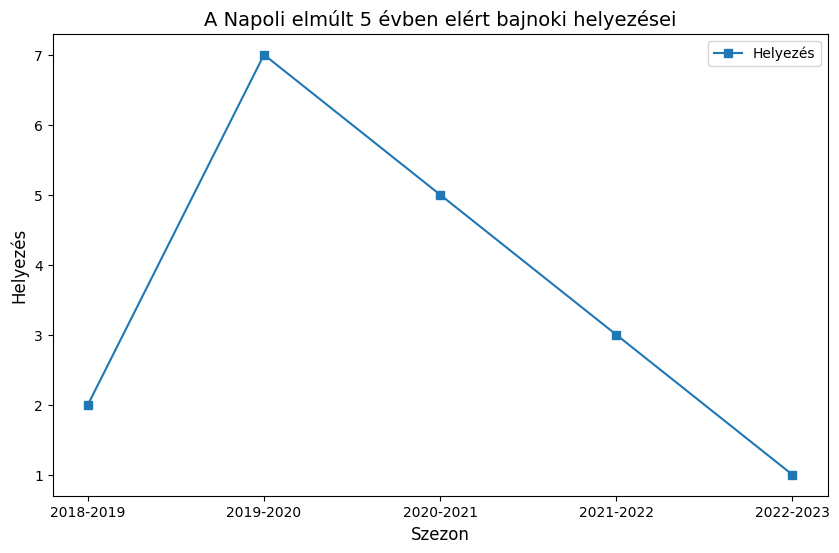

In [ ]:
Napoli=SA_table[SA_table["Squad"]=="Napoli"]
Napoli=Napoli[["Rk","Season"]].sort_values(by='Season', ascending=True)

xpoints = np.array(Napoli["Season"])
ypoints = np.array(Napoli["Rk"])

plt.figure(figsize=(10, 6))

plt.plot(xpoints, Napoli["Rk"], label='Helyezés', marker='s')

plt.title('A Napoli elmúlt 5 évben elért bajnoki helyezései', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Helyezés', fontsize=12)
plt.legend()
plt.show()

Mint az látható a Napoli a 2022-2023-as szezonban felért a csúcsra azáltal, hogy bajnoki címet nyert. A társaság utoljára a 2018/2019-es szezonban volt a legközelebb ehhez, akkor másodikak lettek. Megvizsgáltam hát a meghatározó játékosainak teljesítményét.

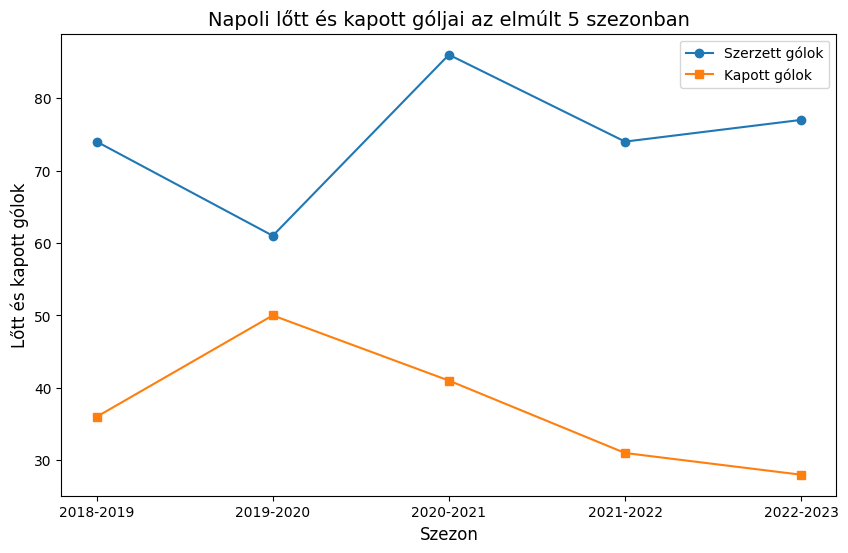

In [ ]:
Napoli=SA_table[SA_table["Squad"]=="Napoli"]
Napoli_gf_ga=Napoli[["Season","GF","GA"]].sort_values(by='Season', ascending=True)

gf = np.array(Napoli_gf_ga["GF"])
ga = np.array(Napoli_gf_ga["GA"])


plt.figure(figsize=(10, 6))

plt.plot(Napoli_gf_ga["Season"],gf, label='Szerzett gólok', marker='o')
plt.plot(Napoli_gf_ga["Season"],ga, label='Kapott gólok', marker='s')

plt.title('Napoli lőtt és kapott góljai az elmúlt 5 szezonban', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Lőtt és kapott gólok', fontsize=12)


plt.legend()


plt.show()


Az ábrából kitűnik, hogy a korábbi évekhez képest sokkal több gólt rúgtak és sokkal kevesebb gólt kaptak. Így a támadók és a védők teljesítményét egyaránt meg kell vizsgálni.

######Támadók

In [ ]:
Napoli2022_2023=SA2023[SA2023["Team"]=="Napoli"]
Napoli2022_2023_att=Napoli2022_2023[Napoli2022_2023['Pos'].str.contains(r'\bFW\b')]
Napoli2022_2023_att


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
5,Victor Osimhen,ng NGA,FW,23.0,32,30,2566.0,28.5,26.0,4.0,...,6.0,16.0,29.0,0.0,65.0,54.0,54.6,2022-2023,Napoli,Serie A
6,Khvicha Kvaratskhelia,ge GEO,FW,21.0,34,30,2518.0,28.0,12.0,10.0,...,5.0,48.0,6.0,1.0,8.0,13.0,38.1,2022-2023,Napoli,Serie A
10,Hirving Lozano,mx MEX,FW,27.0,32,20,1605.0,17.8,3.0,3.0,...,15.0,39.0,6.0,0.0,8.0,13.0,38.1,2022-2023,Napoli,Serie A
12,Elif Elmas,mk MKD,"FW,MF",22.0,36,14,1627.0,18.1,6.0,3.0,...,11.0,35.0,5.0,0.0,5.0,14.0,26.3,2022-2023,Napoli,Serie A
13,Matteo Politano,it ITA,FW,28.0,27,14,1166.0,13.0,3.0,3.0,...,7.0,25.0,7.0,0.0,3.0,6.0,33.3,2022-2023,Napoli,Serie A
15,Giacomo Raspadori,it ITA,"FW,MF",22.0,25,10,911.0,10.1,2.0,2.0,...,4.0,14.0,4.0,0.0,3.0,8.0,27.3,2022-2023,Napoli,Serie A
19,Alessio Zerbin,it ITA,FW,23.0,10,2,198.0,2.2,0.0,0.0,...,2.0,12.0,2.0,0.0,0.0,1.0,0.0,2022-2023,Napoli,Serie A
22,Giovanni Simeone,ar ARG,FW,27.0,25,1,406.0,4.5,4.0,1.0,...,1.0,13.0,4.0,0.0,6.0,19.0,24.0,2022-2023,Napoli,Serie A
24,Karim Zedadka,fr FRA,FW,22.0,3,0,20.0,0.2,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,50.0,2022-2023,Napoli,Serie A
25,Adam Ounas,dz ALG,FW,25.0,2,0,15.0,0.2,0.0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,100.0,2022-2023,Napoli,Serie A


In [ ]:
SA2019=SA[SA["Season"]=="2018-2019"]
Napoli2019=SA2019[SA2019["Team"]=="Napoli"]
Napoli2019=Napoli2019[Napoli2019["Pos"].str.contains(r'\bFW\b')]
Napoli2019=Napoli2019.sort_values(by="Gls",ascending=False).head(1)
Napoli2019

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
3152,Arkadiusz Milik,pl POL,FW,24.0,35,27,2396.0,26.6,17.0,3.0,...,15.0,0.0,43.0,67.0,39.1,2018-2019,Napoli,Serie A,Arkadiusz Milik(Napoli),2018-2019(Arkadiusz Milik)


In [ ]:
SA2020=SA[SA["Season"]=="2019-2020"]
Napoli2020=SA2020[SA2020["Team"]=="Napoli"]
Napoli2020=Napoli2020[Napoli2020["Pos"].str.contains(r'\bFW\b')]
Napoli2020=Napoli2020.sort_values(by="Gls",ascending=False).head(1)
Napoli2020

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
2591,Arkadiusz Milik,pl POL,FW,25.0,26,19,1747.0,19.4,11.0,0.0,...,12.0,0.0,35.0,36.0,49.3,2019-2020,Napoli,Serie A,Arkadiusz Milik(Napoli),2019-2020(Arkadiusz Milik)


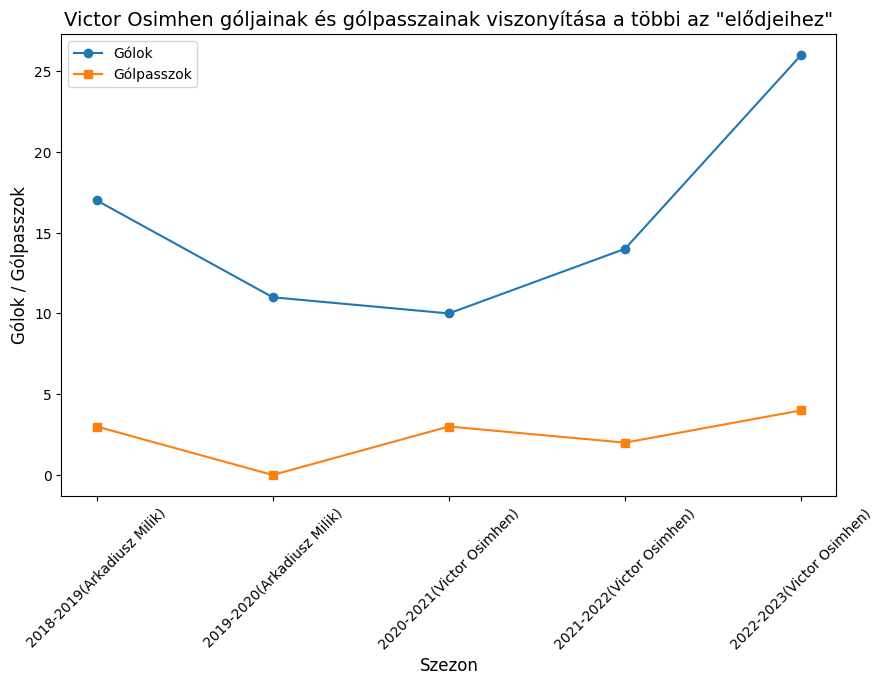

In [ ]:
#Victor Osimhen
#Osimhen nem volt mind az 5 vizsált szezonban a Napoli játékosa így olyan játékosokat kell keresni arra a 2 szezonra akik sok gólt lőttek
#Arkadiusz Milik lett ez a játékos, a 2018-2019 és a 2019-2020-as szezonban az ő statisztikáját vettük alapból

Osimhen=SA[SA["Player"]=="Victor Osimhen"]
Nap_Att=pd.concat([Osimhen,Napoli2020,Napoli2019])
Nap_Att=Nap_Att[["Gls","Ast","Season(Player)"]].sort_values(by='Season(Player)', ascending=True)

gls = np.array(Nap_Att["Gls"])
ast = np.array(Nap_Att["Ast"])


plt.figure(figsize=(10, 6))

plt.plot(Nap_Att["Season(Player)"], gls, label='Gólok', marker='o')
plt.plot(Nap_Att["Season(Player)"], ast, label='Gólpasszok', marker='s')

plt.title('Victor Osimhen góljainak és gólpasszainak viszonyítása a többi az "elődjeihez"', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)
plt.xticks(rotation=45)

plt.legend()


plt.show()


In [ ]:
SA2019=SA[SA["Season"]=="2018-2019"]
Napoli2019=SA2019[SA2019["Team"]=="Napoli"]
Napoli2019=Napoli2019[Napoli2019["Pos"].str.contains(r'\bFW\b')]
Napoli2019GA=Napoli2019.sort_values(by="G+A",ascending=False).head(1)
Napoli2019GA

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
3155,Dries Mertens,be BEL,FW,31.0,35,23,2252.0,25.0,16.0,11.0,...,3.0,0.0,6.0,16.0,27.3,2018-2019,Napoli,Serie A,Dries Mertens(Napoli),2018-2019(Dries Mertens)


In [ ]:
SA2020=SA[SA["Season"]=="2019-2020"]
Napoli2020=SA2020[SA2020["Team"]=="Napoli"]
Napoli2020=Napoli2020[Napoli2020["Pos"].str.contains(r'\bFW\b')]
Napoli2020GA=Napoli2020.sort_values(by="G+A",ascending=False).head(1)
Napoli2020GA

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
2592,Dries Mertens,be BEL,FW,32.0,31,18,1689.0,18.8,9.0,7.0,...,4.0,0.0,3.0,8.0,27.3,2019-2020,Napoli,Serie A,Dries Mertens(Napoli),2019-2020(Dries Mertens)


In [ ]:
SA2021=SA[SA["Season"]=="2020-2021"]
Napoli2021=SA2021[SA2021["Team"]=="Napoli"]
Napoli2021=Napoli2021[Napoli2021["Pos"].str.contains(r'\bFW\b')]
Napoli2021GA=Napoli2021.sort_values(by="G+A",ascending=False).head(1)
Napoli2021GA

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
1724,Lorenzo Insigne,it ITA,FW,29.0,35,33,2865.0,31.8,19.0,8.0,...,6.0,1.0,2.0,5.0,28.6,2020-2021,Napoli,Serie A,Lorenzo Insigne(Napoli),2020-2021(Lorenzo Insigne)


In [ ]:
SA2022=SA[SA["Season"]=="2021-2022"]
Napoli2022=SA2022[SA2022["Team"]=="Napoli"]
Napoli2022=Napoli2022[Napoli2022["Pos"].str.contains(r'\bFW\b')]
Napoli2022GA=Napoli2022.sort_values(by="G+A",ascending=False).head(1)
Napoli2022GA

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
838,Lorenzo Insigne,it ITA,FW,30.0,32,28,2290.0,25.4,11.0,8.0,...,3.0,1.0,5.0,9.0,35.7,2021-2022,Napoli,Serie A,Lorenzo Insigne(Napoli),2021-2022(Lorenzo Insigne)


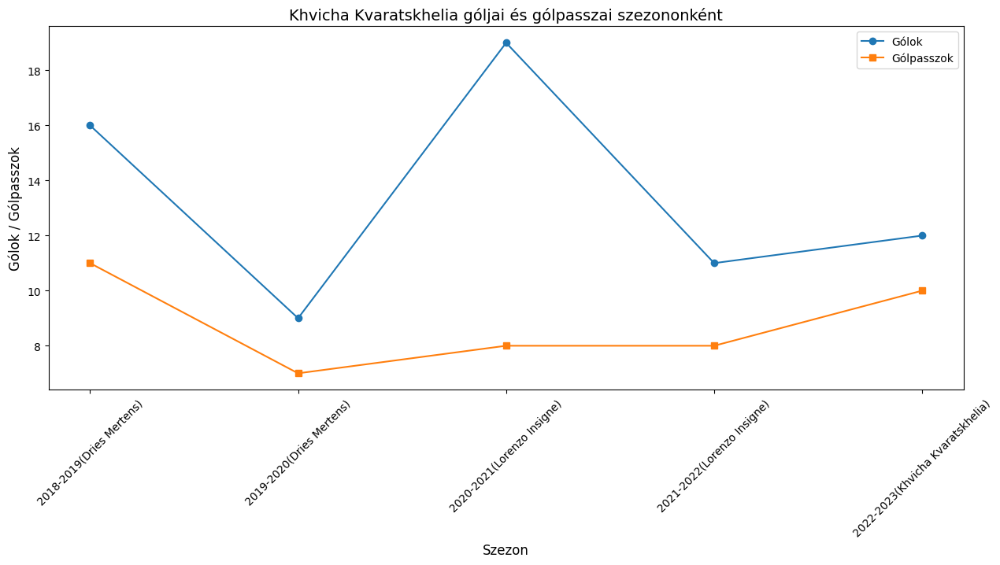

In [ ]:
#Khvicha Kvaratskhelia
#Kvaratskhelia nem volt mind az 5 vizsgált szezonban a Napoli játékosa így olyan játékosokat kell keresni arra a 4 szezonra akik sok gólt lőttek
#Dries Mertens és Lorenzo Insigne lettek ezek a játékosok, a 2018-2019 és a 2019-2020-as szezonban az ő statisztikáját vettük alapból, mert hasonlóan Kvaratskheliahoz, ő is jeleskedett a góllövésben, a gólpasszadásban is
Kvaratskhelia=SA[SA["Player"]=="Khvicha Kvaratskhelia"]
Nap_Att2=pd.concat([Kvaratskhelia,Napoli2022GA,Napoli2021GA,Napoli2020GA,Napoli2019GA])
Nap_Att2=Nap_Att2[["Gls","Ast","Season(Player)",]].sort_values(by='Season(Player)', ascending=True)



gls = np.array(Nap_Att2["Gls"])
ast = np.array(Nap_Att2["Ast"])

# Az ábra inicializálása
plt.figure(figsize=(15, 6))  # Ábra mérete

# Gólok vonalának hozzáadása az ábrához
plt.plot(Nap_Att2["Season(Player)"], gls, label='Gólok', marker='o')

# Asszisztok vonalának hozzáadása az ábrához
plt.plot(Nap_Att2["Season(Player)"], ast, label='Gólpasszok', marker='s')

# Az ábra címe és tengelyfeliratai
plt.title('Khvicha Kvaratskhelia góljai és gólpasszai szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)
plt.xticks(rotation=45)
# Az ábra jelmagyarázata (legend)
plt.legend()

# Az ábra megjelenítése
plt.show()


A vizsgált játékosok húzóemberei voltak az évek alatt a Napoli támadójátékának, és sikerült úgy pótolni a távozott támadókat, hogy a hatékonyság és lendület nem kopott ki a Napoli támadójátékából, ugyanis mint látjuk az együttesnek a góllövéssel nem volt gondja az évek során, és ezt fent is tudták tartani.

######Védők


In [ ]:
Napoli2022_2023=SA2023[SA2023["Team"]=="Napoli"]
Napoli2022_2023_df=Napoli2022_2023[Napoli2022_2023['Pos']=="DF"]
Napoli2022_2023_df=Napoli2022_2023_df[Napoli2022_2023['Starts']>=12]
Napoli2022_2023_df


<ipython-input-133-63c6f98f07da>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Napoli2022_2023_df=Napoli2022_2023_df[Napoli2022_2023['Starts']>=12]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Giovanni Di Lorenzo,it ITA,DF,28.0,37,36,3257.0,36.2,3.0,4.0,...,30.0,90.0,60.0,0.0,41.0,34.0,54.7,2022-2023,Napoli,Serie A
2,Kim Min-jae,kr KOR,DF,25.0,35,35,3050.0,33.9,2.0,2.0,...,41.0,96.0,123.0,1.0,91.0,54.0,62.8,2022-2023,Napoli,Serie A
7,Amir Rrahmani,xk KVX,DF,28.0,29,27,2448.0,27.2,2.0,1.0,...,14.0,47.0,79.0,1.0,67.0,40.0,62.6,2022-2023,Napoli,Serie A
9,Mário Rui,pt POR,DF,31.0,22,21,1749.0,19.4,0.0,6.0,...,15.0,49.0,24.0,1.0,13.0,25.0,34.2,2022-2023,Napoli,Serie A
11,Mathías Olivera,uy URU,DF,24.0,30,17,1643.0,18.3,2.0,2.0,...,22.0,61.0,26.0,0.0,33.0,42.0,44.0,2022-2023,Napoli,Serie A


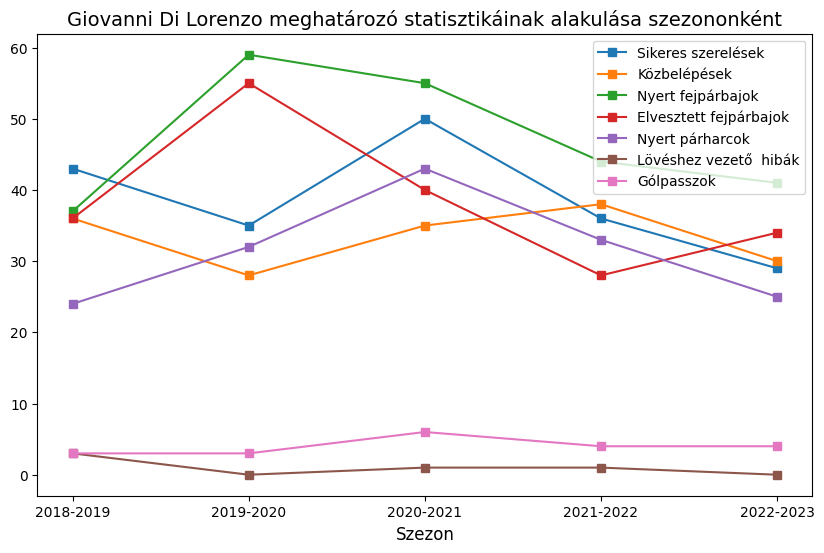

In [ ]:
#Giovanni Di Lorenzo
Lorenzo=SA[SA['Player']=="Giovanni Di Lorenzo"]
#Lorenzo.loc[len(Castagne)] = {'Ast': 0, 'Clr':0,'Season': "2018-2019",'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0,'Err': 0}
#Lorenzo.loc[len(Castagne)] = {'Ast': 0, 'Clr':0,'Season': "2019-2020",'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0,'Err': 0}
Lorenzo=Lorenzo[["Ast","Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season"]].sort_values(by='Season', ascending=True)

Clr = np.array(Lorenzo["Clr"])
TklW = np.array(Lorenzo["TklW"])
Int = np.array(Lorenzo["Int"])
Challenges_Tkl=np.array(Lorenzo["Challenges_Tkl"])
Won = np.array(Lorenzo["Won"])
Lost = np.array(Lorenzo["Lost"])
Err= np.array(Lorenzo["Err"])
Ast=np.array(Lorenzo["Ast"])

plt.figure(figsize=(10, 6))


plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')
plt.plot(xpoints, Ast, label='Gólpasszok', marker='s')

plt.title('Giovanni Di Lorenzo meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

In [ ]:
Koulibaly = SA[SA["Player"]=="Kalidou Koulibaly"]
Koulibaly


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Player(Team),Season(Player)
839,Kalidou Koulibaly,sn SEN,DF,30.0,27,27,2405.0,26.7,3.0,1.0,...,90.0,1.0,48.0,37.0,56.5,2021-2022,Napoli,Serie A,Kalidou Koulibaly(Napoli),2021-2022(Kalidou Koulibaly)
1728,Kalidou Koulibaly,sn SEN,DF,29.0,26,25,2209.0,24.5,0.0,0.0,...,64.0,2.0,40.0,37.0,51.9,2020-2021,Napoli,Serie A,Kalidou Koulibaly(Napoli),2020-2021(Kalidou Koulibaly)
2587,Kalidou Koulibaly,sn SEN,DF,28.0,25,24,2105.0,23.4,0.0,0.0,...,61.0,1.0,48.0,35.0,57.8,2019-2020,Napoli,Serie A,Kalidou Koulibaly(Napoli),2019-2020(Kalidou Koulibaly)
3148,Kalidou Koulibaly,sn SEN,DF,27.0,35,35,3132.0,34.8,2.0,2.0,...,144.0,0.0,75.0,53.0,58.6,2018-2019,Napoli,Serie A,Kalidou Koulibaly(Napoli),2018-2019(Kalidou Koulibaly)


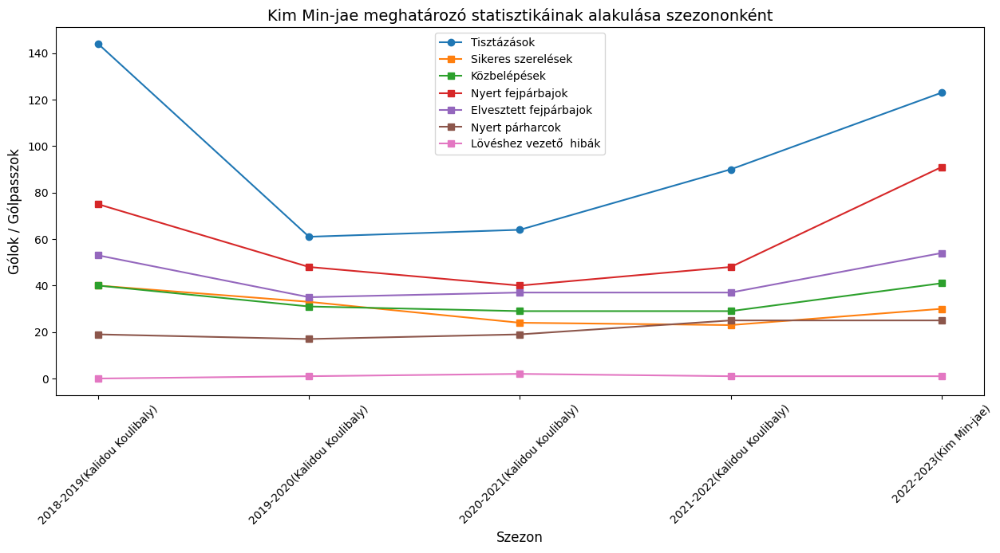

In [ ]:
#Kim Min-jae
#Kim Min-jae nem volt mind az 5 vizsgált szezonban a Napoli játékosa így olyan játékosokat kell keresni arra a 4 szezonra akik alapemberei voltak a védelemnek
#Kalidou Koulibaly lett a kiválasztott, hasonló szerepköre és stabil teljesítménye miatt
Kim=SA[SA["Player"]=="Kim Min-jae"]
Kim=pd.concat([Kim,Koulibaly])
Kim=Kim[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season(Player)"]].sort_values(by='Season(Player)', ascending=True)



Clr = np.array(Kim["Clr"])
TklW = np.array(Kim["TklW"])
Int = np.array(Kim["Int"])
Challenges_Tkl=np.array(Kim["Challenges_Tkl"])
Won = np.array(Kim["Won"])
Lost = np.array(Kim["Lost"])
Err= np.array(Kim["Err"])


# Az ábra inicializálása
plt.figure(figsize=(15, 6))  # Ábra mérete

plt.plot(Kim['Season(Player)'], Clr, label='Tisztázások', marker='o')
plt.plot(Kim['Season(Player)'], TklW, label='Sikeres szerelések', marker='s')
plt.plot(Kim['Season(Player)'], Int, label='Közbelépések', marker='s')
plt.plot(Kim['Season(Player)'], Won, label='Nyert fejpárbajok', marker='s')
plt.plot(Kim['Season(Player)'], Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(Kim['Season(Player)'], Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(Kim['Season(Player)'], Err, label='Lövéshez vezető  hibák', marker='s')


# Az ábra címe és tengelyfeliratai
plt.title('Kim Min-jae meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)
plt.xticks(rotation=45)
# Az ábra jelmagyarázata (legend)
plt.legend()

# Az ábra megjelenítése
plt.show()

<ipython-input-172-3ce9035a1992>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Rrahmani.loc[len(Rrahmani)] = {'Ast': 0, 'Clr':0,'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0, 'Lost':0,'Err': 0, 'Season(Player)': "2018-2019(Amir Rrahmani)"} #Mivel nála csak egy szezon hiányzik így ott az adatokat feltöltöm nullával


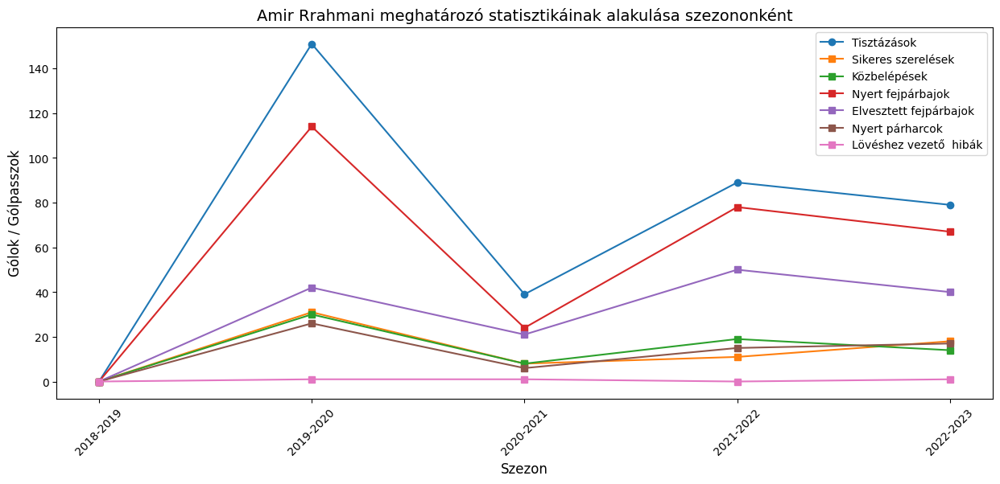

In [ ]:
#Amir Rrahmani
Rrahmani=SA[SA["Player"]=="Amir Rrahmani"]
Rrahmani.loc[len(Rrahmani)] = {'Ast': 0, 'Clr':0,'TklW': 0,'Challenges_Tkl': 0,'Int': 0,'Won': 0, 'Lost':0,'Err': 0, 'Season(Player)': "2018-2019(Amir Rrahmani)"} #Mivel nála csak egy szezon hiányzik így ott az adatokat feltöltöm nullával
Rrahmani=Rrahmani[["Clr","TklW","Challenges_Tkl","Int","Won","Lost","Err","Season(Player)"]].sort_values(by='Season(Player)', ascending=True)



Clr = np.array(Rrahmani["Clr"])
TklW = np.array(Rrahmani["TklW"])
Int = np.array(Rrahmani["Int"])
Challenges_Tkl=np.array(Rrahmani["Challenges_Tkl"])
Won = np.array(Rrahmani["Won"])
Lost = np.array(Rrahmani["Lost"])
Err= np.array(Rrahmani["Err"])


# Az ábra inicializálása
plt.figure(figsize=(15, 6))  # Ábra mérete

plt.plot(xpoints, Clr, label='Tisztázások', marker='o')
plt.plot(xpoints, TklW, label='Sikeres szerelések', marker='s')
plt.plot(xpoints, Int, label='Közbelépések', marker='s')
plt.plot(xpoints, Won, label='Nyert fejpárbajok', marker='s')
plt.plot(xpoints, Lost, label='Elvesztett fejpárbajok', marker='s')
plt.plot(xpoints, Challenges_Tkl, label='Nyert párharcok', marker='s')
plt.plot(xpoints, Err, label='Lövéshez vezető  hibák', marker='s')


# Az ábra címe és tengelyfeliratai
plt.title('Amir Rrahmani meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('Gólok / Gólpasszok', fontsize=12)
plt.xticks(rotation=45)
# Az ábra jelmagyarázata (legend)
plt.legend()

# Az ábra megjelenítése
plt.show()

A védők esetében javulás fedezhető fel az előző szenokhoz képest a legtöbb mutatóban.

######Kapus(ok)

In [ ]:
Napoli2022_2023=SA2023[SA2023["Team"]=="Napoli"]
Napoli2022_2023_gk=Napoli2022_2023[Napoli2022_2023['Pos']=="GK"]
Napoli2022_2023_gk=Napoli2022_2023_gk[Napoli2022_2023['Starts']>=26]
Napoli2022_2023_gk


<ipython-input-173-5f717cade2f4>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Napoli2022_2023_gk=Napoli2022_2023_gk[Napoli2022_2023['Starts']>=26]


,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
4,Alex Meret,it ITA,GK,25.0,34,34,3060.0,34.0,0.0,0.0,...,0.0,0.0,6.0,1.0,4.0,0.0,100.0,2022-2023,Napoli,Serie A


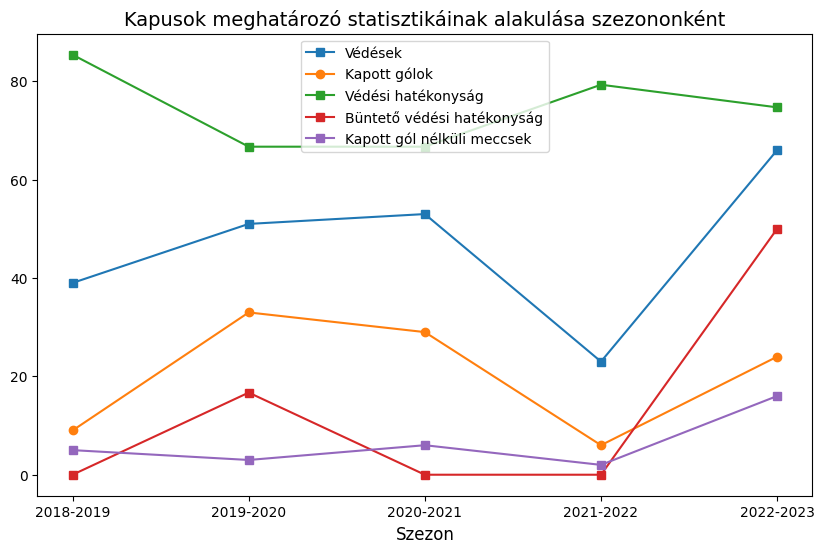

In [ ]:
#Alex Meret
Meret=SA[SA["Player"]=="Alex Meret"]
Meret=Meret[["Player","GA","Saves","Save%","PK_Save%","CS","Season"]].sort_values(by='Season', ascending=True)

GA = np.array(Meret["GA"])
Save = np.array(Meret["Save%"])
PK_Save = np.array(Meret["PK_Save%"])
CS=np.array(Meret["CS"])
Saves = np.array(Meret["Saves"])

plt.figure(figsize=(10, 6))
plt.plot(xpoints, Saves, label='Védések', marker='s')
plt.plot(xpoints, GA, label='Kapott gólok', marker='o')
plt.plot(xpoints, Save, label='Védési hatékonyság', marker='s')
plt.plot(xpoints, PK_Save, label='Büntető védési hatékonyság', marker='s')
plt.plot(xpoints, CS, label='Kapott gól nélküli meccsek', marker='s')


plt.title('Kapusok meghatározó statisztikáinak alakulása szezononként', fontsize=14)
plt.xlabel('Szezon', fontsize=12)
plt.ylabel('', fontsize=12)
plt.legend()
plt.show()

Kapusok terén, megállapítható hogy Alex Meret teljesítménye minden szezonnal jobb és jobb lett, a futball egyik alapszabálya pedig, hogy végy egy jó kapust.


######**ÖSSZEGZÉS**
Összességében elmondható, hogy a Napoli sikerének záloga az volt, hogy ebben az 5 évben a csapatrészek úgy cserélődtek ki, hogy nem következett be minőségbeli romlás, sőt bizonyos játékos teljesítménye javult a szezonok során.

#Predicting the Ballon d'Or winner
A minden verseny sorozatban elért játékos mutatókat egyesítem 1 nagy .csv fileba, és az aranylabdával kapcsolatos predikciókat végzek rajta

##A játékosok minden versenysorozatban elért statisztikáinak (...All_vegleges.csv file) beolvasása és utótisztítása majd egyesítése

###Bundesliga

In [ ]:
BL_All=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/BL_All_vegleges.csv")
BL_All

,Unnamed: 0,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,0,Joshua Kimmich,de GER,MF,27,47,46,4046.0,45.0,7.0,...,77.0,158.0,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga
1,1,Matthijs de Ligt,nl NED,DF,22,43,38,3390.0,37.7,3.0,...,44.0,70.0,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga
2,2,Dayot Upamecano,fr FRA,DF,23,43,40,3381.0,37.6,1.0,...,44.0,120.0,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga
3,3,Benjamin Pavard,fr FRA,DF,26,43,38,3370.0,37.4,7.0,...,66.0,139.0,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga
4,4,Jamal Musiala,de GER,"MF,FW",19,47,36,3009.0,33.4,16.0,...,28.0,63.0,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2993,23,Timmy Tillman,de GER,"FW,MF",19,6,1,206.0,2.3,0.0,...,3.0,3.0,0.0,2.0,3.0,2.0,60.0,2018-2019,Nurnberg,Bundesliga
2994,24,Edgar Salli,cm CMR,"FW,MF",25,4,2,177.0,2.0,0.0,...,1.0,3.0,1.0,0.0,0.0,7.0,0.0,2018-2019,Nurnberg,Bundesliga
2995,25,Ivo Iličević,hr CRO,MF,31,3,0,39.0,0.4,0.0,...,0.0,1.0,0.0,0.0,0.0,2.0,0.0,2018-2019,Nurnberg,Bundesliga
2996,26,Lukas Jäger,at AUT,"FW,MF",24,2,0,27.0,0.3,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,50.0,2018-2019,Nurnberg,Bundesliga


In [ ]:
del BL_All["Unnamed: 0"]

In [ ]:
pd.isnull(BL_All).sum()

Player                   0
Nation                   0
Pos                      0
Age                      0
MP                       0
Starts                   0
Min                    402
90s                    401
Gls                    401
Ast                    401
G+A                    401
G-PK                   401
Penalty_Kicks_Made     401
PKatt                  401
CrdY                   401
CrdR                   401
xG                     462
npxG                   462
xAG                    462
npxG.1                 462
GA                    2804
SoTA                  2804
Saves                 2804
Save%                 2806
PK_Save%              2862
CS                    2804
CS%                   2810
Sh                     402
SoT                    402
SoT%                   867
G/Sh                   867
Dist                   924
Cmp                    462
Att                    462
Cmp%                   483
TotDist                462
PrgDist                462
x

In [ ]:
BL_All=BL_All.fillna(0)

In [ ]:
pd.isnull(BL_All).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [ ]:
BL_All.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Joshua Kimmich,de GER,MF,27,47,46,4046.0,45.0,7.0,11.0,...,77.0,158.0,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga
1,Matthijs de Ligt,nl NED,DF,22,43,38,3390.0,37.7,3.0,1.0,...,44.0,70.0,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga
2,Dayot Upamecano,fr FRA,DF,23,43,40,3381.0,37.6,1.0,1.0,...,44.0,120.0,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga
3,Benjamin Pavard,fr FRA,DF,26,43,38,3370.0,37.4,7.0,1.0,...,66.0,139.0,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga
4,Jamal Musiala,de GER,"MF,FW",19,47,36,3009.0,33.4,16.0,13.0,...,28.0,63.0,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga


###La Liga

In [ ]:
LaLiga_All=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/LaLiga_All_vegleges.csv")
LaLiga_All

,Unnamed: 0,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,0,Marc-André ter Stegen,de GER,GK,30.0,50,50,4457.0,49.5,0.0,...,1.0,1.0,7.0,3.0,7.0,1.0,87.5,2022-2023,Barcelona,La Liga
1,1,Robert Lewandowski,pl POL,FW,33.0,46,45,3948.0,43.9,33.0,...,4.0,28.0,23.0,0.0,65.0,56.0,53.7,2022-2023,Barcelona,La Liga
2,2,Gavi,es ESP,MF,17.0,49,40,3510.0,39.0,3.0,...,27.0,82.0,24.0,0.0,47.0,40.0,54.0,2022-2023,Barcelona,La Liga
3,3,Jules Koundé,fr FRA,DF,23.0,40,39,3452.0,38.4,1.0,...,32.0,71.0,68.0,3.0,53.0,32.0,62.4,2022-2023,Barcelona,La Liga
4,4,Frenkie de Jong,nl NED,MF,25.0,43,37,3279.0,36.4,2.0,...,44.0,92.0,26.0,1.0,40.0,17.0,70.2,2022-2023,Barcelona,La Liga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,30,Morro,es ESP,GK,17.0,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Rayo Vallecano,La Liga
3596,31,Martín Pascual,es ESP,DF,18.0,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Rayo Vallecano,La Liga
3597,32,Manuel Navarro,es ESP,MF,17.0,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Rayo Vallecano,La Liga
3598,33,Ángel Algobia,es ESP,MF,19.0,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Rayo Vallecano,La Liga


In [ ]:
del LaLiga_All["Unnamed: 0"]

In [ ]:
pd.isnull(LaLiga_All).sum()

Player                   0
Nation                  17
Pos                      2
Age                      5
MP                       0
Starts                   0
Min                    541
90s                    538
Gls                    538
Ast                    538
G+A                    538
G-PK                   538
Penalty_Kicks_Made     538
PKatt                  538
CrdY                   538
CrdR                   538
xG                     679
npxG                   679
xAG                    679
npxG.1                 679
GA                    3359
SoTA                  3358
Saves                 3358
Save%                 3362
PK_Save%              3427
CS                    3357
CS%                   3365
Sh                     553
SoT                    553
SoT%                  1067
G/Sh                  1067
Dist                  1180
Cmp                    679
Att                    679
Cmp%                   694
TotDist                679
PrgDist                679
x

In [ ]:
LaLiga_All[pd.isnull(LaLiga_All["Age"])][["Player","Age"]]

,Player,Age
1280,Max Svensson,NaN
1527,Oscar Medina,NaN
2192,Gustavo Abizanda,NaN
3562,Javier Almerge,NaN
3564,Javito Lopez,NaN


In [ ]:
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Max Svensson"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Oscar Medina"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Gustavo Abizanda"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Javier Almerge"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Javito Lopez"]

In [ ]:
LaLiga_All[pd.isnull(LaLiga_All["Pos"])][["Player","Nation","MP","Team","Season",'Pos','Age']]

,Player,Nation,MP,Team,Season,Pos,Age
1528,Iván Sanz,es ESP,0,Alaves,2021-2022,NaN,18.0


In [ ]:
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Marcos Fernández Cózar"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Blanco"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Santiago García"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Ricardo Visus"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Mamadou N'Diaye"]
LaLiga_All=LaLiga_All[LaLiga_All["Player"]!="Iván Sanz"]


In [ ]:
LaLiga_All.loc[LaLiga_All['Player'] == "Hugo Guillamón", 'Nation'] = "es ESP"

In [ ]:
LaLiga_All.loc[LaLiga_All['Player'] == "Hugo Guillamón", 'Nation'] = "es ESP"

In [ ]:
LaLiga_All[LaLiga_All['Player']=="Hugo Guillamón"]

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
565,Hugo Guillamón,es ESP,"DF,MF",22.0,29,21,1805.0,20.1,1.0,4.0,...,20.0,0.0,NaN,NaN,NaN,NaN,NaN,2022-2023,Valencia,La Liga
1070,Hugo Guillamón,es ESP,"DF,MF",21.0,37,32,2783.0,30.9,2.0,0.0,...,33.0,0.0,NaN,NaN,NaN,NaN,NaN,2021-2022,Valencia,La Liga
1989,Hugo Guillamón,es ESP,"DF,MF",20.0,27,23,2143.0,23.8,1.0,0.0,...,29.0,0.0,NaN,NaN,NaN,NaN,NaN,2020-2021,Valencia,La Liga
2564,Hugo Guillamón,es ESP,"DF,MF",19.0,6,5,495.0,5.5,0.0,0.0,...,7.0,0.0,NaN,NaN,NaN,NaN,NaN,2019-2020,Valencia,La Liga
3094,Hugo Guillamón,es ESP,"DF,MF",18.0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Valencia,La Liga


In [ ]:
LaLiga_All=LaLiga_All.fillna(0)

In [ ]:
pd.isnull(LaLiga_All).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [ ]:
LaLiga_All.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Marc-André ter Stegen,de GER,GK,30.0,50,50,4457.0,49.5,0.0,0.0,...,1.0,1.0,7.0,3.0,7.0,1.0,87.5,2022-2023,Barcelona,La Liga
1,Robert Lewandowski,pl POL,FW,33.0,46,45,3948.0,43.9,33.0,8.0,...,4.0,28.0,23.0,0.0,65.0,56.0,53.7,2022-2023,Barcelona,La Liga
2,Gavi,es ESP,MF,17.0,49,40,3510.0,39.0,3.0,7.0,...,27.0,82.0,24.0,0.0,47.0,40.0,54.0,2022-2023,Barcelona,La Liga
3,Jules Koundé,fr FRA,DF,23.0,40,39,3452.0,38.4,1.0,6.0,...,32.0,71.0,68.0,3.0,53.0,32.0,62.4,2022-2023,Barcelona,La Liga
4,Frenkie de Jong,nl NED,MF,25.0,43,37,3279.0,36.4,2.0,4.0,...,44.0,92.0,26.0,1.0,40.0,17.0,70.2,2022-2023,Barcelona,La Liga


###Ligue1

In [ ]:
Ligue1_All=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/Ligue1_All_vegleges.csv")
Ligue1_All

,Unnamed: 0,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,0,Gianluigi Donnarumma,it ITA,GK,23,48,48,4309.0,47.9,0.0,...,0.0,1.0,19.0,5.0,7.0,1.0,87.5,2022-2023,Paris Saint Germain,Ligue 1
1,1,Sergio Ramos,es ESP,DF,36,45,42,3695.0,41.1,4.0,...,47.0,88.0,118.0,3.0,72.0,45.0,61.5,2022-2023,Paris Saint Germain,Ligue 1
2,2,Marquinhos,br BRA,DF,28,44,41,3640.0,40.4,2.0,...,28.0,64.0,103.0,2.0,49.0,35.0,58.3,2022-2023,Paris Saint Germain,Ligue 1
3,3,Lionel Messi,ar ARG,"FW,MF",35,41,41,3630.0,40.3,21.0,...,5.0,35.0,0.0,0.0,2.0,3.0,40.0,2022-2023,Paris Saint Germain,Ligue 1
4,4,Kylian Mbappé,fr FRA,FW,23,43,40,3559.0,39.5,41.0,...,5.0,15.0,9.0,0.0,9.0,7.0,56.3,2022-2023,Paris Saint Germain,Ligue 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3547,29,Louis Carnot,fr FRA,MF,17,1,0,8.0,0.1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2018-2019,Guingamp,Ligue 1
3548,30,Denis Petrić,rs SRB,GK,30,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Guingamp,Ligue 1
3549,31,Yohan Bilingi,fr FRA,DF,19,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Guingamp,Ligue 1
3550,32,Mehdi Boudjemaa,dz ALG,MF,20,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Guingamp,Ligue 1


In [ ]:
del Ligue1_All["Unnamed: 0"]

In [ ]:
pd.isnull(Ligue1_All).sum()

Player                   0
Nation                   6
Pos                      2
Age                      0
MP                       0
Starts                   0
Min                    513
90s                    511
Gls                    511
Ast                    512
G+A                    512
G-PK                   511
Penalty_Kicks_Made     511
PKatt                  511
CrdY                   511
CrdR                   511
xG                     627
npxG                   627
xAG                    627
npxG.1                 627
GA                    3321
SoTA                  3322
Saves                 3322
Save%                 3326
PK_Save%              3376
CS                    3322
CS%                   3329
Sh                     522
SoT                    522
SoT%                  1157
G/Sh                  1157
Dist                  1216
Cmp                    628
Att                    628
Cmp%                   646
TotDist                628
PrgDist                628
x

In [ ]:
Ligue1_All[pd.isnull(Ligue1_All["Nation"])][["Player","Nation","MP","Team","Season",'Pos','Age']]

,Player,Nation,MP,Team,Season,Pos,Age
803,Simon Ngapandouentnbu,NaN,0,Marseille,2021-2022,GK,18
952,Guemissongui Ouattara,NaN,0,Strasbourg,2021-2022,MF,16
2126,Anthony Walongwa,NaN,0,Nantes,2020-2021,DF,26
2199,Amir Arli,NaN,0,Dijon,2020-2021,MF,17
2612,Anthony Walongwa,NaN,0,Nantes,2019-2020,DF,25
3228,Anthony Walongwa,NaN,1,Nantes,2018-2019,DF,24


In [ ]:
Ligue1_All=Ligue1_All[Ligue1_All["Player"]!="Simon Ngapandouentnbu"]
Ligue1_All=Ligue1_All[Ligue1_All["Player"]!="Guemissongui Ouattara"]
Ligue1_All=Ligue1_All[Ligue1_All["Player"]!="Anthony Walongwa"]
Ligue1_All=Ligue1_All[Ligue1_All["Player"]!="Amir Arli"]

In [ ]:
Ligue1_All=Ligue1_All.fillna(0)

In [ ]:
pd.isnull(Ligue1_All).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [ ]:
Ligue1_All.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Gianluigi Donnarumma,it ITA,GK,23,48,48,4309.0,47.9,0.0,0.0,...,0.0,1.0,19.0,5.0,7.0,1.0,87.5,2022-2023,Paris Saint Germain,Ligue 1
1,Sergio Ramos,es ESP,DF,36,45,42,3695.0,41.1,4.0,1.0,...,47.0,88.0,118.0,3.0,72.0,45.0,61.5,2022-2023,Paris Saint Germain,Ligue 1
2,Marquinhos,br BRA,DF,28,44,41,3640.0,40.4,2.0,0.0,...,28.0,64.0,103.0,2.0,49.0,35.0,58.3,2022-2023,Paris Saint Germain,Ligue 1
3,Lionel Messi,ar ARG,"FW,MF",35,41,41,3630.0,40.3,21.0,20.0,...,5.0,35.0,0.0,0.0,2.0,3.0,40.0,2022-2023,Paris Saint Germain,Ligue 1
4,Kylian Mbappé,fr FRA,FW,23,43,40,3559.0,39.5,41.0,9.0,...,5.0,15.0,9.0,0.0,9.0,7.0,56.3,2022-2023,Paris Saint Germain,Ligue 1


###Premier League

In [ ]:
PL_All=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/PL_All_vegleges.csv")
PL_All

,Unnamed: 0,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,0,Rodri,es ESP,MF,26.0,56,52,4465.0,49.6,4.0,...,52.0,137.0,52.0,2.0,87.0,43.0,66.9,2022-2023,Manchester City,Premier League
1,1,Ederson,br BRA,GK,28.0,48,47,4275.0,47.5,0.0,...,1.0,4.0,15.0,2.0,8.0,1.0,88.9,2022-2023,Manchester City,Premier League
2,2,Erling Haaland,no NOR,FW,22.0,53,50,4116.0,45.7,52.0,...,5.0,9.0,17.0,0.0,67.0,61.0,52.3,2022-2023,Manchester City,Premier League
3,3,İlkay Gündoğan,de GER,MF,31.0,51,45,3845.0,42.7,11.0,...,33.0,69.0,19.0,0.0,28.0,21.0,57.1,2022-2023,Manchester City,Premier League
4,4,Manuel Akanji,ch SUI,DF,27.0,48,40,3815.0,42.4,1.0,...,27.0,88.0,53.0,2.0,33.0,47.0,41.3,2022-2023,Manchester City,Premier League
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3641,27,Matty Daly,eng ENG,MF,17.0,2,0,75.0,0.8,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2018-2019,Huddersfield Town,Premier League
3642,28,Aaron Rowe,eng ENG,FW,17.0,2,1,69.0,0.8,0.0,...,1.0,2.0,1.0,0.0,0.0,2.0,0.0,2018-2019,Huddersfield Town,Premier League
3643,29,Demeaco Duhaney,eng ENG,DF,19.0,1,1,45.0,0.5,0.0,...,1.0,2.0,1.0,0.0,0.0,1.0,0.0,2018-2019,Huddersfield Town,Premier League
3644,30,Collin Quaner,de GER,FW,27.0,2,0,39.0,0.4,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2018-2019,Huddersfield Town,Premier League


In [ ]:
del PL_All["Unnamed: 0"]

In [ ]:
pd.isnull(PL_All).sum()

Player                   0
Nation                   3
Pos                      0
Age                      3
MP                       0
Starts                   0
Min                    572
90s                    571
Gls                    571
Ast                    573
G+A                    573
G-PK                   571
Penalty_Kicks_Made     571
PKatt                  571
CrdY                   571
CrdR                   571
xG                     901
npxG                   901
xAG                    901
npxG.1                 901
GA                    3388
SoTA                  3388
Saves                 3388
Save%                 3394
PK_Save%              3489
CS                    3390
CS%                   3398
Sh                     571
SoT                    571
SoT%                  1167
G/Sh                  1167
Dist                  1384
Cmp                    901
Att                    901
Cmp%                   918
TotDist                901
PrgDist                901
x

In [ ]:
PL_All[pd.isnull(PL_All["Age"])][["Player","Nation","MP","Team","Season",'Pos','Age']]

,Player,Nation,MP,Team,Season,Pos,Age
1456,Bobby Thomas,eng ENG,0,Burnley,2021-2022,DF,NaN
2168,Bobby Thomas,eng ENG,1,Burnley,2020-2021,DF,NaN
2639,Bobby Thomas,eng ENG,0,Burnley,2019-2020,DF,NaN


In [ ]:
PL_All=PL_All[PL_All["Player"]!="Radek Vítek"]
PL_All=PL_All[PL_All["Player"]!="Diamond Edwards"]
PL_All=PL_All[PL_All["Player"]!="Nico Lawrence"]
PL_All=PL_All[PL_All["Player"]!="Bobby Thomas"]

In [ ]:
PL_All=PL_All.fillna(0)

In [ ]:
pd.isnull(PL_All).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [ ]:
PL_All.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Rodri,es ESP,MF,26.0,56,52,4465.0,49.6,4.0,7.0,...,52.0,137.0,52.0,2.0,87.0,43.0,66.9,2022-2023,Manchester City,Premier League
1,Ederson,br BRA,GK,28.0,48,47,4275.0,47.5,0.0,1.0,...,1.0,4.0,15.0,2.0,8.0,1.0,88.9,2022-2023,Manchester City,Premier League
2,Erling Haaland,no NOR,FW,22.0,53,50,4116.0,45.7,52.0,9.0,...,5.0,9.0,17.0,0.0,67.0,61.0,52.3,2022-2023,Manchester City,Premier League
3,İlkay Gündoğan,de GER,MF,31.0,51,45,3845.0,42.7,11.0,6.0,...,33.0,69.0,19.0,0.0,28.0,21.0,57.1,2022-2023,Manchester City,Premier League
4,Manuel Akanji,ch SUI,DF,27.0,48,40,3815.0,42.4,1.0,1.0,...,27.0,88.0,53.0,2.0,33.0,47.0,41.3,2022-2023,Manchester City,Premier League


###Serie A

In [ ]:
SA_All=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/SerieA_All_vegleges.csv")
SA_All

,Unnamed: 0,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,0,Giovanni Di Lorenzo,it ITA,DF,28,47,46,4145.0,46.1,5.0,...,42.0,120.0,82.0,0.0,55.0,49.0,52.9,2022-2023,Napoli,Seria A
1,1,Alex Meret,it ITA,GK,25,45,45,4080.0,45.3,0.0,...,0.0,0.0,9.0,2.0,8.0,0.0,100.0,2022-2023,Napoli,Seria A
2,2,Stanislav Lobotka,sk SVK,MF,27,49,44,4030.0,44.8,1.0,...,28.0,132.0,19.0,1.0,12.0,20.0,37.5,2022-2023,Napoli,Seria A
3,3,Kim Min-jae,kr KOR,DF,25,45,44,3874.0,43.0,2.0,...,63.0,130.0,155.0,1.0,123.0,64.0,65.8,2022-2023,Napoli,Seria A
4,4,Andre-Frank Zambo Anguissa,cm CMR,MF,26,45,44,3756.0,41.7,4.0,...,63.0,130.0,30.0,0.0,55.0,34.0,61.8,2022-2023,Napoli,Seria A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3950,37,Michele Bragantini,it ITA,GK,17,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Chievo,Seria A
3951,38,Luca Garritano,it ITA,"FW,MF",24,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Chievo,Seria A
3952,39,Massimo Bertagnoli,it ITA,MF,19,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Chievo,Seria A
3953,40,Thaddee Kaleba,fr FRA,DF,19,0,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-2019,Chievo,Seria A


In [ ]:
del SA_All["Unnamed: 0"]

In [ ]:
pd.isnull(SA_All).sum()

Player                   0
Nation                   4
Pos                      0
Age                      0
MP                       0
Starts                   0
Min                    822
90s                    817
Gls                    817
Ast                    817
G+A                    817
G-PK                   817
Penalty_Kicks_Made     817
PKatt                  817
CrdY                   817
CrdR                   817
xG                     909
npxG                   909
xAG                    909
npxG.1                 909
GA                    3698
SoTA                  3695
Saves                 3695
Save%                 3706
PK_Save%              3784
CS                    3691
CS%                   3713
Sh                     837
SoT                    837
SoT%                  1449
G/Sh                  1449
Dist                  1500
Cmp                    909
Att                    909
Cmp%                   927
TotDist                909
PrgDist                909
x

In [ ]:
SA_All[pd.isnull(SA_All["Nation"])][["Player","Nation","MP","Team","Season",'Pos','Age']]

,Player,Nation,MP,Team,Season,Pos,Age


In [ ]:
SA_All=SA_All[SA_All["Player"]!="Roman Lazar"]
SA_All=SA_All[SA_All["Player"]!="Jan Kubala"]
SA_All=SA_All[SA_All["Player"]!="Sinan Gümüş"]
SA_All=SA_All[SA_All["Player"]!="Alessio da Cruz"]

In [ ]:
SA_All=SA_All.fillna(0)

In [ ]:
pd.isnull(SA_All).sum()

Player                0
Nation                0
Pos                   0
Age                   0
MP                    0
Starts                0
Min                   0
90s                   0
Gls                   0
Ast                   0
G+A                   0
G-PK                  0
Penalty_Kicks_Made    0
PKatt                 0
CrdY                  0
CrdR                  0
xG                    0
npxG                  0
xAG                   0
npxG.1                0
GA                    0
SoTA                  0
Saves                 0
Save%                 0
PK_Save%              0
CS                    0
CS%                   0
Sh                    0
SoT                   0
SoT%                  0
G/Sh                  0
Dist                  0
Cmp                   0
Att                   0
Cmp%                  0
TotDist               0
PrgDist               0
xA                    0
Tkl                   0
Challenges_Tkl        0
TklW                  0
Tkl%            

In [ ]:
SA_All.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Giovanni Di Lorenzo,it ITA,DF,28,47,46,4145.0,46.1,5.0,6.0,...,42.0,120.0,82.0,0.0,55.0,49.0,52.9,2022-2023,Napoli,Seria A
1,Alex Meret,it ITA,GK,25,45,45,4080.0,45.3,0.0,0.0,...,0.0,0.0,9.0,2.0,8.0,0.0,100.0,2022-2023,Napoli,Seria A
2,Stanislav Lobotka,sk SVK,MF,27,49,44,4030.0,44.8,1.0,1.0,...,28.0,132.0,19.0,1.0,12.0,20.0,37.5,2022-2023,Napoli,Seria A
3,Kim Min-jae,kr KOR,DF,25,45,44,3874.0,43.0,2.0,2.0,...,63.0,130.0,155.0,1.0,123.0,64.0,65.8,2022-2023,Napoli,Seria A
4,Andre-Frank Zambo Anguissa,cm CMR,MF,26,45,44,3756.0,41.7,4.0,8.0,...,63.0,130.0,30.0,0.0,55.0,34.0,61.8,2022-2023,Napoli,Seria A


###Egyesítés

In [ ]:
ALL=pd.concat([BL_All,LaLiga_All,PL_All,Ligue1_All,SA_All],ignore_index=True)
ALL

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,77.0,158.0,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,44.0,70.0,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,44.0,120.0,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,66.0,139.0,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,28.0,63.0,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17714,Michele Bragantini,it ITA,GK,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17715,Luca Garritano,it ITA,"FW,MF",24.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17716,Massimo Bertagnoli,it ITA,MF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17717,Thaddee Kaleba,fr FRA,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A


In [ ]:
ALL.to_csv("All_Stats_Merged.csv")

##Az All_Stats_Merged.csv file megfelelő sorainak egyesítése a top10 aranylabda jelölt névsorával

###A 3 .csv file beolvasása, utótisztítása

####Bajnokságok

#####Premier League

In [ ]:
PLTable=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/PL_tables.csv")
PLTable

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,Premier League
1,1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,Premier League
2,2,3,Manchester Utd,38,23,6,9,58,43,15,75,2022-2023,Premier League
3,3,4,Newcastle Utd,38,19,14,5,68,33,35,71,2022-2023,Premier League
4,4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,Premier League
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Southampton,38,9,12,17,45,65,-20,39,2018-2019,Premier League
96,16,17,Brighton,38,9,9,20,35,60,-25,36,2018-2019,Premier League
97,17,18,Cardiff City,38,10,4,24,34,69,-35,34,2018-2019,Premier League
98,18,19,Fulham,38,7,5,26,34,81,-47,26,2018-2019,Premier League


In [ ]:
del PLTable["Unnamed: 0"]

#####Bundesliga

In [ ]:
BLTable=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/Bundesliga_tables.csv")
BLTable

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Bayern Munich,34,21,8,5,92,38,54,71,2022-2023,Bundesliga
1,1,2,Dortmund,34,22,5,7,83,44,39,71,2022-2023,Bundesliga
2,2,3,RB Leipzig,34,20,6,8,64,41,23,66,2022-2023,Bundesliga
3,3,4,Union Berlin,34,18,8,8,51,38,13,62,2022-2023,Bundesliga
4,4,5,Freiburg,34,17,8,9,51,44,7,59,2022-2023,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,13,14,Schalke 04,34,8,9,17,37,55,-18,33,2018-2019,Bundesliga
86,14,15,Augsburg,34,8,8,18,51,71,-20,32,2018-2019,Bundesliga
87,15,16,Stuttgart,34,7,7,20,32,70,-38,28,2018-2019,Bundesliga
88,16,17,Hannover 96,34,5,6,23,31,71,-40,21,2018-2019,Bundesliga


In [ ]:
del BLTable["Unnamed: 0"]

#####SerieA

In [ ]:
SATable=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/SeriaA_tables.csv")
SATable

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Napoli,38,28,6,4,77,28,49,90,2022-2023,Seria A
1,1,2,Lazio,38,22,8,8,60,30,30,74,2022-2023,Seria A
2,2,3,Inter,38,23,3,12,71,42,29,72,2022-2023,Seria A
3,3,4,Milan,38,20,10,8,64,43,21,70,2022-2023,Seria A
4,4,5,Atalanta,38,19,7,12,66,48,18,64,2022-2023,Seria A
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Fiorentina,38,8,17,13,47,45,2,41,2018-2019,Seria A
96,16,17,Genoa,38,8,14,16,39,57,-18,38,2018-2019,Seria A
97,17,18,Empoli,38,10,8,20,51,70,-19,38,2018-2019,Seria A
98,18,19,Frosinone,38,5,10,23,29,69,-40,25,2018-2019,Seria A


In [ ]:
del SATable["Unnamed: 0"]

#####Ligue1

In [ ]:
L1Table=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/Ligue1_tables.csv")
L1Table

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Paris S-G,38,27,4,7,89,40,49,85,2022-2023,Ligue 1
1,1,2,Lens,38,25,9,4,68,29,39,84,2022-2023,Ligue 1
2,2,3,Marseille,38,22,7,9,67,40,27,73,2022-2023,Ligue 1
3,3,4,Rennes,38,21,5,12,69,39,30,68,2022-2023,Ligue 1
4,4,5,Lille,38,19,10,9,65,44,21,67,2022-2023,Ligue 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Toulouse,38,8,14,16,35,57,-22,38,2018-2019,Ligue 1
96,16,17,Monaco,38,8,12,18,38,57,-19,36,2018-2019,Ligue 1
97,17,18,Dijon,38,9,7,22,31,60,-29,34,2018-2019,Ligue 1
98,18,19,Caen,38,7,12,19,29,54,-25,33,2018-2019,Ligue 1


In [ ]:
del L1Table["Unnamed: 0"]

In [ ]:
L1Table["Squad"]=L1Table["Squad"].str.replace("Paris S-G","Paris Saint-Germain", regex=False)

In [ ]:
L1Table

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Paris Saint-Germain,38,27,4,7,89,40,49,85,2022-2023,Ligue 1
1,2,Lens,38,25,9,4,68,29,39,84,2022-2023,Ligue 1
2,3,Marseille,38,22,7,9,67,40,27,73,2022-2023,Ligue 1
3,4,Rennes,38,21,5,12,69,39,30,68,2022-2023,Ligue 1
4,5,Lille,38,19,10,9,65,44,21,67,2022-2023,Ligue 1
...,...,...,...,...,...,...,...,...,...,...,...,...
95,16,Toulouse,38,8,14,16,35,57,-22,38,2018-2019,Ligue 1
96,17,Monaco,38,8,12,18,38,57,-19,36,2018-2019,Ligue 1
97,18,Dijon,38,9,7,22,31,60,-29,34,2018-2019,Ligue 1
98,19,Caen,38,7,12,19,29,54,-25,33,2018-2019,Ligue 1


#####La Liga

In [ ]:
LLTable=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/bajnokságok/LaLiga_tables.csv")
LLTable

,Unnamed: 0,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,0,1,Barcelona,38,28,4,6,70,20,50,88,2022-2023,La Liga
1,1,2,Real Madrid,38,24,6,8,75,36,39,78,2022-2023,La Liga
2,2,3,Atlético Madrid,38,23,8,7,70,33,37,77,2022-2023,La Liga
3,3,4,Real Sociedad,38,21,8,9,51,35,16,71,2022-2023,La Liga
4,4,5,Villarreal,38,19,7,12,59,40,19,64,2022-2023,La Liga
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15,16,Valladolid,38,10,11,17,32,51,-19,41,2018-2019,La Liga
96,16,17,Celta Vigo,38,10,11,17,53,62,-9,41,2018-2019,La Liga
97,17,18,Girona,38,9,10,19,37,53,-16,37,2018-2019,La Liga
98,18,19,Huesca,38,7,12,19,43,65,-22,33,2018-2019,La Liga


In [ ]:
del LLTable["Unnamed: 0"]

#####A táblák kombinálása, extra oszlopok hozzáadása

In [ ]:
merge_table=pd.concat([PLTable,LLTable,L1Table,SATable,BLTable],ignore_index=True)
merge_table

,Rk,Squad,MP,W,D,L,GF,GA,GD,Pts,Season,Competition
0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,Premier League
1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,Premier League
2,3,Manchester Utd,38,23,6,9,58,43,15,75,2022-2023,Premier League
3,4,Newcastle Utd,38,19,14,5,68,33,35,71,2022-2023,Premier League
4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,Premier League
...,...,...,...,...,...,...,...,...,...,...,...,...
485,14,Schalke 04,34,8,9,17,37,55,-18,33,2018-2019,Bundesliga
486,15,Augsburg,34,8,8,18,51,71,-20,32,2018-2019,Bundesliga
487,16,Stuttgart,34,7,7,20,32,70,-38,28,2018-2019,Bundesliga
488,17,Hannover 96,34,5,6,23,31,71,-40,21,2018-2019,Bundesliga


In [ ]:
merge_table["W/L%"]=merge_table["W"]/merge_table["MP"]

In [ ]:
merge_table.rename(columns={"Squad":"Team"},inplace=True)

In [ ]:
merge_table.rename(columns={"MP":"Team_MP"},inplace=True)


In [ ]:
merge_table.rename(columns={"RK":"Team_RK"},inplace=True)
merge_table.rename(columns={"GF":"Team_GF"},inplace=True)
merge_table.rename(columns={"GA":"Team_GA"},inplace=True)
merge_table.rename(columns={"GD":"Team_GD"},inplace=True)
merge_table.rename(columns={"Pts":"Team_Pts"},inplace=True)

In [ ]:
merge_table["Team"]=merge_table["Team"].str.replace("M'Gladbach","Monchengladbach", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Manchester Utd","Manchester United", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Köln","Koln", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Leverkusen","Bayer Leverkusen", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Eint Frankfurt","Eintracht Frankfurt", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Wolves","Wolverhampton Wanderers", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Greuther Fürth","Greuther Furth", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Brighton","Brighton and Hove Albion", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Atlético Madrid","Atletico Madrid", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Saint-Étienne","Saint Etienne", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Düsseldorf","Dusseldorf", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Nürnberg","Nurnberg", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Nott'ham Forest","Nottingham Forest", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Tottenham","Tottenham Hotspur", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Newcastle Utd","Newcastle United", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Almería","Almeria", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Betis","Real Betis", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Cádiz","Cadiz", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Alavés","Alaves", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("West Brom","West Bromwich Albion", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Leganés","Leganes", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("West Ham","West Ham United", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Sheffield Utd","Sheffield United", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Huddersfield","Huddersfield Town", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Inter","Internazionale", regex=False)
merge_table["Team"]=merge_table["Team"].str.replace("Nîmes","Nimes", regex=False)

In [ ]:
merge_table[merge_table["Team"]=="Sheffield United"]

,Rk,Team,Team_MP,W,D,L,Team_GF,Team_GA,Team_GD,Team_Pts,Season,Competition,W/L%
59,20,Sheffield United,38,7,2,29,20,63,-43,23,2020-2021,Premier League,0.184211
68,9,Sheffield United,38,14,12,12,39,39,0,54,2019-2020,Premier League,0.368421


In [ ]:
merge_table

,Rk,Team,Team_MP,W,D,L,Team_GF,Team_GA,Team_GD,Team_Pts,Season,Competition,W/L%
0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,Premier League,0.736842
1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,Premier League,0.684211
2,3,Manchester United,38,23,6,9,58,43,15,75,2022-2023,Premier League,0.605263
3,4,Newcastle United,38,19,14,5,68,33,35,71,2022-2023,Premier League,0.500000
4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,Premier League,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,14,Schalke 04,34,8,9,17,37,55,-18,33,2018-2019,Bundesliga,0.235294
486,15,Augsburg,34,8,8,18,51,71,-20,32,2018-2019,Bundesliga,0.235294
487,16,Stuttgart,34,7,7,20,32,70,-38,28,2018-2019,Bundesliga,0.205882
488,17,Hannover 96,34,5,6,23,31,71,-40,21,2018-2019,Bundesliga,0.147059


####All_Stats

In [ ]:
ALL=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/All_Stats_Merged.csv")
ALL

,Unnamed: 0,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,...,77.0,158.0,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga
1,1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,...,44.0,70.0,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga
2,2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,...,44.0,120.0,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga
3,3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,...,66.0,139.0,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga
4,4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,...,28.0,63.0,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17714,17714,Michele Bragantini,it ITA,GK,17.0,0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17715,17715,Luca Garritano,it ITA,"FW,MF",24.0,0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17716,17716,Massimo Bertagnoli,it ITA,MF,19.0,0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17717,17717,Thaddee Kaleba,fr FRA,DF,19.0,0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A


In [ ]:
del ALL["Unnamed: 0"]

In [ ]:
ALL

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,77.0,158.0,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,44.0,70.0,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,44.0,120.0,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,66.0,139.0,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,28.0,63.0,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17714,Michele Bragantini,it ITA,GK,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17715,Luca Garritano,it ITA,"FW,MF",24.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17716,Massimo Bertagnoli,it ITA,MF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17717,Thaddee Kaleba,fr FRA,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A


In [ ]:
ALL[ALL["Player"]=="Rodri"]

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
3203,Rodri,es ESP,"FW,MF",22.0,39,25,2231.0,24.8,2.0,6.0,...,18.0,39.0,3.0,0.0,2.0,13.0,13.3,2022-2023,Real Betis,La Liga
3934,Rodri,es ESP,FW,21.0,28,12,1106.0,12.3,1.0,3.0,...,5.0,17.0,4.0,0.0,0.0,9.0,0.0,2021-2022,Real Betis,La Liga
4727,Rodri,es ESP,"FW,MF",20.0,19,8,819.0,9.1,1.0,1.0,...,4.0,5.0,0.0,0.0,2.0,7.0,22.2,2020-2021,Real Betis,La Liga
5751,Rodri,es ESP,"FW,MF",19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2019-2020,Real Betis,La Liga
5977,Rodri,es ESP,MF,22.0,47,41,3672.0,40.8,3.0,1.0,...,58.0,165.0,80.0,0.0,91.0,43.0,67.9,2018-2019,Atletico Madrid,La Liga
6582,Rodri,es ESP,MF,26.0,56,52,4465.0,49.6,4.0,7.0,...,52.0,137.0,52.0,2.0,87.0,43.0,66.9,2022-2023,Manchester City,Premier League
7364,Rodri,es ESP,MF,25.0,46,45,3920.0,43.6,7.0,2.0,...,43.0,140.0,52.0,0.0,104.0,37.0,73.8,2021-2022,Manchester City,Premier League
8119,Rodri,es ESP,MF,24.0,53,46,3987.0,44.3,2.0,5.0,...,56.0,128.0,63.0,5.0,101.0,34.0,74.8,2020-2021,Manchester City,Premier League
8916,Rodri,es ESP,MF,23.0,52,43,3705.0,41.2,4.0,2.0,...,39.0,106.0,40.0,0.0,66.0,33.0,66.7,2019-2020,Manchester City,Premier League


In [ ]:
index_to_change = ALL[(ALL['Player'] == "Rodri") & (ALL['Team'] == "Real Betis")].index[0]
ALL.at[index_to_change,'Player']= 'Rodri Sánchez'

In [ ]:
ALL[ALL["Player"]=="Rodri"]

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
5977,Rodri,es ESP,MF,22.0,47,41,3672.0,40.8,3.0,1.0,...,58.0,165.0,80.0,0.0,91.0,43.0,67.9,2018-2019,Atletico Madrid,La Liga
6582,Rodri,es ESP,MF,26.0,56,52,4465.0,49.6,4.0,7.0,...,52.0,137.0,52.0,2.0,87.0,43.0,66.9,2022-2023,Manchester City,Premier League
7364,Rodri,es ESP,MF,25.0,46,45,3920.0,43.6,7.0,2.0,...,43.0,140.0,52.0,0.0,104.0,37.0,73.8,2021-2022,Manchester City,Premier League
8119,Rodri,es ESP,MF,24.0,53,46,3987.0,44.3,2.0,5.0,...,56.0,128.0,63.0,5.0,101.0,34.0,74.8,2020-2021,Manchester City,Premier League
8916,Rodri,es ESP,MF,23.0,52,43,3705.0,41.2,4.0,2.0,...,39.0,106.0,40.0,0.0,66.0,33.0,66.7,2019-2020,Manchester City,Premier League


####Aranylabda győztesek

In [ ]:
BD=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/Aranylabda.csv")
BD

,Unnamed: 0,Rank,Player,Team,Points,Points%,Season
0,0,1,Lionel Messi,Paris Saint-Germain,462,0.313859,2022-2023
1,1,2,Erling Haaland,Manchester City,357,0.242527,2022-2023
2,2,3,Kylian Mbappé,Paris Saint-Germain,270,0.183424,2022-2023
3,3,4,Kevin De Bruyne,Manchester City,100,0.067935,2022-2023
4,4,5,Rodri,Manchester City,57,0.038723,2022-2023
5,5,6,Vinícius Júnior,Real Madrid,49,0.033288,2022-2023
6,6,7,Julián Álvarez,Manchester City,28,0.019022,2022-2023
7,7,8,Victor Osimhen,Napoli,24,0.016304,2022-2023
8,8,9,Bernardo Silva,Manchester City,20,0.013587,2022-2023
9,9,10,Luka Modrić,Real Madrid,19,0.012908,2022-2023


In [ ]:
del BD["Unnamed: 0"]

In [ ]:
del BD["Team"]

In [ ]:
BD["Player"]=BD["Player"].str.replace("Vinícius Júnior","Vinicius Júnior", regex=False)

In [ ]:
BD

,Rank,Player,Points,Points%,Season
0,1,Lionel Messi,462,0.313859,2022-2023
1,2,Erling Haaland,357,0.242527,2022-2023
2,3,Kylian Mbappé,270,0.183424,2022-2023
3,4,Kevin De Bruyne,100,0.067935,2022-2023
4,5,Rodri,57,0.038723,2022-2023
5,6,Vinicius Júnior,49,0.033288,2022-2023
6,7,Julián Álvarez,28,0.019022,2022-2023
7,8,Victor Osimhen,24,0.016304,2022-2023
8,9,Bernardo Silva,20,0.013587,2022-2023
9,10,Luka Modrić,19,0.012908,2022-2023


###A 3 file egyesítése

####Mivel 2020-ban a COVID járvány miatt nem osztottak Aranylabdát, így a 2019-2020-as statisztikáit nem veszem figyelembe.

In [ ]:
player=ALL[ALL['Season']!="2019-2020"]

In [ ]:
player

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Int,Tkl+Int,Clr,Err,Won,Lost,Won%,Season,Team,Competition
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,77.0,158.0,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,44.0,70.0,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,44.0,120.0,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,66.0,139.0,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,28.0,63.0,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17714,Michele Bragantini,it ITA,GK,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17715,Luca Garritano,it ITA,"FW,MF",24.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17716,Massimo Bertagnoli,it ITA,MF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A
17717,Thaddee Kaleba,fr FRA,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A


In [ ]:
player["Team"]=player["Team"].str.replace("Paris Saint Germain","Paris Saint-Germain", regex=False)

<ipython-input-231-61e68e9fbd95>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player["Team"]=player["Team"].str.replace("Paris Saint Germain","Paris Saint-Germain", regex=False)


In [ ]:
team=merge_table[merge_table['Season']!="2019-2020"]

In [ ]:
del team["Competition"]

In [ ]:
team[team["Team"]=="Sheffield Utd"]

,Rk,Team,Team_MP,W,D,L,Team_GF,Team_GA,Team_GD,Team_Pts,Season,W/L%


####Jöjjön az egyesítés

In [ ]:
combined=player.merge(BD, how="outer", on=["Player","Season"])

In [ ]:
combined.head(5)

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,Rank,Points,Points%
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga,NaN,NaN,NaN
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga,NaN,NaN,NaN
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga,NaN,NaN,NaN
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga,NaN,NaN,NaN
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga,NaN,NaN,NaN


In [ ]:
combined[combined["Team"]=="Sheffield Utd"]

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Points,Points%


In [ ]:
combined[combined['Player']=="Rodri"]

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Err,Won,Lost,Won%,Season,Team,Competition,Rank,Points,Points%
4862,Rodri,es ESP,MF,22.0,47,41,3672.0,40.8,3.0,1.0,...,0.0,91.0,43.0,67.9,2018-2019,Atletico Madrid,La Liga,NaN,NaN,NaN
5480,Rodri,es ESP,MF,26.0,56,52,4465.0,49.6,4.0,7.0,...,2.0,87.0,43.0,66.9,2022-2023,Manchester City,Premier League,5.0,57.0,0.038723
6267,Rodri,es ESP,MF,25.0,46,45,3920.0,43.6,7.0,2.0,...,0.0,104.0,37.0,73.8,2021-2022,Manchester City,Premier League,NaN,NaN,NaN
7027,Rodri,es ESP,MF,24.0,53,46,3987.0,44.3,2.0,5.0,...,5.0,101.0,34.0,74.8,2020-2021,Manchester City,Premier League,NaN,NaN,NaN


In [ ]:
combined[combined['Points']>0]

In [ ]:
del combined["Rank"]

In [ ]:
combined

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Points,Points%
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga,NaN,NaN
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga,NaN,NaN
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga,NaN,NaN
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga,NaN,NaN
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14296,Michele Bragantini,it ITA,GK,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,NaN,NaN
14297,Luca Garritano,it ITA,"FW,MF",24.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,NaN,NaN
14298,Massimo Bertagnoli,it ITA,MF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,NaN,NaN
14299,Thaddee Kaleba,fr FRA,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,NaN,NaN


In [ ]:
combined[["Points","Points%"]]=combined[["Points","Points%"]].fillna(0)

In [ ]:
combined

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Clr,Err,Won,Lost,Won%,Season,Team,Competition,Points,Points%
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,46.0,2.0,19.0,35.0,35.2,2022-2023,Bayern Munich,Bundesliga,0.0,0.0
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,106.0,0.0,107.0,70.0,60.5,2022-2023,Bayern Munich,Bundesliga,0.0,0.0
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,93.0,6.0,58.0,53.0,52.3,2022-2023,Bayern Munich,Bundesliga,0.0,0.0
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,103.0,0.0,75.0,43.0,63.6,2022-2023,Bayern Munich,Bundesliga,0.0,0.0
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,4.0,0.0,13.0,15.0,46.4,2022-2023,Bayern Munich,Bundesliga,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14296,Michele Bragantini,it ITA,GK,17.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,0.0,0.0
14297,Luca Garritano,it ITA,"FW,MF",24.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,0.0,0.0
14298,Massimo Bertagnoli,it ITA,MF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,0.0,0.0
14299,Thaddee Kaleba,fr FRA,DF,19.0,0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2018-2019,Chievo,Seria A,0.0,0.0


In [ ]:
combined.info()

In [ ]:
team

,Rk,Team,Team_MP,W,D,L,Team_GF,Team_GA,Team_GD,Team_Pts,Season,W/L%
0,1,Manchester City,38,28,5,5,94,33,61,89,2022-2023,0.736842
1,2,Arsenal,38,26,6,6,88,43,45,84,2022-2023,0.684211
2,3,Manchester United,38,23,6,9,58,43,15,75,2022-2023,0.605263
3,4,Newcastle United,38,19,14,5,68,33,35,71,2022-2023,0.500000
4,5,Liverpool,38,19,10,9,75,47,28,67,2022-2023,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...
485,14,Schalke 04,34,8,9,17,37,55,-18,33,2018-2019,0.235294
486,15,Augsburg,34,8,8,18,51,71,-20,32,2018-2019,0.235294
487,16,Stuttgart,34,7,7,20,32,70,-38,28,2018-2019,0.205882
488,17,Hannover 96,34,5,6,23,31,71,-40,21,2018-2019,0.147059


In [ ]:
stats = combined.merge(team, how="outer", on=["Team","Season"])

In [ ]:
stats[["Team","Season","Rk","Player"]]

,Team,Season,Rk,Player
0,Bayern Munich,2022-2023,1,Joshua Kimmich
1,Bayern Munich,2022-2023,1,Matthijs de Ligt
2,Bayern Munich,2022-2023,1,Dayot Upamecano
3,Bayern Munich,2022-2023,1,Benjamin Pavard
4,Bayern Munich,2022-2023,1,Jamal Musiala
...,...,...,...,...
14296,Parma,2018-2019,14,Carl Davordzie
14297,Parma,2018-2019,14,Drissa Camara
14298,Parma,2018-2019,14,Fabrizio Bagheria
14299,Parma,2018-2019,14,Andrea Di Maggio


In [ ]:
stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14301 entries, 0 to 14300
Data columns (total 64 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Player              14301 non-null  object 
 1   Nation              14301 non-null  object 
 2   Pos                 14301 non-null  object 
 3   Age                 14301 non-null  float64
 4   MP                  14301 non-null  int64  
 5   Starts              14301 non-null  int64  
 6   Min                 14301 non-null  float64
 7   90s                 14301 non-null  float64
 8   Gls                 14301 non-null  float64
 9   Ast                 14301 non-null  float64
 10  G+A                 14301 non-null  float64
 11  G-PK                14301 non-null  float64
 12  Penalty_Kicks_Made  14301 non-null  float64
 13  PKatt               14301 non-null  float64
 14  CrdY                14301 non-null  float64
 15  CrdR                14301 non-null  float64
 16  xG  

Vannak üres sorok a dataframeben, utána jártam, hogy mi ennek az oka, hogy az egyesítés után 2505 olyan sorom lett amelyben hiányosak az adatok. Megvizsgáltam ezen sorokat és kiderült, hogy a csapat neve a team df-ben bizonyos csapatoknál eltérést mutat a combined df-ben levő csapatnevekhez képest. Ezért a team df-et módosítani kell még a mergelés előtt.

In [ ]:
Test=stats[stats["Rk"].isnull()]
Test["Team"].unique()

array([], dtype=object)

In [ ]:
team[team["Team"].str.contains("Sheffield ", case=False)]

,Rk,Team,Team_MP,W,D,L,Team_GF,Team_GA,Team_GD,Team_Pts,Season,W/L%
59,20,Sheffield Utd,38,7,2,29,20,63,-43,23,2020-2021,0.184211


In [ ]:
stats.dtypes

Player       object
Nation       object
Pos          object
Age         float64
MP            int64
             ...   
Team_GF       int64
Team_GA       int64
Team_GD       int64
Team_Pts      int64
W/L%        float64
Length: 64, dtype: object

In [ ]:
stats= stats.apply(pd.to_numeric,errors="ignore")

In [ ]:
stats.dtypes

Player       object
Nation       object
Pos          object
Age         float64
MP            int64
             ...   
Team_GF       int64
Team_GA       int64
Team_GD       int64
Team_Pts      int64
W/L%        float64
Length: 64, dtype: object

In [ ]:
stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14301 entries, 0 to 14300
Data columns (total 64 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Player              14301 non-null  object 
 1   Nation              14301 non-null  object 
 2   Pos                 14301 non-null  object 
 3   Age                 14301 non-null  float64
 4   MP                  14301 non-null  int64  
 5   Starts              14301 non-null  int64  
 6   Min                 14301 non-null  float64
 7   90s                 14301 non-null  float64
 8   Gls                 14301 non-null  float64
 9   Ast                 14301 non-null  float64
 10  G+A                 14301 non-null  float64
 11  G-PK                14301 non-null  float64
 12  Penalty_Kicks_Made  14301 non-null  float64
 13  PKatt               14301 non-null  float64
 14  CrdY                14301 non-null  float64
 15  CrdR                14301 non-null  float64
 16  xG  

In [ ]:
stats.to_csv("Ballon_d'Dor.csv")

##A végleges file felhasználásával, a következő aranylabda győztes meghatározása

###.csv file beimportálása, előtisztítás

In [ ]:
Stats=pd.read_csv("/content/drive/MyDrive/Szakdolgozat/Ballon_d'Dor.csv")

In [ ]:
del Stats["Unnamed: 0"]

In [ ]:
del Stats['npxG.1']

In [ ]:
Stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14301 entries, 0 to 14300
Data columns (total 64 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Player              14301 non-null  object 
 1   Nation              14301 non-null  object 
 2   Pos                 14301 non-null  object 
 3   Age                 14301 non-null  float64
 4   MP                  14301 non-null  int64  
 5   Starts              14301 non-null  int64  
 6   Min                 14301 non-null  float64
 7   90s                 14301 non-null  float64
 8   Gls                 14301 non-null  float64
 9   Ast                 14301 non-null  float64
 10  G+A                 14301 non-null  float64
 11  G-PK                14301 non-null  float64
 12  Penalty_Kicks_Made  14301 non-null  float64
 13  PKatt               14301 non-null  float64
 14  CrdY                14301 non-null  float64
 15  CrdR                14301 non-null  float64
 16  xG  

In [ ]:
Stats['Year'] = Stats['Season'].str.split('-').str.get(1)

In [ ]:
Stats['Year']=pd.to_numeric(Stats['Year'])

In [ ]:
Stats.dtypes

Player       object
Nation       object
Pos          object
Age         float64
MP            int64
             ...   
Team_GA       int64
Team_GD       int64
Team_Pts      int64
W/L%        float64
Year          int64
Length: 64, dtype: object

###Néhány egyszerűbb kimutatás

<Axes: xlabel='Player'>

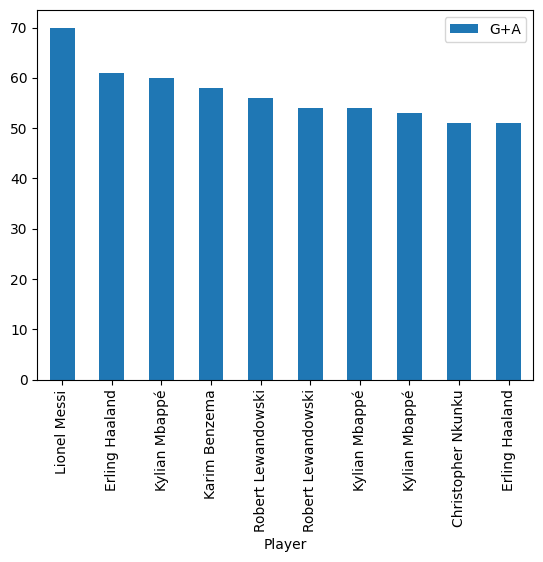

In [ ]:
highest_scoring=Stats[Stats['MP']>30].sort_values("G+A",ascending=False).head(10)
highest_scoring.plot.bar("Player","G+A")

<Axes: xlabel='Season'>

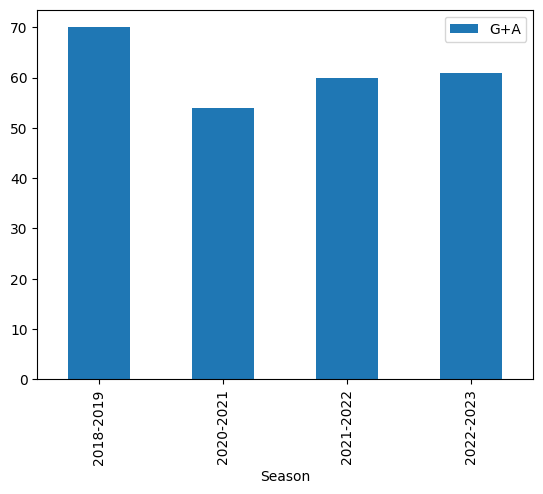

In [ ]:
highestperseason=Stats.groupby("Season").apply(lambda x: x.sort_values("G+A", ascending=False).head(1))
highestperseason.plot.bar("Season","G+A")

In [ ]:
numeric_columns = Stats.select_dtypes(include=['number']).columns

In [ ]:
numeric_columns

Index(['Age', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'G+A', 'G-PK',
       'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR', 'xG', 'npxG', 'xAG',
       'GA', 'SoTA', 'Saves', 'Save%', 'PK_Save%', 'CS', 'CS%', 'Sh', 'SoT',
       'SoT%', 'G/Sh', 'Dist', 'Cmp', 'Att', 'Cmp%', 'TotDist', 'PrgDist',
       'xA', 'Tkl', 'Challenges_Tkl', 'TklW', 'Tkl%', 'Int', 'Tkl+Int', 'Clr',
       'Err', 'Won', 'Lost', 'Won%', 'Points', 'Points%', 'Rk', 'Team_MP', 'W',
       'D', 'L', 'Team_GF', 'Team_GA', 'Team_GD', 'Team_Pts', 'W/L%', 'Year'],
      dtype='object')

<Axes: >

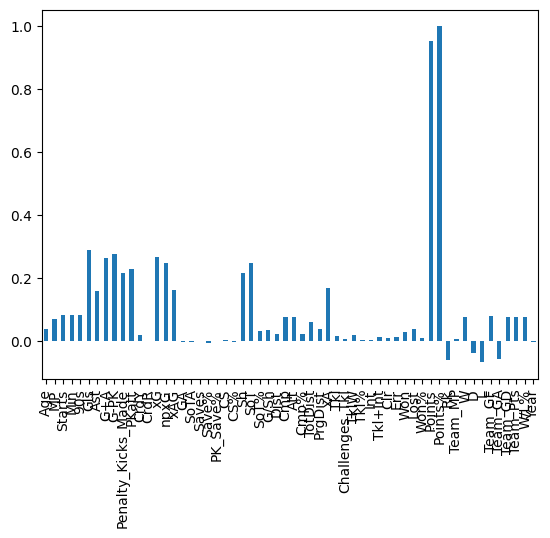

In [ ]:
Stats[numeric_columns].corr()["Points%"].plot.bar()

###A gépi tanulás során használt módszerek

####1. Lineáris modell

In [ ]:
Stats.columns

Index(['Player', 'Nation', 'Pos', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'GA', 'SoTA', 'Saves', 'Save%', 'PK_Save%', 'CS',
       'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp', 'Att', 'Cmp%',
       'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl', 'TklW', 'Tkl%',
       'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%', 'Season', 'Team',
       'Competition', 'Points', 'Points%', 'Rk', 'Team_MP', 'W', 'D', 'L',
       'Team_GF', 'Team_GA', 'Team_GD', 'Team_Pts', 'W/L%', 'Year'],
      dtype='object')

In [ ]:
predictors= ['Age', 'MP', 'Starts', 'Min', '90s', 'Gls',
       'Ast', 'G+A', 'G-PK', 'Penalty_Kicks_Made', 'PKatt', 'CrdY', 'CrdR',
       'xG', 'npxG', 'xAG', 'GA', 'SoTA', 'Saves', 'Save%', 'PK_Save%', 'CS',
       'CS%', 'Sh', 'SoT', 'SoT%', 'G/Sh', 'Dist', 'Cmp', 'Att', 'Cmp%',
       'TotDist', 'PrgDist', 'xA', 'Tkl', 'Challenges_Tkl', 'TklW', 'Tkl%',
       'Int', 'Tkl+Int', 'Clr', 'Err', 'Won', 'Lost', 'Won%','Rk', 'Team_MP', 'W', 'D', 'L',
       'Team_GF', 'Team_GA', 'Team_GD', 'Team_Pts', 'W/L%', 'Year']

In [ ]:
train=Stats[Stats["Year"]<2023]

In [ ]:
test=Stats[Stats["Year"]==2023]

In [ ]:
from sklearn.linear_model import Ridge

reg=Ridge(alpha=.1)

In [ ]:
reg.fit(train[predictors], train["Points%"])

Ridge(alpha=0.1)

In [ ]:
predictions = reg.predict(test[predictors])

In [ ]:
predictions=pd.DataFrame(predictions, columns=["predictions"], index=test.index)

In [ ]:
predictions

In [ ]:
combination = pd.concat([test[["Player","Points%"]], predictions], axis=1)

In [ ]:
combination

In [ ]:
combination.sort_values("Points%", ascending=False).head(10)

In [ ]:
from sklearn.metrics import mean_squared_error

mean_squared_error(combination["Points%"], combination["predictions"])

4.719654633765957e-05

In [ ]:
combination["Points%"].value_counts()

In [ ]:
combination = combination.sort_values("Points%", ascending=False)
combination["Rank"] = list(range(1,combination.shape[0]+1))

In [ ]:
combination.head(10)

,Player,Points%,predictions,Rank
360,Lionel Messi,0.313859,0.024897,1
71,Erling Haaland,0.242527,0.038716,2
361,Kylian Mbappé,0.183424,0.043675,3
74,Kevin De Bruyne,0.067935,0.001964,4
69,Rodri,0.038723,0.003541,5
5288,Vinicius Júnior,0.033288,0.010515,6
83,Julián Álvarez,0.019022,0.007062,7
11895,Victor Osimhen,0.016304,0.027500,8
75,Bernardo Silva,0.013587,0.001665,9
5298,Luka Modrić,0.012908,0.003752,10


In [ ]:
combination = combination.sort_values("predictions", ascending=False)
combination["Predicted_Rank"] = list(range(1,combination.shape[0]+1))

In [ ]:
combination.head()

,Player,Points%,predictions,Rank,Predicted_Rank
361,Kylian Mbappé,0.183424,0.043675,3,1
71,Erling Haaland,0.242527,0.038716,2,2
5886,Alexandre Lacazette,0.000000,0.028825,2322,3
11895,Victor Osimhen,0.016304,0.027500,8,4
5209,Robert Lewandowski,0.000000,0.027496,1648,5


In [ ]:
combination.sort_values("Points%",ascending=False).head(10)

,Player,Points%,predictions,Rank,Predicted_Rank
360,Lionel Messi,0.313859,0.024897,1,6
71,Erling Haaland,0.242527,0.038716,2,2
361,Kylian Mbappé,0.183424,0.043675,3,1
74,Kevin De Bruyne,0.067935,0.001964,4,423
69,Rodri,0.038723,0.003541,5,223
5288,Vinicius Júnior,0.033288,0.010515,6,34
83,Julián Álvarez,0.019022,0.007062,7,88
11895,Victor Osimhen,0.016304,0.027500,8,4
75,Bernardo Silva,0.013587,0.001665,9,496
5298,Luka Modrić,0.012908,0.003752,10,207


In [ ]:
def find_ap(combination):
  actual = combination.sort_values("Points%", ascending=False).head(5)
  predicted = combination.sort_values("predictions", ascending=False)
  ps=[] #precision score
  found=0
  seen=1
  for index, row in predicted.iterrows():
    if row["Player"] in actual["Player"].values:
      found +=1
      ps.append(found/seen)
    seen +=1
  return sum(ps)/len(ps)

In [ ]:
find_ap(combination)

0.5059515101400418

####2. Backtesting

In [ ]:
years = list(range(2019,2024))
#aps=average precision score
aps = []
all_predictions = []
for year in years[2:]:
  train = Stats[Stats["Year"]<year]
  test = Stats[Stats["Year"] == year]
  reg.fit(train[predictors], train["Points%"])
  predictions = reg.predict(test[predictors])
  predictions = pd.DataFrame(predictions, columns=["predictions"], index=test.index)
  combination = pd.concat([test[["Player","Points%"]],predictions],axis=1)
  all_predictions.append(combination)
  aps.append(find_ap(combination))

In [ ]:
sum(aps) / len(aps)

0.5619889111220728

In [ ]:
def add_ranks(combination):
    combination = combination.sort_values("Points%", ascending=False)
    combination["Rank"] = list(range(1,combination.shape[0]+1))
    combination = combination.sort_values("predictions", ascending=False)
    combination["Predicted_Rank"] = list(range(1,combination.shape[0]+1))
    combination["Difference"] = combination["Rank"] - combination["Predicted_Rank"]
    return combination

In [ ]:
ranking=add_ranks(all_predictions[1])
ranking[ranking["Rank"]<6].sort_values("Difference", ascending=False)

,Player,Points%,predictions,Rank,Predicted_Rank,Difference
1640,Robert Lewandowski,0.114247,0.038399,4,2,2
10355,Mohamed Salah,0.077957,0.026006,5,4,1
6350,Karim Benzema,0.368952,0.038974,1,1,0
10357,Sadio Mané,0.129704,0.010426,2,36,-34
6471,Kevin De Bruyne,0.117608,0.004813,3,153,-150


In [ ]:
#Ez egy hívható funkció amivel különböző predictorokat és modelleket tesztelhetünk.
def backtest(stats, model, year, predictors):
  aps = []
  all_predictions = []
  for year in years[2:]:
    train = Stats[Stats["Year"]<year]
    test = Stats[Stats["Year"] == year]
    model.fit(train[predictors], train["Points%"])
    predictions = reg.predict(test[predictors])
    predictions = pd.DataFrame(predictions, columns=["predictions"], index=test.index)
    combination = pd.concat([test[["Player","Points%","Year"]],predictions],axis=1)
    combination = add_ranks(combination)
    all_predictions.append(combination)
    aps.append(find_ap(combination))
  return sum(aps)/len(aps), aps, pd.concat(all_predictions)

In [ ]:
mean_ap, aps, all_predictions=backtest(Stats, reg, years[2:], predictors)

In [ ]:
mean_ap

0.5619889111220728

####A modell teljesítményének diagnózisa

In [ ]:
all_predictions[all_predictions["Rank"]<6].sort_values("Difference").head(10)

,Player,Points%,Year,predictions,Rank,Predicted_Rank,Difference
10990,N'Golo Kanté,0.068382,2021,-0.004629,5,3480,-3475
10988,Jorginho,0.169118,2021,0.000769,3,825,-822
74,Kevin De Bruyne,0.067935,2023,0.001964,4,423,-419
69,Rodri,0.038723,2023,0.003541,5,223,-218
6471,Kevin De Bruyne,0.117608,2022,0.004813,3,153,-150
10357,Sadio Mané,0.129704,2022,0.010426,2,36,-34
360,Lionel Messi,0.313859,2023,0.024897,1,6,-5
7930,Lionel Messi,0.225368,2021,0.048265,1,1,0
2977,Robert Lewandowski,0.213235,2021,0.027881,2,2,0
6350,Karim Benzema,0.368952,2022,0.038974,1,1,0


In [ ]:
#Ez megmutatja, hogy az algoritmus szerint mely oszlopok a legfontosabb a modell számára
pd.concat([pd.Series(reg.coef_), pd.Series(predictors)], axis=1).sort_values(0, ascending=False)

,0,1
13,4.318594e-03,xG
6,2.984255e-03,Ast
8,2.168639e-03,G-PK
5,1.793668e-03,Gls
4,1.467988e-03,90s
33,6.350919e-04,xA
21,3.768468e-04,CS
45,1.956169e-04,Rk
53,1.915730e-04,Team_Pts
41,1.354949e-04,Err


####Új predictorok

In [ ]:
#A középértkhez viszonyítja a játékosok átlagait
stat_ratios = Stats[["Gls","Ast","G+A"]].apply(lambda x: x/x.mean())
stat_ratios

,Gls,Ast,G+A
0,4.058337,9.137488,6.146855
1,1.739287,0.830681,1.365968
2,0.579762,0.830681,0.682984
3,4.058337,0.830681,2.731936
4,9.276199,10.798850,9.903267
...,...,...,...
14296,0.000000,0.000000,0.000000
14297,0.000000,0.000000,0.000000
14298,0.000000,0.000000,0.000000
14299,0.000000,0.000000,0.000000


In [ ]:
Stats[["Gls_M","Ast_M","G+A_M"]]=stat_ratios[["Gls","Ast","G+A"]]
Stats

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,L,Team_GF,Team_GA,Team_GD,Team_Pts,W/L%,Year,Gls_M,Ast_M,G+A_M
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,5,92,38,54,71,0.617647,2023,4.058337,9.137488,6.146855
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,5,92,38,54,71,0.617647,2023,1.739287,0.830681,1.365968
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,5,92,38,54,71,0.617647,2023,0.579762,0.830681,0.682984
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,5,92,38,54,71,0.617647,2023,4.058337,0.830681,2.731936
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,5,92,38,54,71,0.617647,2023,9.276199,10.798850,9.903267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14296,Carl Davordzie,gh GHA,FW,18.0,0,0,0.0,0.0,0.0,0.0,...,17,41,61,-20,41,0.263158,2019,0.000000,0.000000,0.000000
14297,Drissa Camara,ci CIV,MF,16.0,0,0,0.0,0.0,0.0,0.0,...,17,41,61,-20,41,0.263158,2019,0.000000,0.000000,0.000000
14298,Fabrizio Bagheria,it ITA,GK,17.0,0,0,0.0,0.0,0.0,0.0,...,17,41,61,-20,41,0.263158,2019,0.000000,0.000000,0.000000
14299,Andrea Di Maggio,it ITA,DF,17.0,0,0,0.0,0.0,0.0,0.0,...,17,41,61,-20,41,0.263158,2019,0.000000,0.000000,0.000000


In [ ]:
predictors += ["Gls_M","Ast_M","G+A_M"]

In [ ]:
mean_ap, aps, all_predictions=backtest(Stats, reg, years[2:], predictors)

In [ ]:
mean_ap

0.5619889111220728

In [ ]:
Stats["NPos"] = Stats["Pos"].astype("category").cat.codes

In [ ]:
Stats.head()

,Player,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,...,Team_GF,Team_GA,Team_GD,Team_Pts,W/L%,Year,Gls_M,Ast_M,G+A_M,NPos
0,Joshua Kimmich,de GER,MF,27.0,47,46,4046.0,45.0,7.0,11.0,...,92,38,54,71,0.617647,2023,4.058337,9.137488,6.146855,9
1,Matthijs de Ligt,nl NED,DF,22.0,43,38,3390.0,37.7,3.0,1.0,...,92,38,54,71,0.617647,2023,1.739287,0.830681,1.365968,0
2,Dayot Upamecano,fr FRA,DF,23.0,43,40,3381.0,37.6,1.0,1.0,...,92,38,54,71,0.617647,2023,0.579762,0.830681,0.682984,0
3,Benjamin Pavard,fr FRA,DF,26.0,43,38,3370.0,37.4,7.0,1.0,...,92,38,54,71,0.617647,2023,4.058337,0.830681,2.731936,0
4,Jamal Musiala,de GER,"MF,FW",19.0,47,36,3009.0,33.4,16.0,13.0,...,92,38,54,71,0.617647,2023,9.276199,10.798850,9.903267,11


In [ ]:
Stats["NTeam"] = Stats["Team"].astype("category").cat.codes

In [ ]:
Stats["NTeam"].value_counts()

NTeam
121    166
108    163
104    163
62     162
72     159
      ... 
53      32
59      32
28      31
93      28
38      28
Name: count, Length: 133, dtype: int64

####Random Forest
Ezek a fajta kategóriák nincsenek rendszerezve, tehát a számok amelyeket látunk a "Stats["NTeam"].value_counts()" parancs futtatásakor, nem tudni, hogy melyik kód melyik csapathoz tartozik, semmit mondóak ezek a számok a programnak. Ezért más megközlítést kell alkalmazni, a Random Forestet.

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf=RandomForestRegressor(n_estimators=300, random_state=1, min_samples_split=5)

mean_ap, aps, all_predictions=backtest(Stats, reg, years[2:], predictors)

In [ ]:
mean_ap

0.5619889111220728

In [ ]:
mean_ap, aps, all_predictions=backtest(Stats, reg, years[2:], predictors)

In [ ]:
mean_ap

0.5619889111220728